# Golden Beetle Species Classifier Neural Network
## Authors: Vinicio Soto y Marcela Hernández
### CICIMA UCR

- Trains and tests a neural network for species classification.
- Works with L1050 data and fiber optics data (Avantes Avalight)
- Calculates the probability of a specimen being of a certain species.

## Imports

In [1]:
import sys
import os
from pathlib import Path
import seaborn as sns
from sklearn.model_selection import train_test_split
# Get the current directory
current_directory = os.getcwd()
base_directory = Path(current_directory).parent
libraries_directory = base_directory/"libraries"
directories_in_path = [current_directory, base_directory, libraries_directory]

# Convert paths to strings and normalize for Windows
directories_in_path = [
    current_directory,
    str(base_directory),
    str(libraries_directory)
]

# Add directories to sys.path if not already present
for path in directories_in_path:
    path = os.path.normpath(path)  # Normalize path for Windows
    if path not in sys.path:
        sys.path.append(path)
        print(f"Added {path} to sys.path")


from spectraltools import Specimen_Collection, Spectrum, create_path_if_not_exists
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import math
import re
import scipy
import socket #gets the machine name
import tensorflow as tf
from metrics import Metric, feature_and_label_extractor, Metric_Testbench
from metrics import (Gamma_First_Two_Peaks,
                    Gamma_First_Two_Peaks_Golden,
                    Gamma_Arbitrary_Limits_Golden, 
                    Gamma_Area_Under_Curve_Naive_Golden, 
                    Gamma_Area_Under_Curve_First_Min_Cut, 
                    Gamma_Vector_Relative_Reflectance,
                    Critical_Points_Golden, 
                    Wavelength_Vector, 
                    Gamma_Gaussian_Fit, 
                    Gamma_First_Two_Peaks_Simple)
from feature_engineering import get_aggregated_data
import seaborn as sns
from visualizations import scatter_plot_2_variables, scatter_plot_3_variables
import warnings


Added C:\Users\esteb\escarabajos\gamma factor calculation and neural network training to sys.path
Added C:\Users\esteb\escarabajos to sys.path
Added C:\Users\esteb\escarabajos\libraries to sys.path


# Collection main paths

In [2]:
"""This section allows the user to choose their workplace location.
This is important if the user has multiple locations and operating systems in which this
script is run"""

# Training data is used when we are already certain of species and genera for a particular sample
training_data_is_used = True
debug = True

# Base folder 
base_folder = Path(base_directory)  # Same folder

# Define the location of the tables with information about the collections and its parent directory
collection_tables_main_path = base_folder / "collections"
l1050_collection_files_main_path = base_folder / "L1050_data"
fiber_optics_collection_files_main_path = base_folder / "avalight_spectrometer_data"

#Configuration file location

#configuration for collections
config_file_main_path = base_folder / "libraries" / "spectraltools"/ "spectral_config"

config_file_cicimaucr_l050_golden = config_file_main_path / "CICIMAUCR_L1050_GOLDEN.ini"
config_file_cicimaucr_l050_silver = config_file_main_path / "CICIMAUCR_L1050_SILVER.ini"
config_file_inbucr_avalight_silver = config_file_main_path / "INBUCR_AVALIGHT_SILVER.ini"
config_file_inbucr_l1050_golden = config_file_main_path / "INBUCR_L1050_GOLDEN.ini"
config_file_cicimaucr_avalight_silver = config_file_main_path / "CICIMAUCR_AVALIGHT_SILVER.ini"

#configuration for metrics
metric_configuration_file = base_folder / "libraries" / "metrics" / "spectral_config" / "metrics.ini"

# Define report location
report_location = base_folder / "reports" / "data_analysis"

# Define image counter generator
def yield_image_counter():
    for val in range(1, 100):
        yield val
image_counter = yield_image_counter()


### check existence of directories

In [3]:
from pathlib import Path

def check_paths_exist():
    # Define all paths in a dictionary for clarity
    paths = {
        "collection_tables_main_path": collection_tables_main_path,
        "l1050_collection_files_main_path": l1050_collection_files_main_path,
        "fiber_optics_collection_files_main_path": fiber_optics_collection_files_main_path,
        "config_file_main_path": config_file_main_path,
        "config_file_cicimaucr_l050_golden": config_file_cicimaucr_l050_golden,
        "config_file_cicimaucr_l050_silver": config_file_cicimaucr_l050_silver,
        "config_file_inbucr_avalight_silver": config_file_inbucr_avalight_silver,
        "config_file_inbucr_l1050_golden": config_file_inbucr_l1050_golden,
        "config_file_cicimaucr_avalight_silver": config_file_cicimaucr_avalight_silver,
        "metric_configuration_file": metric_configuration_file,
        "report_location": report_location,
    }

    print("\n=== Checking required paths ===")
    for name, path in paths.items():
        if path.is_dir():
            if path.exists():
                print(f"[OK] Directory exists: {name} -> {path}")
            else:
                print(f"[MISSING] Directory: {name} -> {path}")
        elif path.is_file():
            if path.exists():
                print(f"[OK] File exists: {name} -> {path}")
            else:
                print(f"[MISSING] File: {name} -> {path}")
        else:
            # If extension suggests file but doesn't exist yet, handle
            if path.suffix:
                print(f"[MISSING] Expected file: {name} -> {path}")
            else:
                print(f"[MISSING] Expected directory: {name} -> {path}")

# Run check
check_paths_exist()



=== Checking required paths ===
[OK] Directory exists: collection_tables_main_path -> C:\Users\esteb\escarabajos\collections
[OK] Directory exists: l1050_collection_files_main_path -> C:\Users\esteb\escarabajos\L1050_data
[OK] Directory exists: fiber_optics_collection_files_main_path -> C:\Users\esteb\escarabajos\avalight_spectrometer_data
[OK] Directory exists: config_file_main_path -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config
[OK] File exists: config_file_cicimaucr_l050_golden -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\CICIMAUCR_L1050_GOLDEN.ini
[OK] File exists: config_file_cicimaucr_l050_silver -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\CICIMAUCR_L1050_SILVER.ini
[OK] File exists: config_file_inbucr_avalight_silver -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\INBUCR_AVALIGHT_SILVER.ini
[OK] File exists: config_file_inbucr_l1050_golden -> C:\Users\esteb\escarabajos\libraries\spec

## Spectrometer data main paths: L1050 data

In [4]:

# File location and metadata location for collection 1
l1050_angsol_collection_path = l1050_collection_files_main_path / "ANGSOL" / "average"
angsol_collection_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - ANGSOL.txt"

# File location and metadata location for collection 2
l1050_cicimaucr_collection_path = l1050_collection_files_main_path / "TRA_data_CICIMA_INBUCR" / "CICIMAUCR" / "reflectance"
l1050_cicimaucr_collection_2_path = l1050_collection_files_main_path / "CICIMA-2024-01-REFLECTANCE" / "average"
l1050_cicimaucr_collection_3_path = l1050_collection_files_main_path / "CICIMA-2024-03-REFLECTANCE" / "without iris nor lens" / "average"
l1050_cicimaucr_collection_4_path = l1050_collection_files_main_path / "CICIMA-2024-05-REFLECTANCE" / "DORSAL" / "average" #elitros



cicima_ucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - CICIMAUCR.txt"

# File location and metadata location for collection 3
l1050_inbucr_collection_path = l1050_collection_files_main_path / "INBUCR" / "average"
inbucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - INBUCR.txt"

# File location and metadata location for collection 4
l1050_bioucr_collection_path = l1050_collection_files_main_path / "BIOUCR" / "average"
bioucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - BIOUCR.txt"

# Aggregated data location, where averages and std will be saved when training data and retrieved when classifying spectra
agregated_data_location = base_folder / "aggregated_data"

## Spectrometer data main paths: Fiber optics data

In [5]:
fiber_optics_cicimaucr_collection_5_path = fiber_optics_collection_files_main_path / "ELITROS"/"CICIMAUCR" #Elitros
fiber_optics_inbucr_collection_2_path = fiber_optics_collection_files_main_path / "ELITROS"/ "INBUCR"       #Elitros
fiber_optics_cicimaucr_collection_6_path = fiber_optics_collection_files_main_path / "COMPLETOS" /"20250829" / "CICIMAUCR" #escarabajos completos

## Select collections for training and testing

In [6]:
#Set Specimen Collection objects

# Function to verify and print path
def verify_and_print_path(name, path):
    print(f"Input {name}: {path}")
    if not path.exists():
        print(f"Warning: Path does not exist: {path}")

# Create collections with debug output
print("Creating Specimen_Collection instances:")
verify_and_print_path("l1050_angsol_collection_path", l1050_angsol_collection_path)
verify_and_print_path("angsol_collection_metadata", angsol_collection_metadata)
angsol_collection = Specimen_Collection(
    name="ANGSOL",
    data_folder_path=l1050_angsol_collection_path,
    metadata_path=angsol_collection_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)
angsol_collection.set_description(
    "ANGSOL collection has specimens that belong to Angel Solís. The confidence that we have about specimen identification is high."
)

verify_and_print_path("l1050_cicimaucr_collection_path", l1050_cicimaucr_collection_path)
verify_and_print_path("cicima_ucr_metadata", cicima_ucr_metadata)
l1050_cicimaucr_collection = Specimen_Collection(
    name="CICIMAUCR1",
    data_folder_path=l1050_cicimaucr_collection_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)

verify_and_print_path("l1050_cicimaucr_collection_2_path", l1050_cicimaucr_collection_2_path)
l1050_cicimaucr_collection_2 = Specimen_Collection(
    name="CICIMAUCR2",
    data_folder_path=l1050_cicimaucr_collection_2_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)

verify_and_print_path("l1050_cicimaucr_collection_3_path", l1050_cicimaucr_collection_3_path)
l1050_cicimaucr_collection_3 = Specimen_Collection(
    name="CICIMAUCR3",
    data_folder_path=l1050_cicimaucr_collection_3_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)
#THIS
verify_and_print_path("fiber_optics_cicimaucr_collection_5_path", fiber_optics_cicimaucr_collection_5_path)
fiber_optics_cicimaucr_collection_5 = Specimen_Collection(
    name="CICIMAUCR5",
    data_folder_path=fiber_optics_cicimaucr_collection_5_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_avalight_silver,
)
#THIS
verify_and_print_path("fiber_optics_cicimaucr_collection_6_path", fiber_optics_cicimaucr_collection_6_path)
fiber_optics_cicimaucr_collection_6 = Specimen_Collection(
    name="CICIMAUCR6",
    data_folder_path=fiber_optics_cicimaucr_collection_6_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_avalight_silver,
)
#THIS
verify_and_print_path("fiber_optics_inbucr_collection_2_path", fiber_optics_inbucr_collection_2_path)
fiber_optics_inbucr_collection_2 = Specimen_Collection(
    name="INBUCR2",
    data_folder_path=fiber_optics_inbucr_collection_2_path,
    metadata_path=inbucr_metadata,
    quality="HIGH",
    config_file = config_file_inbucr_avalight_silver,
)

verify_and_print_path("l1050_inbucr_collection_path", l1050_inbucr_collection_path)
verify_and_print_path("inbucr_metadata", inbucr_metadata)
l1050_inbucr_collection = Specimen_Collection(
    name="INBUCR",
    data_folder_path=l1050_inbucr_collection_path,
    metadata_path=inbucr_metadata,
    quality="MID",
    config_file = config_file_inbucr_l1050_golden,
)

verify_and_print_path("l1050_bioucr_collection_path", l1050_bioucr_collection_path)
verify_and_print_path("bioucr_metadata", bioucr_metadata)
l1050_bioucr_collection = Specimen_Collection(
    name="BIOUCR",
    data_folder_path=l1050_bioucr_collection_path,
    metadata_path=bioucr_metadata,
    quality="LOW",
    config_file = config_file_inbucr_l1050_golden, #todo create config file
)

training_collection_list = [
                    #angsol_collection,
                    l1050_cicimaucr_collection,
                    l1050_cicimaucr_collection_2,
                    l1050_cicimaucr_collection_3,
                    #fiber_optics_cicimaucr_collection_5,#ELITROS MIXTOS
                    #fiber_optics_inbucr_collection_2,#ELITROS MIXTOS
                    #fiber_optics_cicimaucr_collection_6,# COMPLETOS PLATEADOS
                    l1050_inbucr_collection,
                    #l1050_bioucr_collection,
                    ]
collection_names_set = set([collection.name for collection in training_collection_list])
collection_names = " ".join( sorted(collection_names_set))

prediction_collection_list = [
                    angsol_collection,
                    #l1050_cicimaucr_collection,
                    #l1050_cicimaucr_collection_2,
                    #l1050_cicimaucr_collection_3,
                    #fiber_optics_cicimaucr_collection_5, #ELITROS MIXTOS
                    #fiber_optics_inbucr_collection_2,    #ELITROS MIXTOS
                    #fiber_optics_cicimaucr_collection_6,  #COMPLETOS PLATEADOS
                    l1050_inbucr_collection,
                    l1050_bioucr_collection,
                    ]
prediction_collection_names_set = set([collection.name for collection in training_collection_list])
prediction_collection_names = " ".join( sorted(collection_names_set))


Creating Specimen_Collection instances:
Input l1050_angsol_collection_path: C:\Users\esteb\escarabajos\L1050_data\ANGSOL\average
Input angsol_collection_metadata: C:\Users\esteb\escarabajos\collections\CICIMA-beetles-general-inventory - ANGSOL.txt
Input l1050_cicimaucr_collection_path: C:\Users\esteb\escarabajos\L1050_data\TRA_data_CICIMA_INBUCR\CICIMAUCR\reflectance
Input cicima_ucr_metadata: C:\Users\esteb\escarabajos\collections\CICIMA-beetles-general-inventory - CICIMAUCR.txt
Input l1050_cicimaucr_collection_2_path: C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-01-REFLECTANCE\average
Input l1050_cicimaucr_collection_3_path: C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-03-REFLECTANCE\without iris nor lens\average
Input fiber_optics_cicimaucr_collection_5_path: C:\Users\esteb\escarabajos\avalight_spectrometer_data\ELITROS\CICIMAUCR
Input fiber_optics_cicimaucr_collection_6_path: C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR
Input fiber_op

## Set Spectrum class parameters
# These parameters help calculate maxima and minima, set the range of valid wavelengths, distance between valid peaks.

## Filter spectra
#### Filters to only the target species


In [7]:
#helpers

def get_filtered_spectra(collection_list, debug):

    all_spectra = []
    
    for collection in collection_list:
        if debug:
            print("collection:", collection)
        all_spectra += collection.get_spectra()
        if debug:
            print("all_spectra", len(all_spectra))
            print("species", set([item.get_species() for item in all_spectra]))
            for spectrum in all_spectra:
                print(f"{spectrum.get_code()} {spectrum.get_genus()} {spectrum.get_species()}")
    filtered_spectra_by_species = [item for item in all_spectra if item.get_species() in target_species]
    return filtered_spectra_by_species

### Training Data and Test Data

In [8]:
debug = False
target_species = ["kalinini", "resplendens", "cupreomarginata"]

get_test_spectra_from_training_data = True



if get_test_spectra_from_training_data:
    # Get all spectra
    complete_spectra = get_filtered_spectra(training_collection_list, debug=debug)
    print(f"Total spectra: {len(complete_spectra)}")

    # Split 80% train, 20% test
    train_spectra, test_spectra = train_test_split(
        complete_spectra,
        test_size=0.2,        # 20% test
        random_state=42,      # for reproducibility
        shuffle=True          # shuffle before splitting
    )

    print(f"Train spectra: {len(train_spectra)}")
    print(f"Test spectra: {len(test_spectra)}")
    
#train_spectra = get_filtered_spectra(training_collection_list, debug= debug)
#test_spectra  = get_filtered_spectra(prediction_collection_list, debug= debug) 

print("# of collections used in training: ", len(training_collection_list), "# of collections used in prediction: ", len(prediction_collection_list) )
print("# of spectra used in training: ", len(train_spectra), "# of spectra used in prediction: ", len(test_spectra) )
#date

from datetime import datetime
current_date = datetime.now().date()

    


print("Number of valid spectra: ", len(train_spectra))
if debug:
    for spectrum in train_spectra:
        print(spectrum.get_species())

Utils: No genus data for BIOUCRA1 in collection CICIMAUCR3
No species data for BIOUCRA1 in collection CICIMAUCR3
Utils: No genus data for Sample2198 in collection CICIMAUCR3
No species data for Sample2198 in collection CICIMAUCR3


C:\Users\esteb\escarabajos\libraries\spectraltools\utils.py:729: UserWarning: Failed to parse slit PMT aperture from input: 3350/2 860,8/2. Missing slit_pmt.
  warnings.warn(f"Failed to parse slit PMT aperture from input: {str}. Missing slit_pmt.", UserWarning)
C:\Users\esteb\escarabajos\libraries\spectraltools\utils.py:729: UserWarning: Failed to parse slit PMT aperture from input: 3350/2 860,8/2. Missing slit_pmt.
  warnings.warn(f"Failed to parse slit PMT aperture from input: {str}. Missing slit_pmt.", UserWarning)
C:\Users\esteb\escarabajos\libraries\spectraltools\utils.py:729: UserWarning: Failed to parse slit PMT aperture from input: 3350/2 860,8/2. Missing slit_pmt.
  warnings.warn(f"Failed to parse slit PMT aperture from input: {str}. Missing slit_pmt.", UserWarning)


Total spectra: 33
Train spectra: 26
Test spectra: 7
# of collections used in training:  4 # of collections used in prediction:  3
# of spectra used in training:  26 # of spectra used in prediction:  7
Number of valid spectra:  26


## Feature extraction
### This section will create, for each metric, a list with three sublists:
- code (Useful to retrieve additional information in the future, according to research needs)
- metric values (Values for that particular metric)
- species (labels used in training the neural network for species classification)
information will be used in feature engineering, metric and statistics

#### Gamma_Arbitrary_Limits_Golden

In [9]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_Arbitrary_Limits_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

print(gamma_first_two_peaks_data)

[['CICIMAUCR0098', 'CICIMAUCR0014', 'CICIMAUCR0104', 'CICIMAUCR0002', 'CICIMAUCR0020', 'CICIMAUCR0003', 'CICIMAUCR0015', 'CICIMAUCR0013', 'CICIMAUCR0104', 'CICIMAUCR0105', 'CICIMAUCR0158', 'CICIMAUCR0141', 'CICIMAUCR0001', 'CICIMAUCR0113', 'CICIMAUCR0101', 'CICIMAUCR0158', 'CICIMAUCR0100', 'CICIMAUCR0070', 'CICIMAUCR0108', 'CICIMAUCR0004', 'CICIMAUCR0097', 'INBUCR0433', 'CICIMAUCR0006', 'CICIMAUCR0012', 'CICIMAUCR0018', 'CICIMAUCR0116'], [np.float64(1.0002053705943028), np.float64(0.8293106327291977), np.float64(0.9729544764033059), np.float64(0.7845157424174367), np.float64(0.9722006430255345), np.float64(0.8168191718494205), np.float64(0.9684897767232791), np.float64(1.0028881849056657), np.float64(1.0357821513284946), np.float64(0.77607245411054), np.float64(1.1689323914094556), np.float64(0.7942848116015061), np.float64(0.7539752054328567), np.float64(0.7741210959371344), np.float64(1.0983461340712506), np.float64(0.8962078359795438), np.float64(0.9146837219545669), np.float64(0.71

#### Gamma First Two Peaks

Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Spectrum parameters None
max_i, max_x, max_y [117 394] [568. 845.] [65.2613 65.2479]
Getting equipment. Spectrum


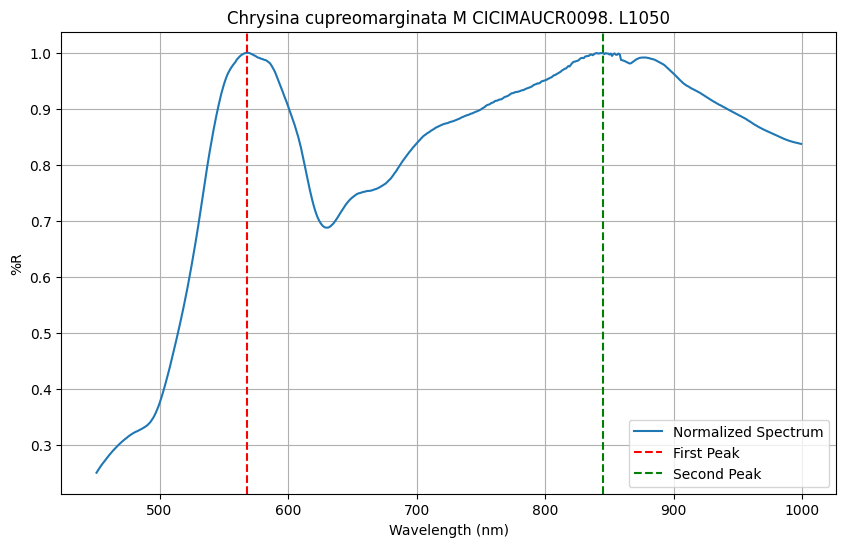

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

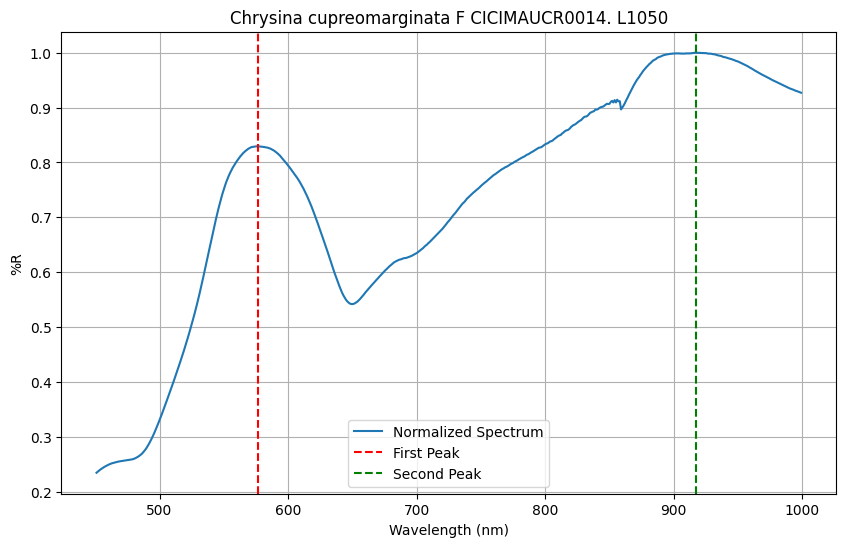

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

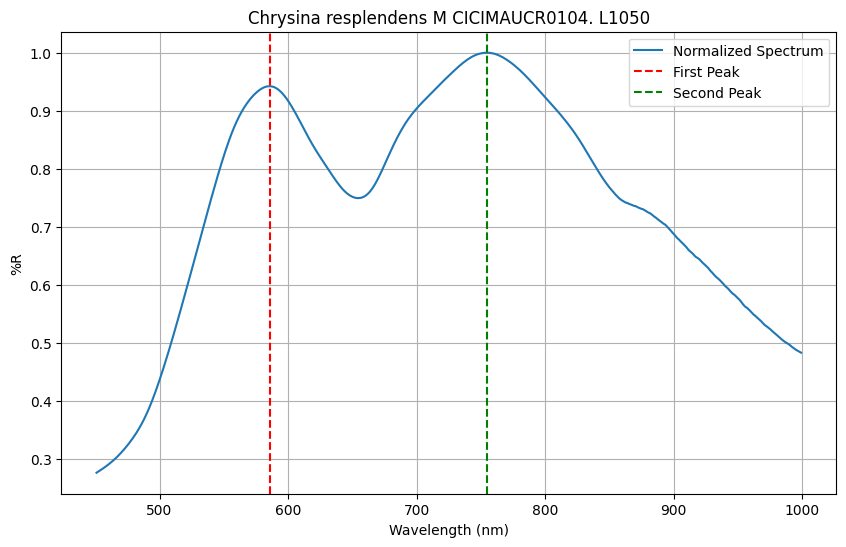

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

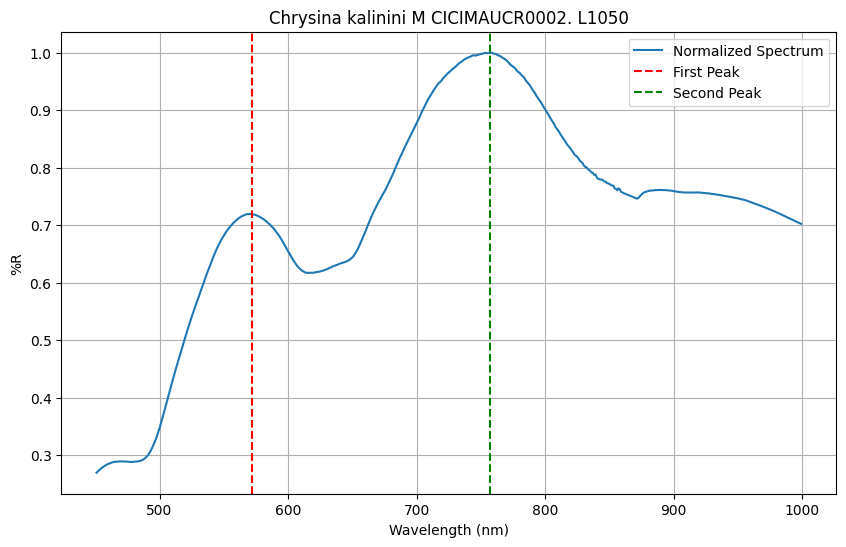

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

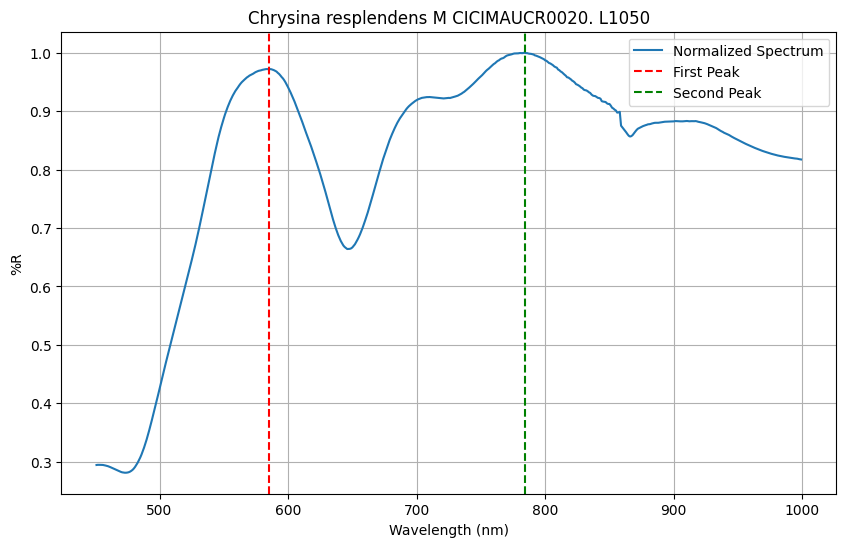

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

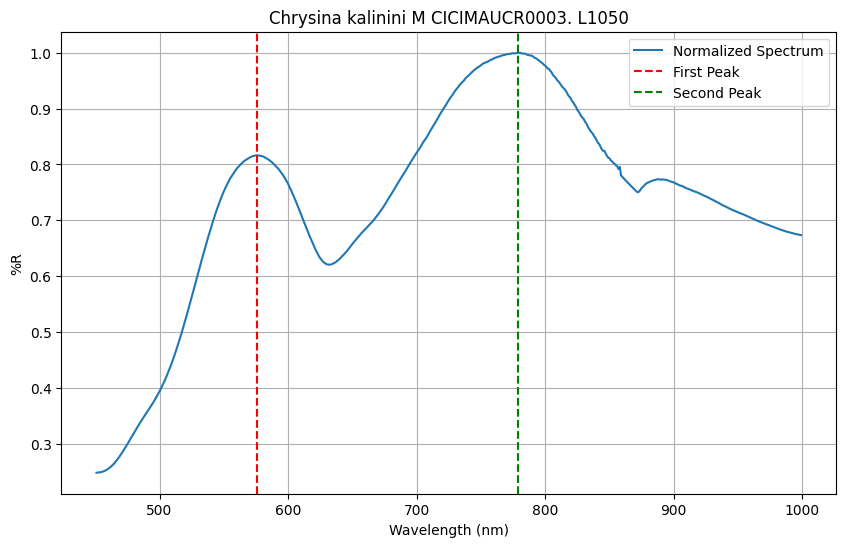

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

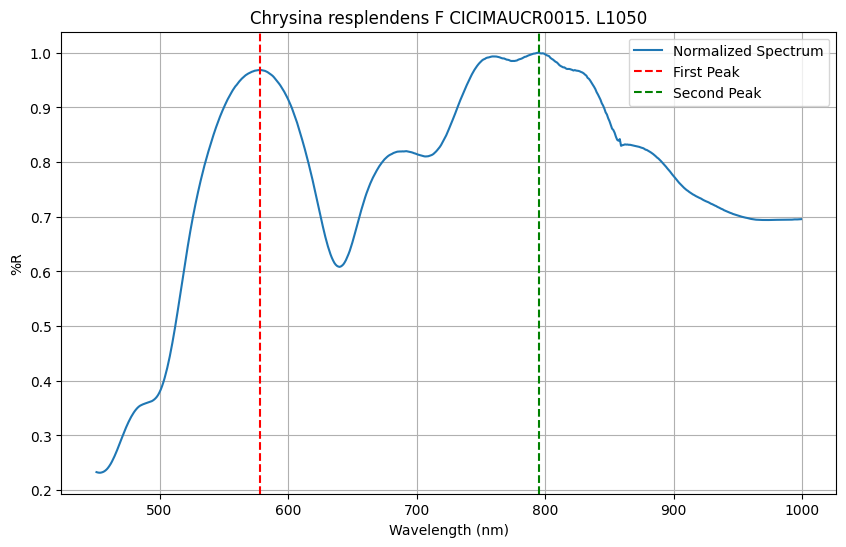

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

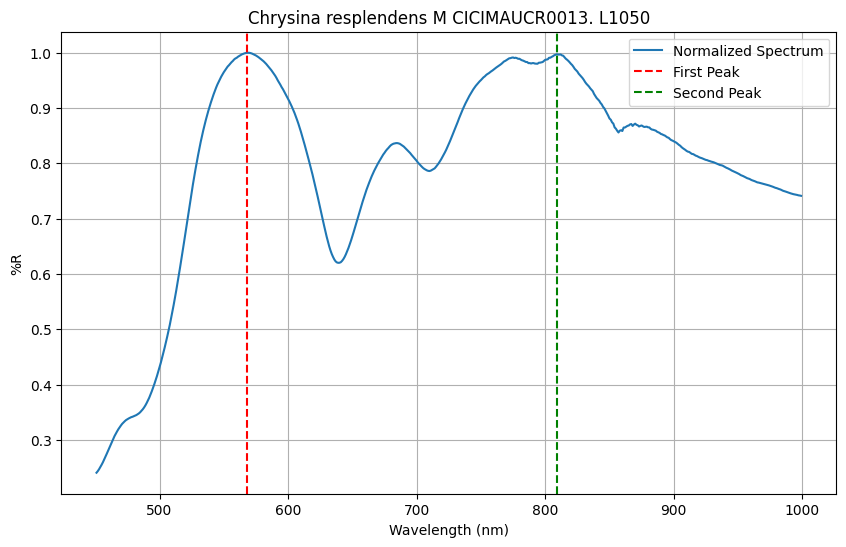

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

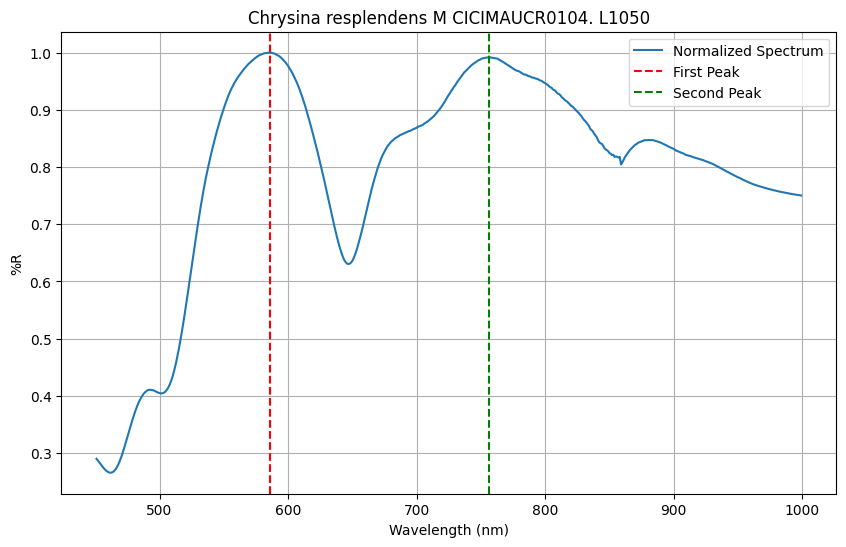

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

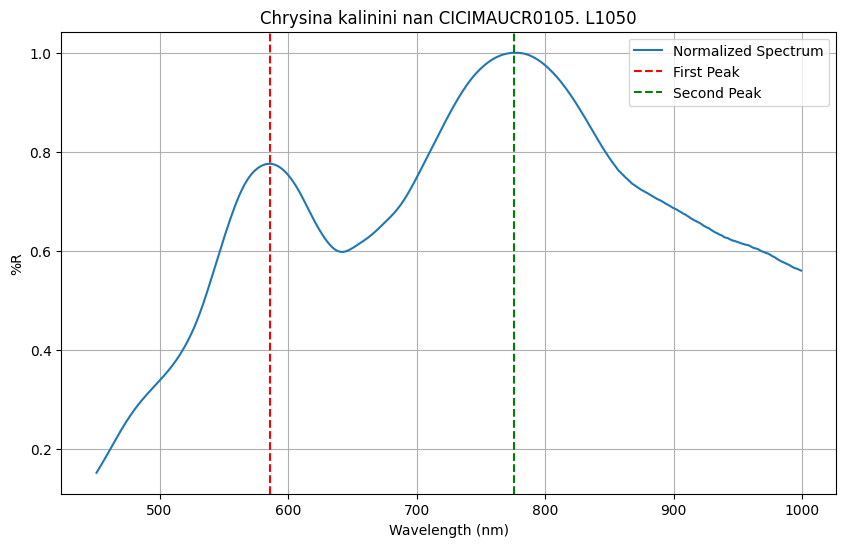

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

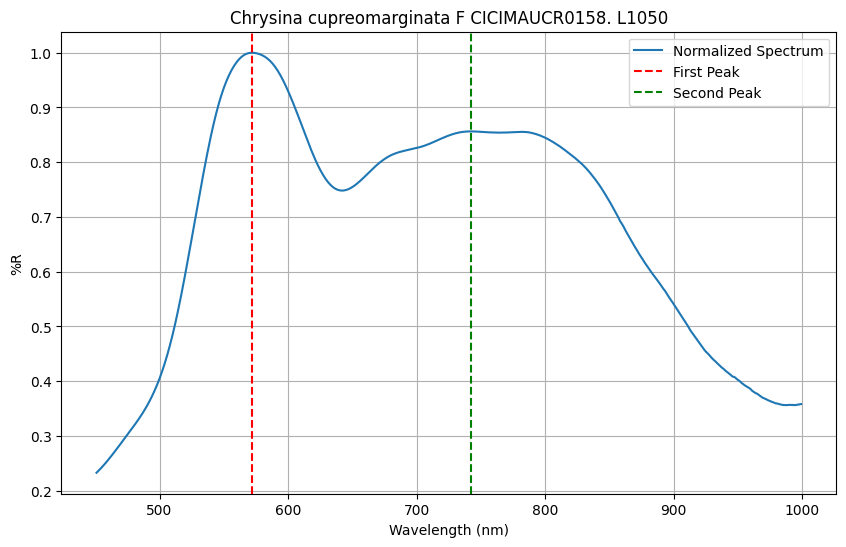

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

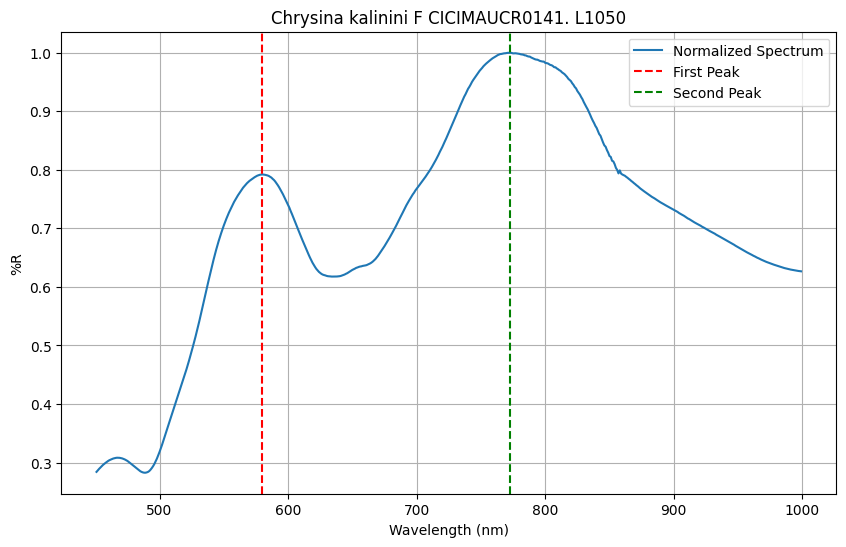

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

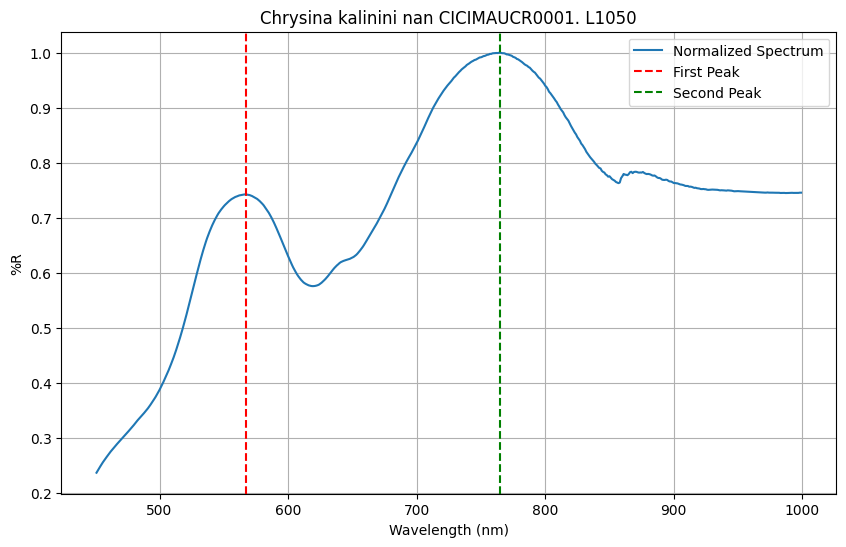

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

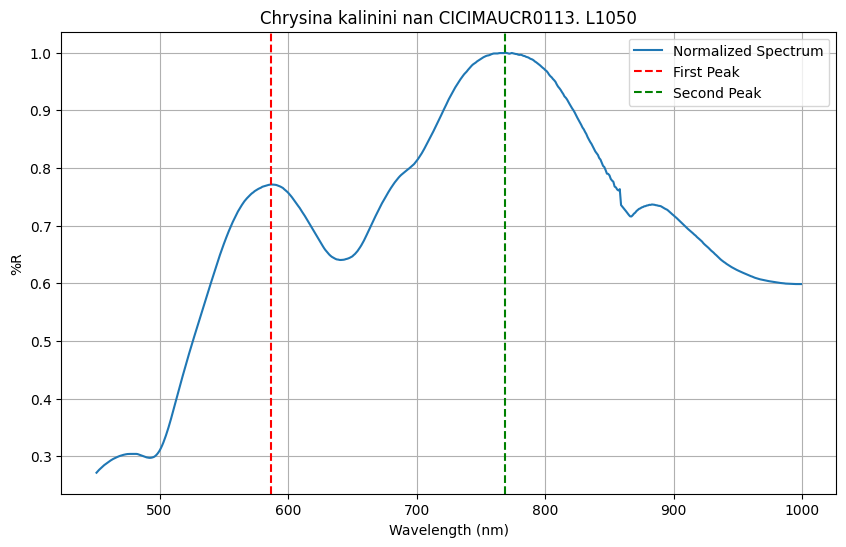

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

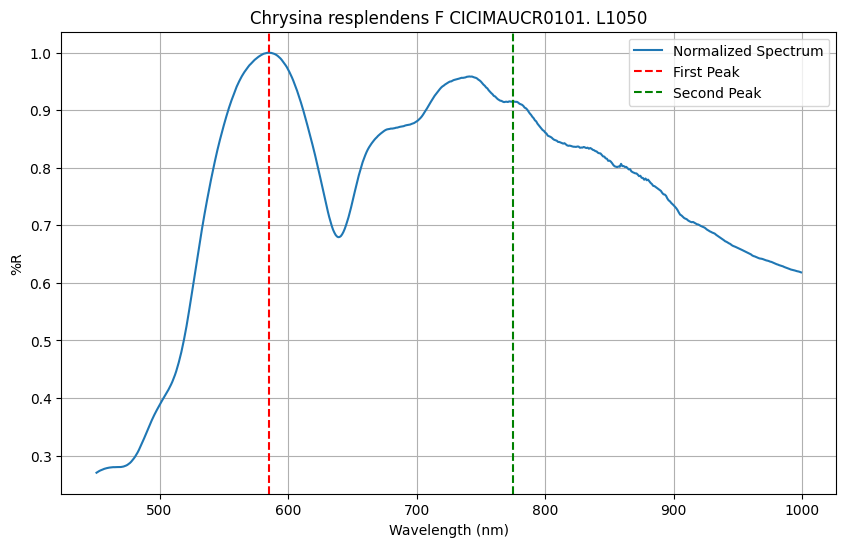

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

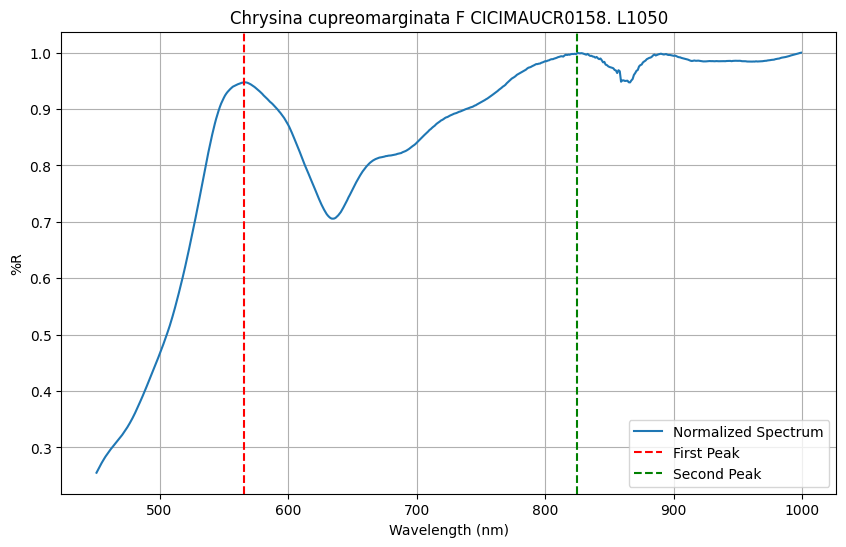

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

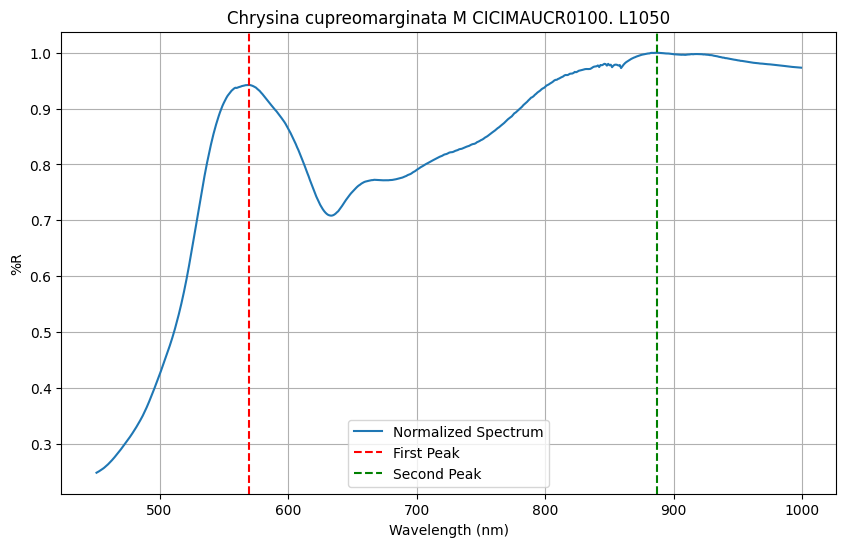

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

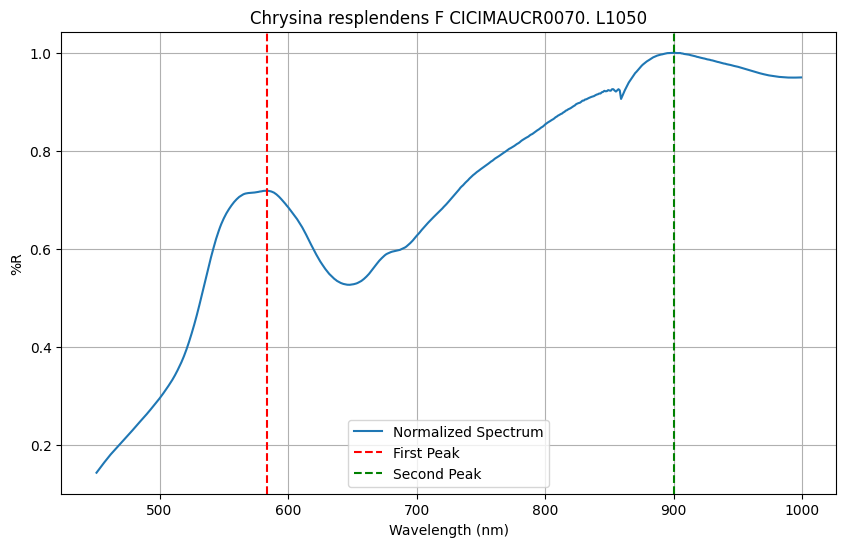

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

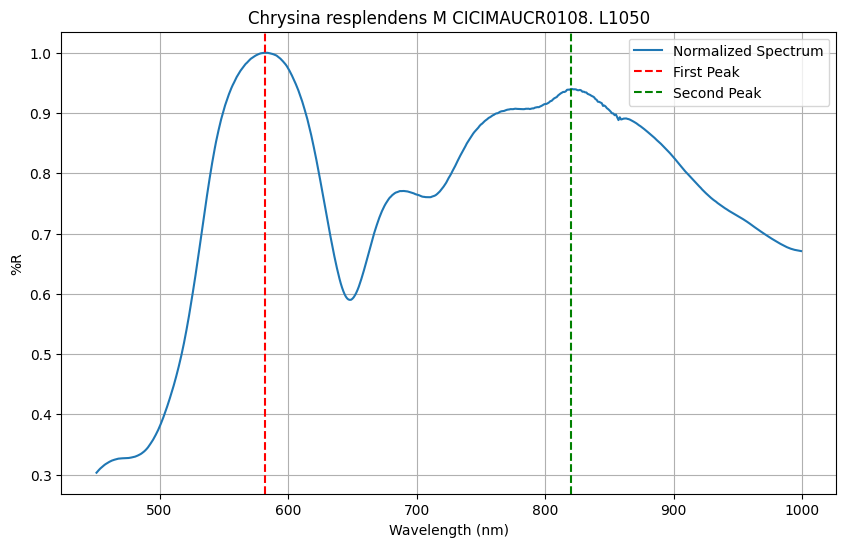

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

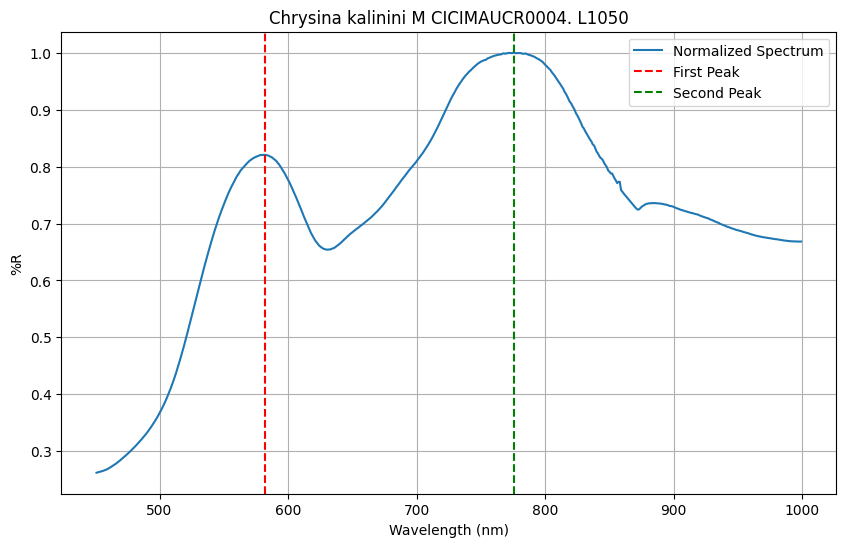

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

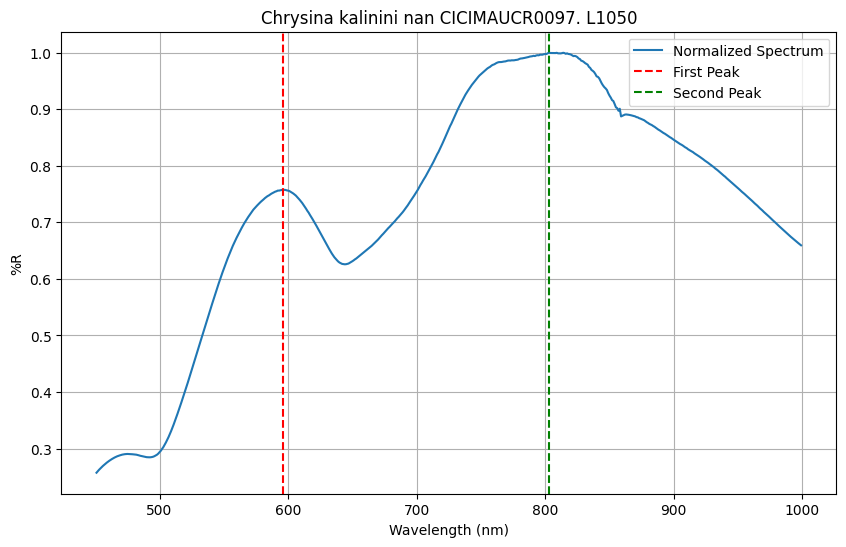

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

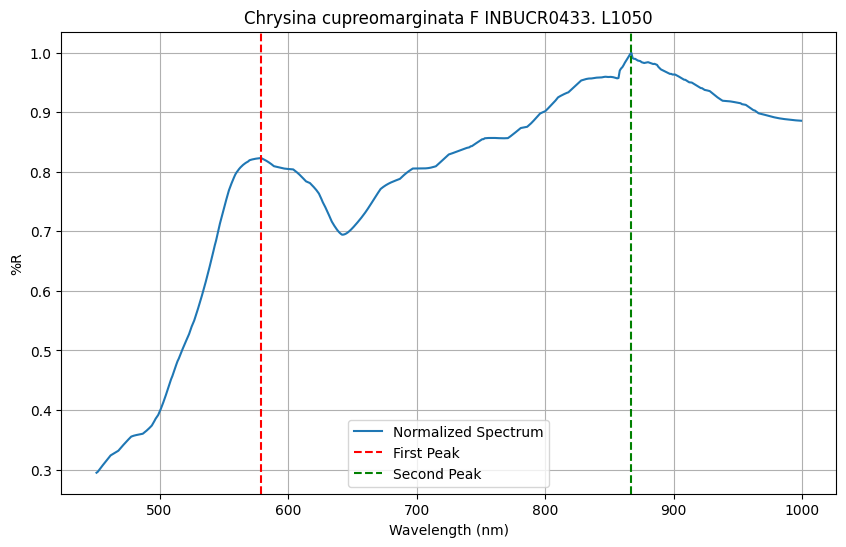

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

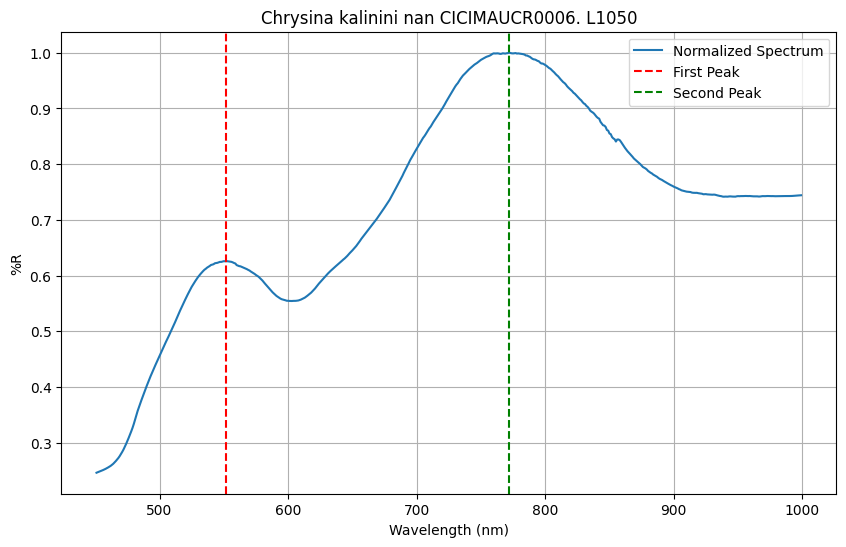

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

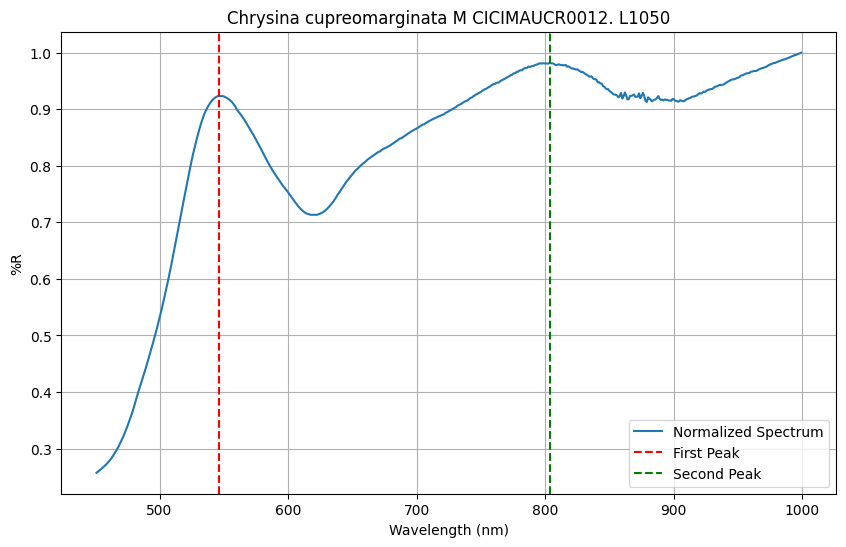

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

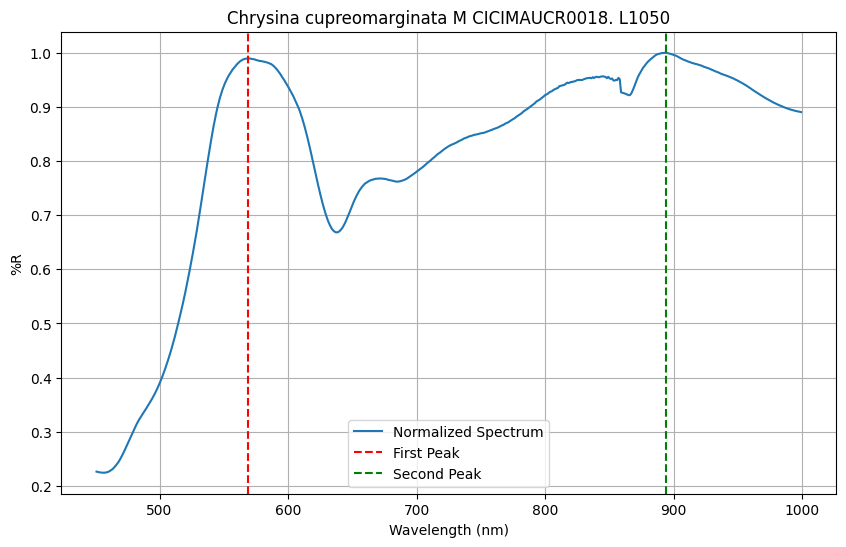

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

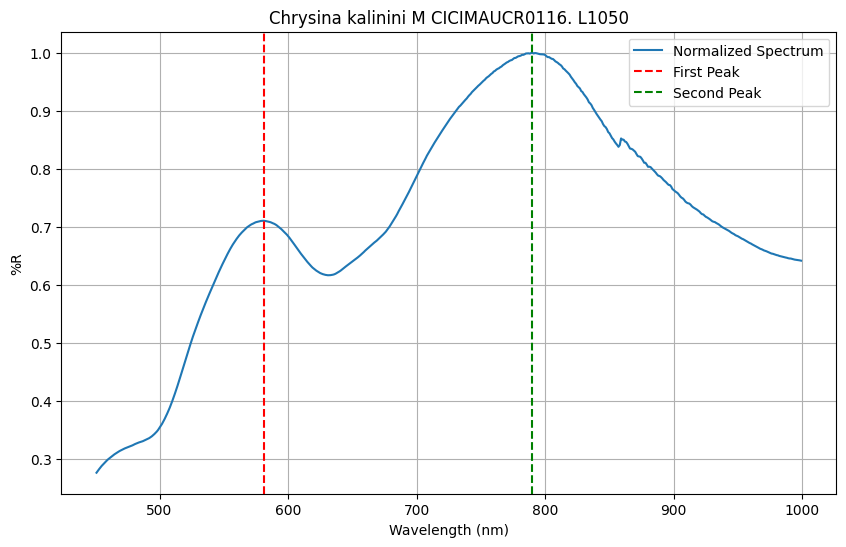

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
[['CICIMAUCR0098', 'CICIMAUCR0014', 'CICIMAUCR0104', 'CICIMAUCR0002', 'CICIMAUCR0020', 'CICIMAUCR0003', 'CICIMAUCR0015', 'CICIMAUCR0013', 'CICIMAUCR0104', 'CICIMAUCR0105', 'CICIMAUCR0158', 'CICIMAUCR0141', 'CICIMAUCR0001', 'CICIMAUCR0113', 'CICIMAUCR0101', 'CICIMAUCR0158', 'CICIMAUCR0100', 'CICIMAUCR0070', 'CICIMAUCR0108', 'CICIMAUCR0004', 'CICIMAUCR0097', 'INBUCR0433', 'CICIMAUCR0006', 'CICIMAUCR0012', 'CICIMAUCR0018', 'CICIMAUCR0116'], [np.float64(0.9997946715741182), np.float64(1.2058207872110318), np.float64(1.061

In [10]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_First_Two_Peaks, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

print(gamma_first_two_peaks_data)

#### Gamma First Two Peaks Golden

Gamma_First_Two_Peaks_Golden Getting metric value


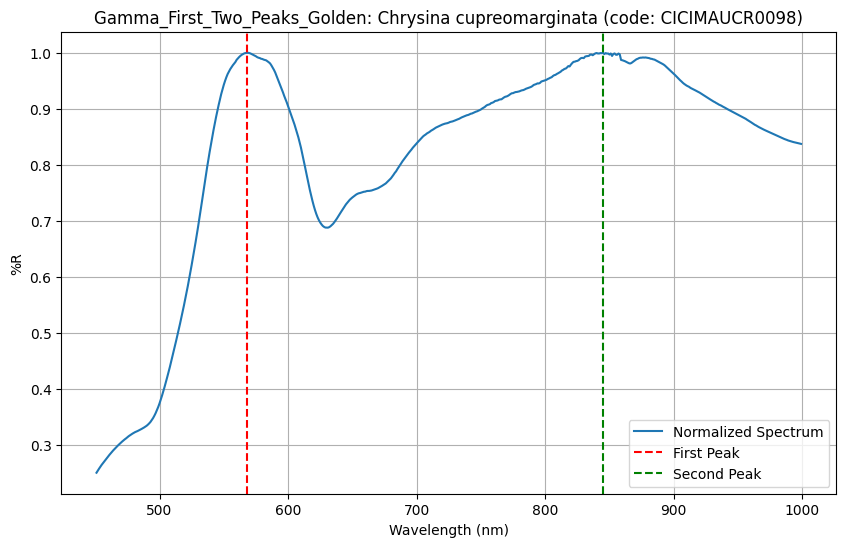

Gamma_First_Two_Peaks_Golden Getting metric value


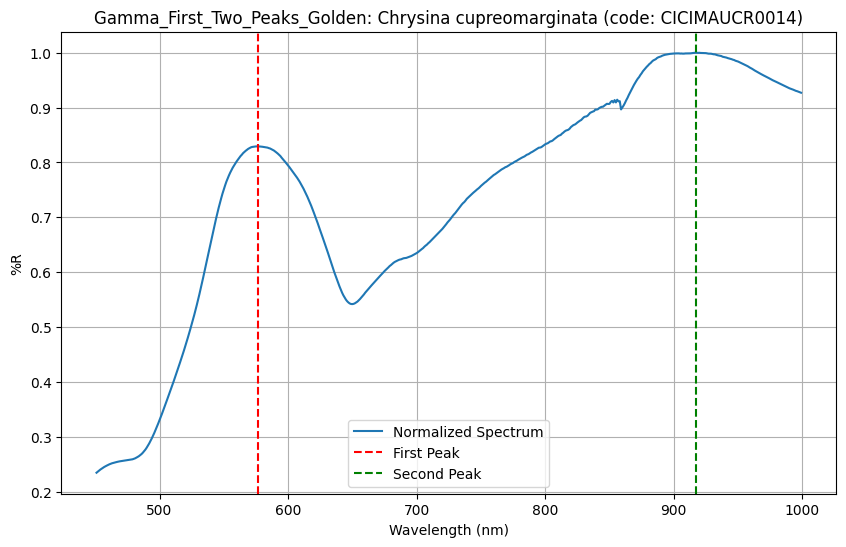

Gamma_First_Two_Peaks_Golden Getting metric value


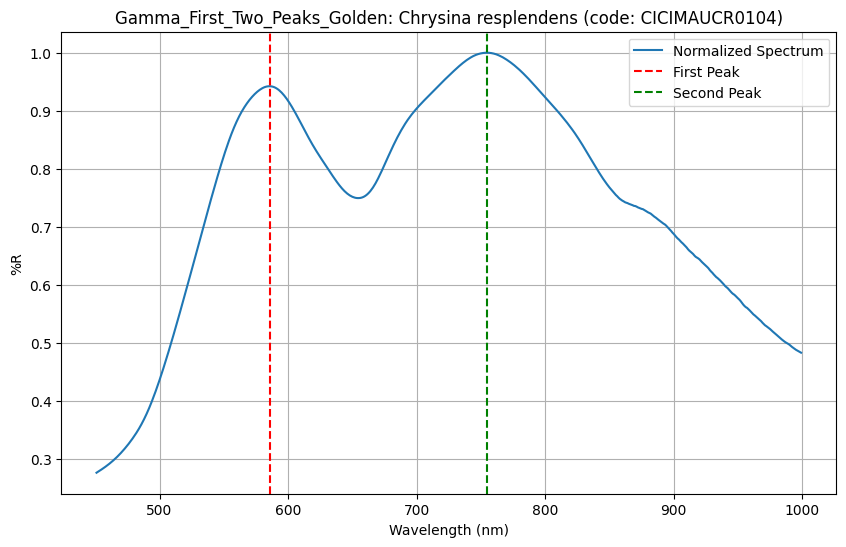

Gamma_First_Two_Peaks_Golden Getting metric value


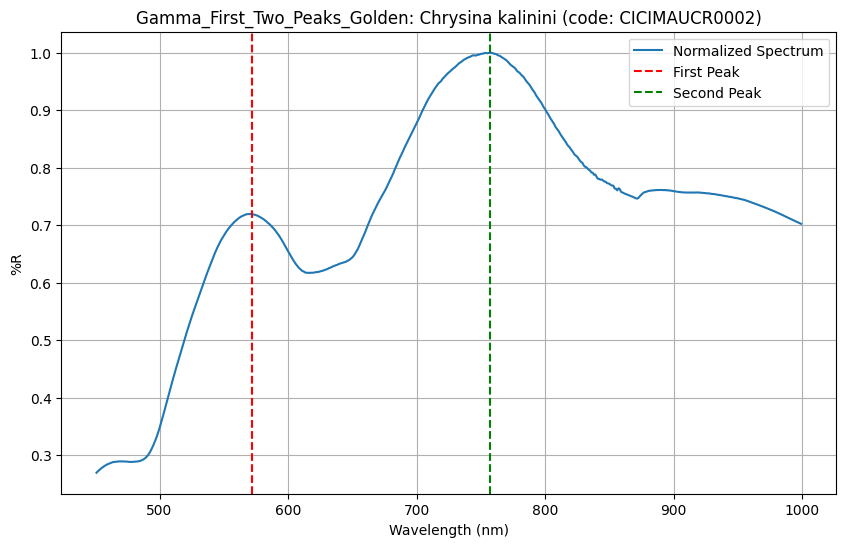

Gamma_First_Two_Peaks_Golden Getting metric value


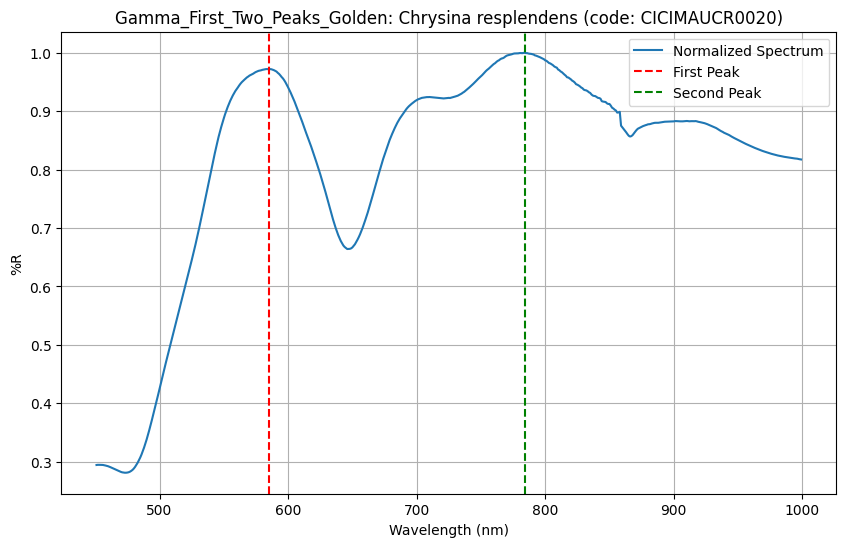

Gamma_First_Two_Peaks_Golden Getting metric value


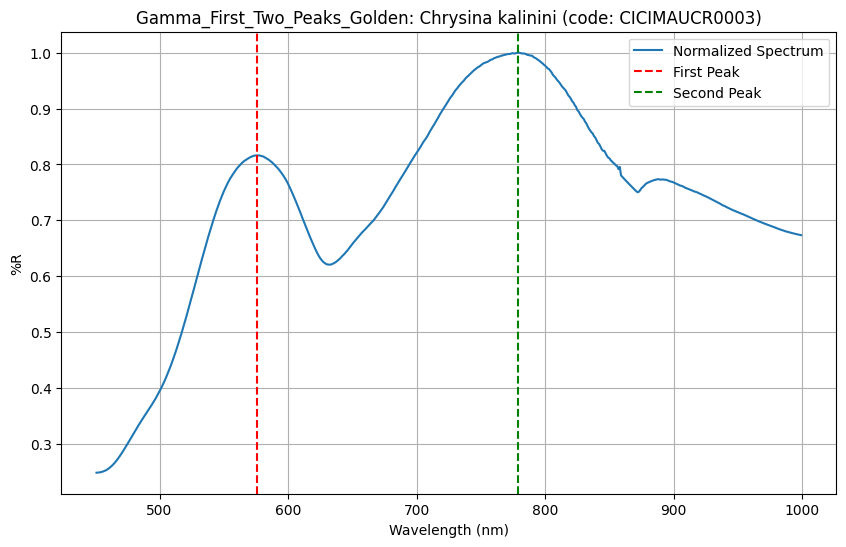

Gamma_First_Two_Peaks_Golden Getting metric value


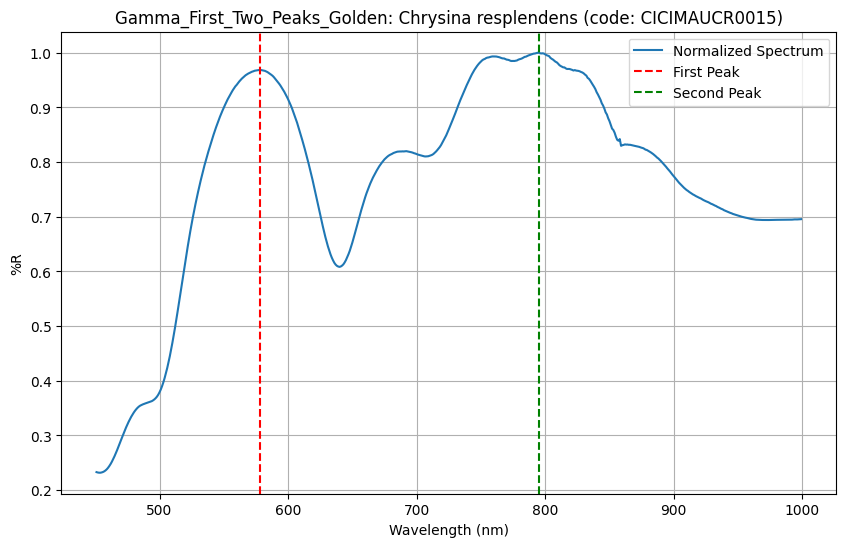

Gamma_First_Two_Peaks_Golden Getting metric value


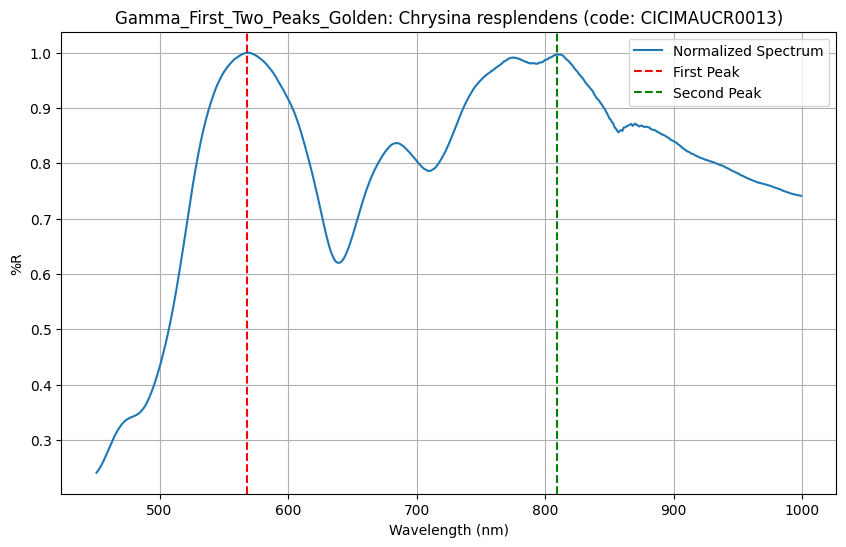

Gamma_First_Two_Peaks_Golden Getting metric value


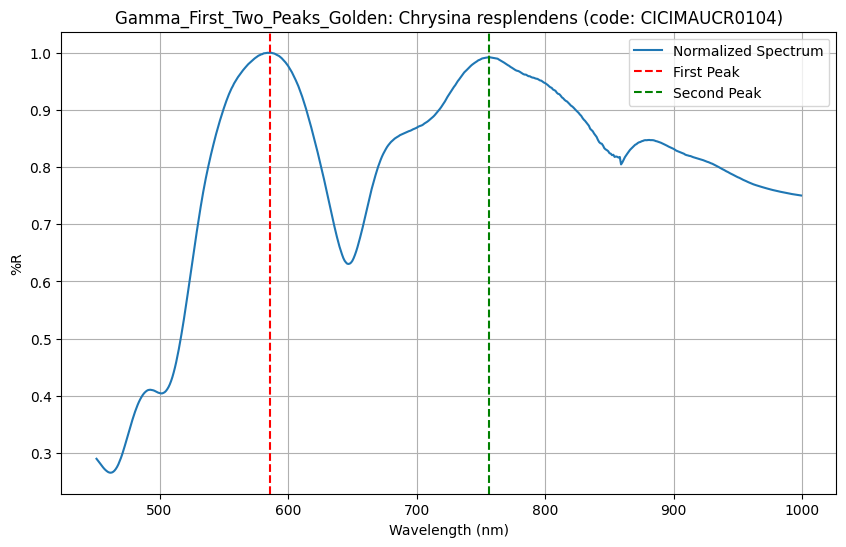

Gamma_First_Two_Peaks_Golden Getting metric value


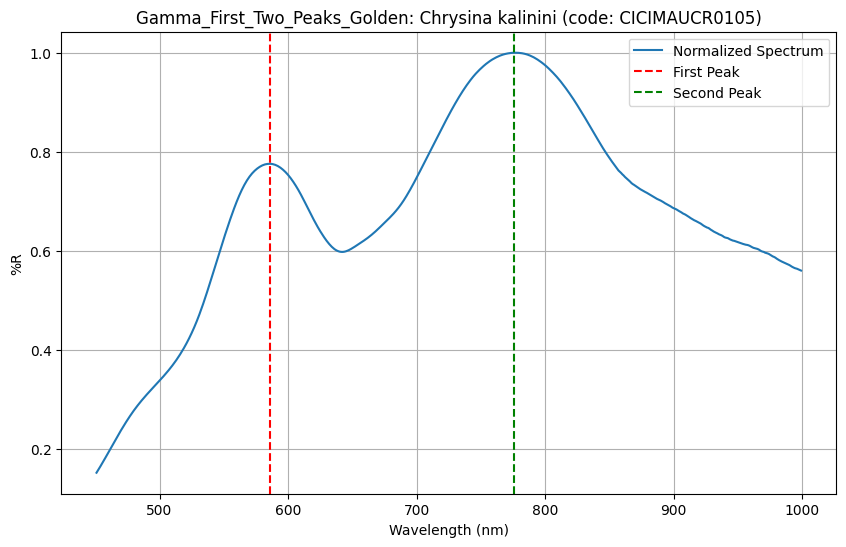

Gamma_First_Two_Peaks_Golden Getting metric value


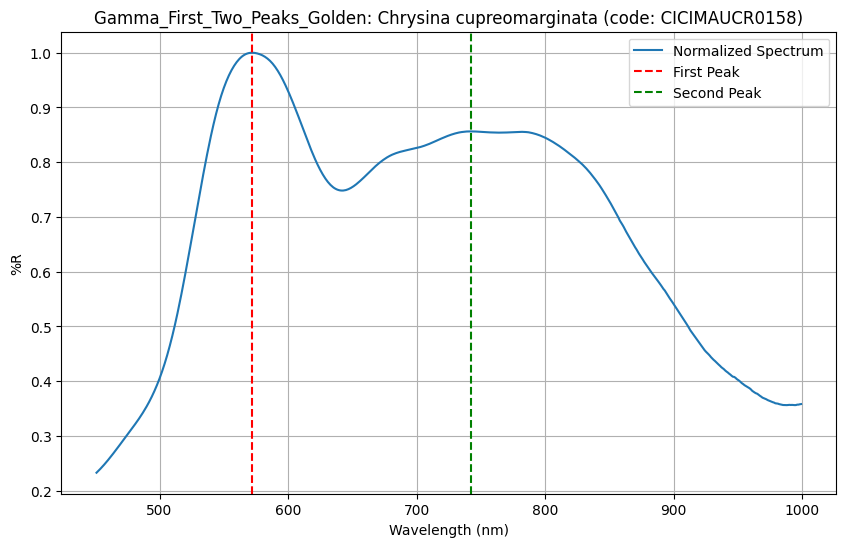

Gamma_First_Two_Peaks_Golden Getting metric value


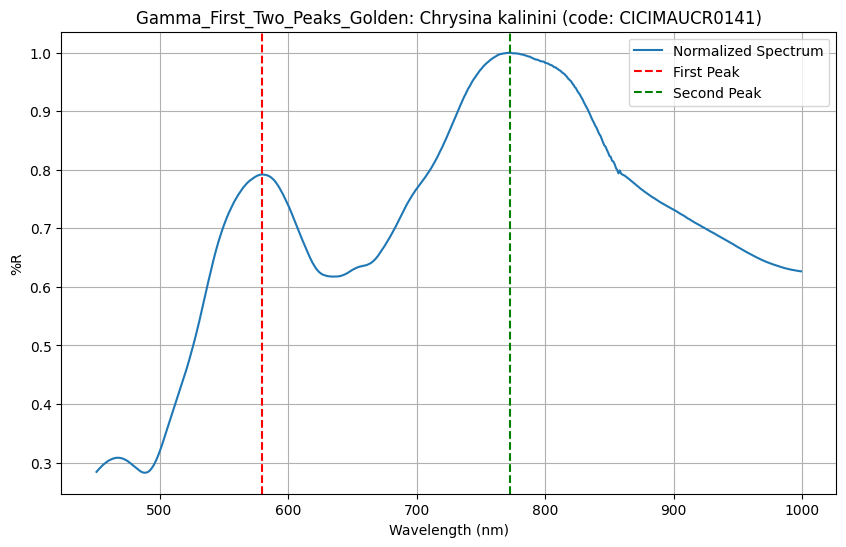

Gamma_First_Two_Peaks_Golden Getting metric value


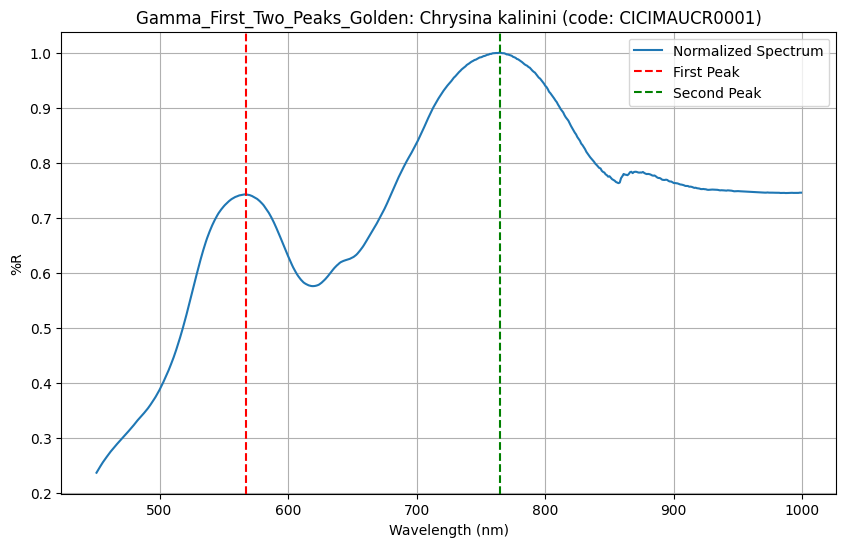

Gamma_First_Two_Peaks_Golden Getting metric value


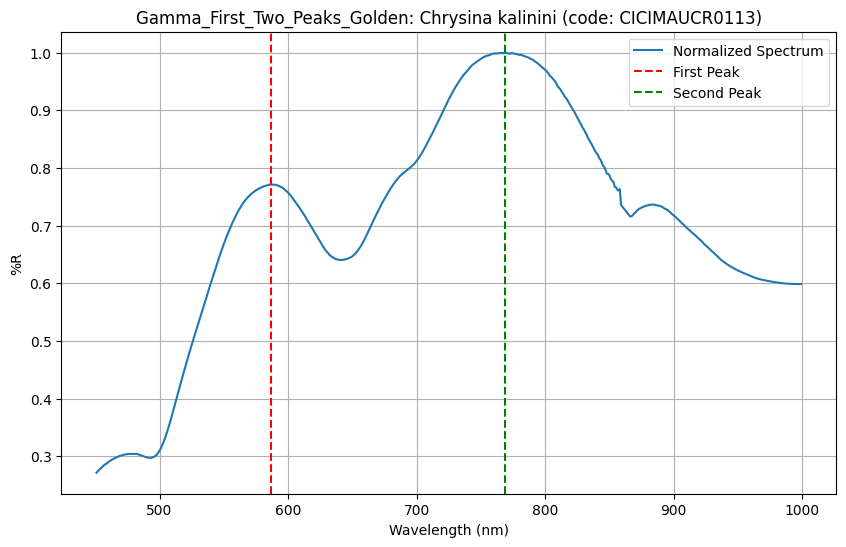

Gamma_First_Two_Peaks_Golden Getting metric value


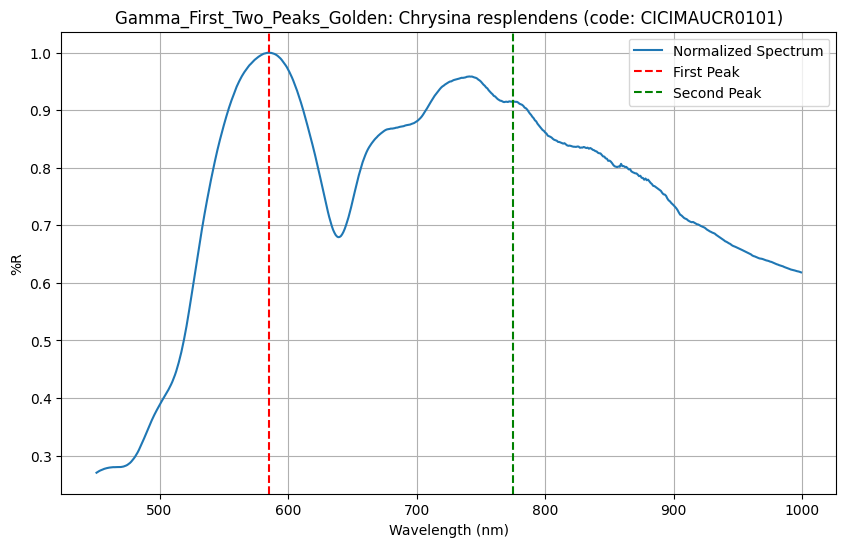

Gamma_First_Two_Peaks_Golden Getting metric value


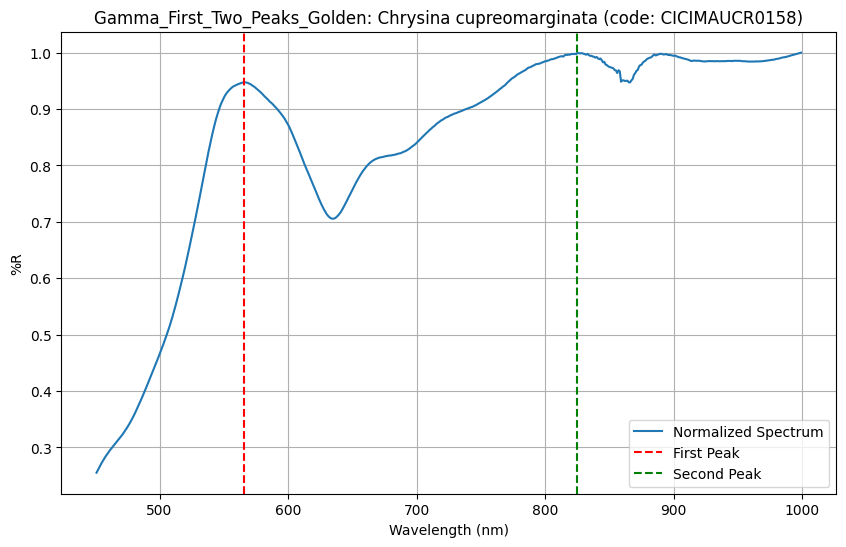

Gamma_First_Two_Peaks_Golden Getting metric value


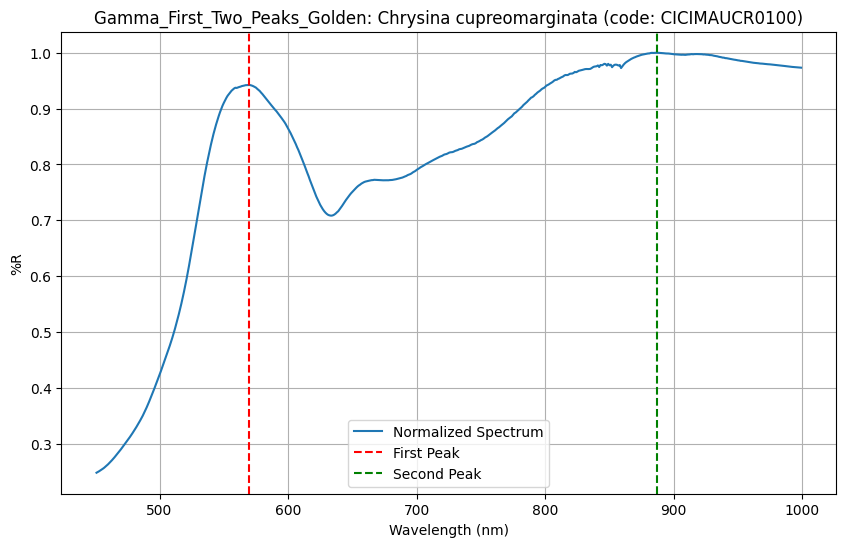

Gamma_First_Two_Peaks_Golden Getting metric value


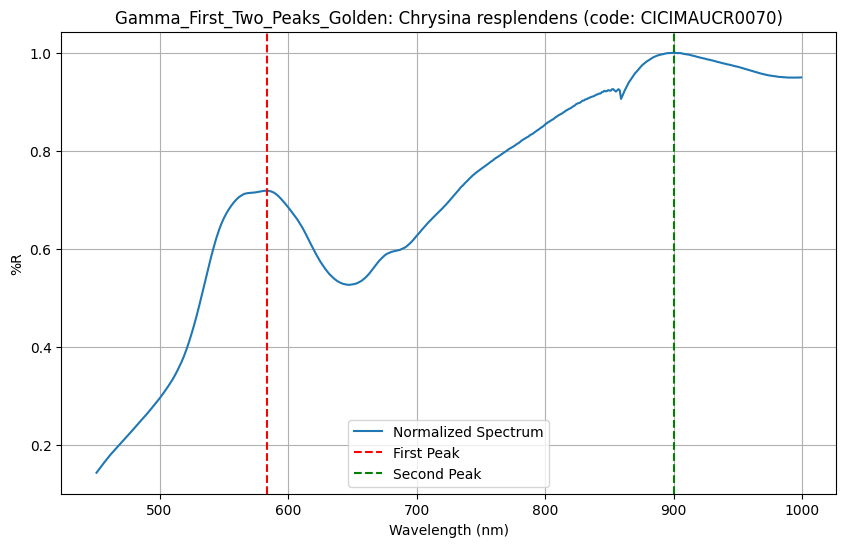

Gamma_First_Two_Peaks_Golden Getting metric value


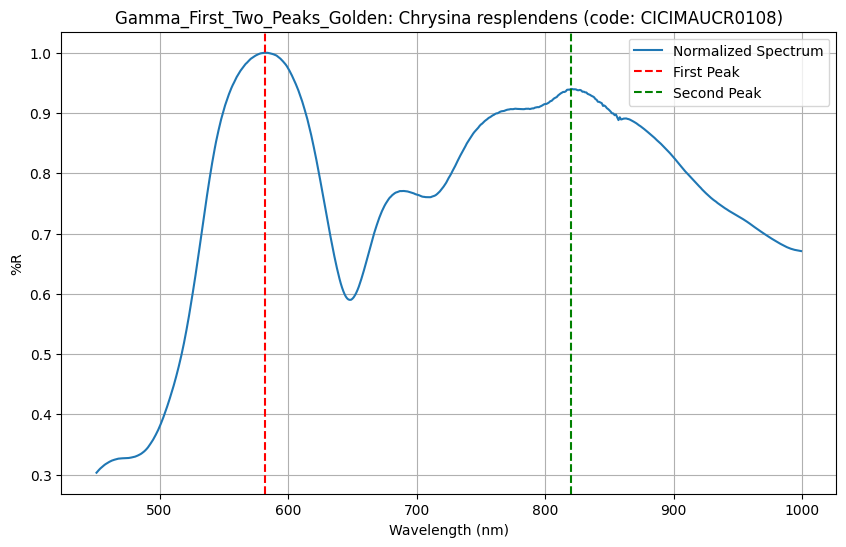

Gamma_First_Two_Peaks_Golden Getting metric value


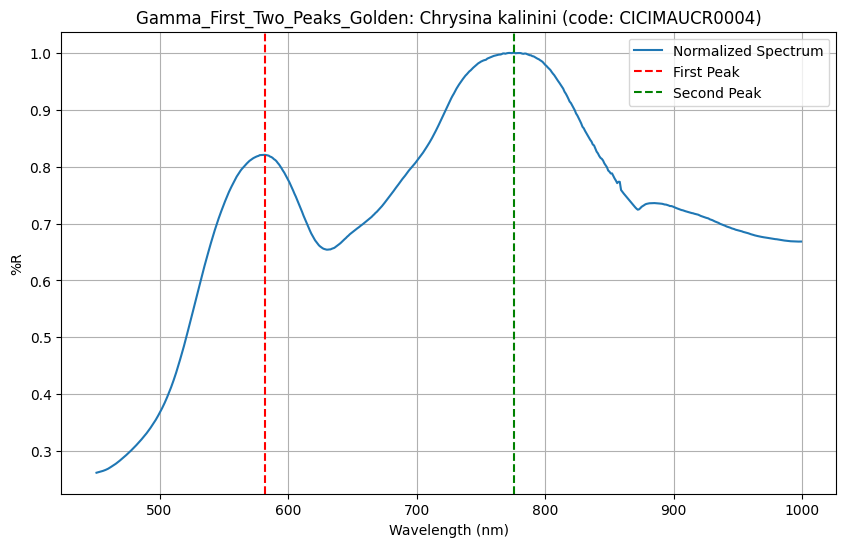

Gamma_First_Two_Peaks_Golden Getting metric value


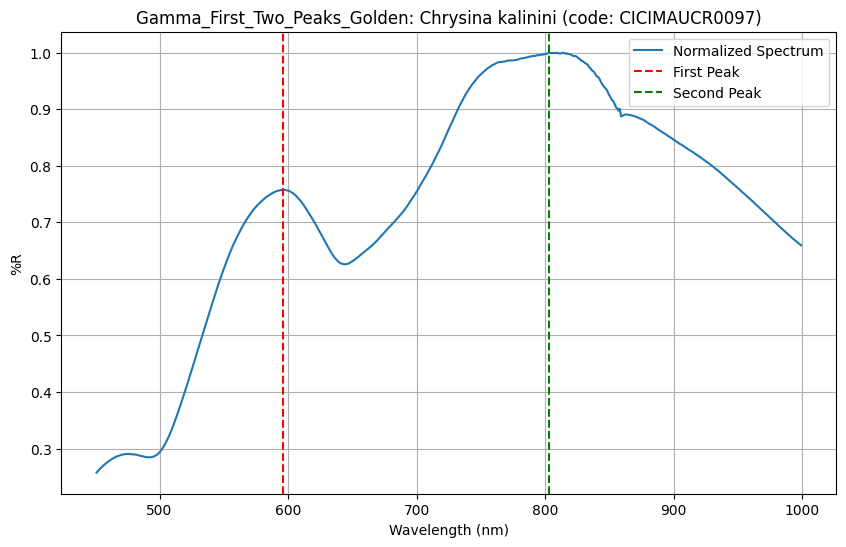

Gamma_First_Two_Peaks_Golden Getting metric value


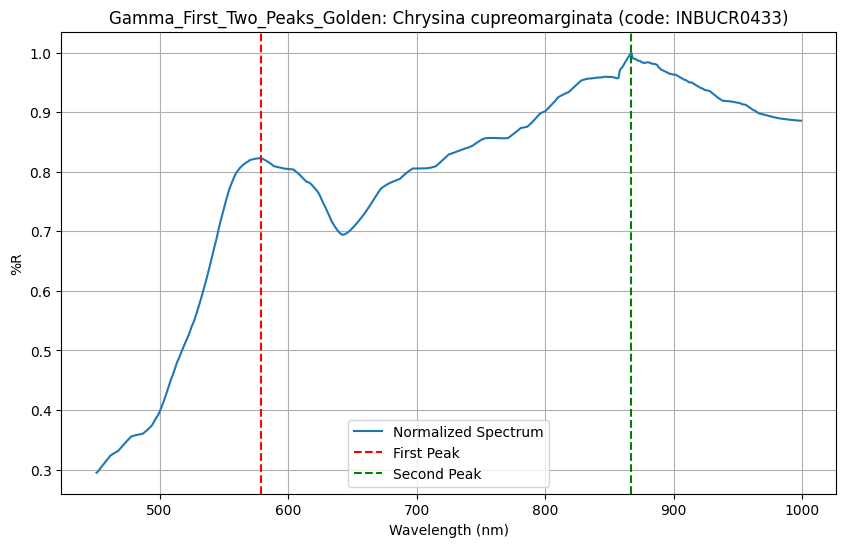

Gamma_First_Two_Peaks_Golden Getting metric value


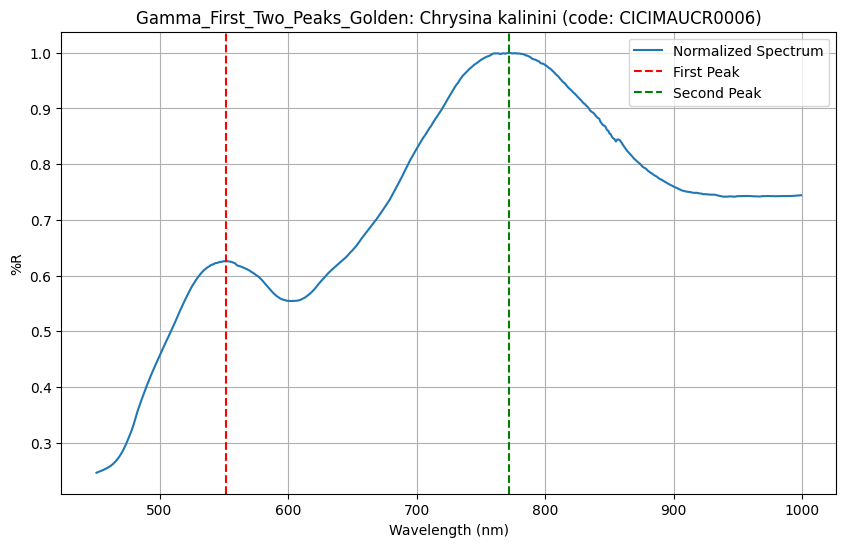

Gamma_First_Two_Peaks_Golden Getting metric value


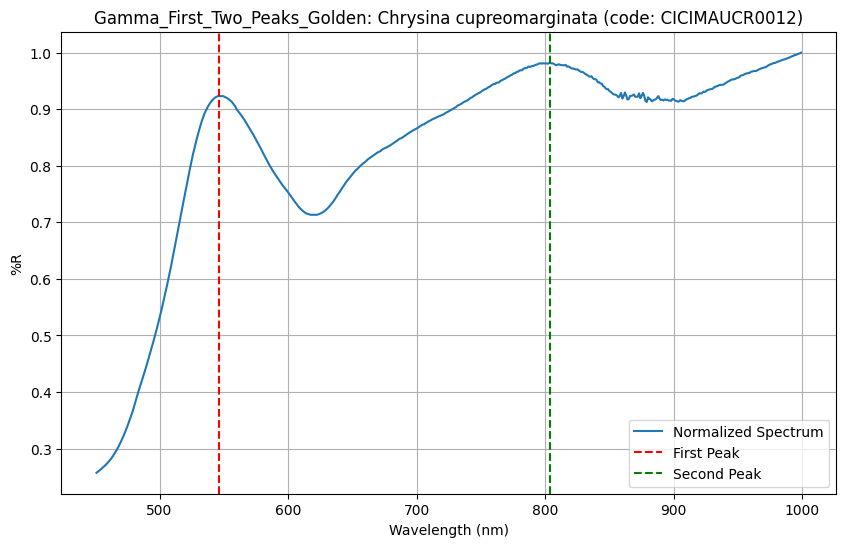

Gamma_First_Two_Peaks_Golden Getting metric value


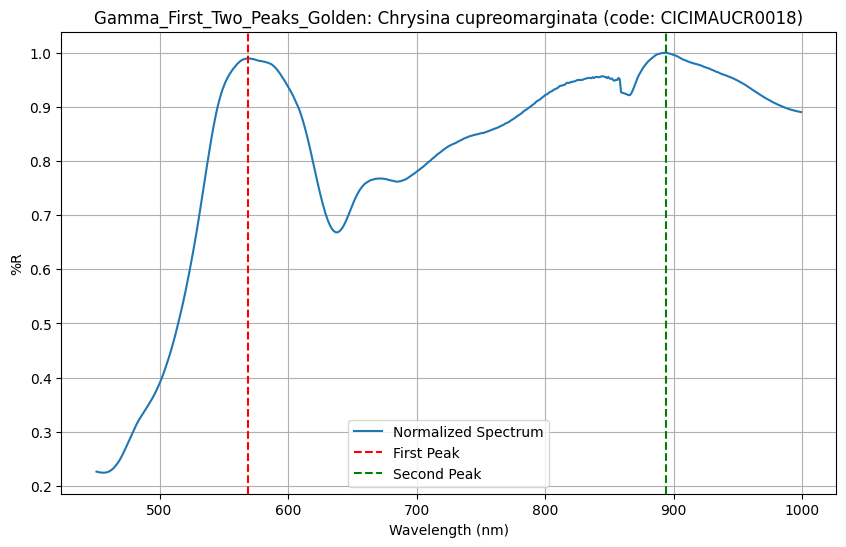

Gamma_First_Two_Peaks_Golden Getting metric value


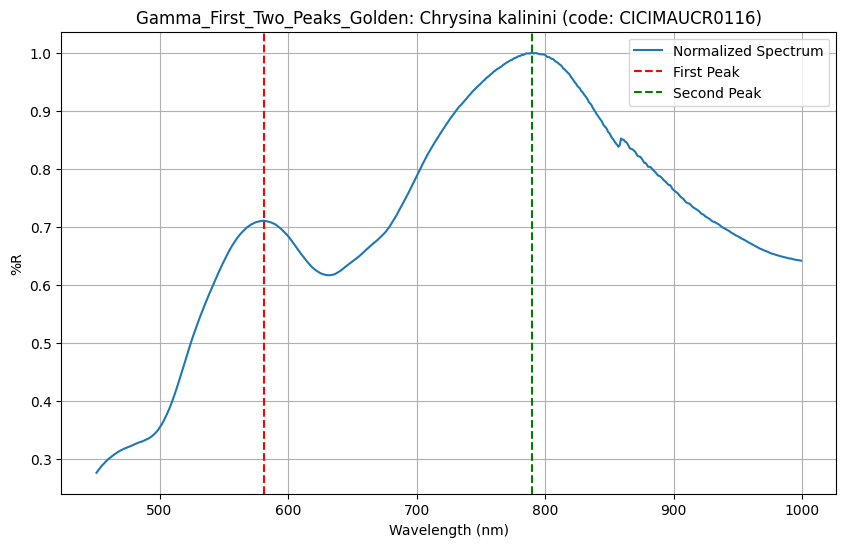

[['CICIMAUCR0098', 'CICIMAUCR0014', 'CICIMAUCR0104', 'CICIMAUCR0002', 'CICIMAUCR0020', 'CICIMAUCR0003', 'CICIMAUCR0015', 'CICIMAUCR0013', 'CICIMAUCR0104', 'CICIMAUCR0105', 'CICIMAUCR0158', 'CICIMAUCR0141', 'CICIMAUCR0001', 'CICIMAUCR0113', 'CICIMAUCR0101', 'CICIMAUCR0158', 'CICIMAUCR0100', 'CICIMAUCR0070', 'CICIMAUCR0108', 'CICIMAUCR0004', 'CICIMAUCR0097', 'INBUCR0433', 'CICIMAUCR0006', 'CICIMAUCR0012', 'CICIMAUCR0018', 'CICIMAUCR0116'], [np.float64(0.9997946715741182), np.float64(1.2058207872110318), np.float64(1.061263556672878), np.float64(1.3894857926038329), np.float64(1.0285942589874786), np.float64(1.2251516694200988), np.float64(1.0325354216782034), np.float64(0.9971201326836476), np.float64(0.9920349559910941), np.float64(1.2894620099264786), np.float64(0.856289595722265), np.float64(1.2624276598192257), np.float64(1.3470690683438888), np.float64(1.2963532867380805), np.float64(0.9158003516333134), np.float64(1.0547216580625591), np.float64(1.061321002683337), np.float64(1.390

In [11]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_First_Two_Peaks_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

print(gamma_first_two_peaks_data)

#### Gamma First Two Peaks Simple

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


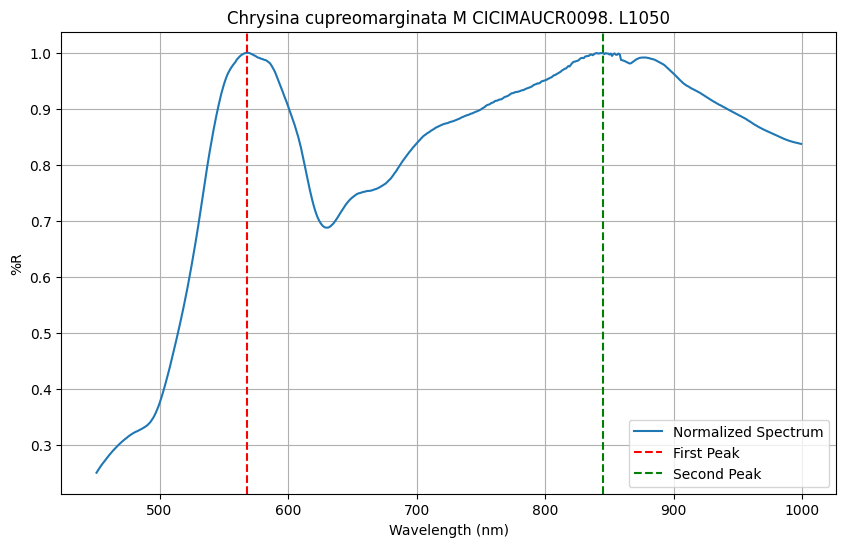

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


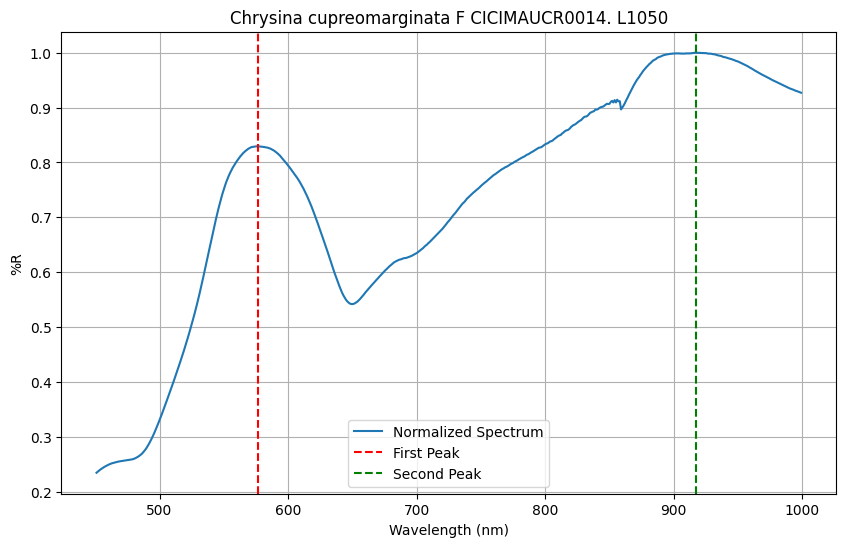

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


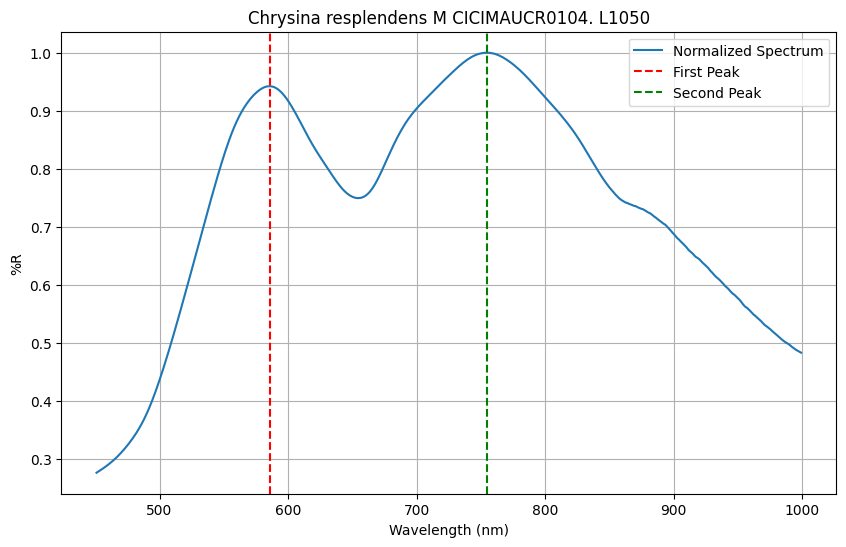

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


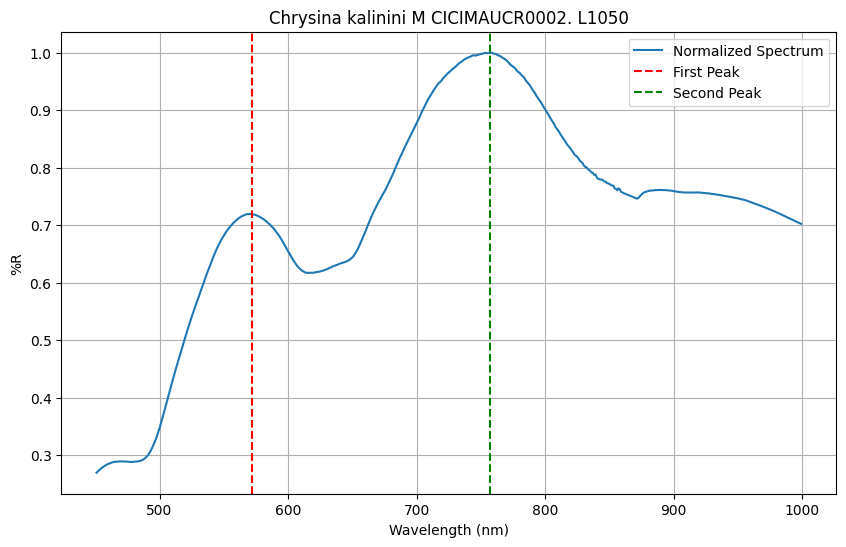

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


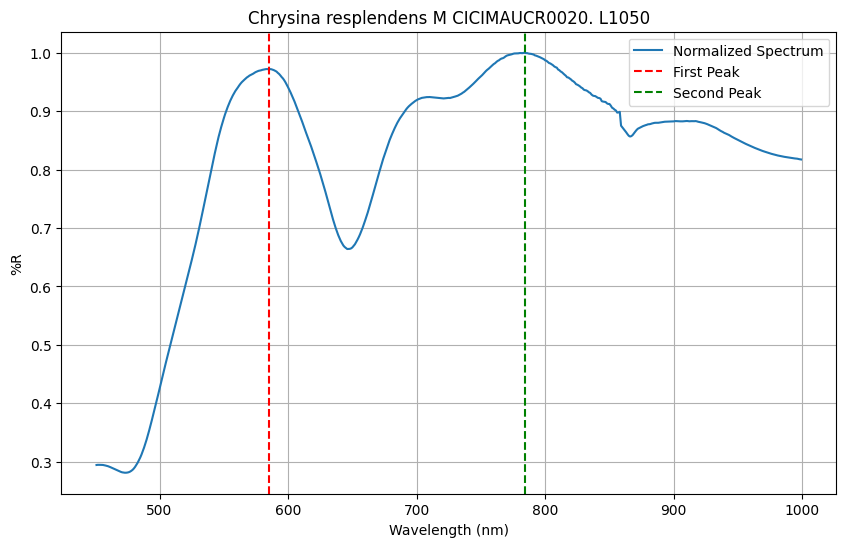

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


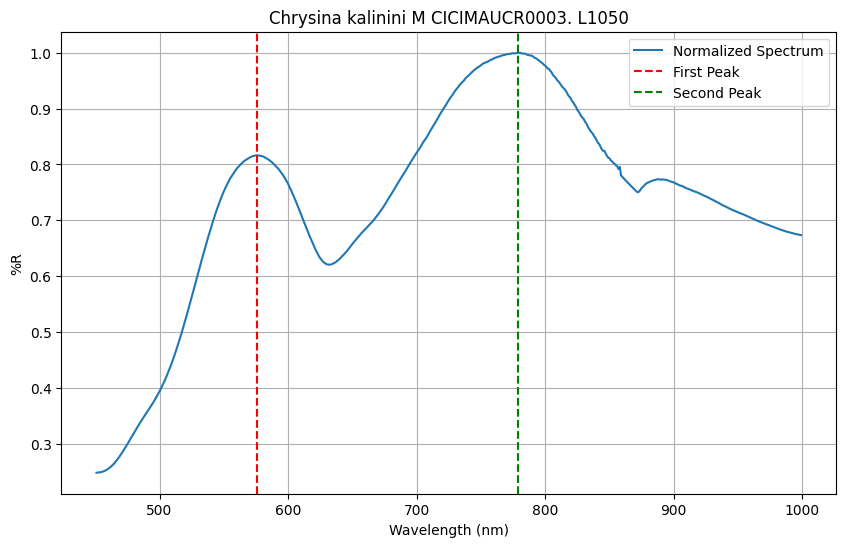

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


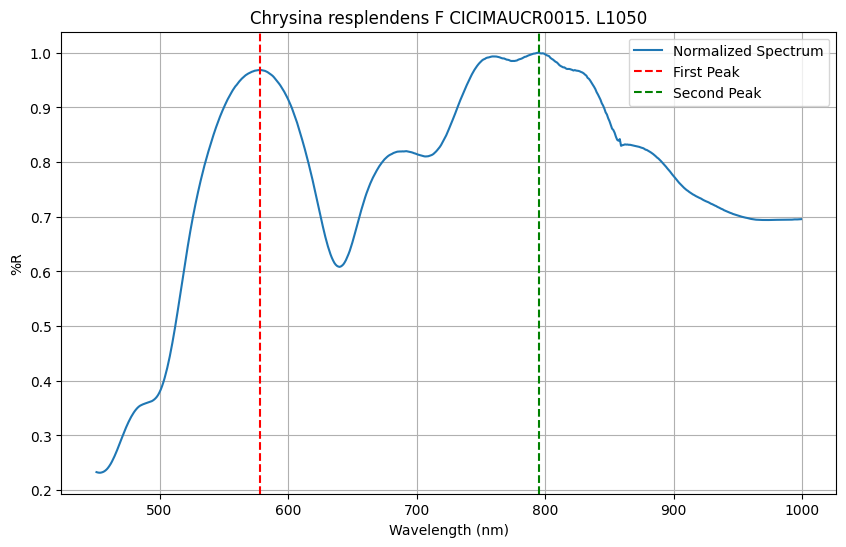

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


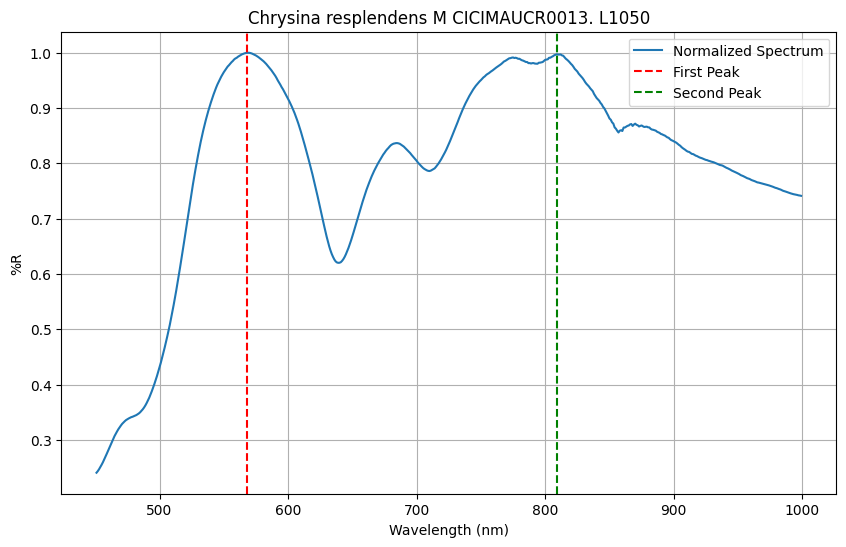

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


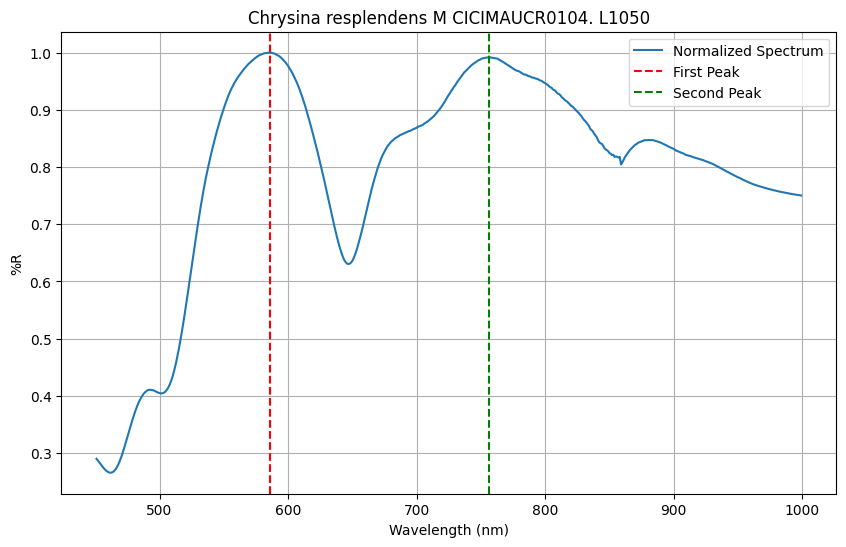

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


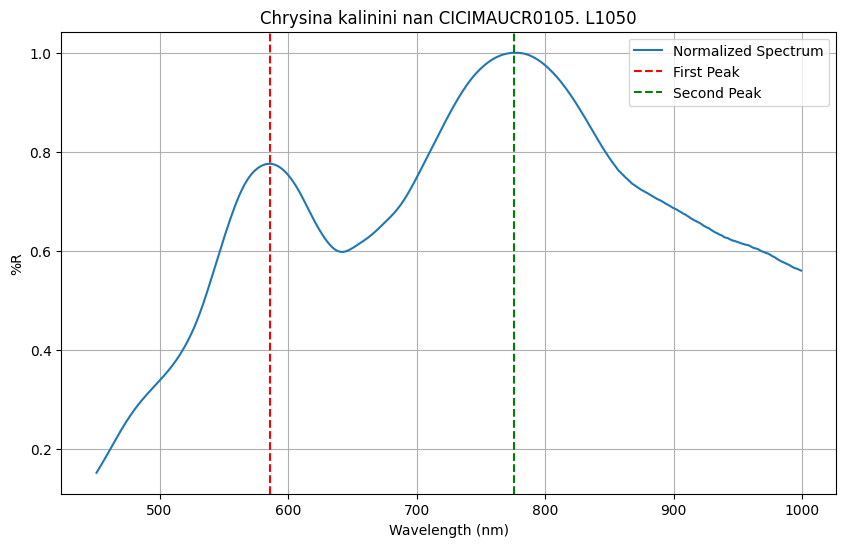

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


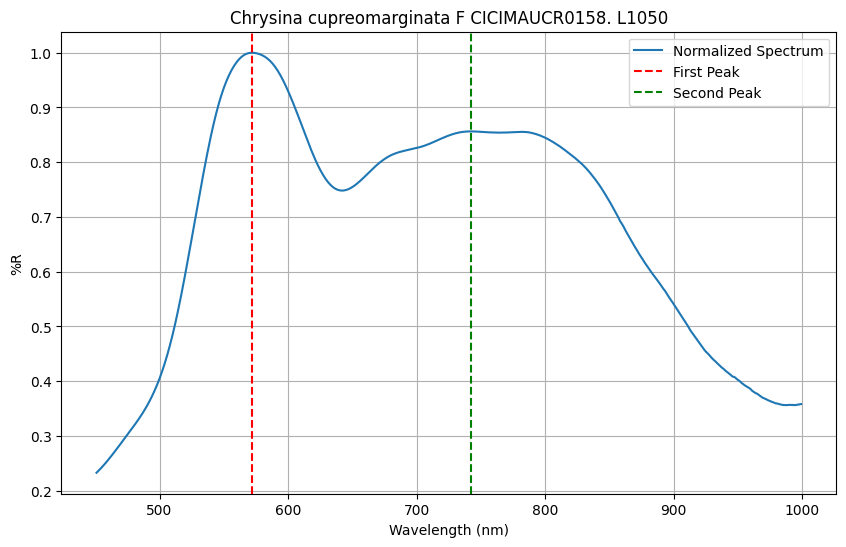

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


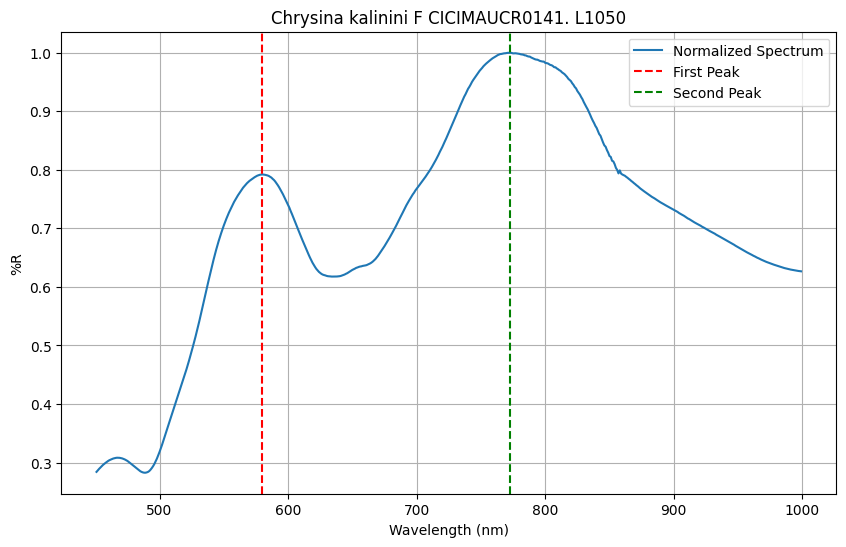

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


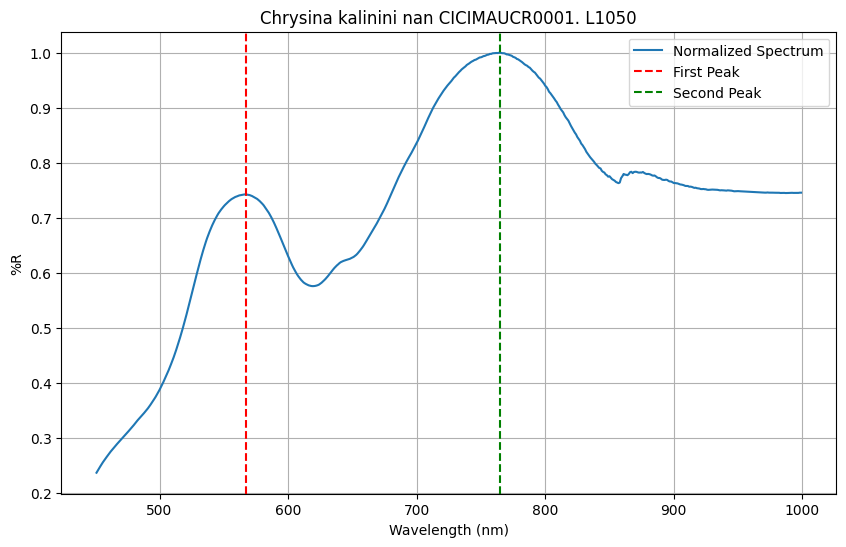

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


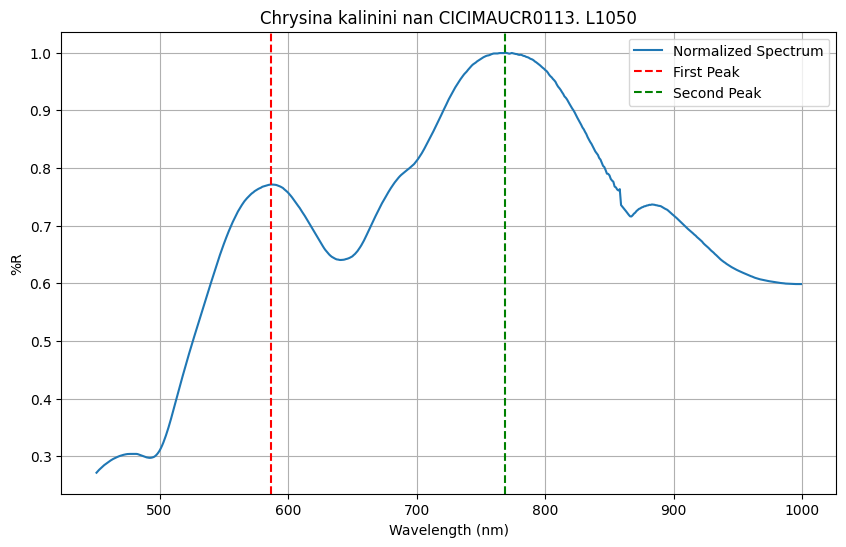

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


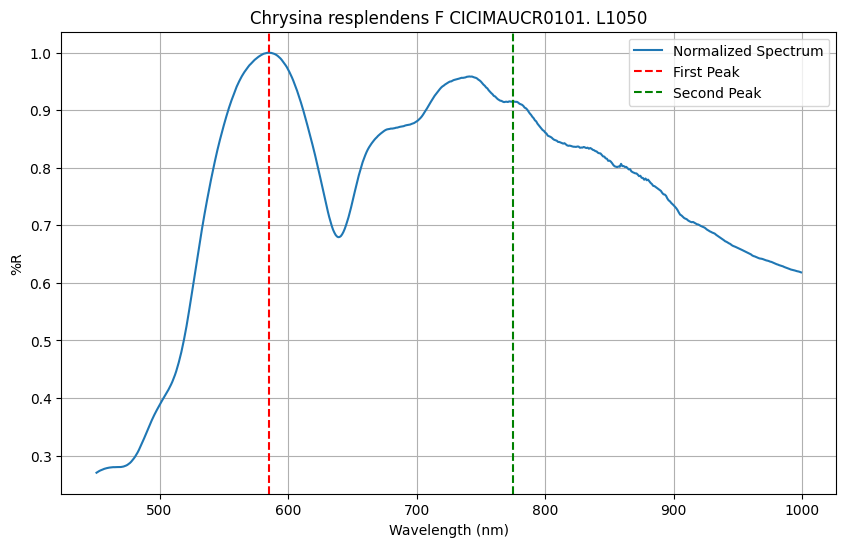

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


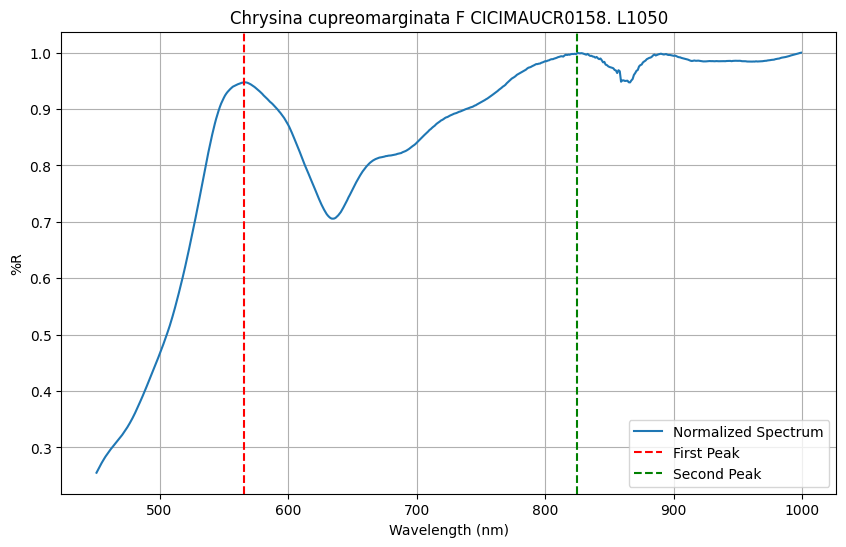

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


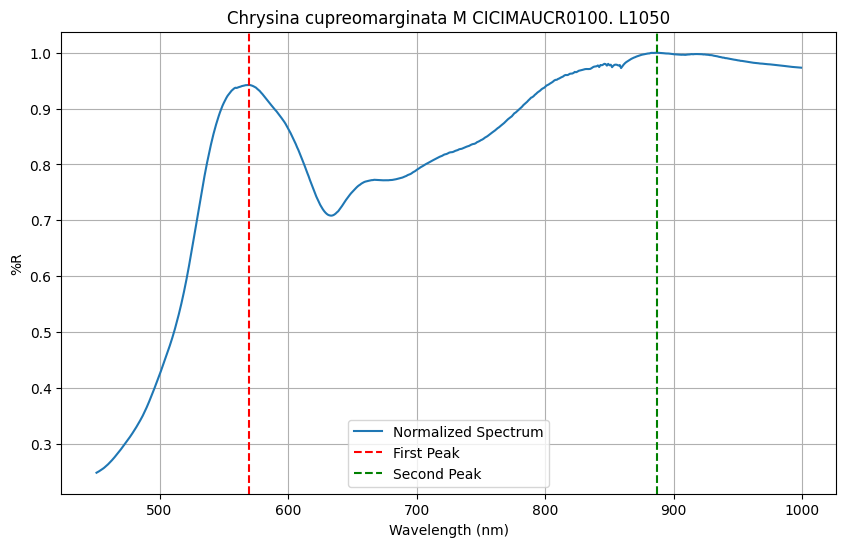

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


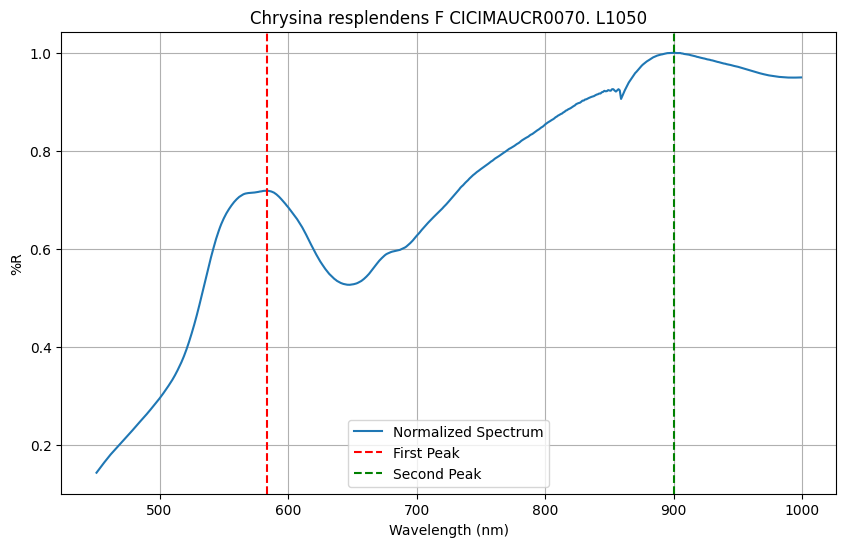

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


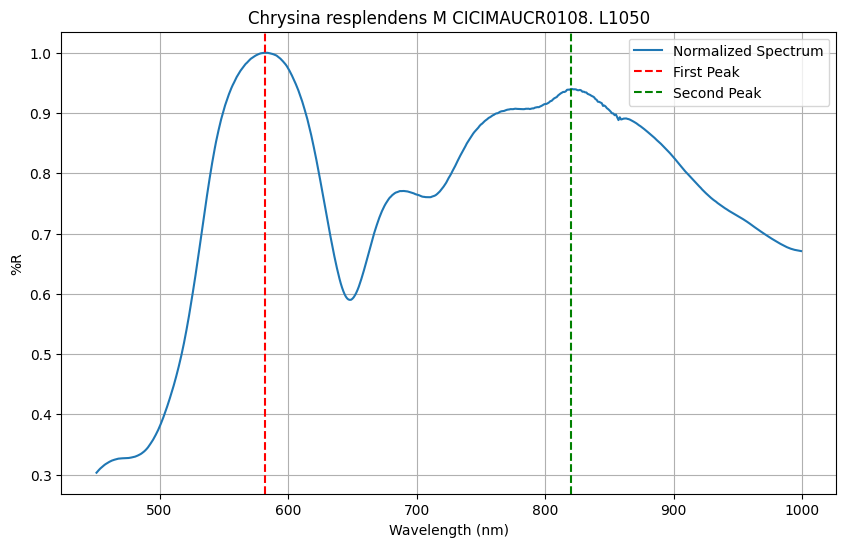

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


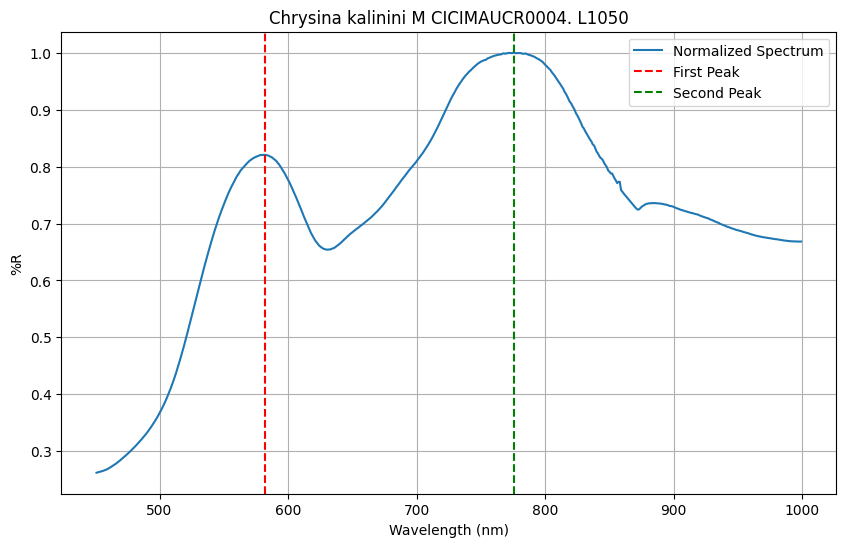

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


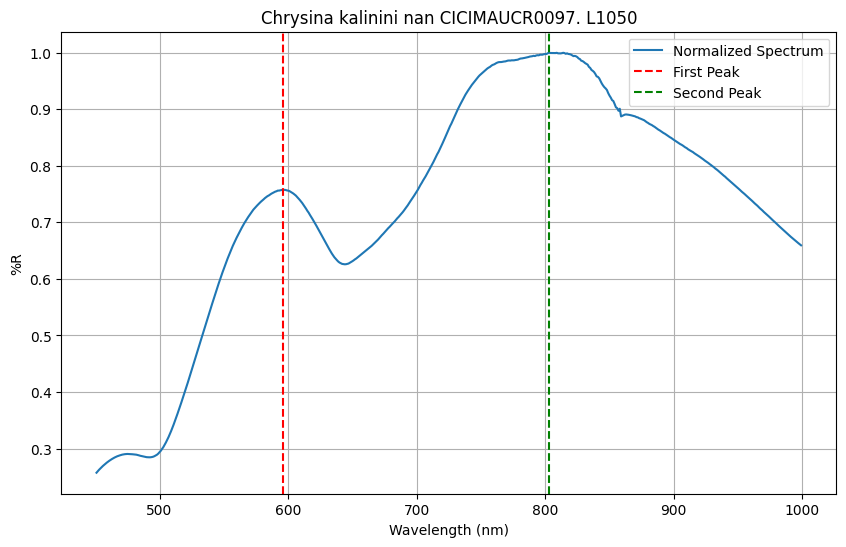

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


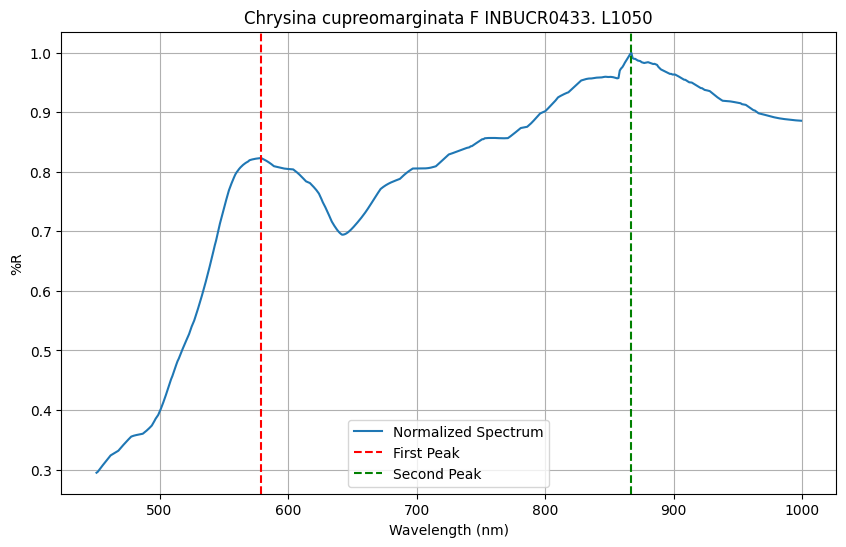

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


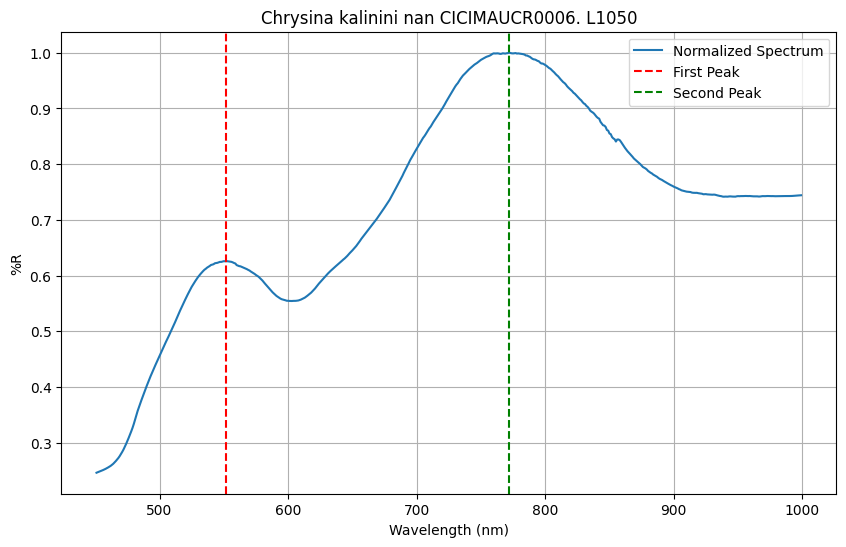

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


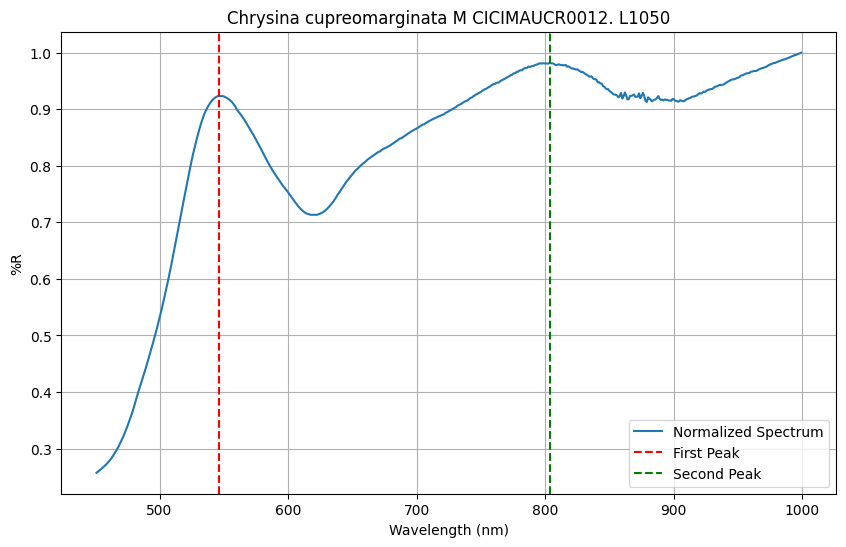

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


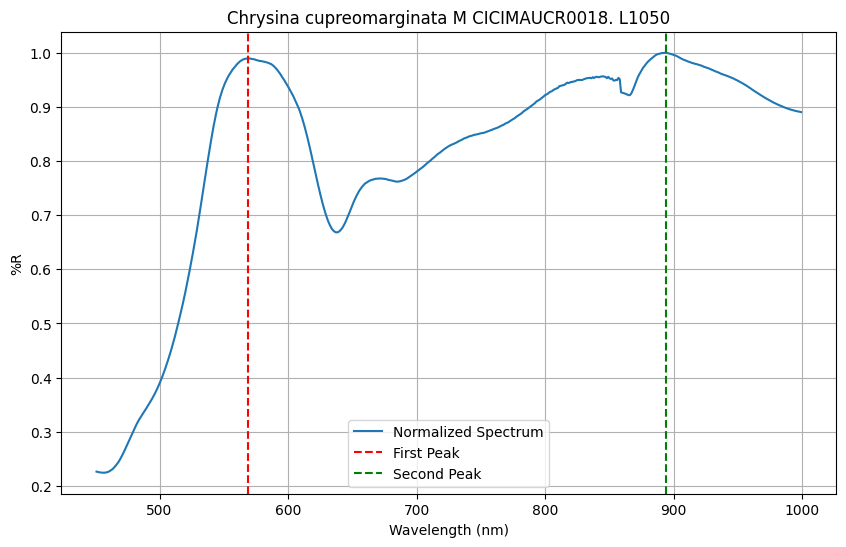

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Getting equipment. Spectrum


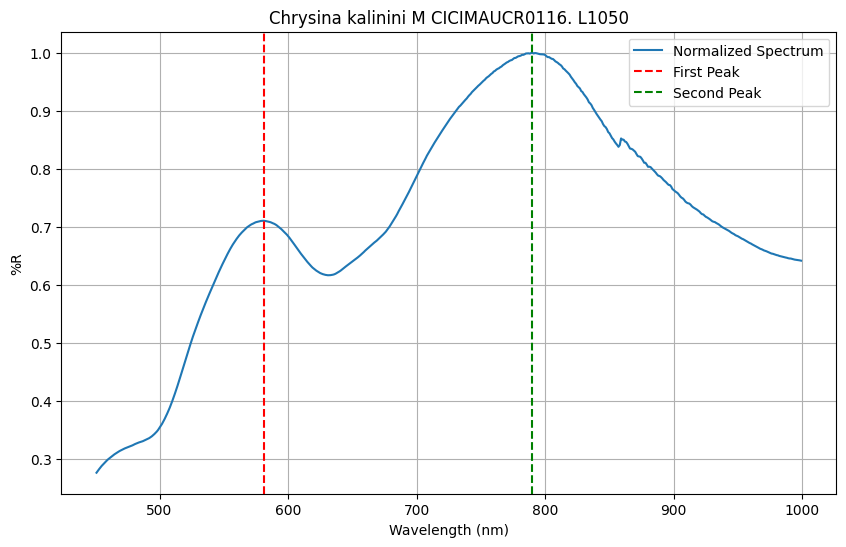

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
[['CICIMAUCR0098', 'CICIMAUCR0014', 'CICIMAUCR0104', 'CICIMAUCR0002', 'CICIMAUCR0020', 'CICIMAUCR0003', 'CICIMAUCR0015', 'CICIMAUCR0013', 'CICIMAUCR0104', 'CICIMAUCR0105', 'CICIMAUCR0158', 'CICIMAUCR0141', 'CICIMAUCR0001', 'CICIMAUCR0113', 'CICIMAUCR0101', 'CICIMAUCR0158', 'CICIMAUCR0100', 'CICIMAUCR0070', 'CICIMAUCR0108', 'CICIMAUCR0004', 'CICIMAUCR0097', 'INBUCR0433', 'CICIMAUCR0006', 'CICIMAUCR0012', 'CICIMAUCR0018', 'CICIMAUCR0116'], [np.float64(0.9997946715741182), np.float64(1.2058207872110318), np.float64(1.06

In [12]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_First_Two_Peaks_Simple, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

print(gamma_first_two_peaks_data)

#### Gamma_Gaussian_Fit

In [13]:
gamma_arbitrary_limits_data = feature_and_label_extractor(Metric = Gamma_Gaussian_Fit, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


print(gamma_arbitrary_limits_data)

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=None
        self.smallest_distance_between_peaks_for_max=None
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_min

#### Gamma_Area_Under_Curve_Naive_Golden

In [14]:
gamma_area_under_curve_data = feature_and_label_extractor(Metric = Gamma_Area_Under_Curve_Naive_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

#print(gamma_area_under_curve_data)

#### Gamma_Area_Under_Curve_First_Min_Cut

min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.4705573124519438
PLOTTING
Getting equipment. Spectrum


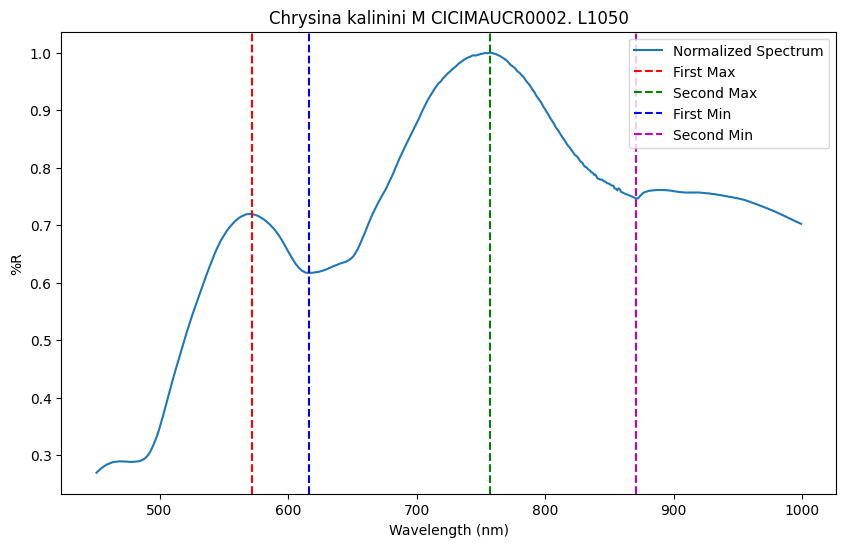

min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bottom_thr=0.0, top_thr=55.50916000000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.5165264927547983
PLOTTING
Getting equipment. Spectrum


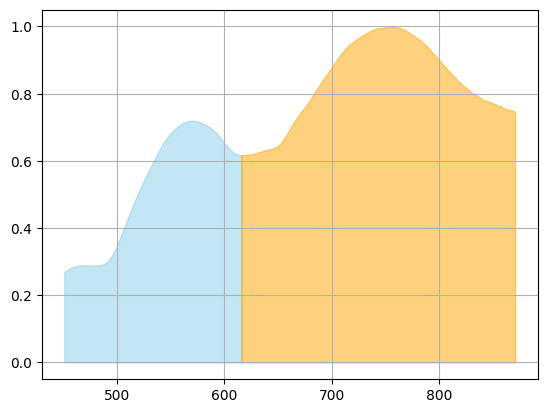

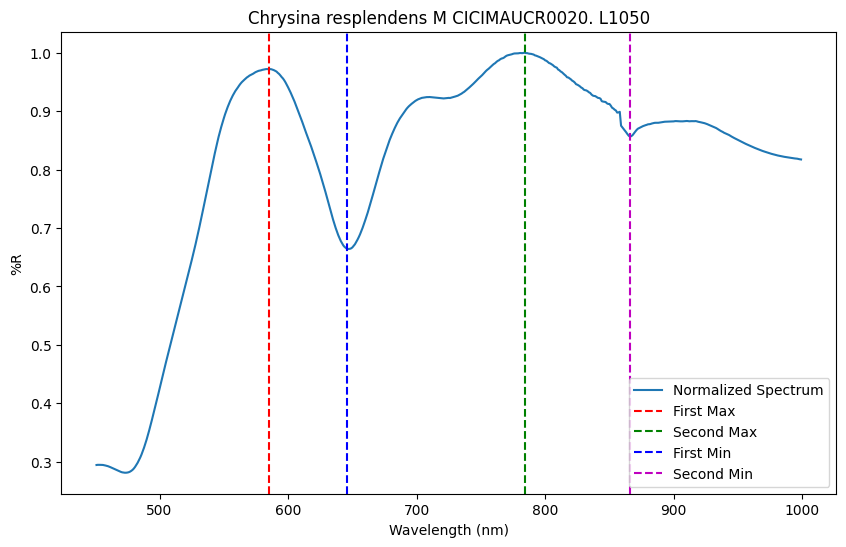

min wav 450.0 max_wav 1000.0
get_minima: max_val=74.529467, 
                  bottom_thr=0.0, top_thr=74.529467, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.9531724342367787
PLOTTING
Getting equipment. Spectrum


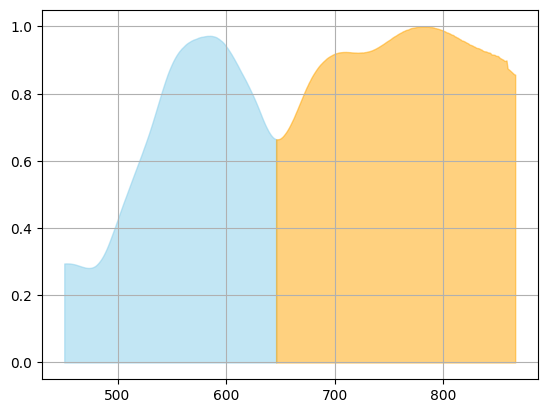

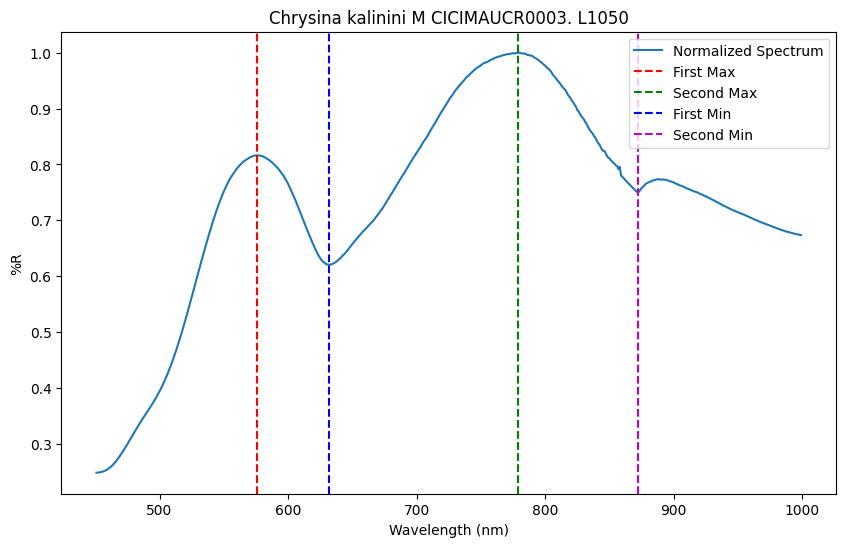

min wav 450.0 max_wav 1000.0
get_minima: max_val=68.777667, 
                  bottom_thr=0.0, top_thr=68.777667, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.543276866168467
PLOTTING
Getting equipment. Spectrum


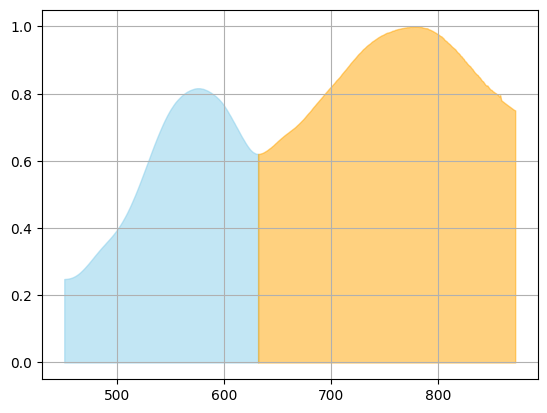

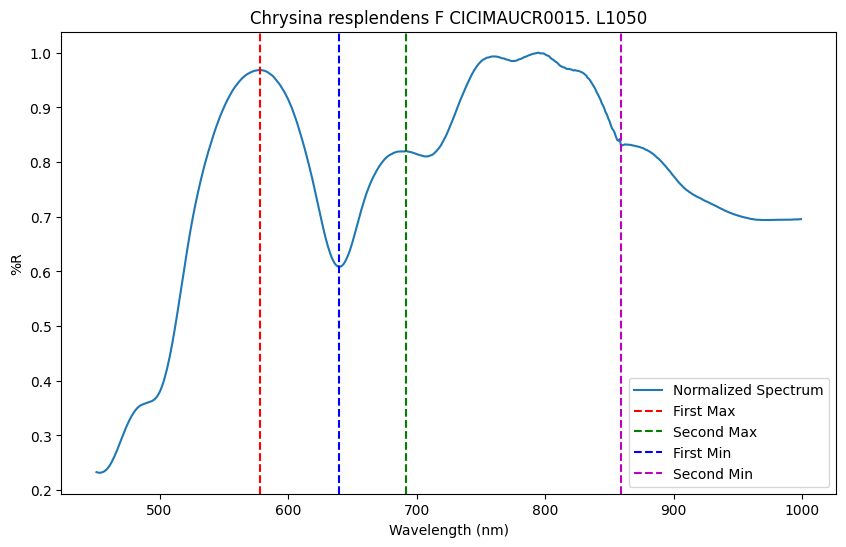

min wav 450.0 max_wav 1000.0
get_minima: max_val=64.1527, 
                  bottom_thr=0.0, top_thr=64.1527, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.4618724104501086
PLOTTING
Getting equipment. Spectrum


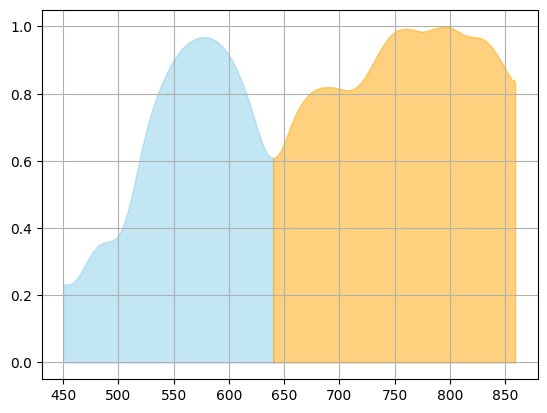

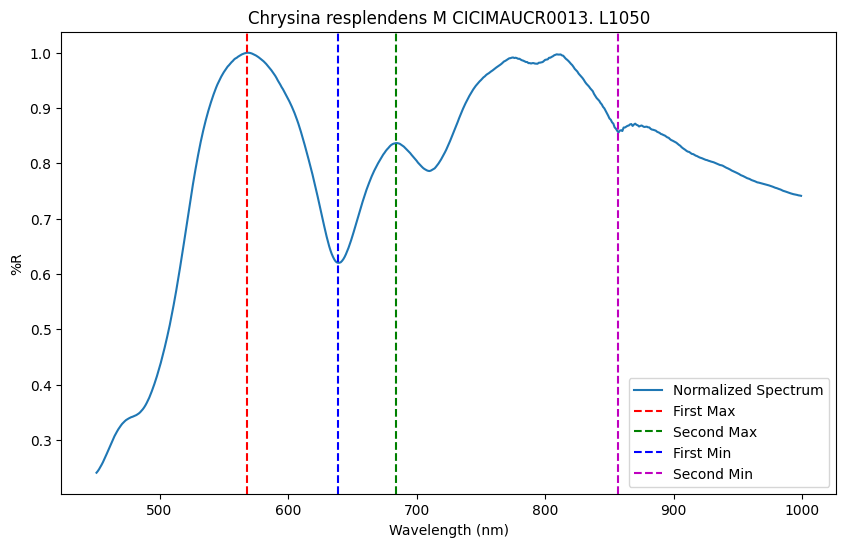

min wav 450.0 max_wav 1000.0
get_minima: max_val=68.632466, 
                  bottom_thr=0.0, top_thr=68.632466, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.3974495221233842
PLOTTING
Getting equipment. Spectrum


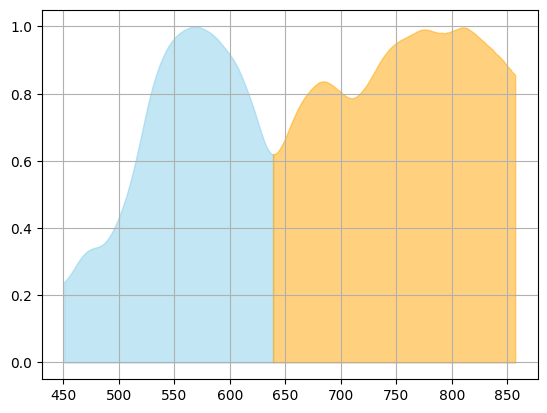

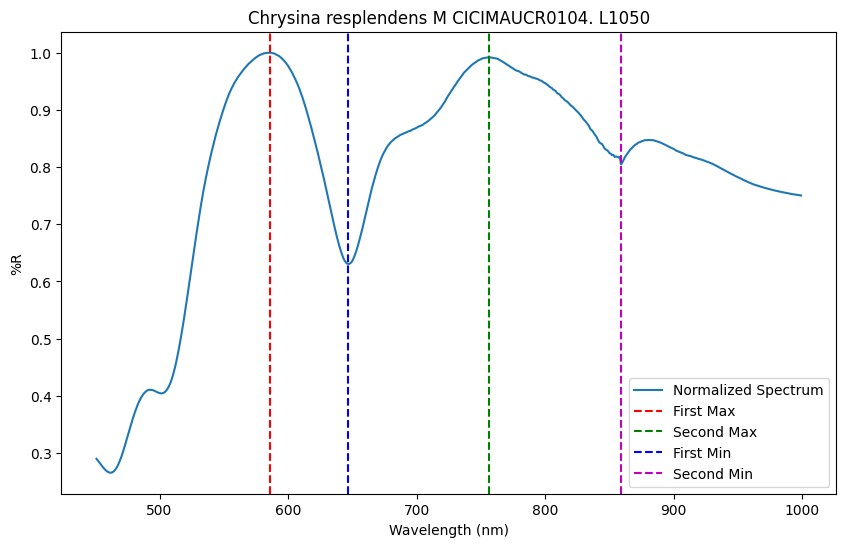

min wav 450.0 max_wav 1000.0
get_minima: max_val=69.614549, 
                  bottom_thr=0.0, top_thr=69.614549, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=47.391498999999996, 
                  bottom_thr=0.0, top_thr=47.391498999999996, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 0.7551207063536286
PLOTTING
Getting equipment. Spectrum


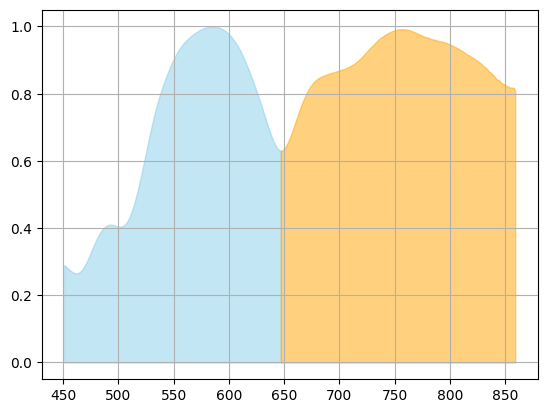

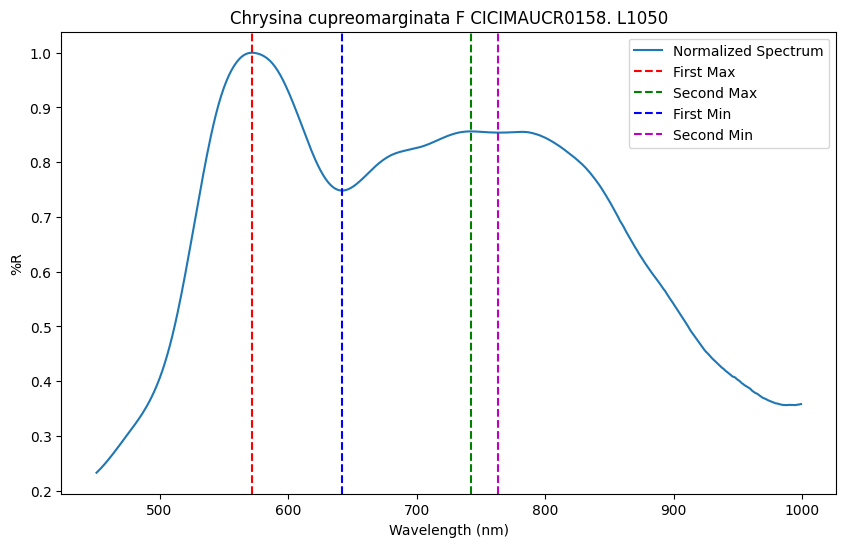

min wav 450.0 max_wav 1000.0
get_minima: max_val=70.071434, 
                  bottom_thr=0.0, top_thr=70.071434, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.878594118500765
PLOTTING
Getting equipment. Spectrum


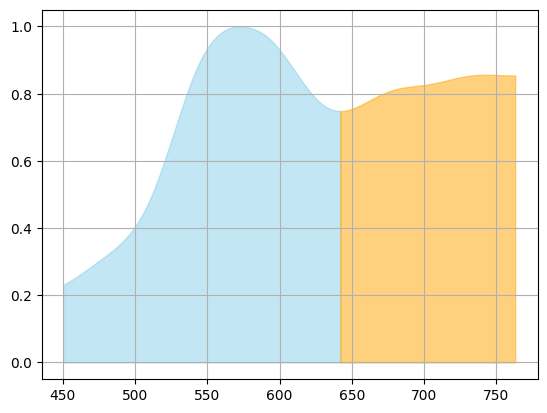

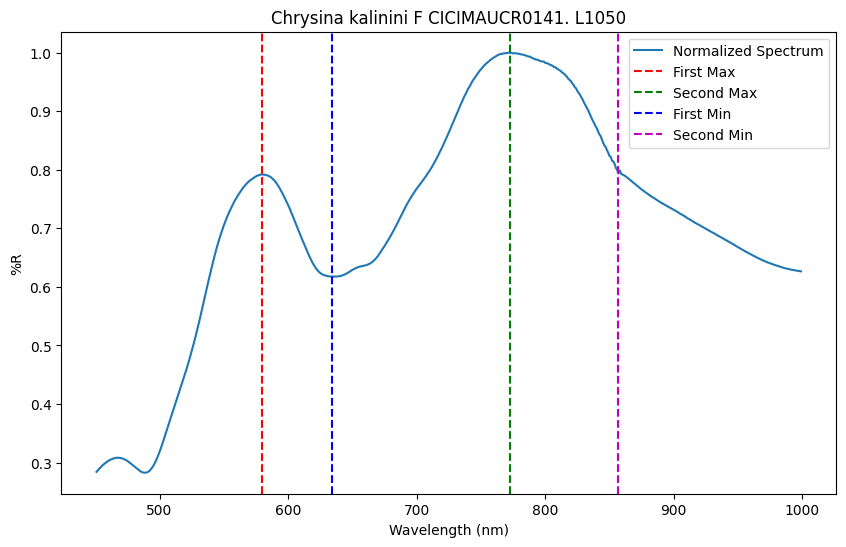

min wav 450.0 max_wav 1000.0
get_minima: max_val=70.30927499999999, 
                  bottom_thr=0.0, top_thr=70.30927499999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.2004360207383997
PLOTTING
Getting equipment. Spectrum


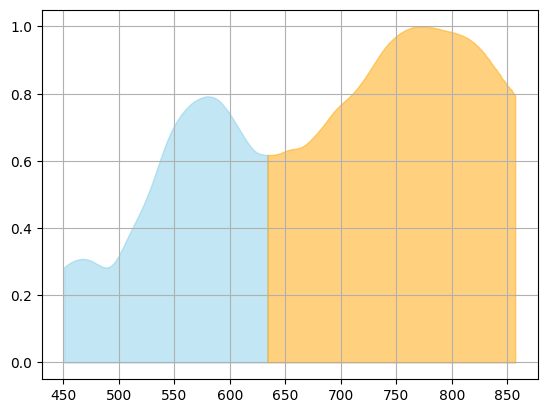

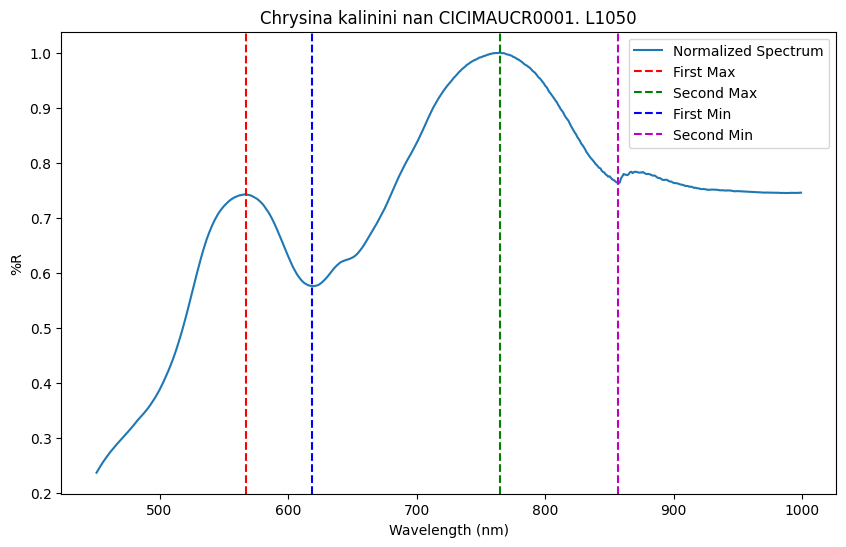

min wav 450.0 max_wav 1000.0
get_minima: max_val=71.173166, 
                  bottom_thr=0.0, top_thr=71.173166, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.8620075365250148
PLOTTING
Getting equipment. Spectrum


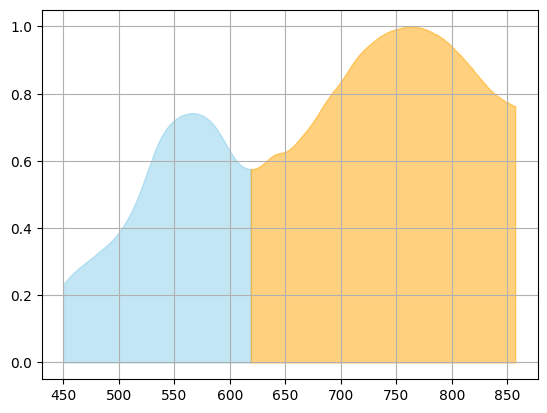

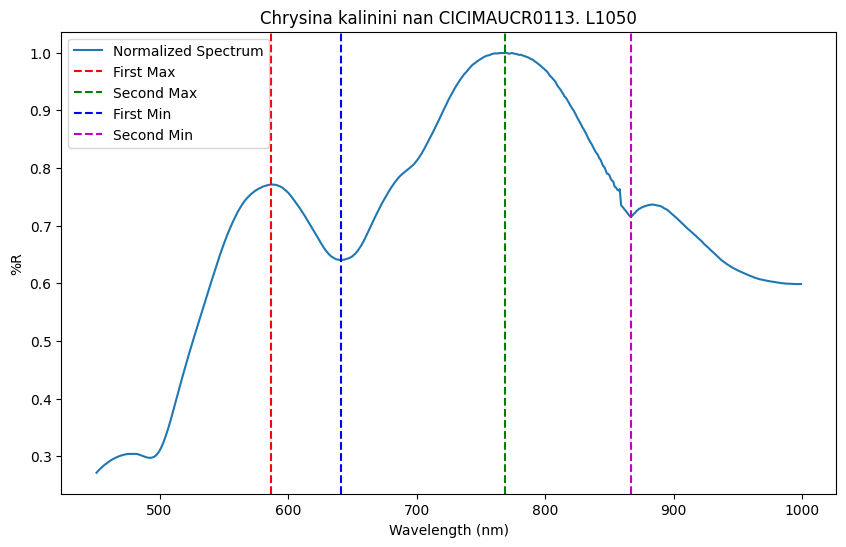

min wav 450.0 max_wav 1000.0
get_minima: max_val=67.1612, 
                  bottom_thr=0.0, top_thr=67.1612, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.2271780779145143
PLOTTING
Getting equipment. Spectrum


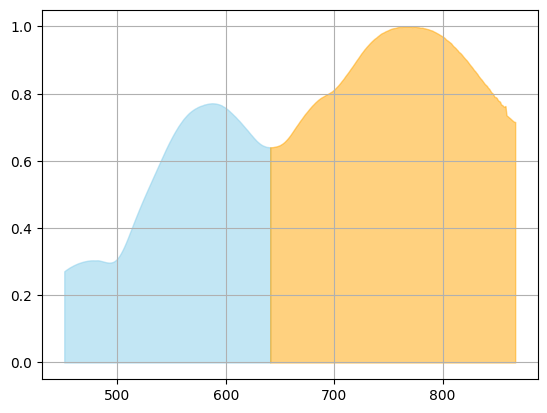

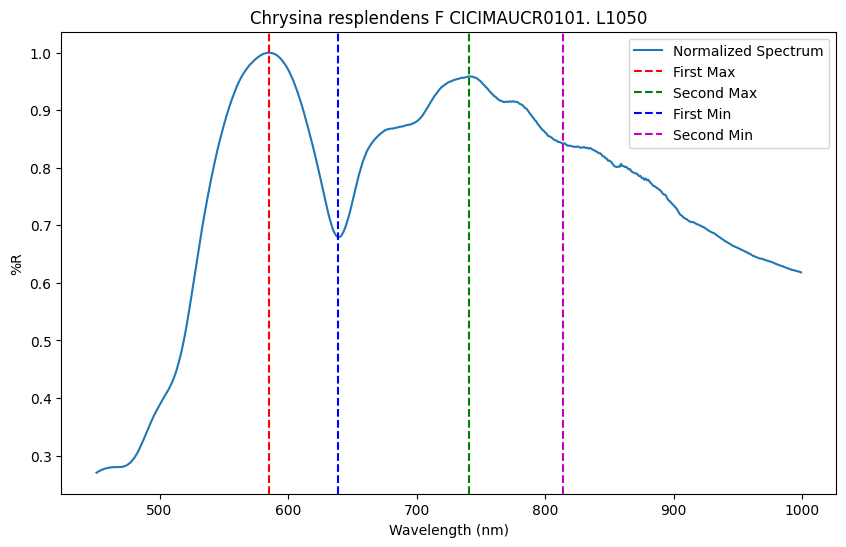

min wav 450.0 max_wav 1000.0
get_minima: max_val=50.734972, 
                  bottom_thr=0.0, top_thr=50.734972, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.6681773372661526
PLOTTING
Getting equipment. Spectrum


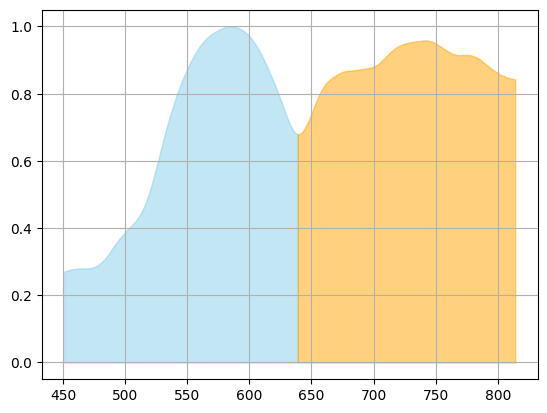

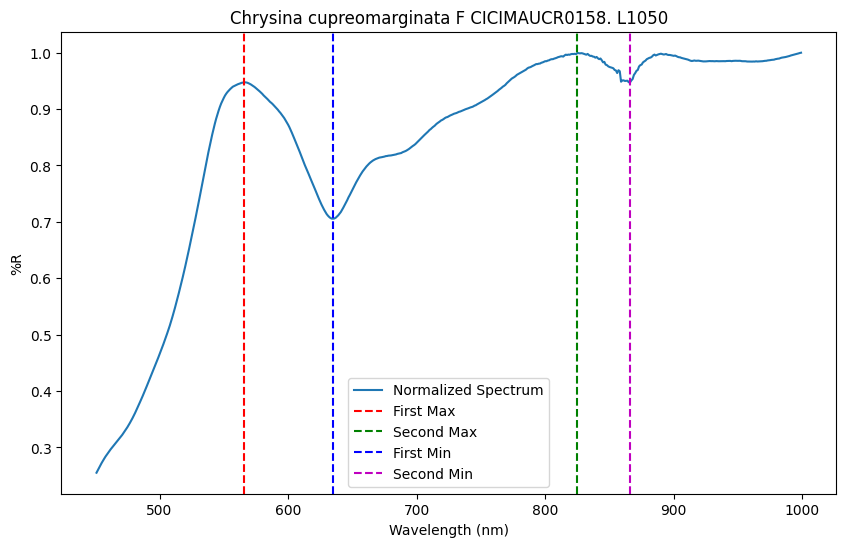

min wav 450.0 max_wav 1000.0
get_minima: max_val=49.421255, 
                  bottom_thr=0.0, top_thr=49.421255, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.2576711685811488
PLOTTING
Getting equipment. Spectrum


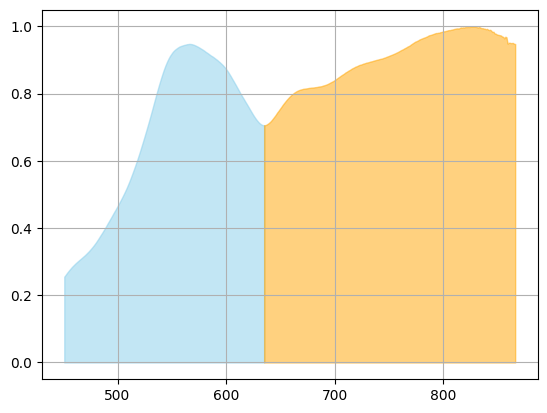

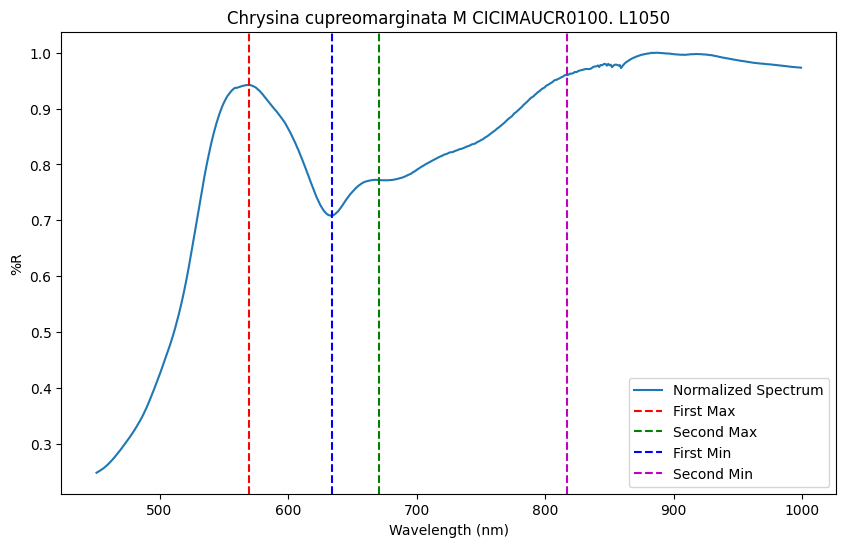

min wav 450.0 max_wav 1000.0
get_minima: max_val=78.41141999999999, 
                  bottom_thr=0.0, top_thr=78.41141999999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.9754278673175714
PLOTTING
Getting equipment. Spectrum


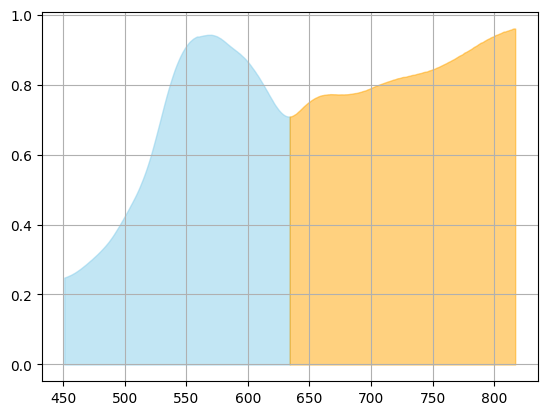

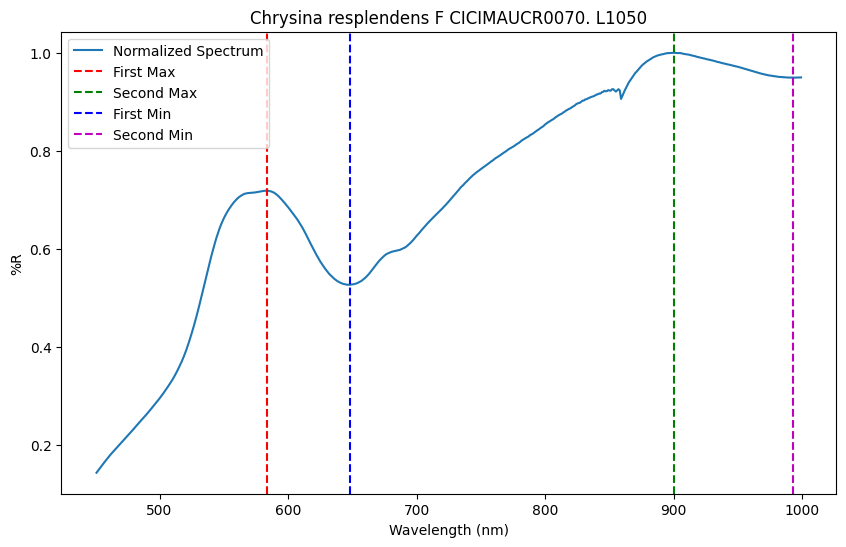

min wav 450.0 max_wav 1000.0
get_minima: max_val=61.15786700000001, 
                  bottom_thr=0.0, top_thr=61.15786700000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.3081423496446232
PLOTTING
Getting equipment. Spectrum


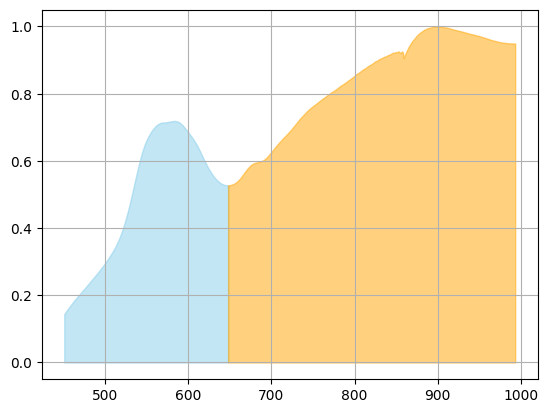

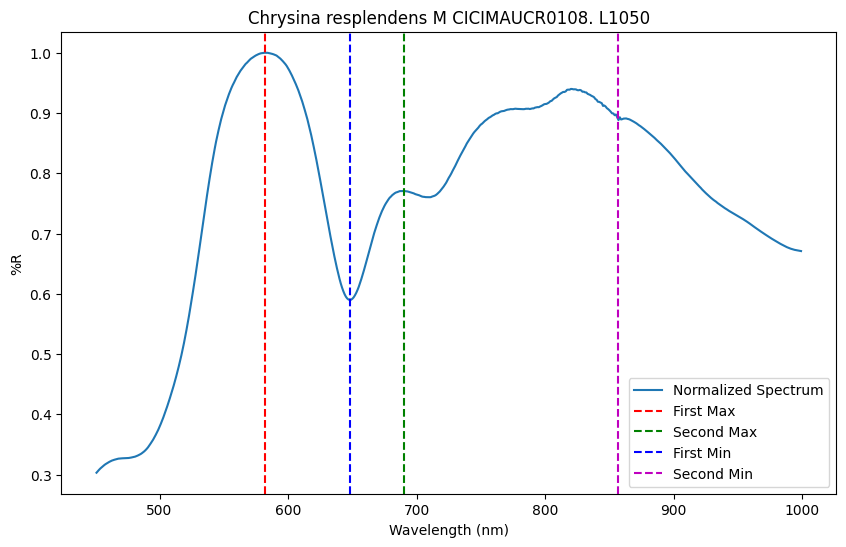

min wav 450.0 max_wav 1000.0
get_minima: max_val=71.3047, 
                  bottom_thr=0.0, top_thr=71.3047, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.0067047292470206
PLOTTING
Getting equipment. Spectrum


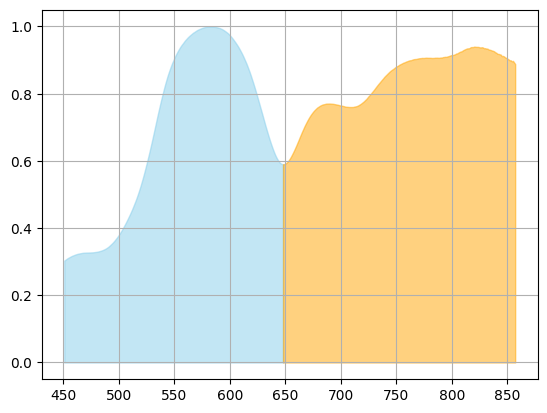

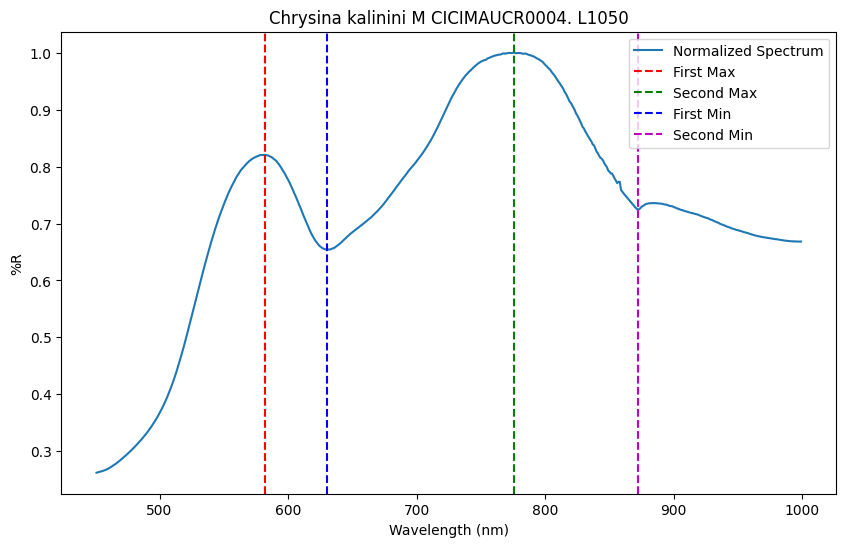

min wav 450.0 max_wav 1000.0
get_minima: max_val=66.855167, 
                  bottom_thr=0.0, top_thr=66.855167, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.8361360855100781
PLOTTING
Getting equipment. Spectrum


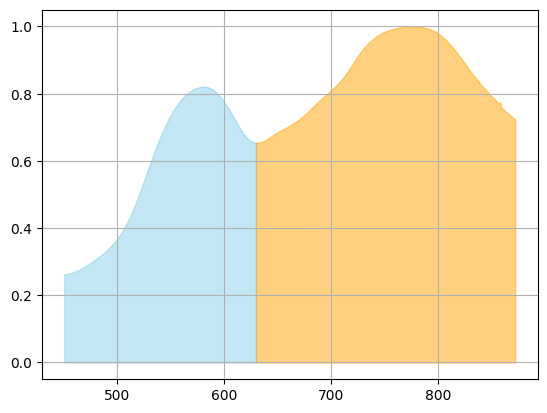

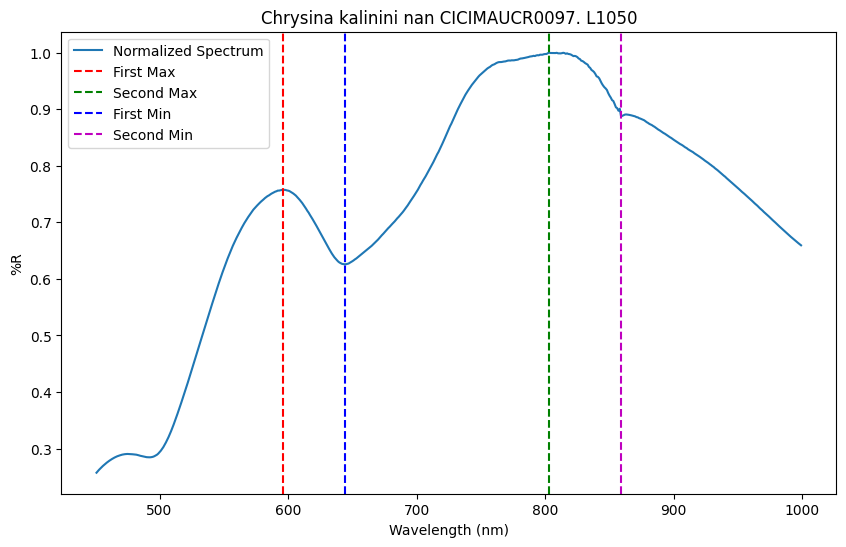

min wav 450.0 max_wav 1000.0
get_minima: max_val=15.560224000000002, 
                  bottom_thr=0.0, top_thr=15.560224000000002, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 0.8620911385634663
PLOTTING
Getting equipment. Spectrum


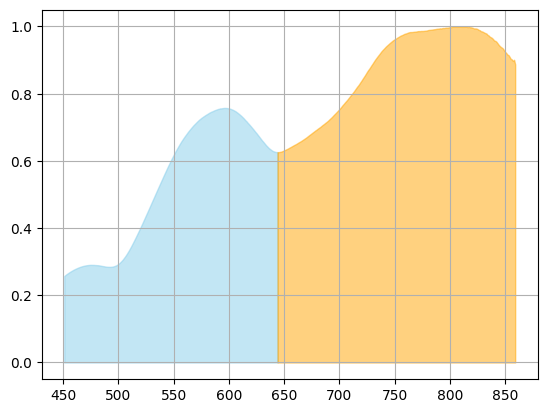

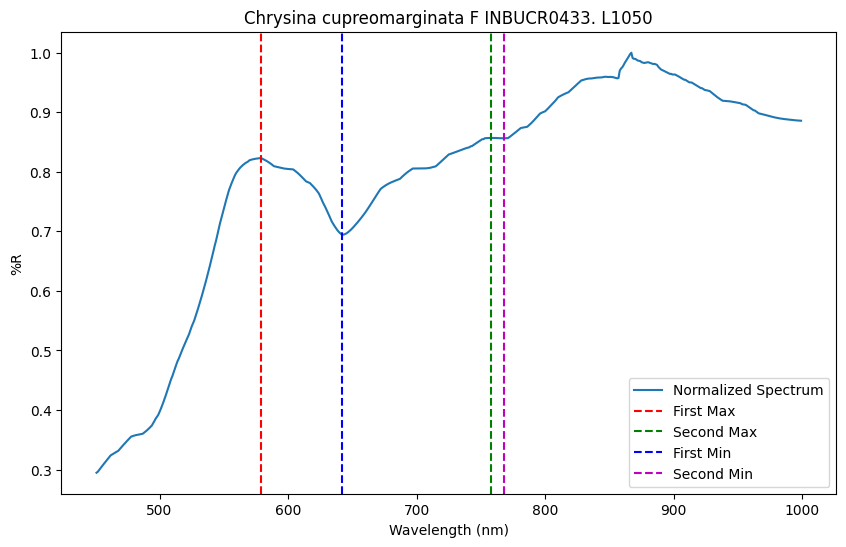

min wav 450.0 max_wav 1000.0
get_minima: max_val=46.201066999999995, 
                  bottom_thr=0.0, top_thr=46.201066999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 3.639869470013371
PLOTTING
Getting equipment. Spectrum


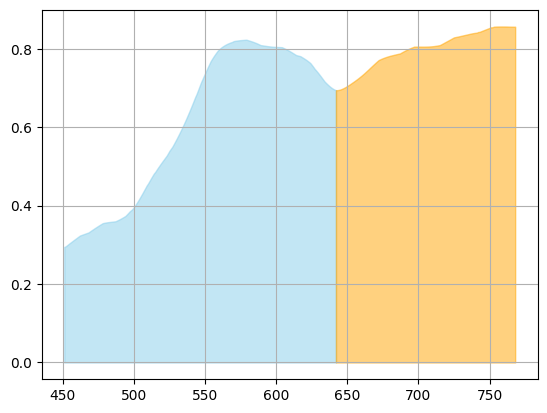

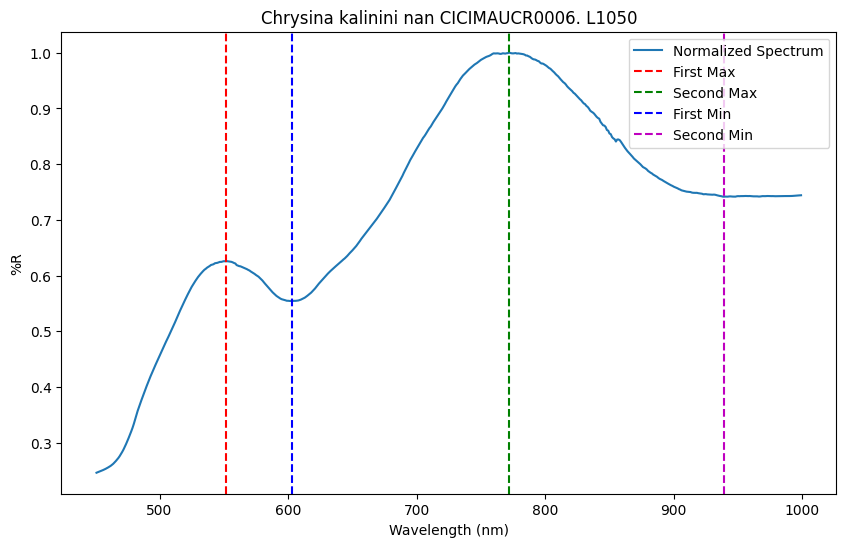

min wav 450.0 max_wav 1000.0
get_minima: max_val=37.615502, 
                  bottom_thr=0.0, top_thr=37.615502, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.0251265356685417
PLOTTING
Getting equipment. Spectrum


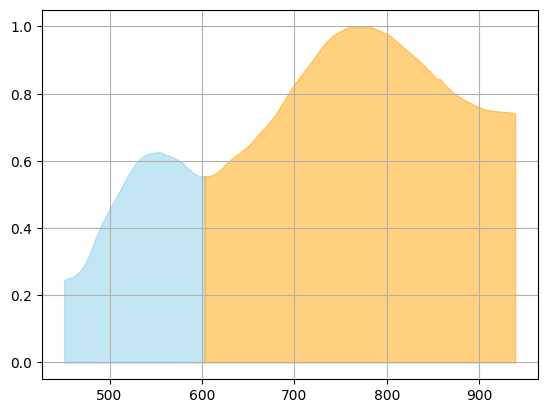

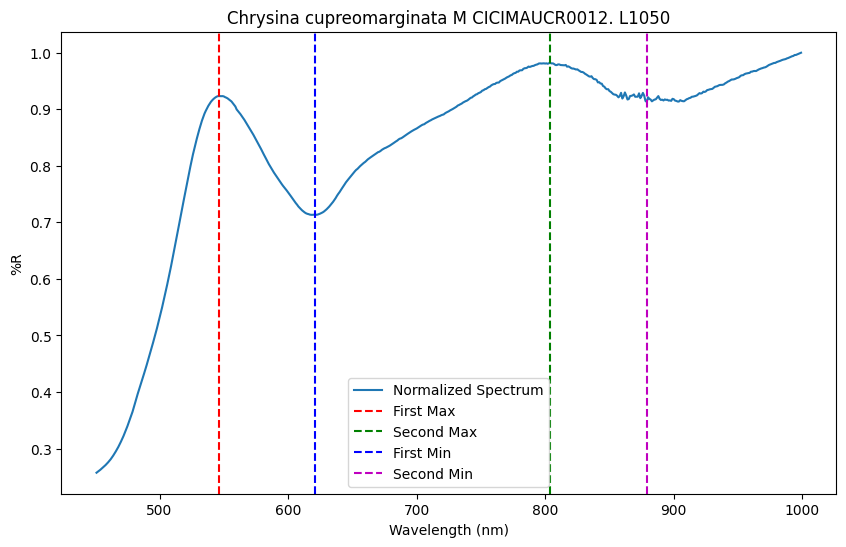

min wav 450.0 max_wav 1000.0
get_minima: max_val=55.395157, 
                  bottom_thr=0.0, top_thr=55.395157, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 1.5406974399172866
PLOTTING
Getting equipment. Spectrum


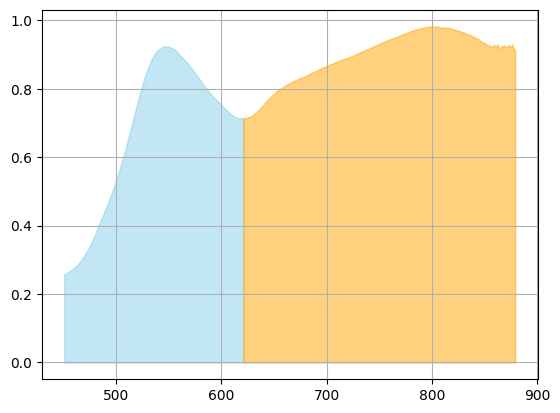

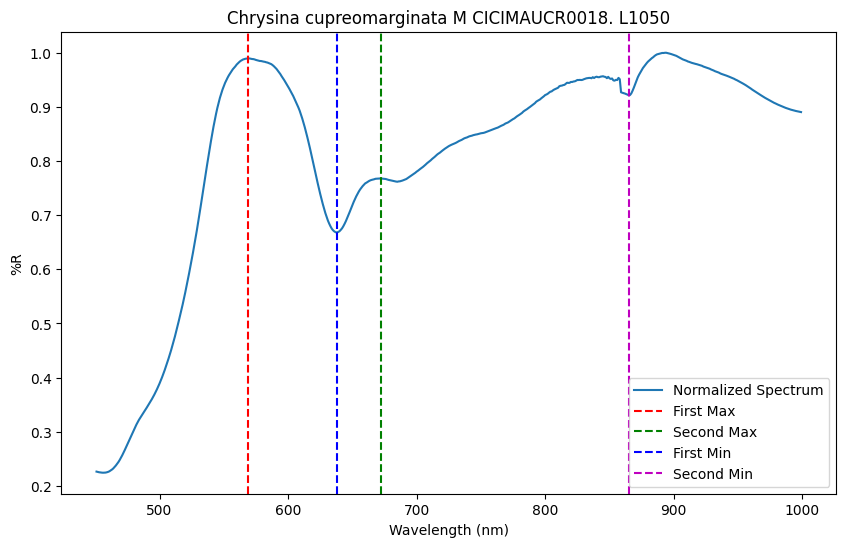

min wav 450.0 max_wav 1000.0
get_minima: max_val=70.804767, 
                  bottom_thr=0.0, top_thr=70.804767, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.2306202276245575
PLOTTING
Getting equipment. Spectrum


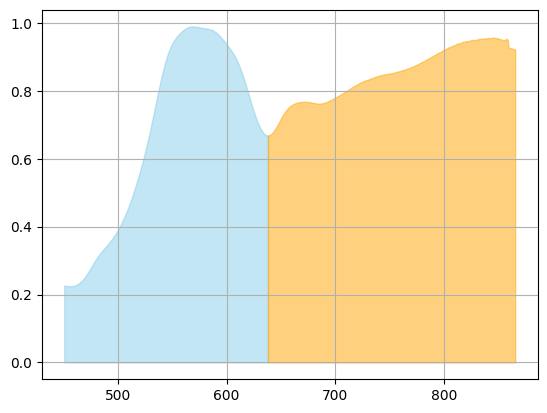

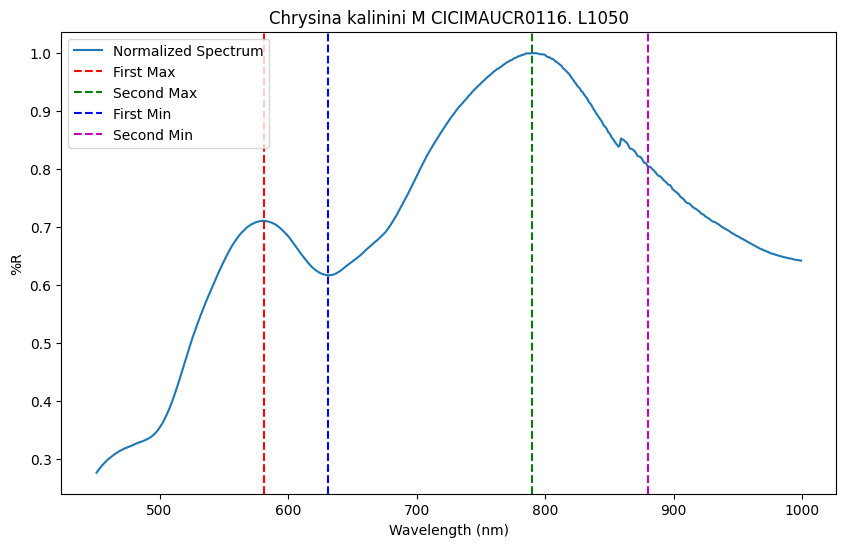

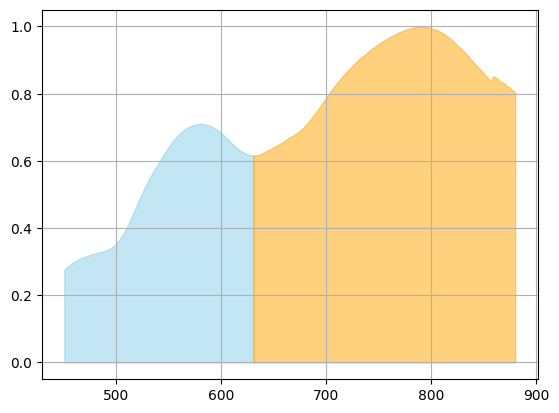

In [15]:
gamma_area_under_curve_first_min_cut_data = feature_and_label_extractor(Metric = Gamma_Area_Under_Curve_First_Min_Cut, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)

#print(gamma_area_under_curve_first_min_cut_data)

#### Gamma_Vector_Relative_Reflectance

Getting equipment. Spectrum


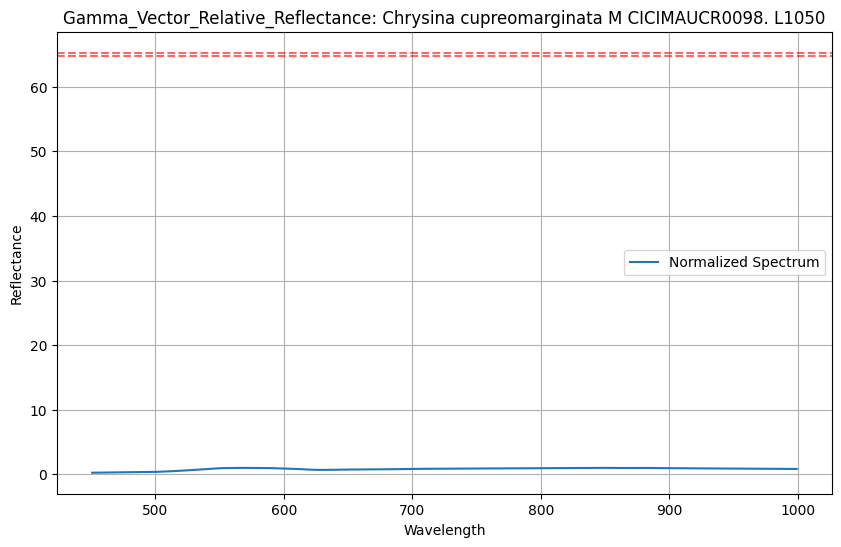

Getting equipment. Spectrum


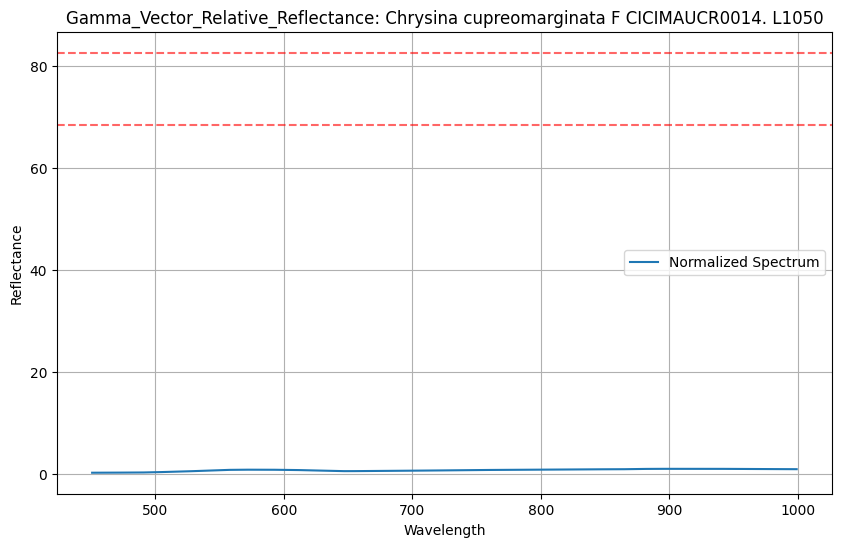

Getting equipment. Spectrum


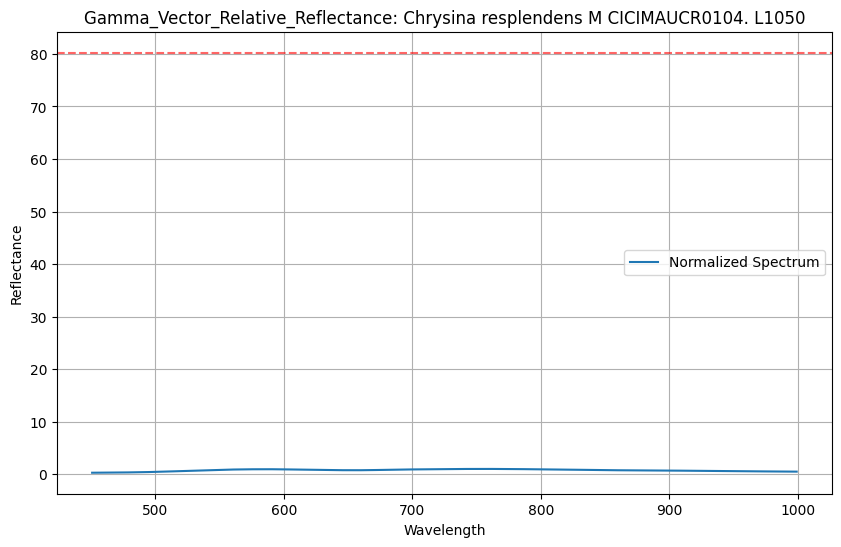

Getting equipment. Spectrum


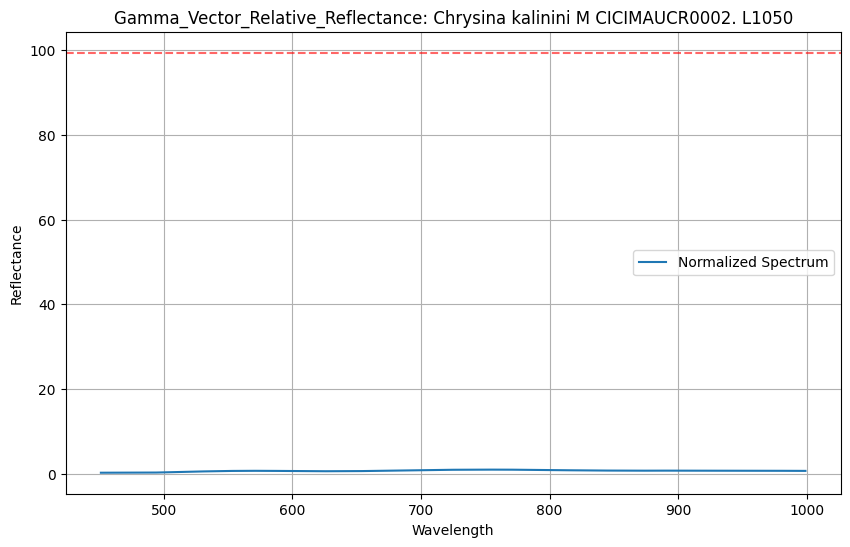

Getting equipment. Spectrum


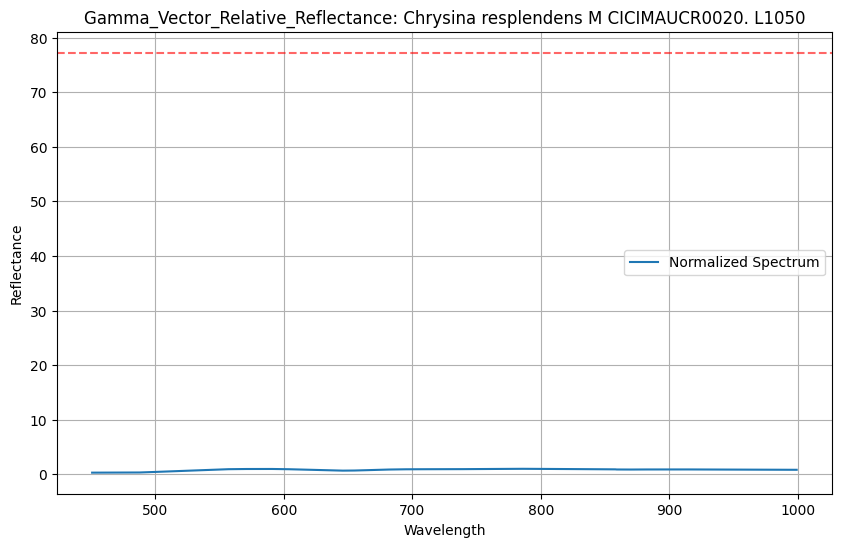

Getting equipment. Spectrum


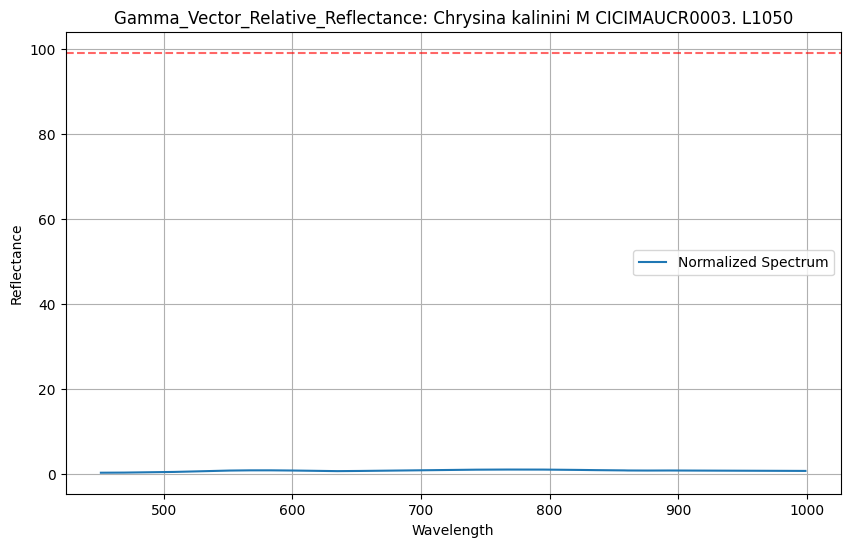

Getting equipment. Spectrum


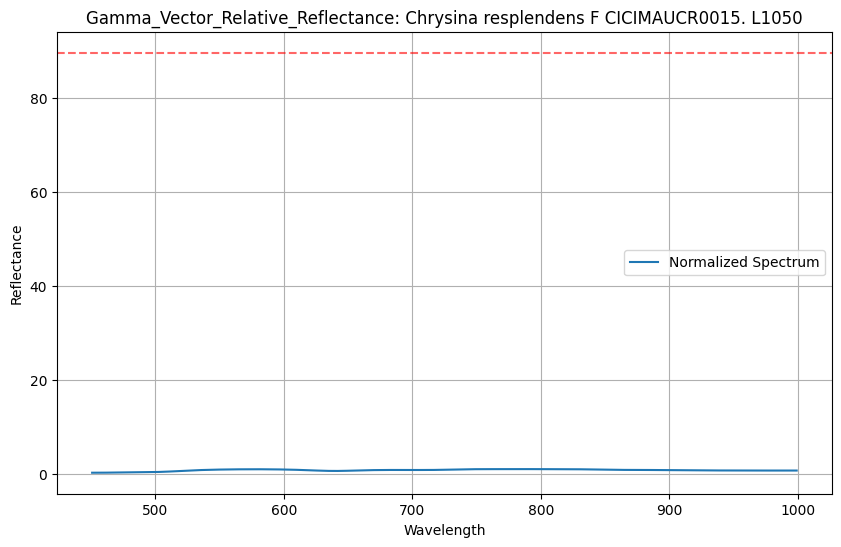

Getting equipment. Spectrum


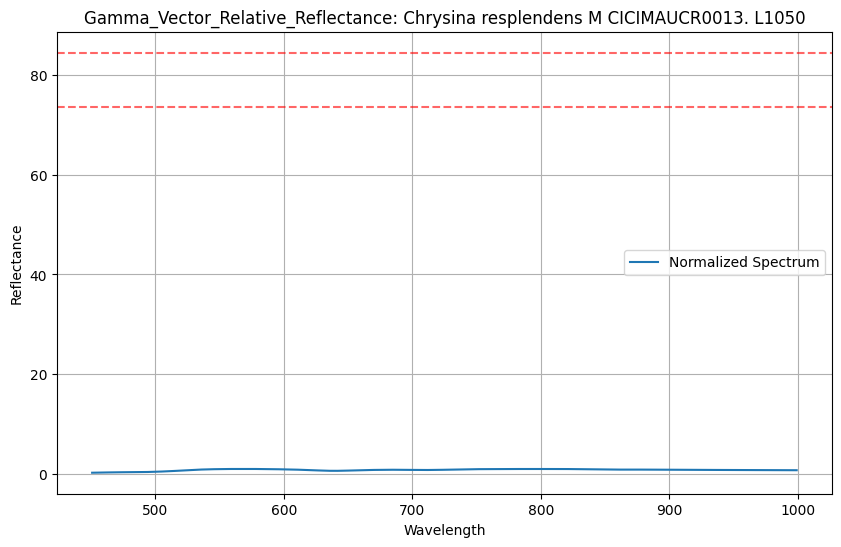

Getting equipment. Spectrum


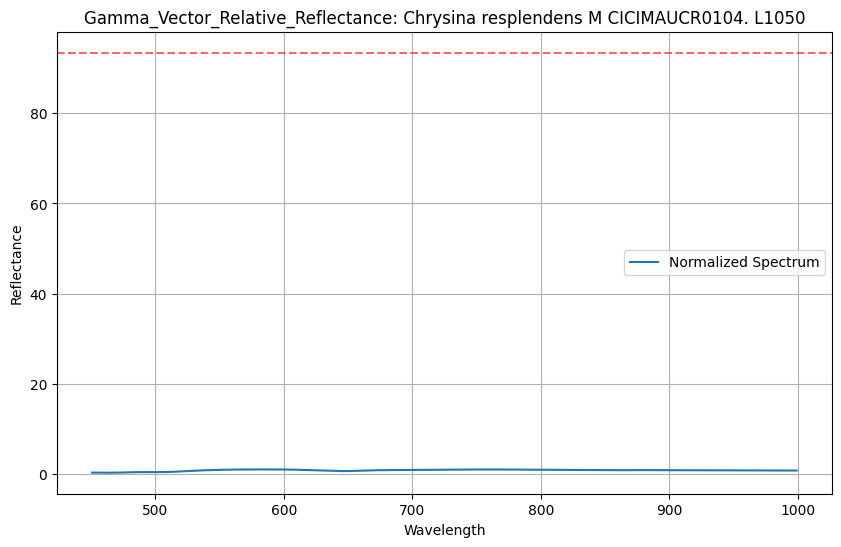

Getting equipment. Spectrum


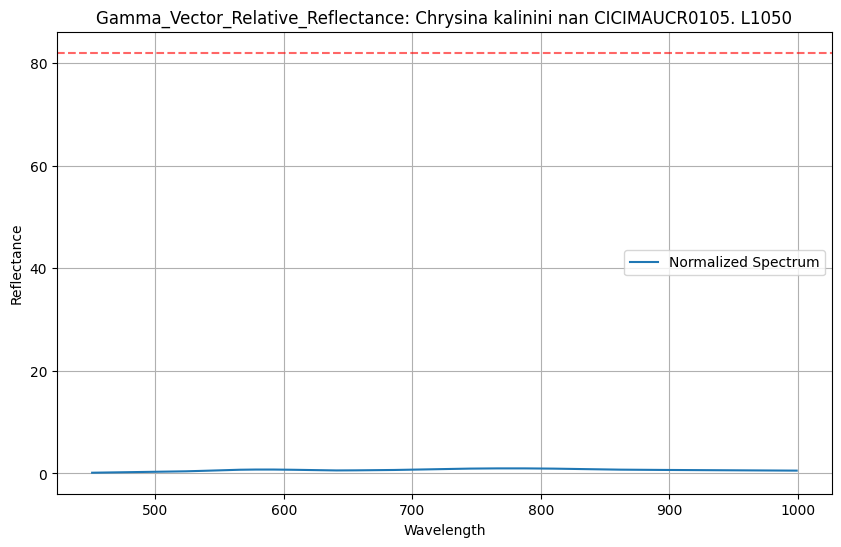

Getting equipment. Spectrum


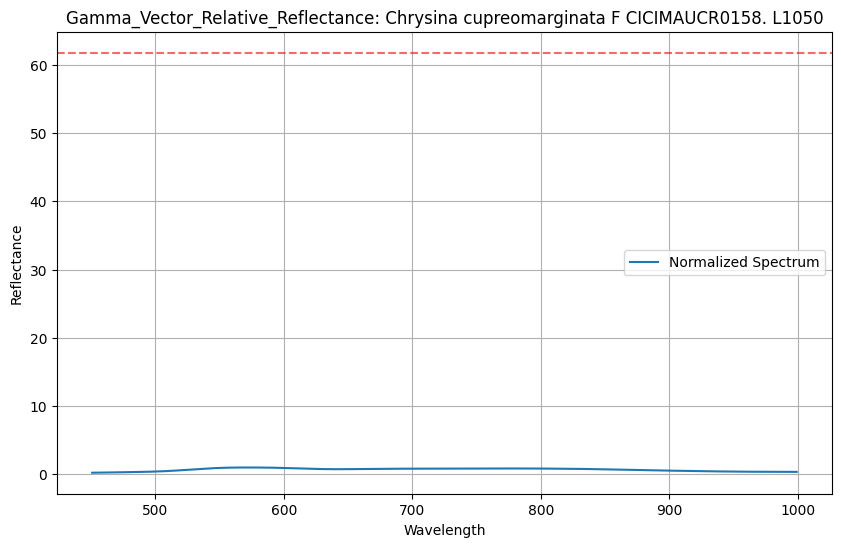

Getting equipment. Spectrum


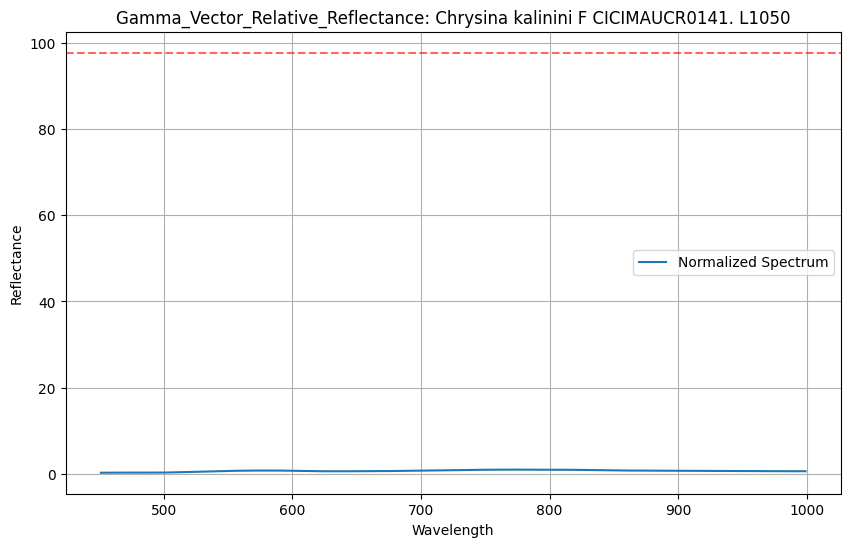

Getting equipment. Spectrum


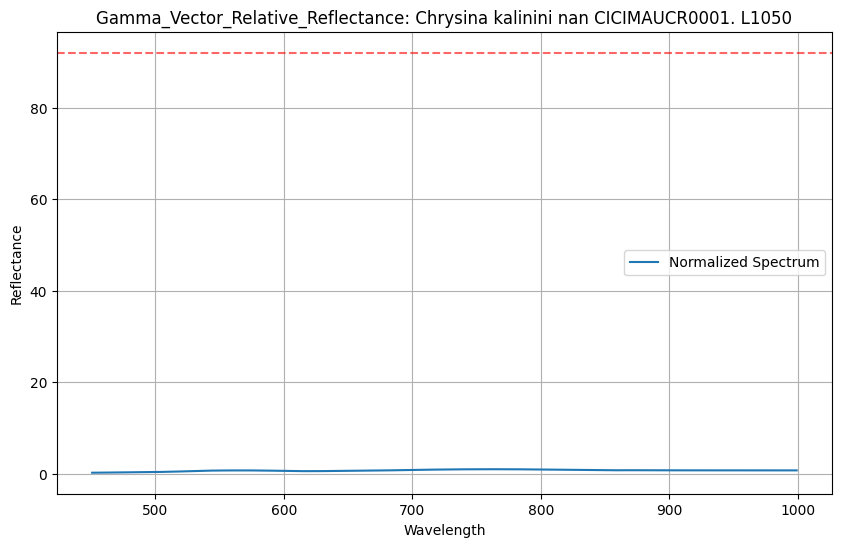

Getting equipment. Spectrum


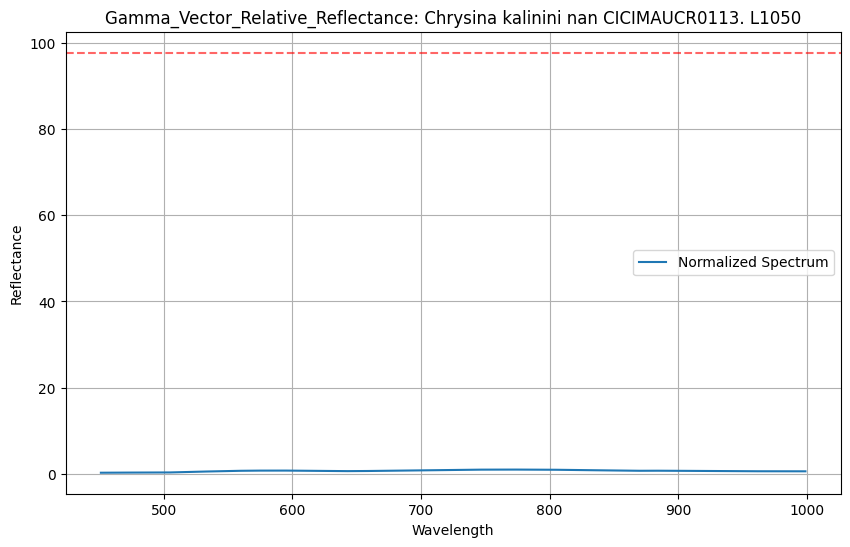

Getting equipment. Spectrum


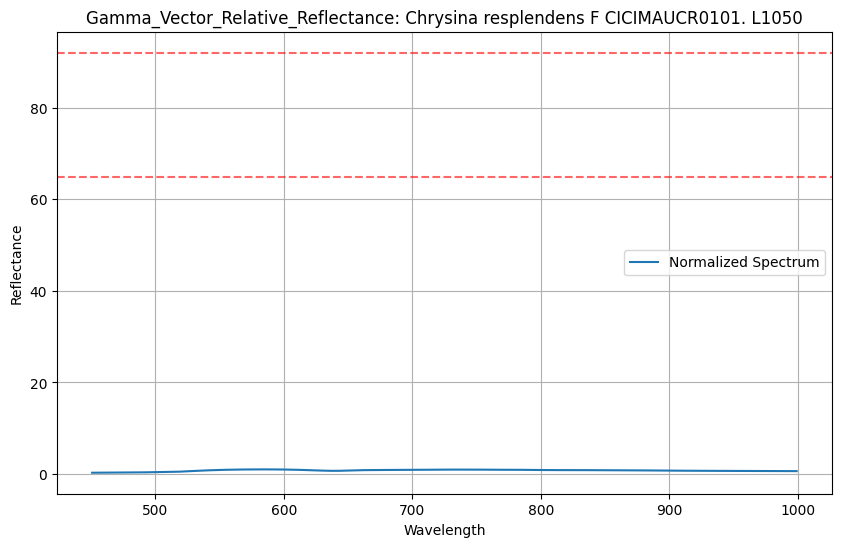

Getting equipment. Spectrum


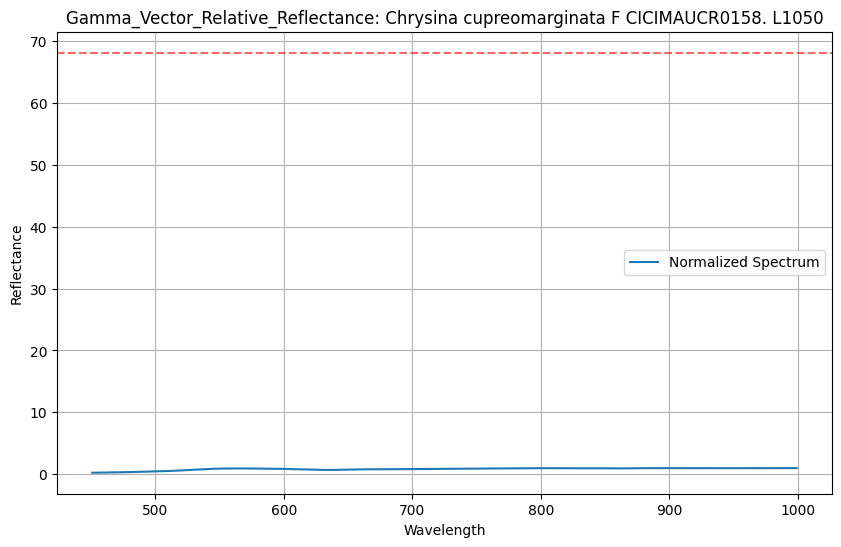

Getting equipment. Spectrum


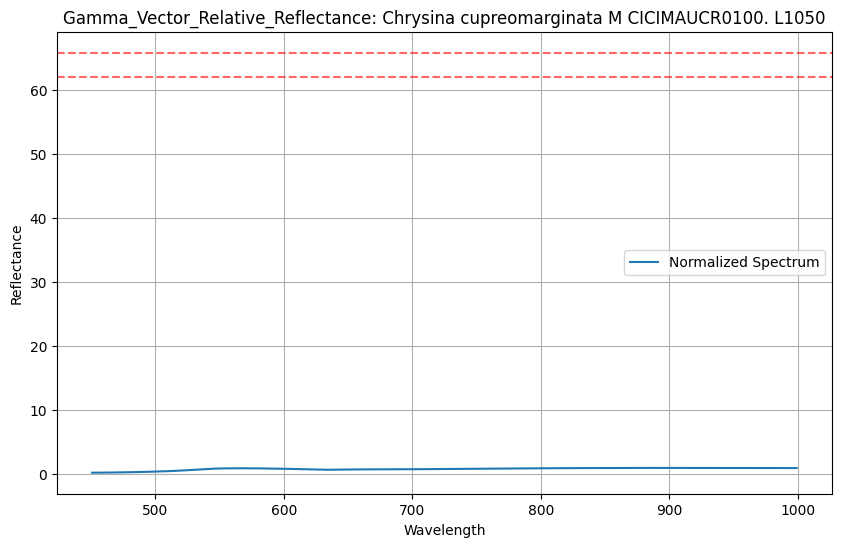

Getting equipment. Spectrum


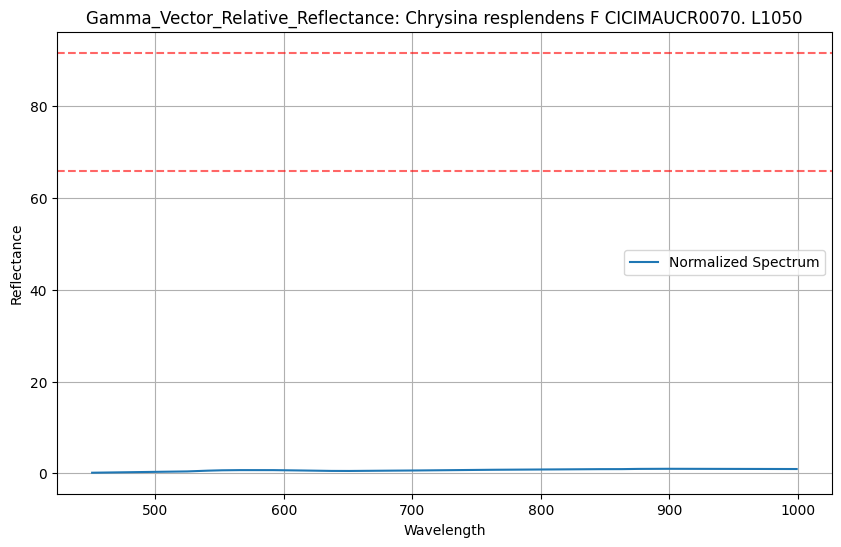

Getting equipment. Spectrum


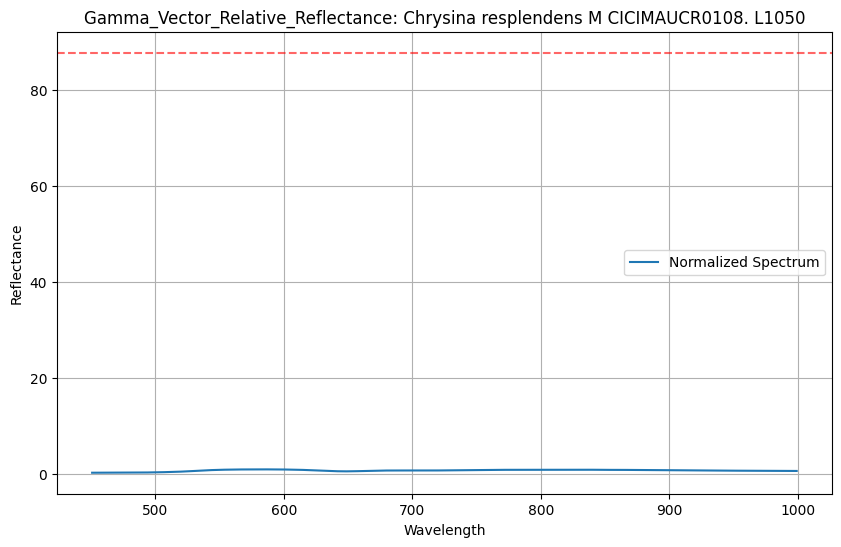

Getting equipment. Spectrum


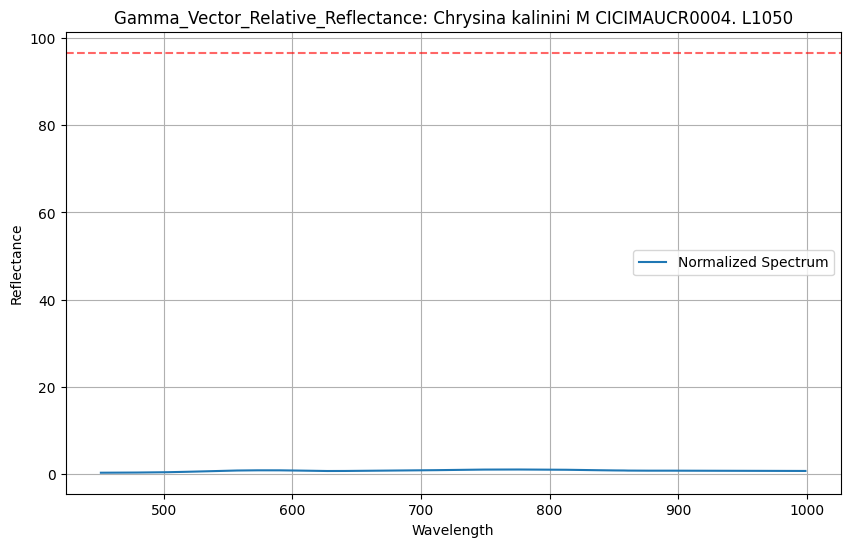

Getting equipment. Spectrum


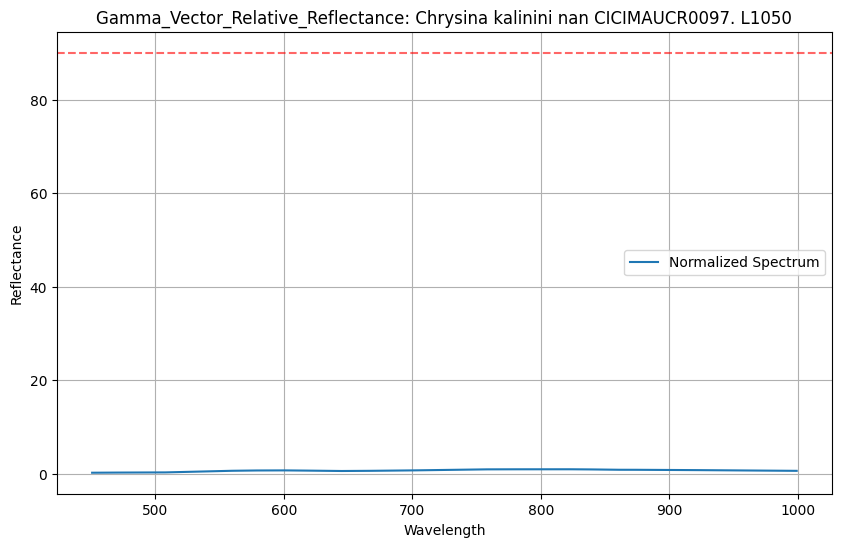

Getting equipment. Spectrum


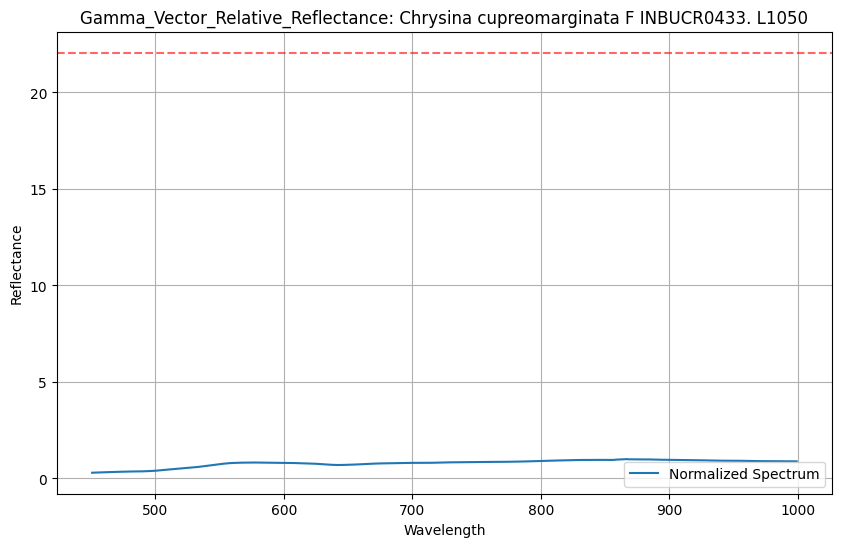

Getting equipment. Spectrum


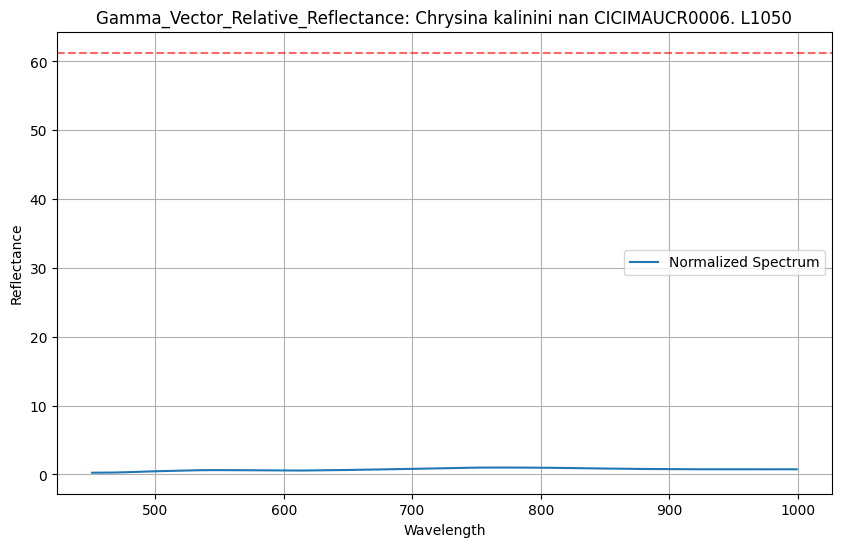

Getting equipment. Spectrum


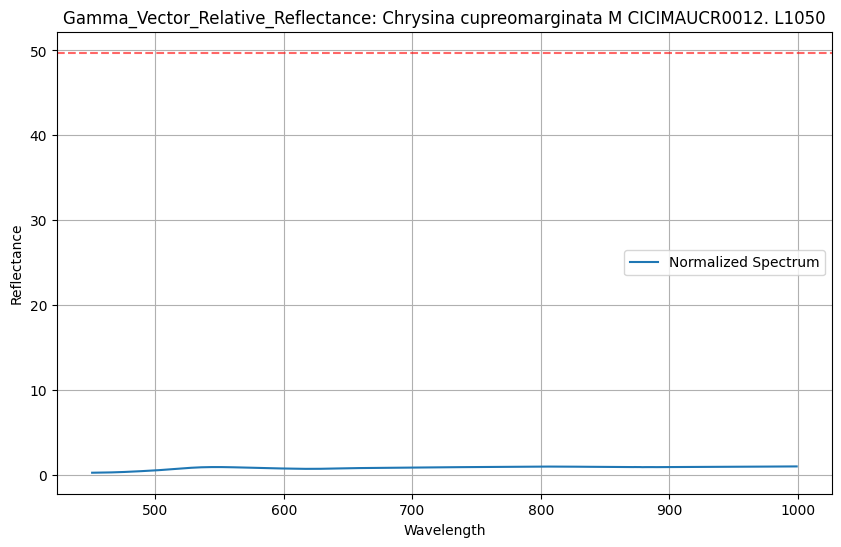

Getting equipment. Spectrum


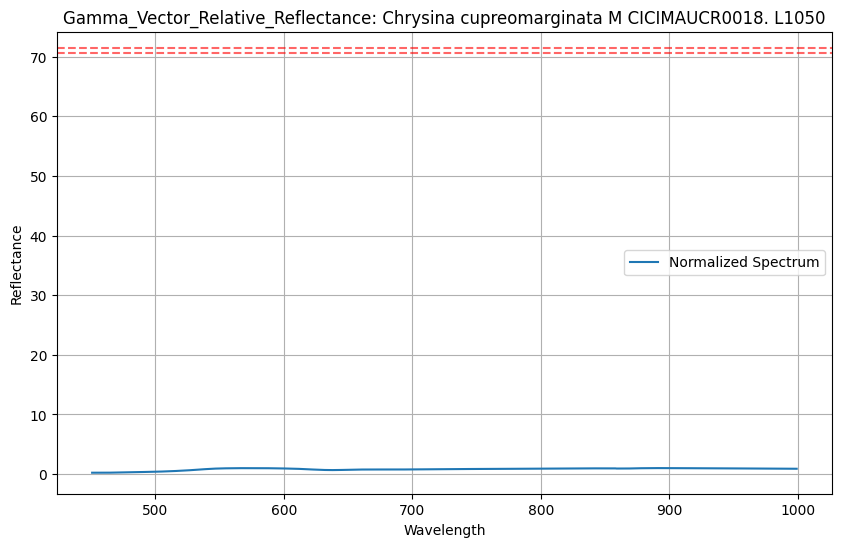

Getting equipment. Spectrum


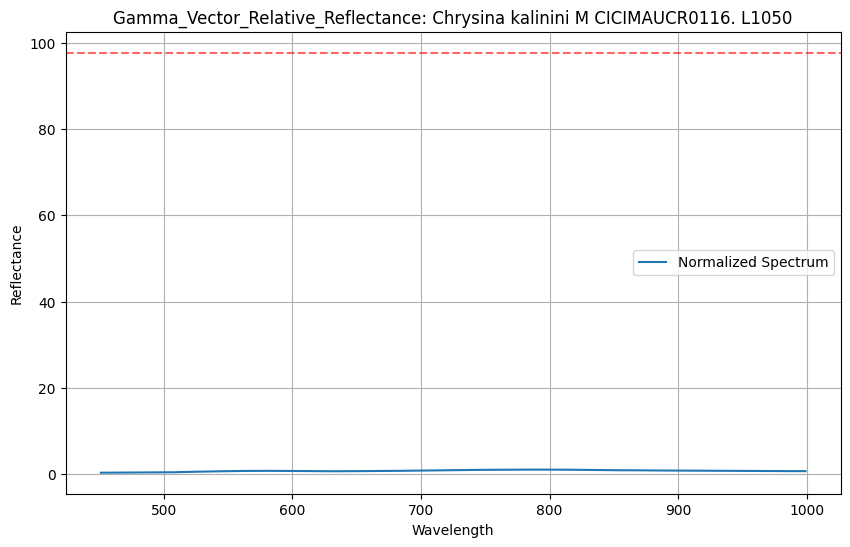

In [16]:
gamma_vector_relative_reflectance_data = feature_and_label_extractor(Metric = Gamma_Vector_Relative_Reflectance, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = True,
                                                          collection_list = training_collection_list,
                                                          plot = True)


#print(gamma_vector_relative_reflectance_data)


#### Critical points Golden

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


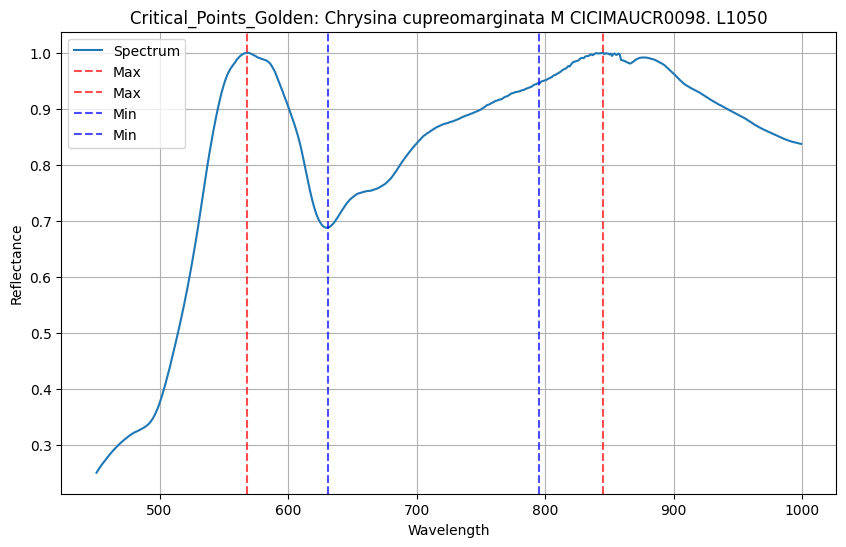

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


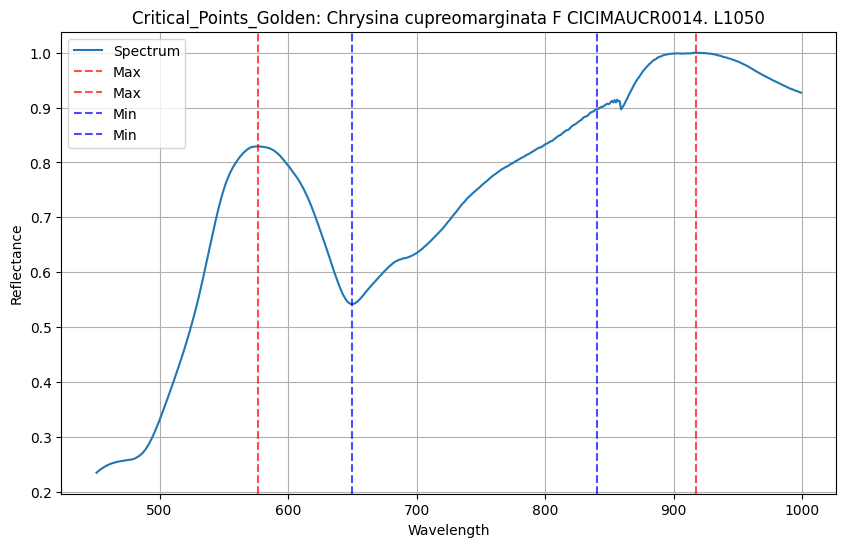

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


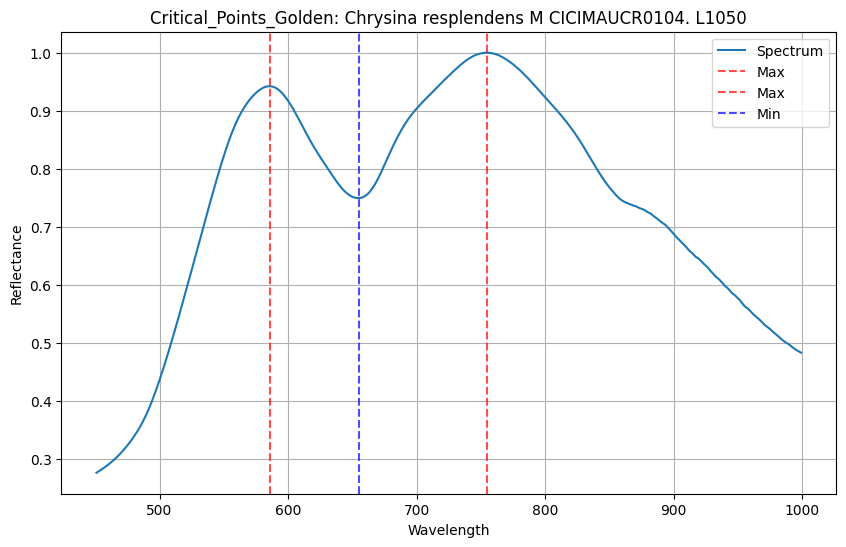

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


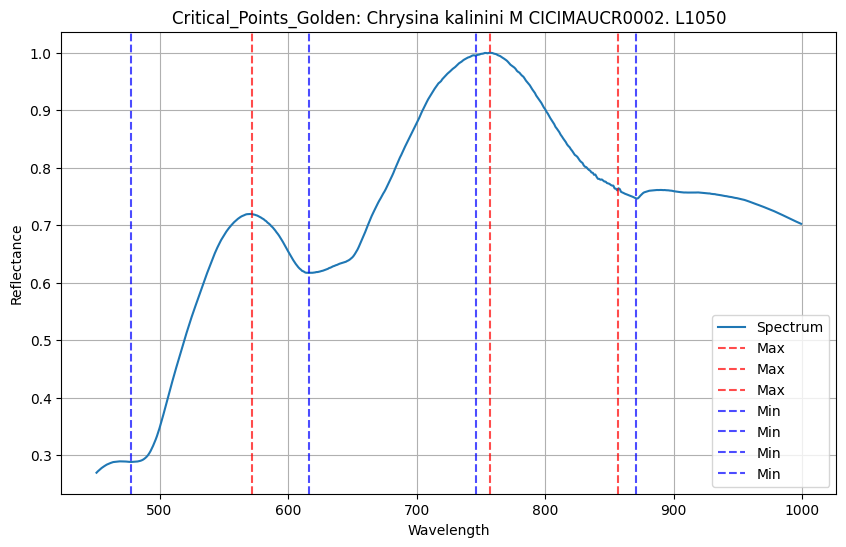

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bottom_thr=0.0, top_thr=55.50916000000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


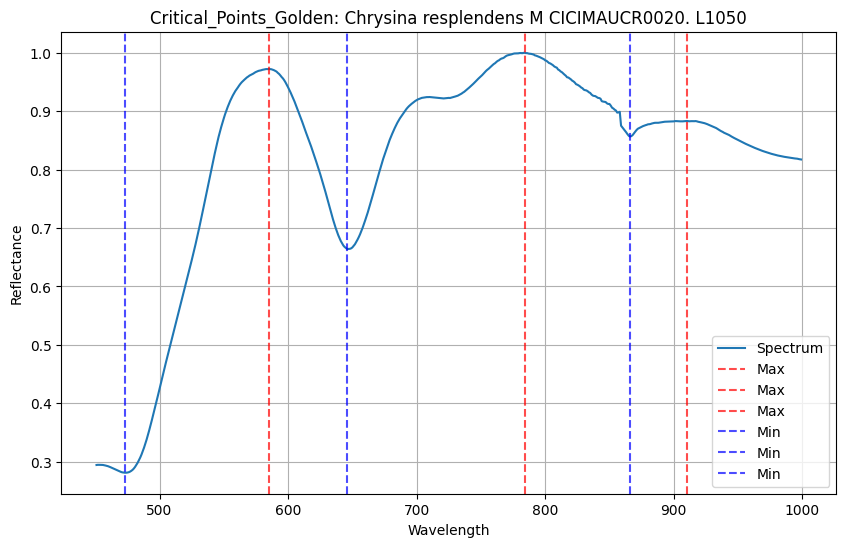

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=74.529467, 
                  bottom_thr=0.0, top_thr=74.529467, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


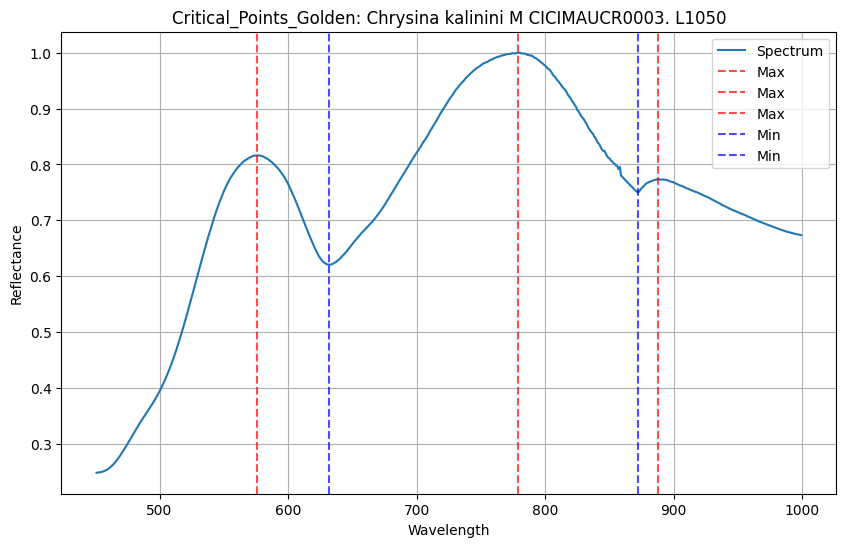

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.777667, 
                  bottom_thr=0.0, top_thr=68.777667, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


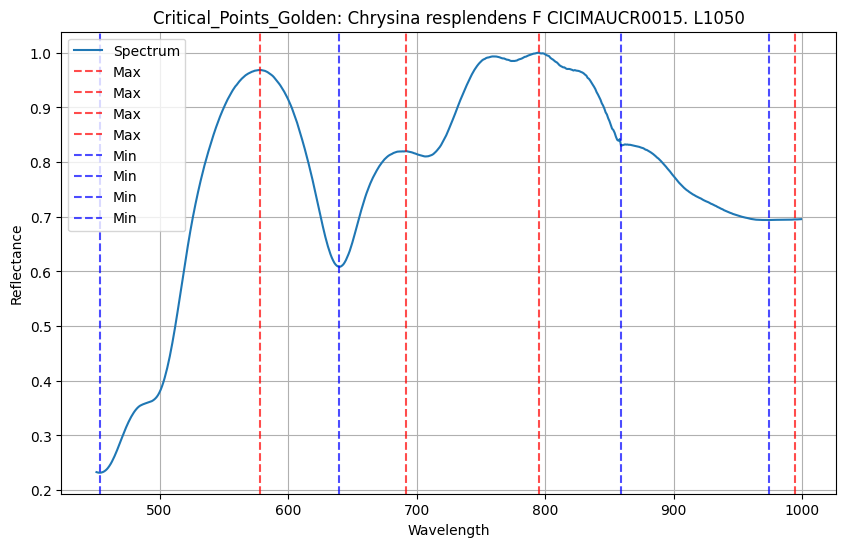

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=64.1527, 
                  bottom_thr=0.0, top_thr=64.1527, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


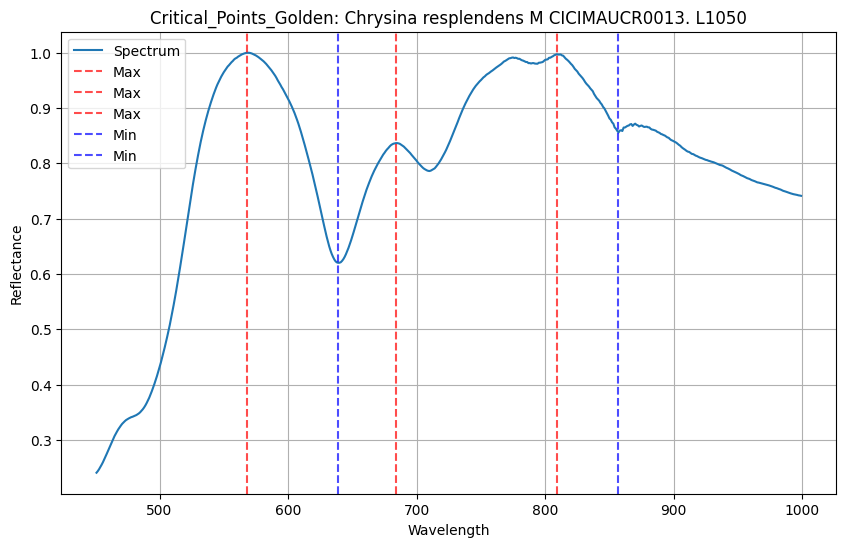

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.632466, 
                  bottom_thr=0.0, top_thr=68.632466, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


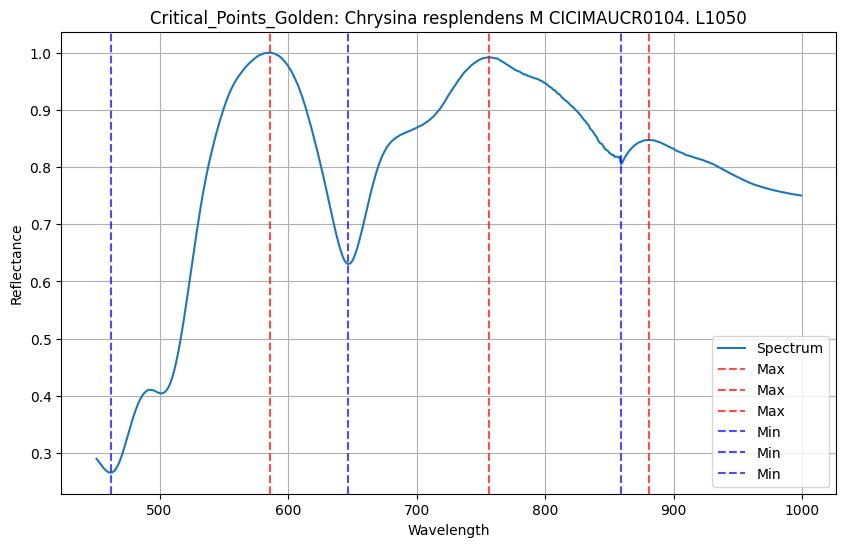

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=69.614549, 
                  bottom_thr=0.0, top_thr=69.614549, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


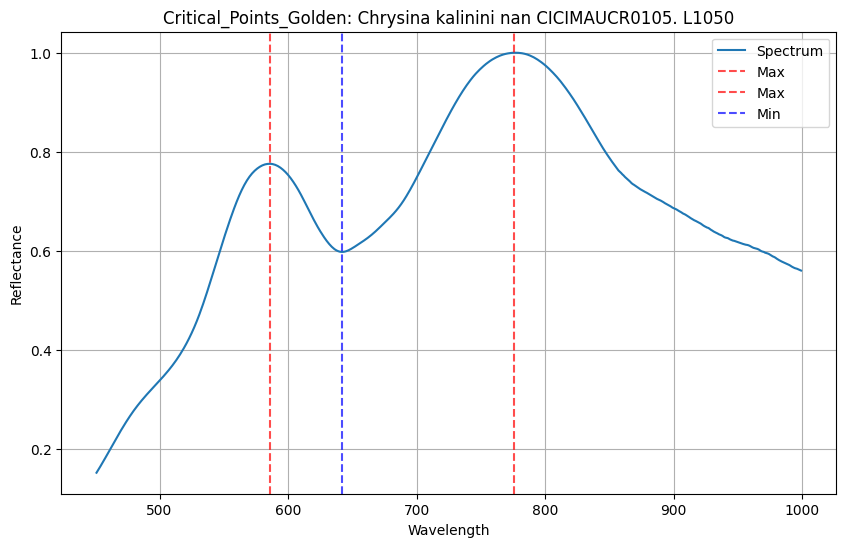

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=47.391498999999996, 
                  bottom_thr=0.0, top_thr=47.391498999999996, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


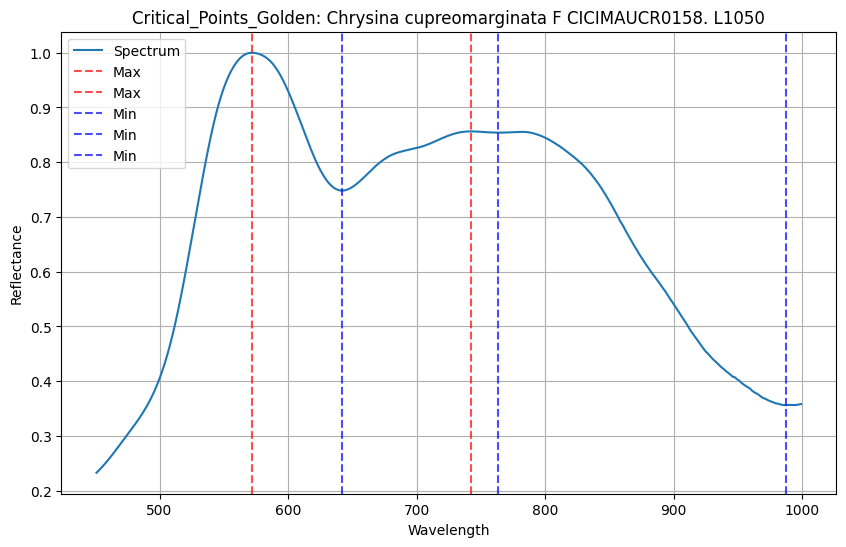

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.071434, 
                  bottom_thr=0.0, top_thr=70.071434, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


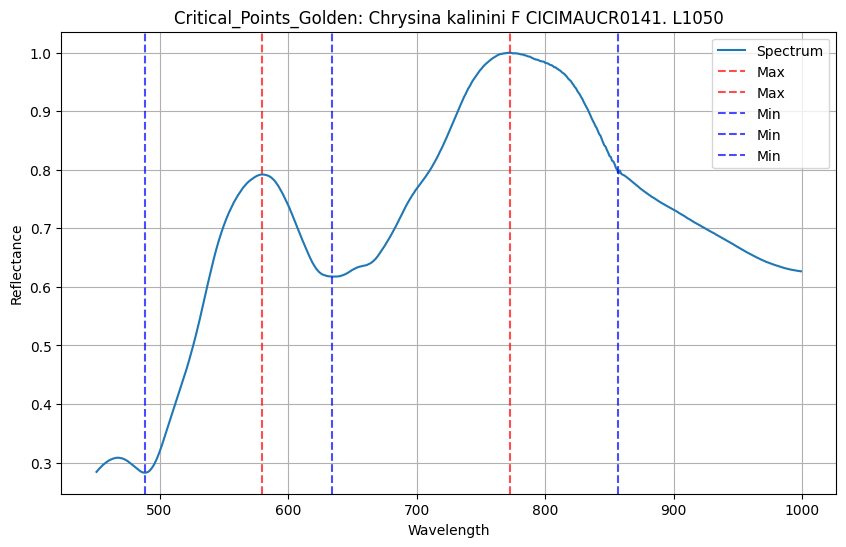

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.30927499999999, 
                  bottom_thr=0.0, top_thr=70.30927499999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


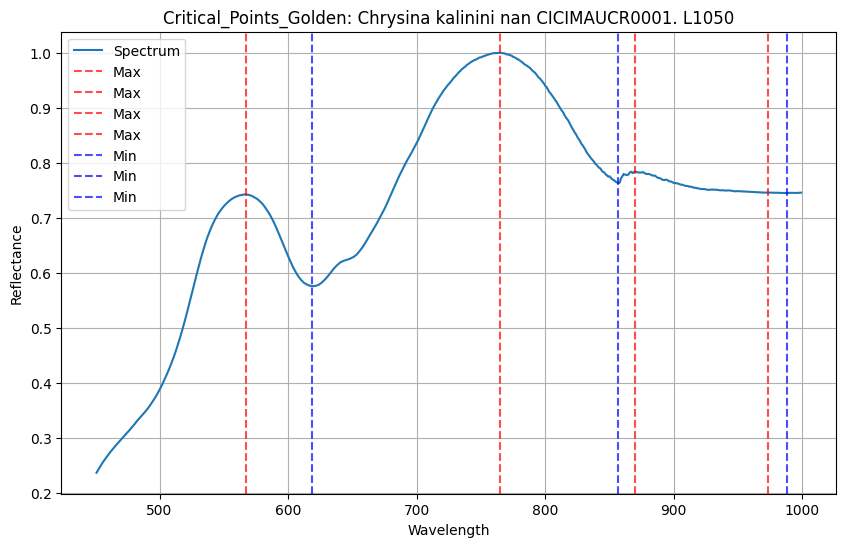

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.173166, 
                  bottom_thr=0.0, top_thr=71.173166, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


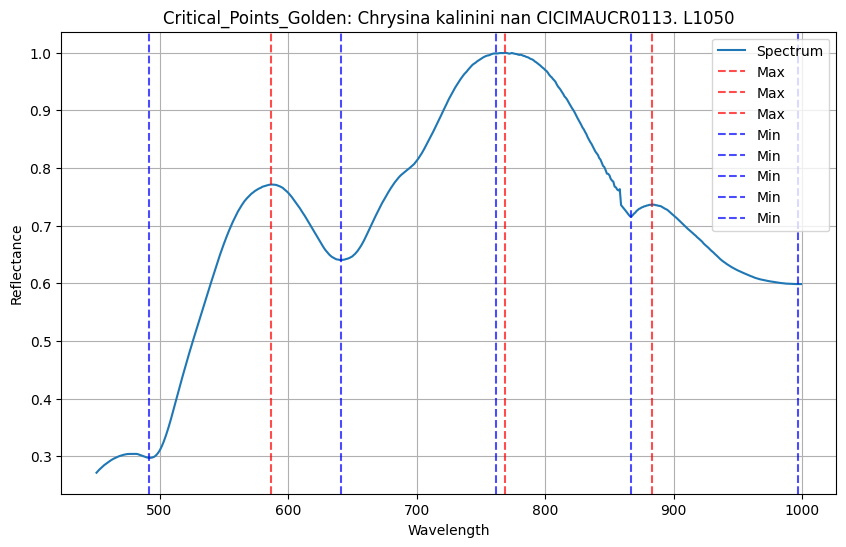

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=67.1612, 
                  bottom_thr=0.0, top_thr=67.1612, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


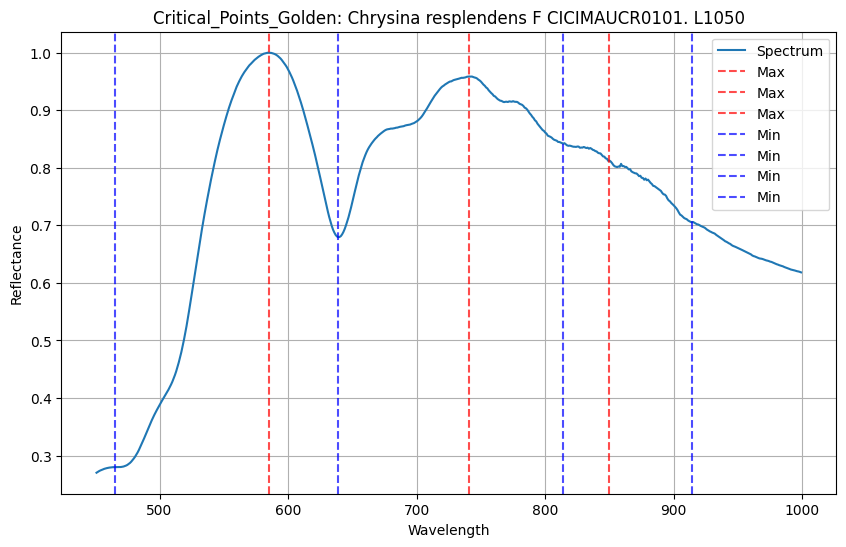

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=50.734972, 
                  bottom_thr=0.0, top_thr=50.734972, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


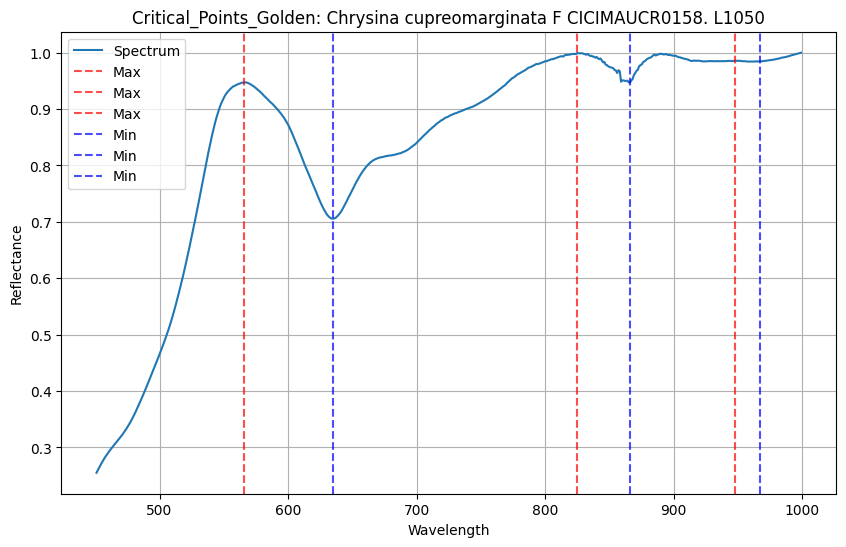

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=49.421255, 
                  bottom_thr=0.0, top_thr=49.421255, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


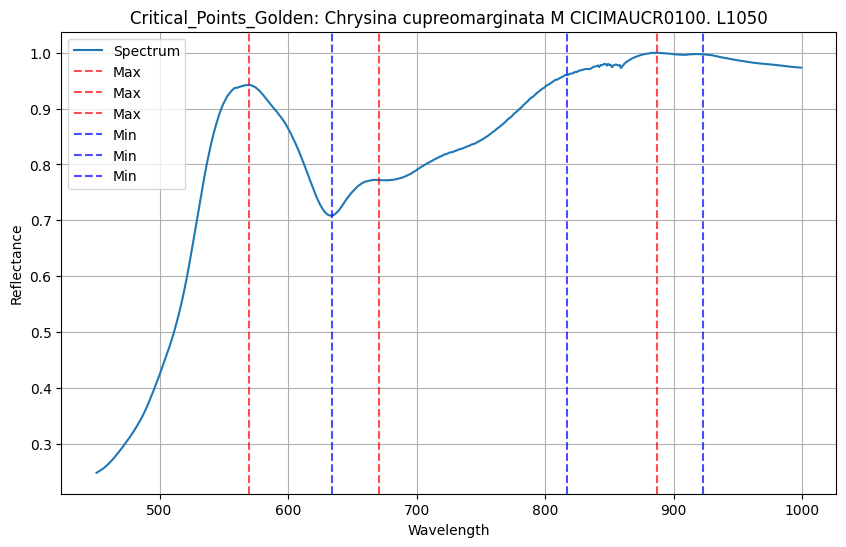

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=78.41141999999999, 
                  bottom_thr=0.0, top_thr=78.41141999999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


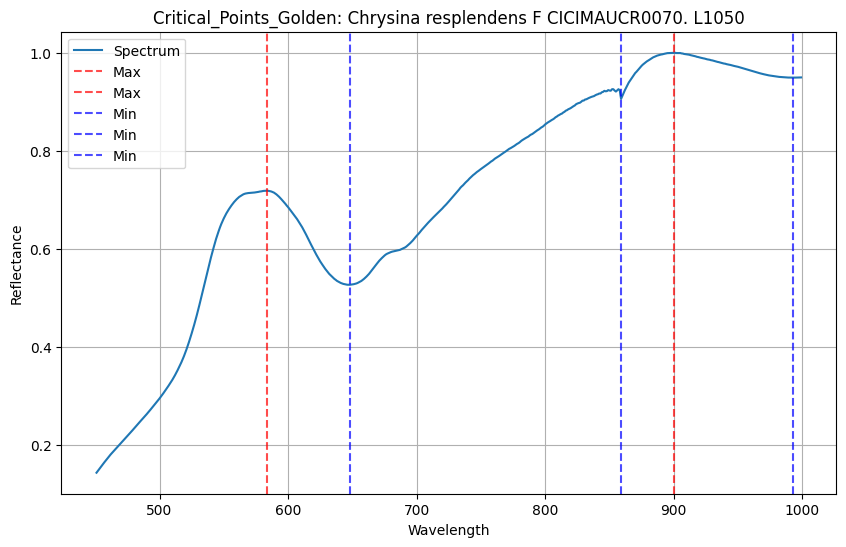

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=61.15786700000001, 
                  bottom_thr=0.0, top_thr=61.15786700000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


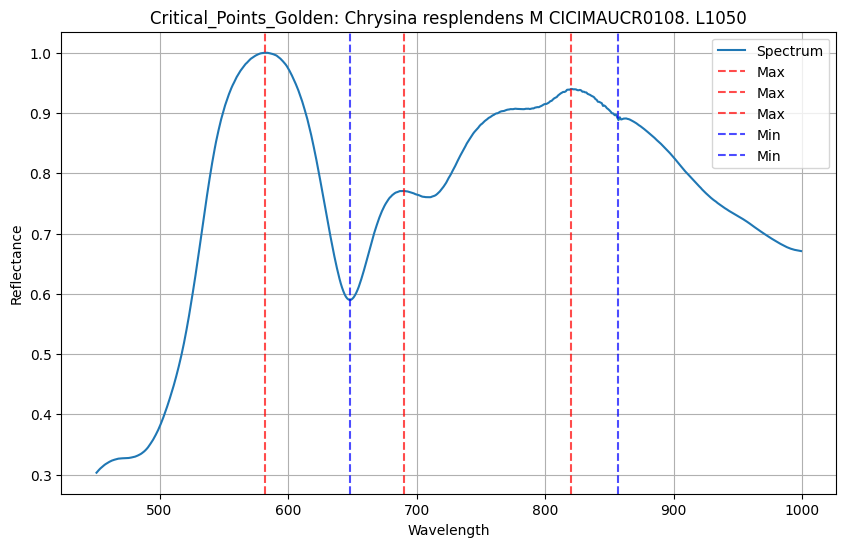

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.3047, 
                  bottom_thr=0.0, top_thr=71.3047, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


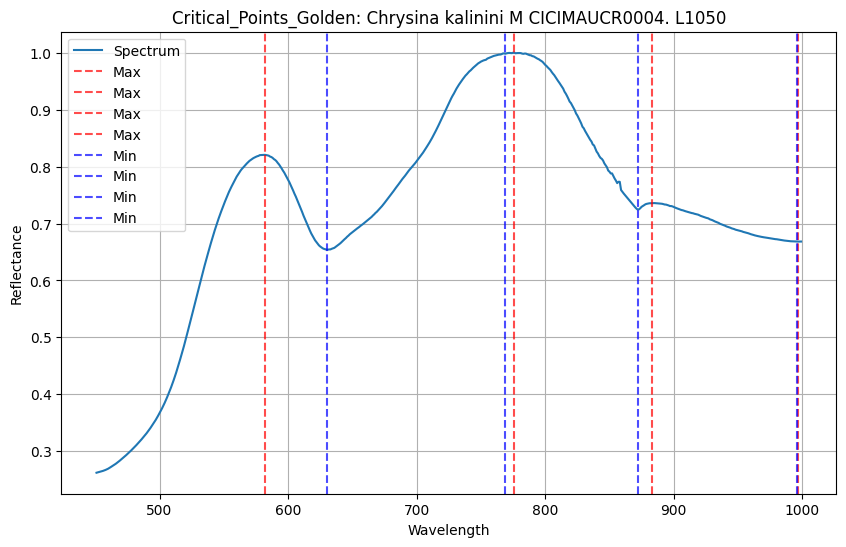

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=66.855167, 
                  bottom_thr=0.0, top_thr=66.855167, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


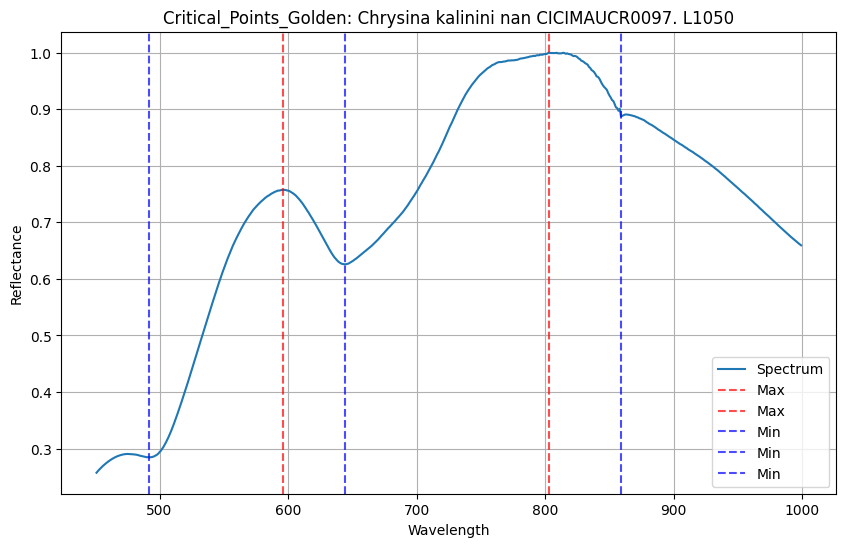

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=15.560224000000002, 
                  bottom_thr=0.0, top_thr=15.560224000000002, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


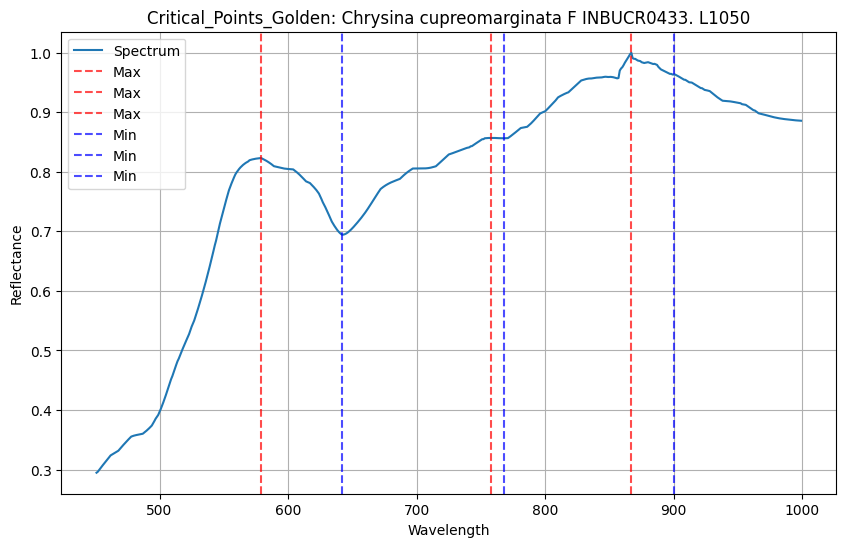

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=46.201066999999995, 
                  bottom_thr=0.0, top_thr=46.201066999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


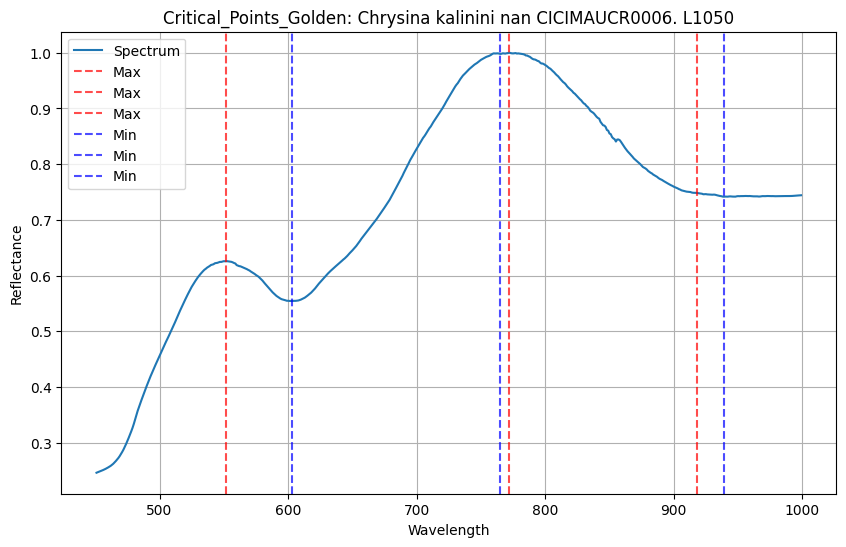

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=37.615502, 
                  bottom_thr=0.0, top_thr=37.615502, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


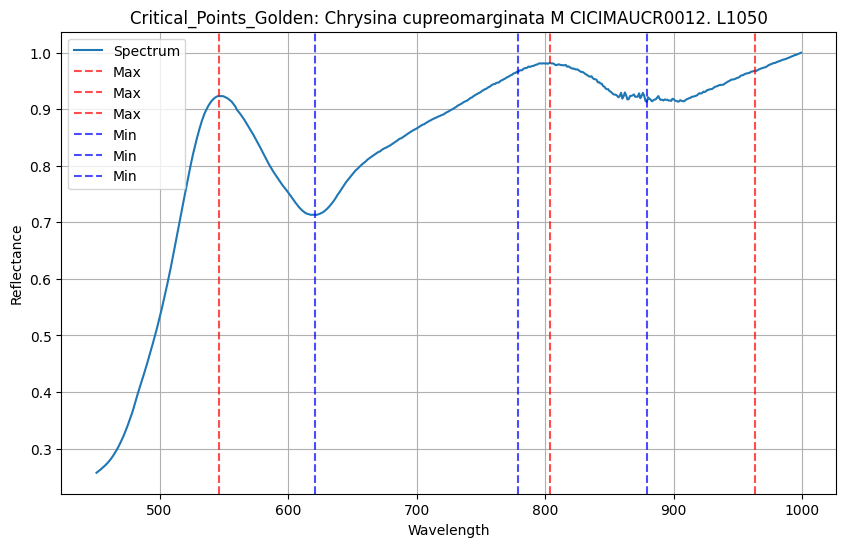

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.395157, 
                  bottom_thr=0.0, top_thr=55.395157, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


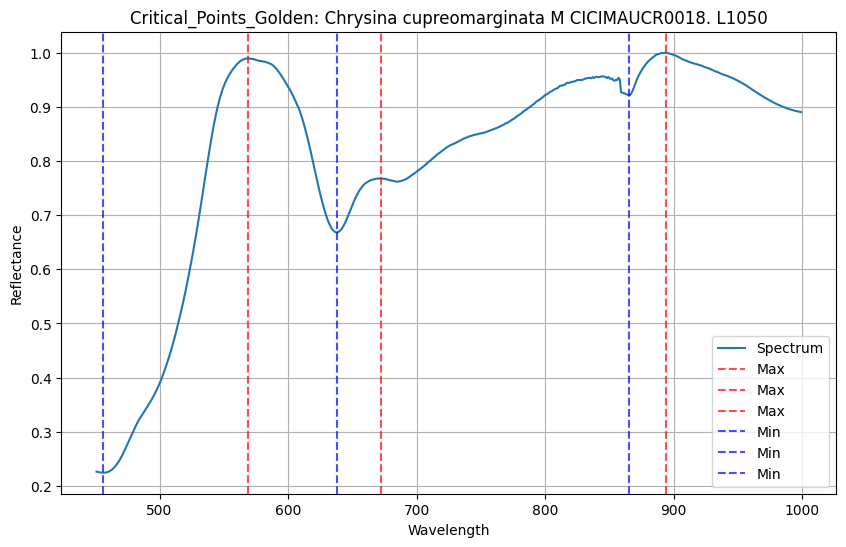

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.804767, 
                  bottom_thr=0.0, top_thr=70.804767, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


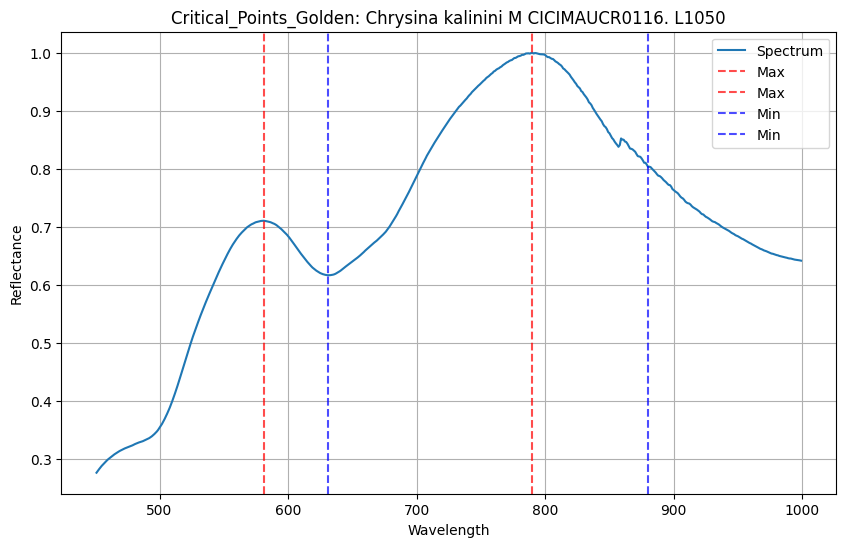

In [17]:
gamma_vector_relative_reflectance_data = feature_and_label_extractor(Metric = Critical_Points_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = True,
                                                          collection_list = training_collection_list,
                                                          plot = True)



#### Wavelength_Vector

In [18]:
gamma_vector_relative_reflectance_data = feature_and_label_extractor(Metric = Wavelength_Vector, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = True,
                                                          collection_list = training_collection_list,
                                                          plot = True)



In [19]:
import numpy as np

def pad_list(lst, filler=0):
    metrics = lst[1]

    # Find the maximum length among all arrays
    max_length = max(m.shape[-1] for m in metrics)

    padded_list = []
    for element in metrics:
        # Ensure numpy array
        arr = np.asarray(element)

        current_length = arr.shape[-1]
        if current_length < max_length:
            pad_width = max_length - current_length
            if arr.ndim == 1:
                # Pad 1D vector
                padded = np.pad(arr, (0, pad_width), constant_values=filler)
            elif arr.ndim == 2:
                # Pad 2D matrix along last axis
                pad_shape = ((0, 0), (0, pad_width))
                padded = np.pad(arr, pad_shape, constant_values=filler)
            else:
                raise ValueError(f"Unsupported ndim={arr.ndim} in element {arr}")
        else:
            padded = arr

        padded_list.append(padded)

    return [lst[0], padded_list, lst[2]]


#pad_list(gamma_vector_relative_reflectance_data)

In [20]:
wavelength_vector_data = feature_and_label_extractor(Metric = Wavelength_Vector, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)


#print(wavelength_vector_data)

data = pad_list(wavelength_vector_data)
#print(data)

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


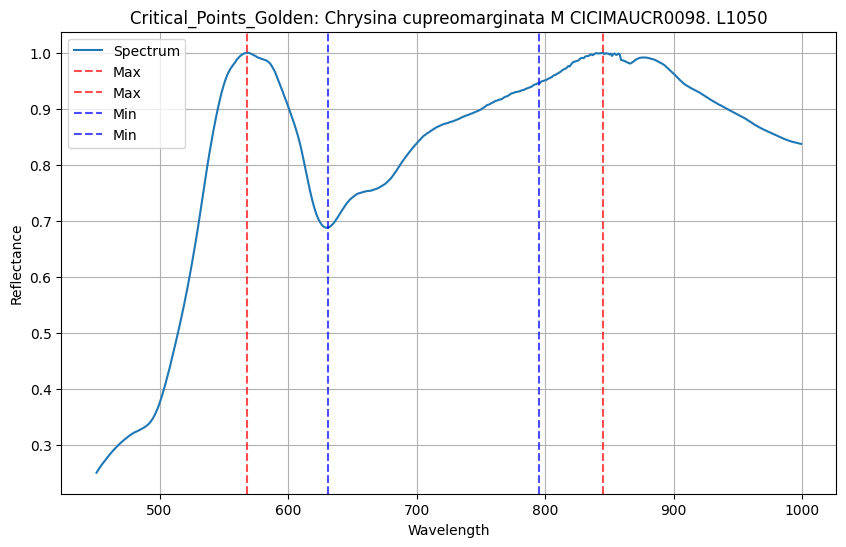

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


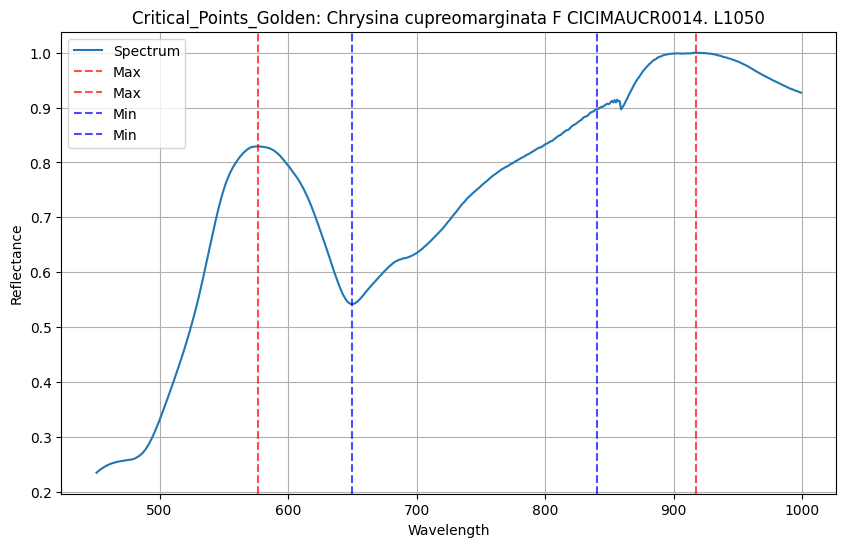

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


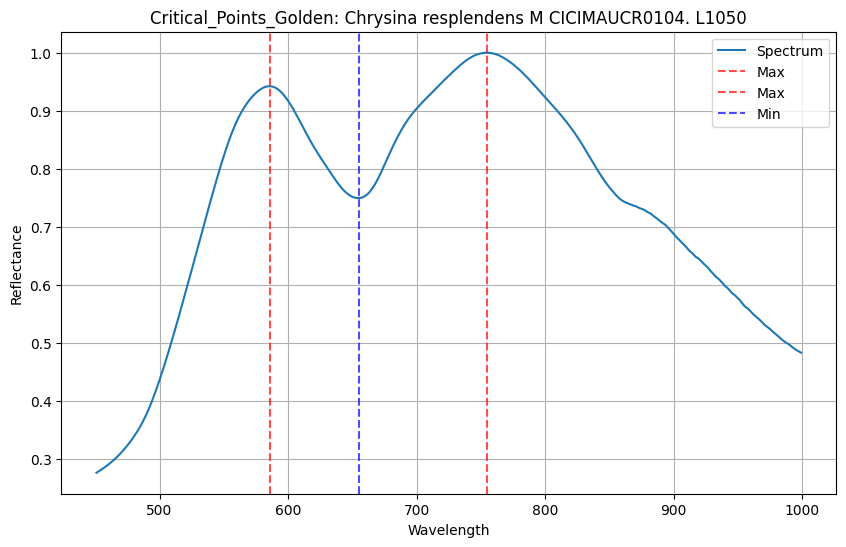

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


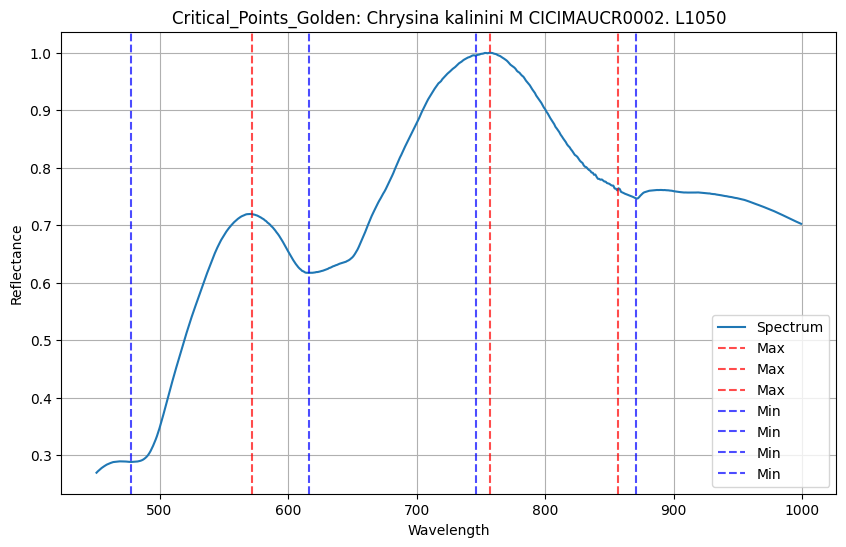

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bottom_thr=0.0, top_thr=55.50916000000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


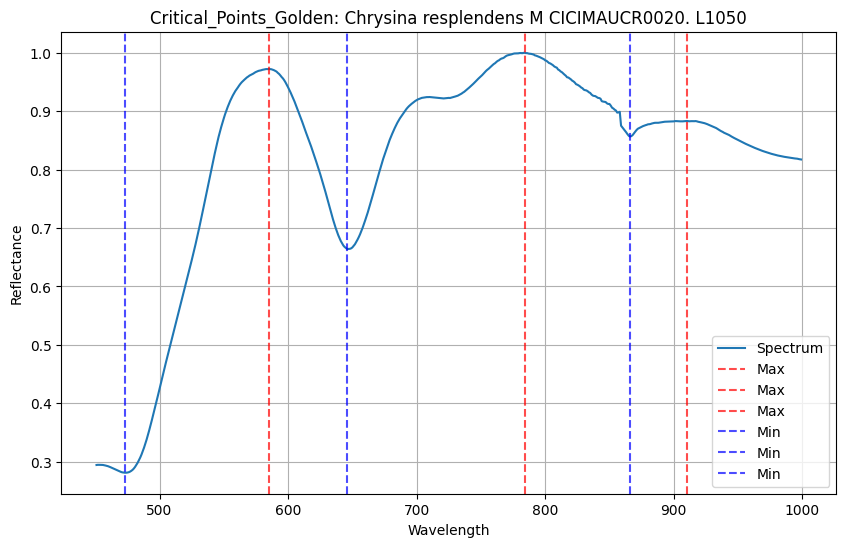

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=74.529467, 
                  bottom_thr=0.0, top_thr=74.529467, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


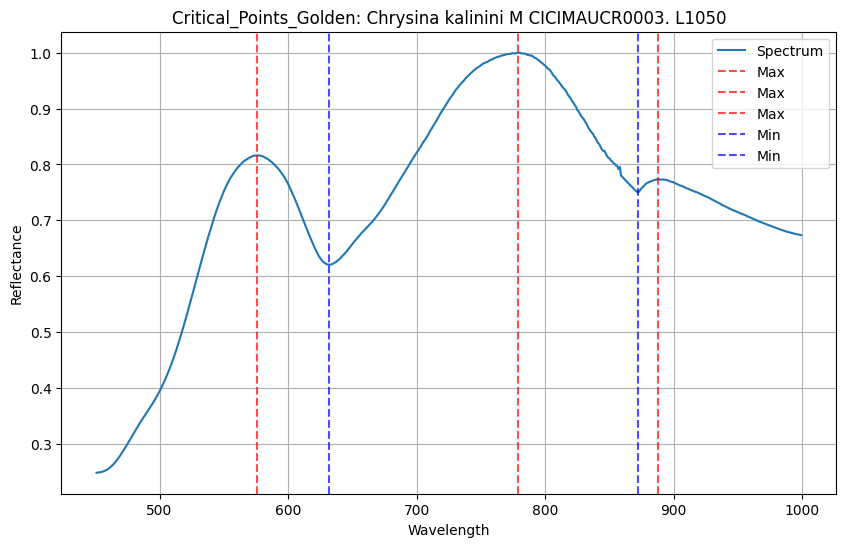

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.777667, 
                  bottom_thr=0.0, top_thr=68.777667, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


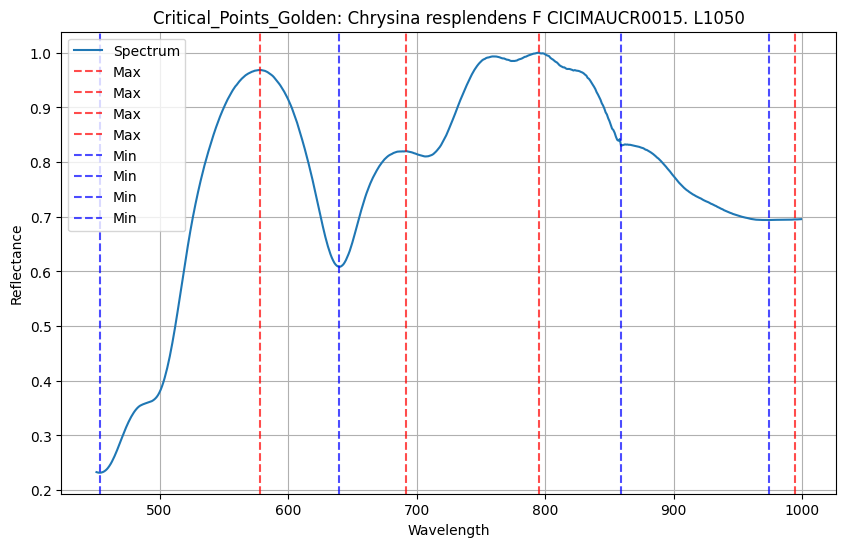

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=64.1527, 
                  bottom_thr=0.0, top_thr=64.1527, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


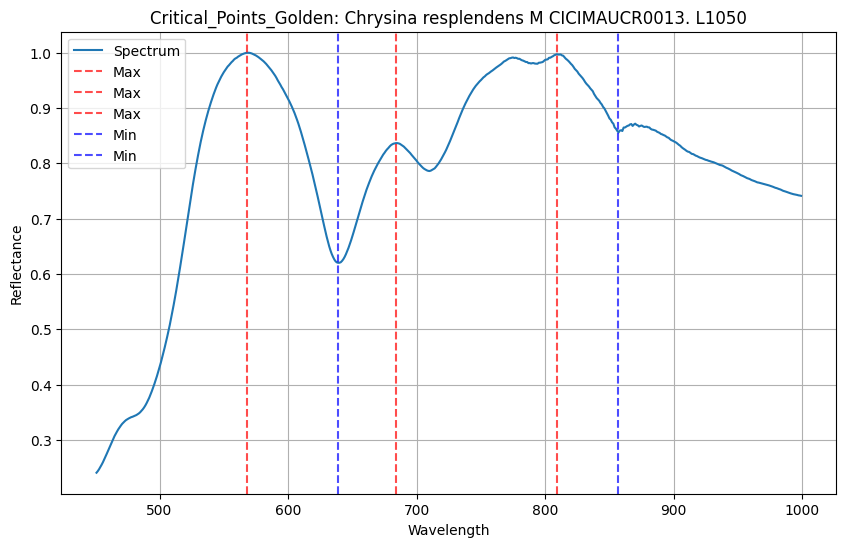

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.632466, 
                  bottom_thr=0.0, top_thr=68.632466, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


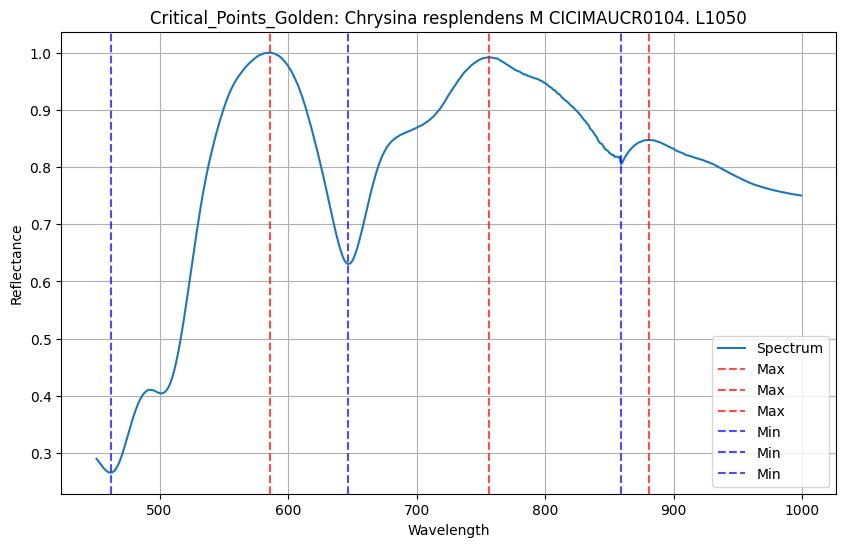

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=69.614549, 
                  bottom_thr=0.0, top_thr=69.614549, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


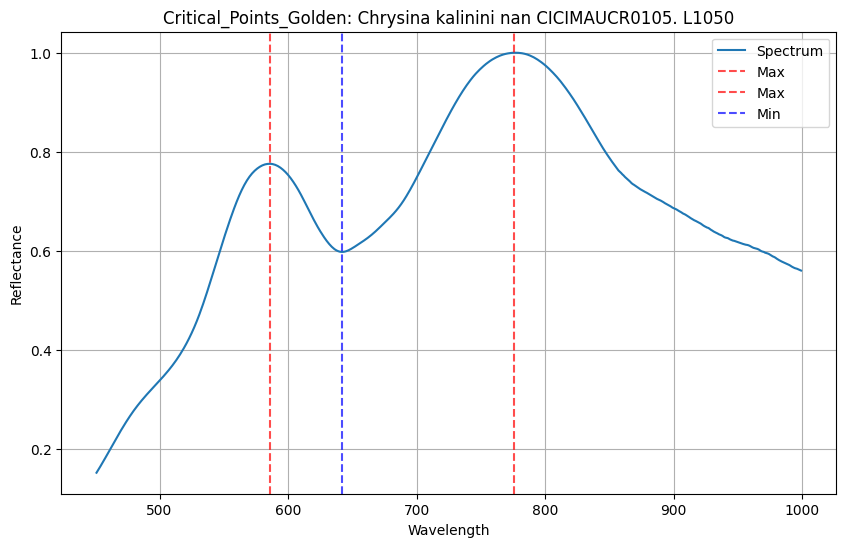

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=47.391498999999996, 
                  bottom_thr=0.0, top_thr=47.391498999999996, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


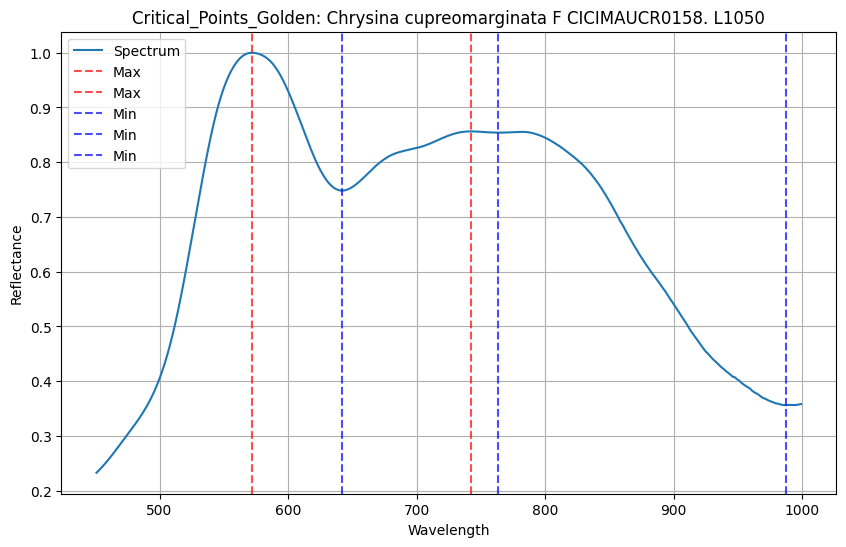

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.071434, 
                  bottom_thr=0.0, top_thr=70.071434, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


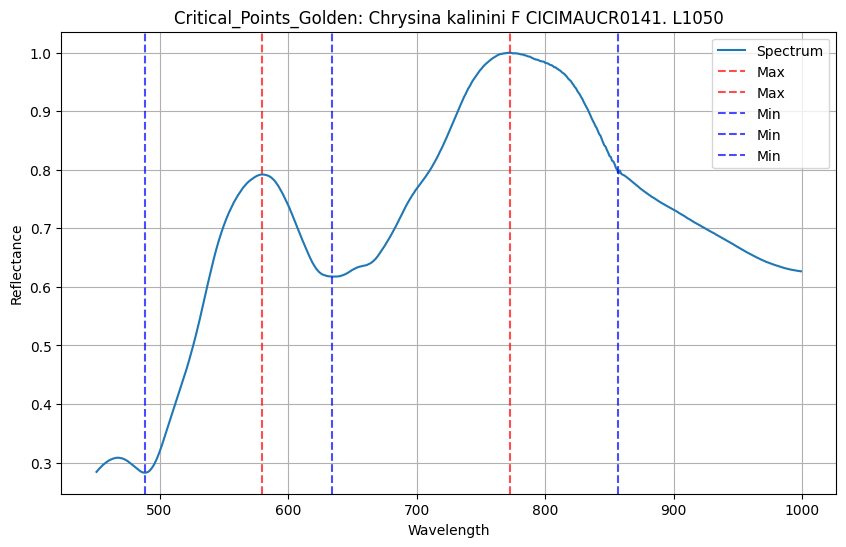

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.30927499999999, 
                  bottom_thr=0.0, top_thr=70.30927499999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


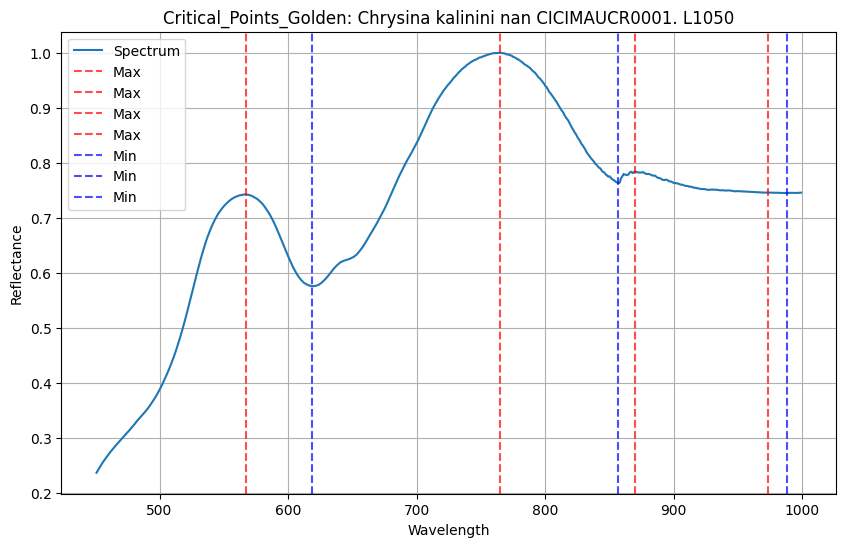

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.173166, 
                  bottom_thr=0.0, top_thr=71.173166, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


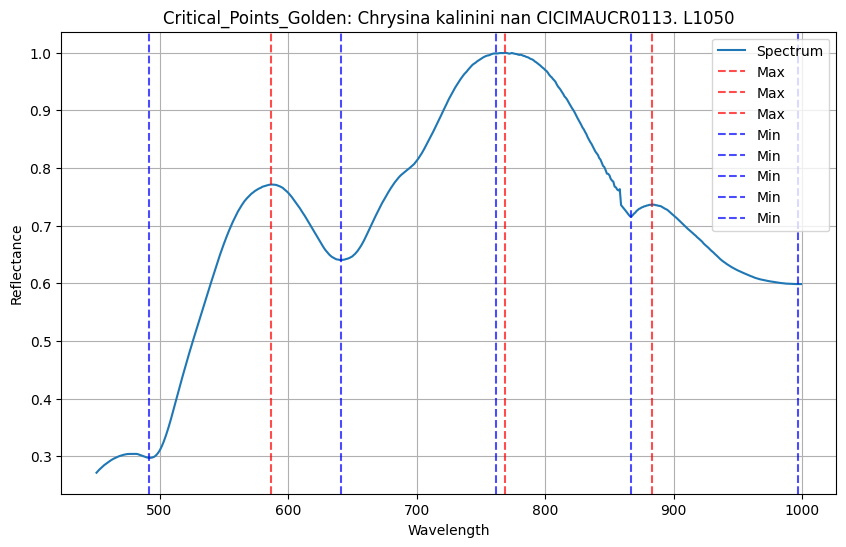

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=67.1612, 
                  bottom_thr=0.0, top_thr=67.1612, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


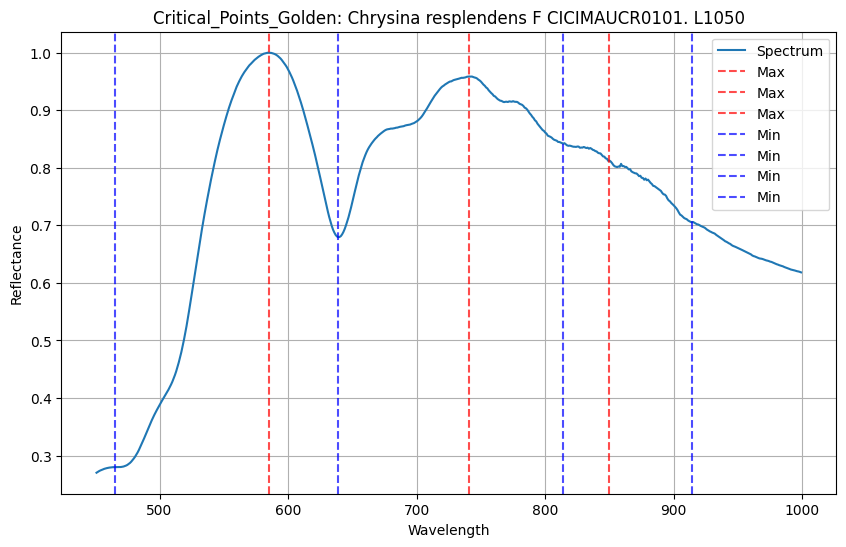

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=50.734972, 
                  bottom_thr=0.0, top_thr=50.734972, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


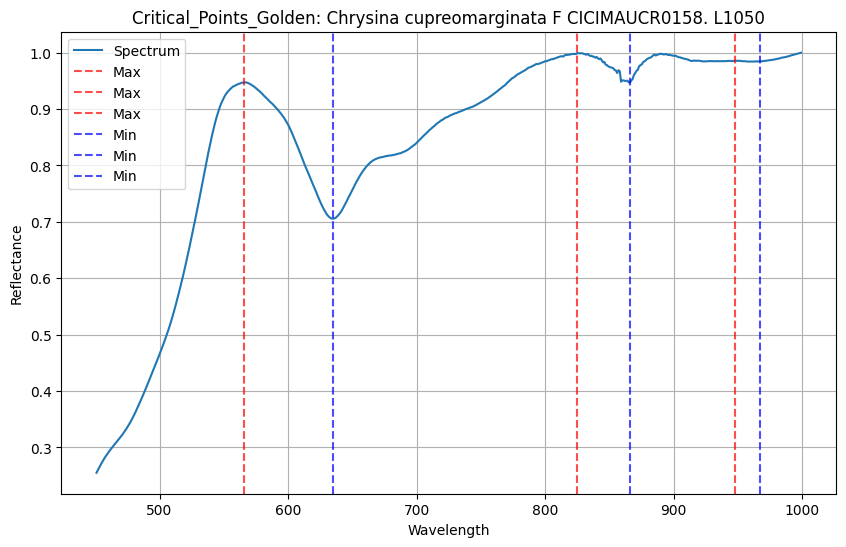

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=49.421255, 
                  bottom_thr=0.0, top_thr=49.421255, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


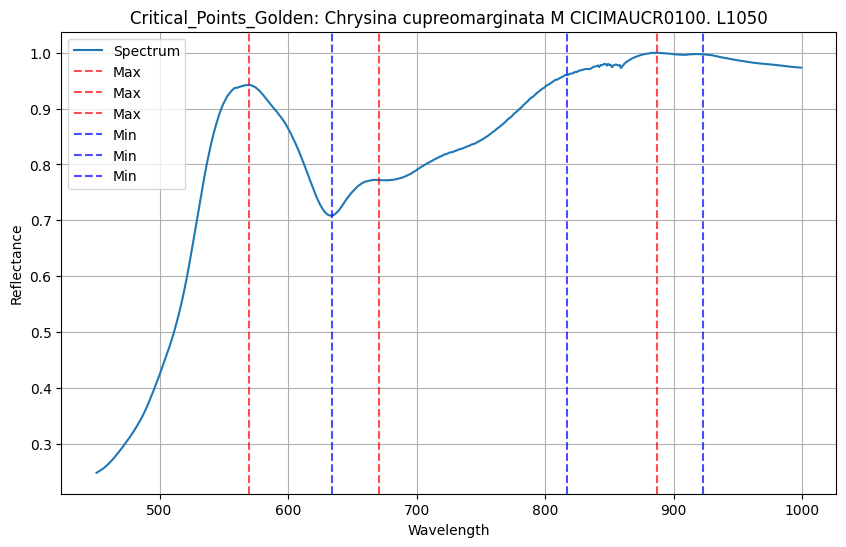

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=78.41141999999999, 
                  bottom_thr=0.0, top_thr=78.41141999999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


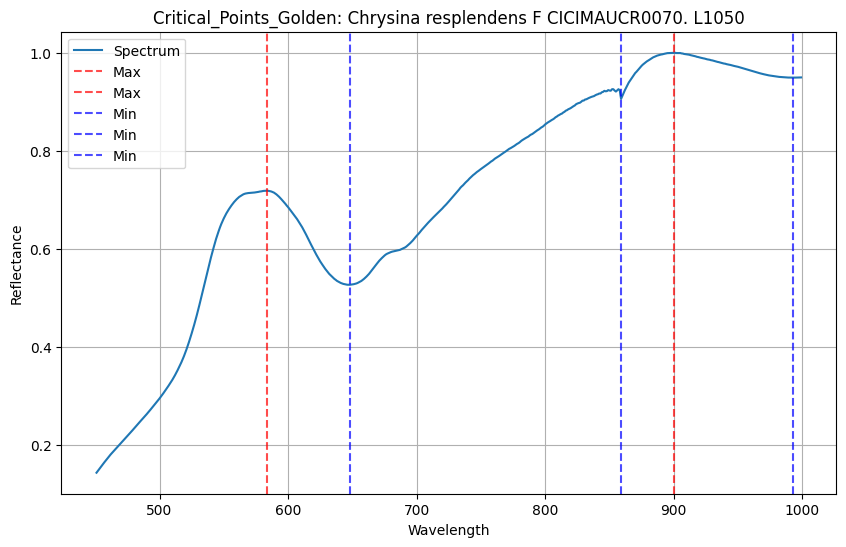

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=61.15786700000001, 
                  bottom_thr=0.0, top_thr=61.15786700000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


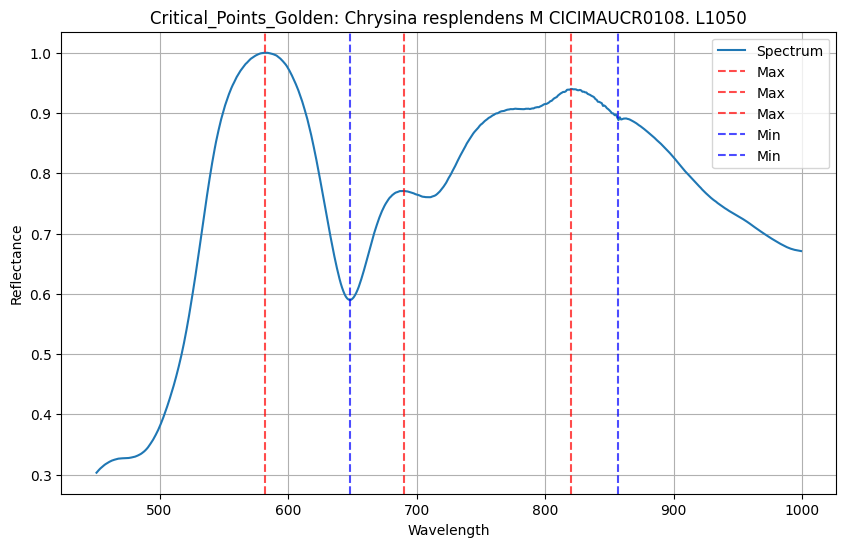

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.3047, 
                  bottom_thr=0.0, top_thr=71.3047, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


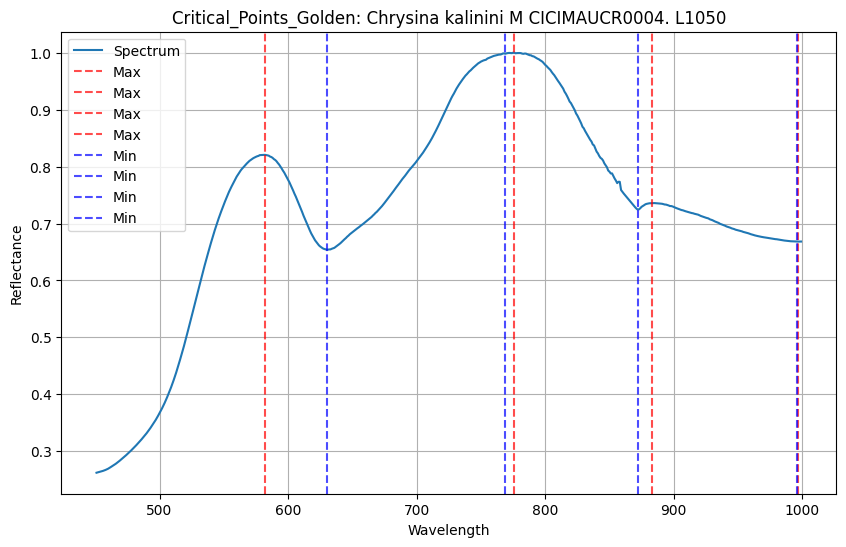

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=66.855167, 
                  bottom_thr=0.0, top_thr=66.855167, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


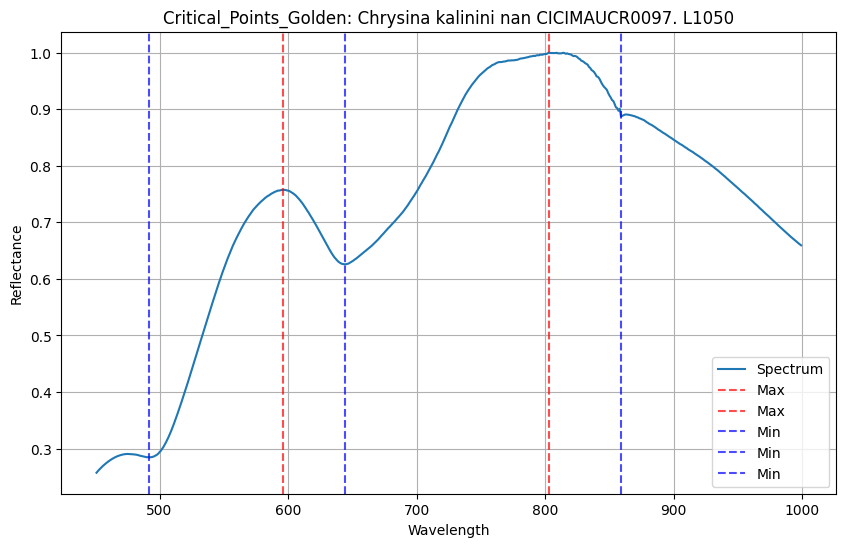

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=15.560224000000002, 
                  bottom_thr=0.0, top_thr=15.560224000000002, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


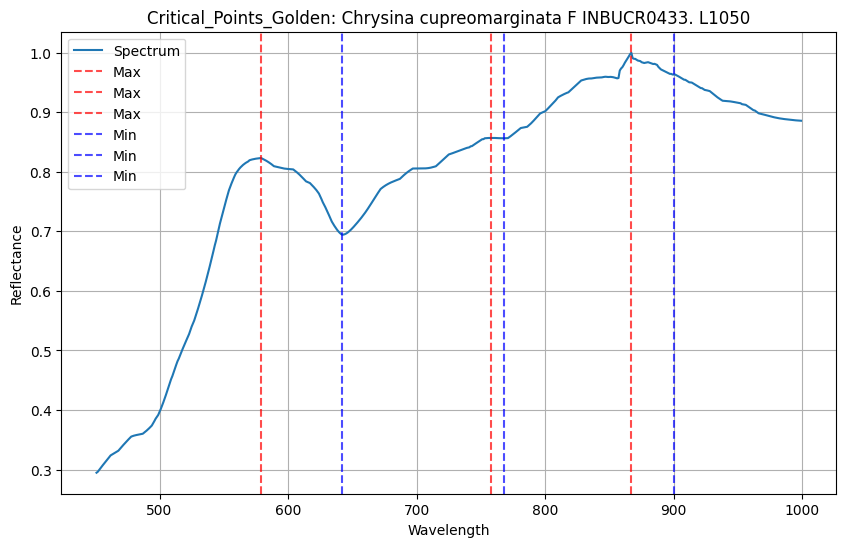

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=46.201066999999995, 
                  bottom_thr=0.0, top_thr=46.201066999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


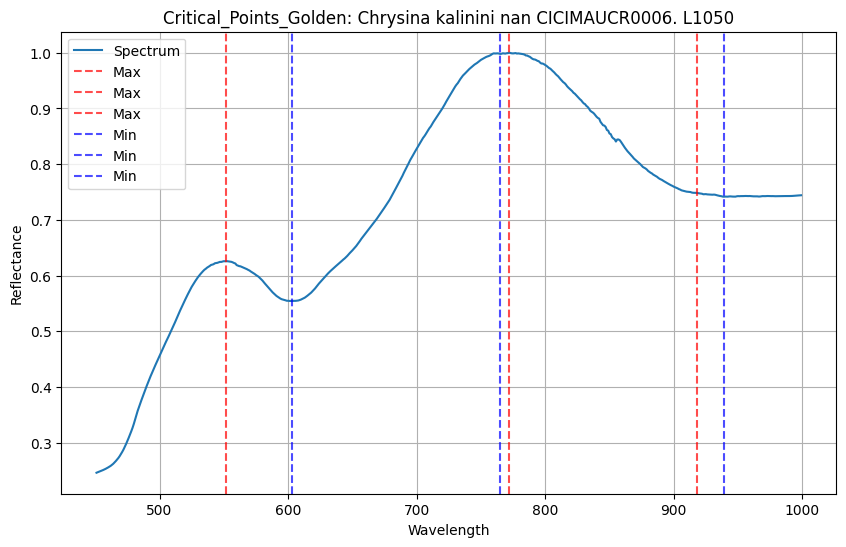

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=37.615502, 
                  bottom_thr=0.0, top_thr=37.615502, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


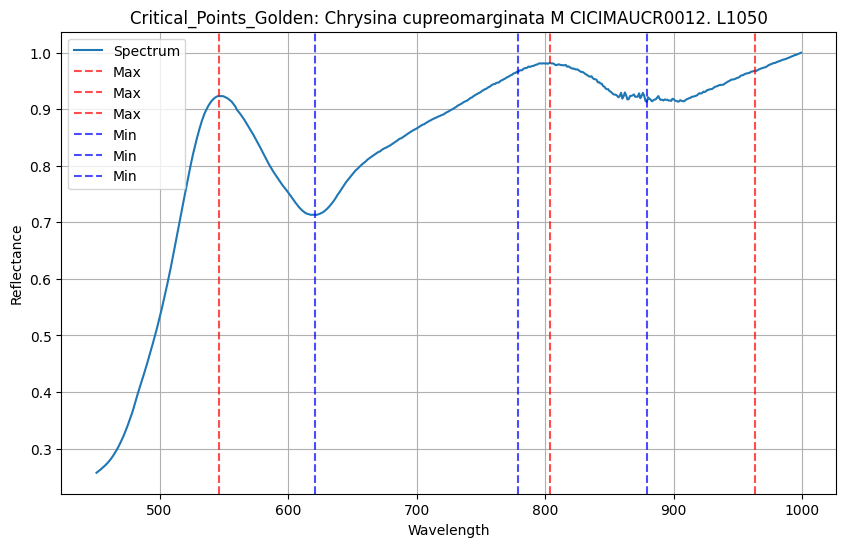

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.395157, 
                  bottom_thr=0.0, top_thr=55.395157, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


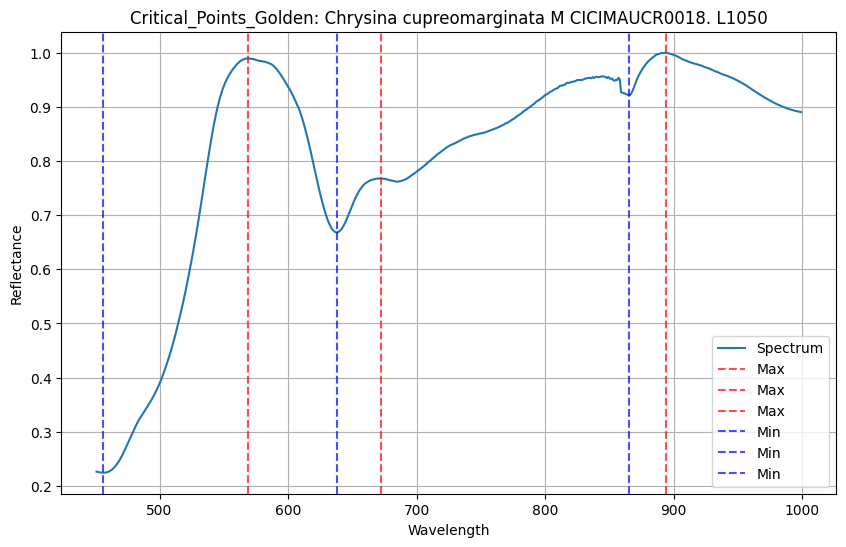

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.804767, 
                  bottom_thr=0.0, top_thr=70.804767, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


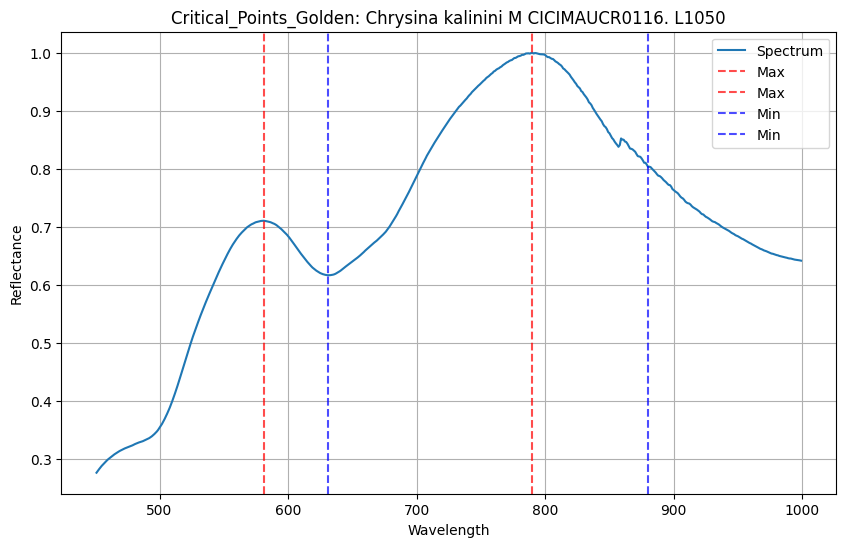

In [21]:
Critical_Points_Golden_data = feature_and_label_extractor(Metric = Critical_Points_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)


#print(Critical_Points_Golden_data)
#pad_list(Critical_Points_Golden_data, filler = np.array([0,0]).T)


self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


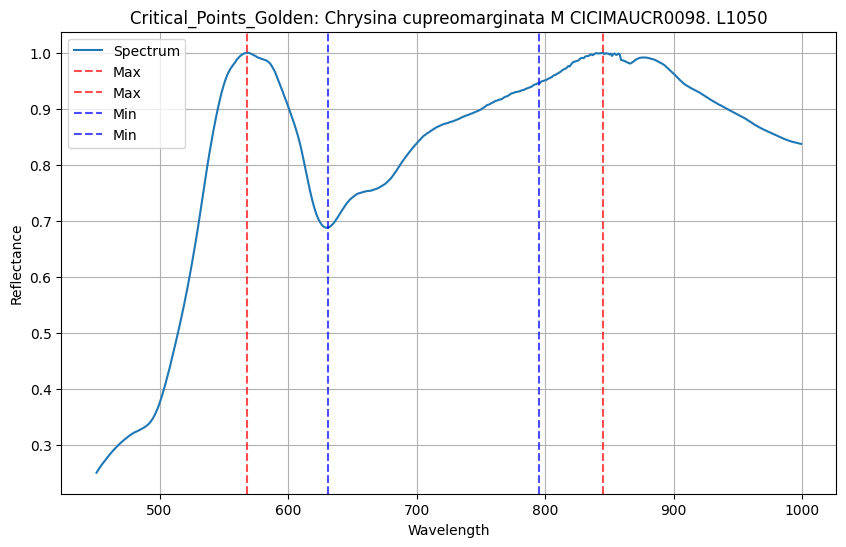

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


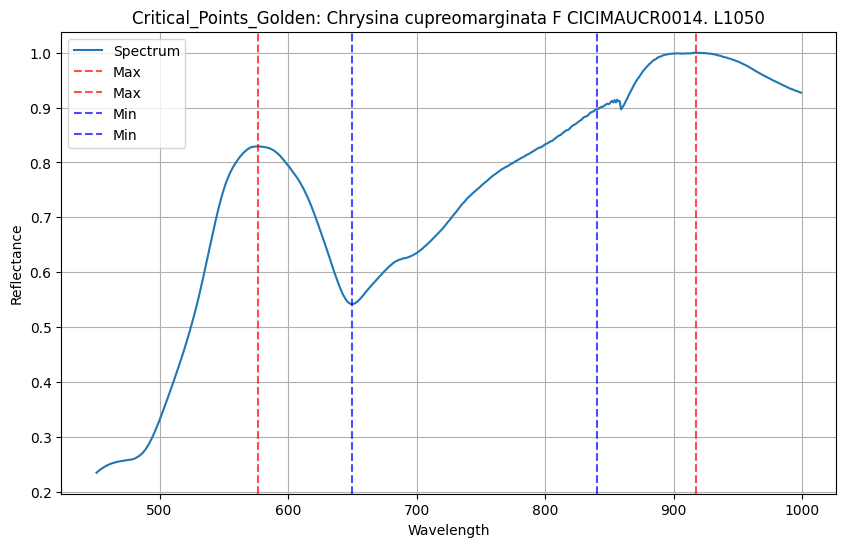

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


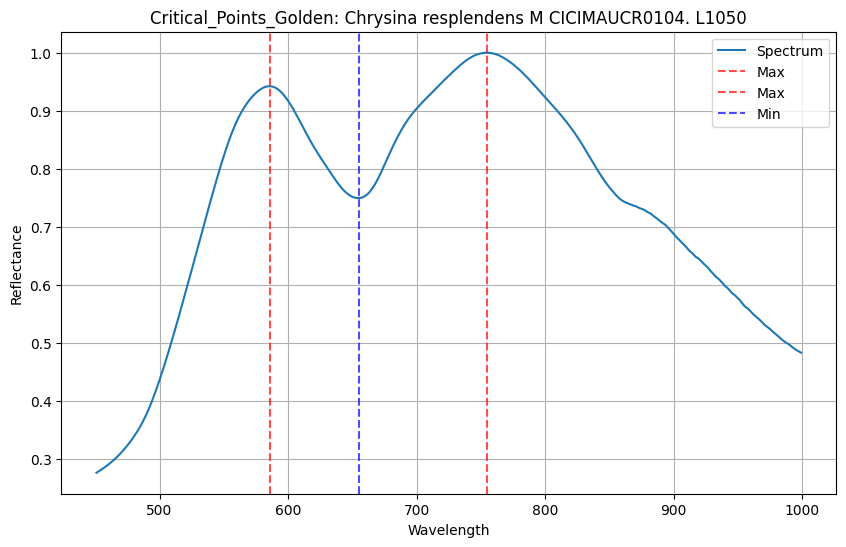

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


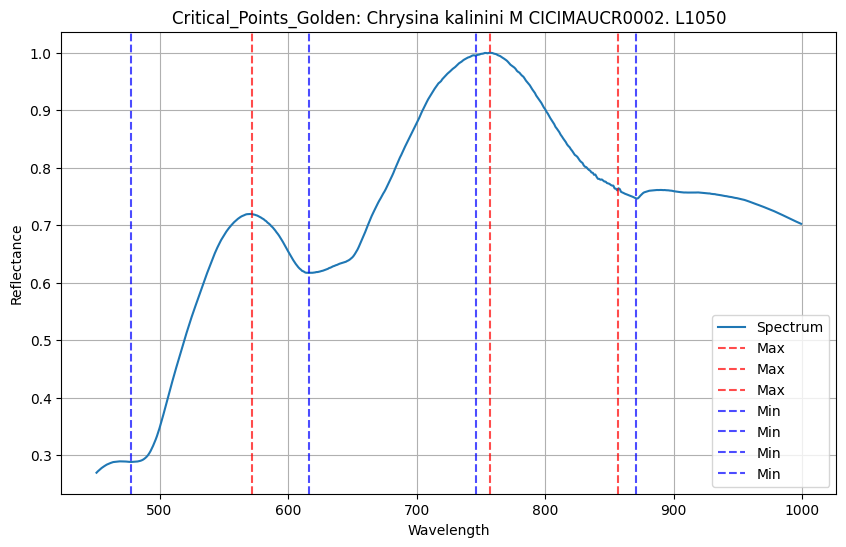

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bottom_thr=0.0, top_thr=55.50916000000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


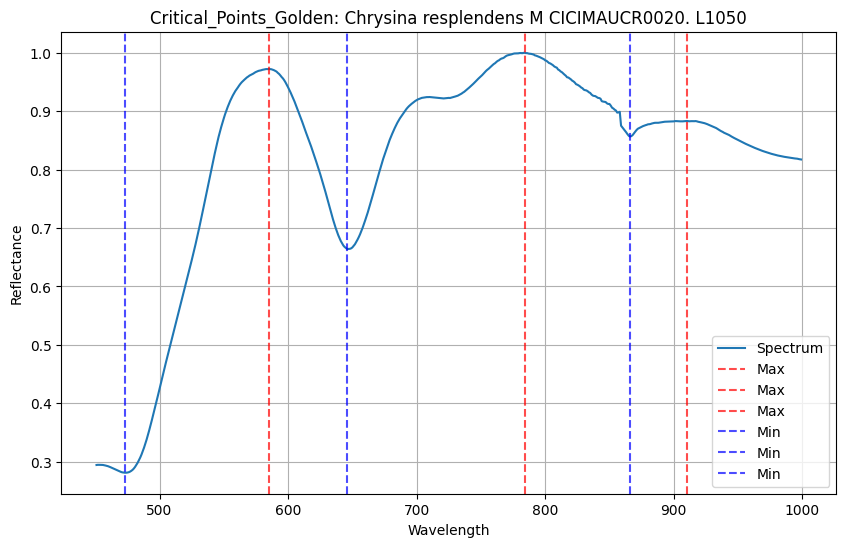

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=74.529467, 
                  bottom_thr=0.0, top_thr=74.529467, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


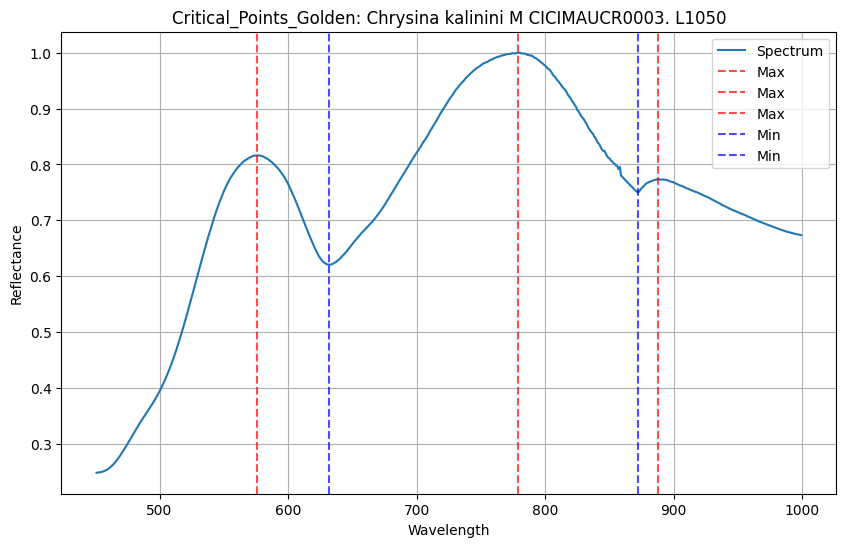

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.777667, 
                  bottom_thr=0.0, top_thr=68.777667, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


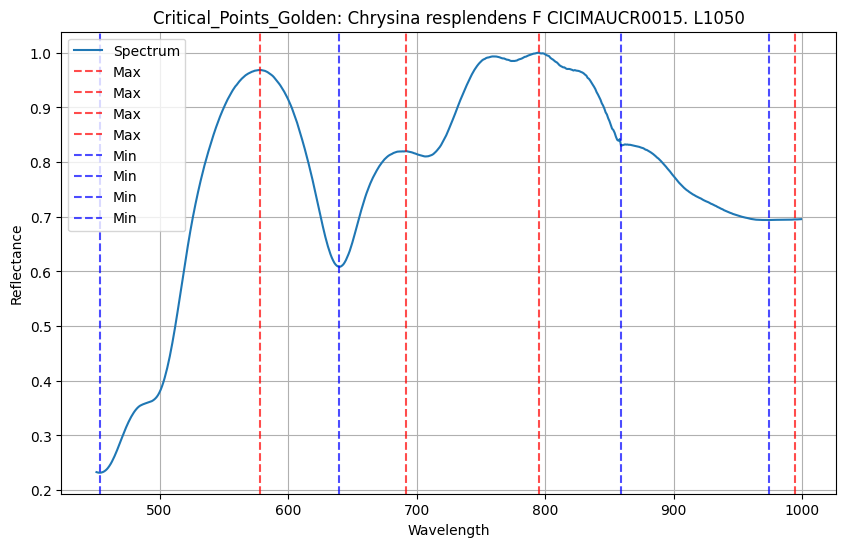

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=64.1527, 
                  bottom_thr=0.0, top_thr=64.1527, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


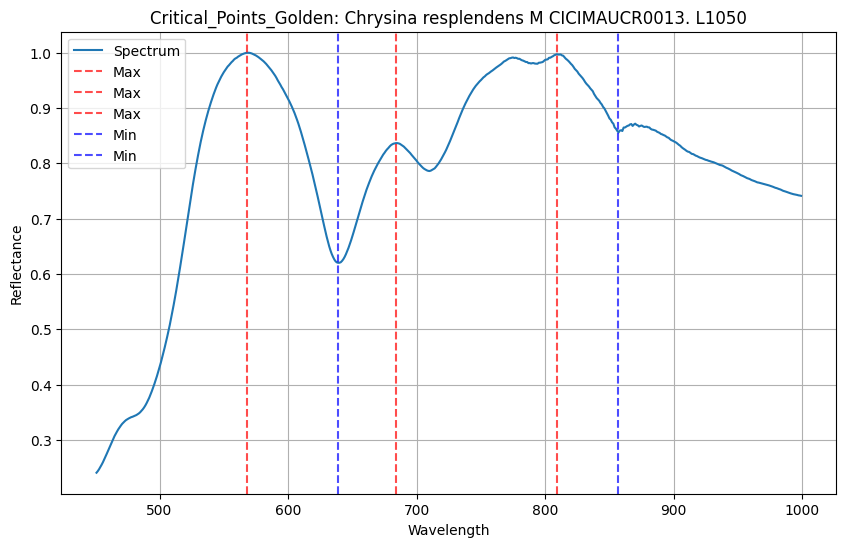

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.632466, 
                  bottom_thr=0.0, top_thr=68.632466, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


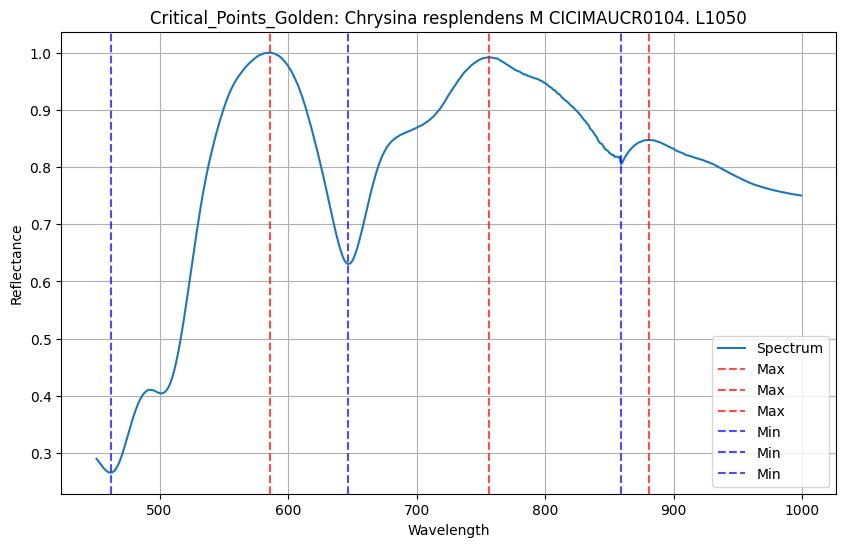

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=69.614549, 
                  bottom_thr=0.0, top_thr=69.614549, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


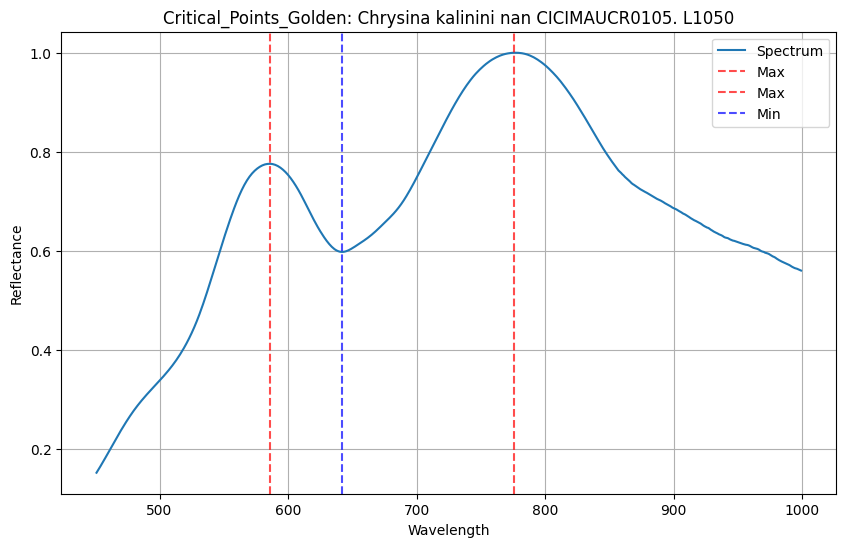

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=47.391498999999996, 
                  bottom_thr=0.0, top_thr=47.391498999999996, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


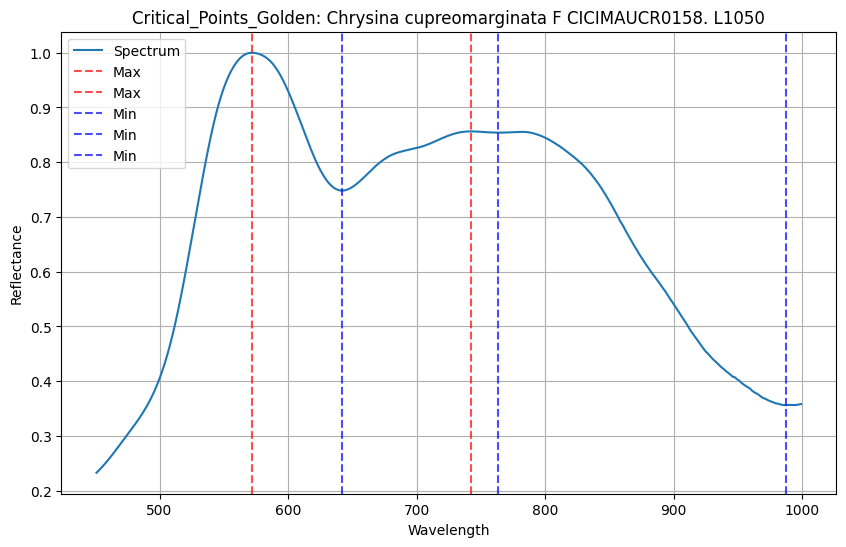

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.071434, 
                  bottom_thr=0.0, top_thr=70.071434, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


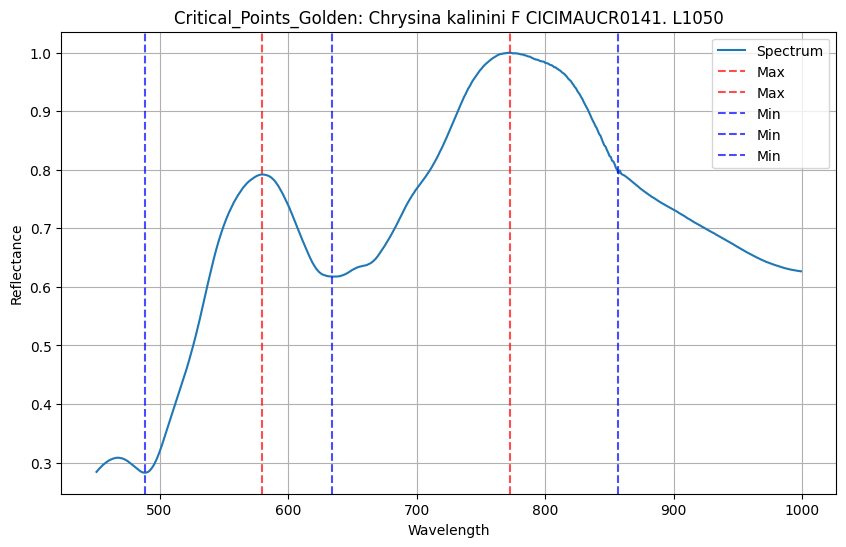

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.30927499999999, 
                  bottom_thr=0.0, top_thr=70.30927499999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


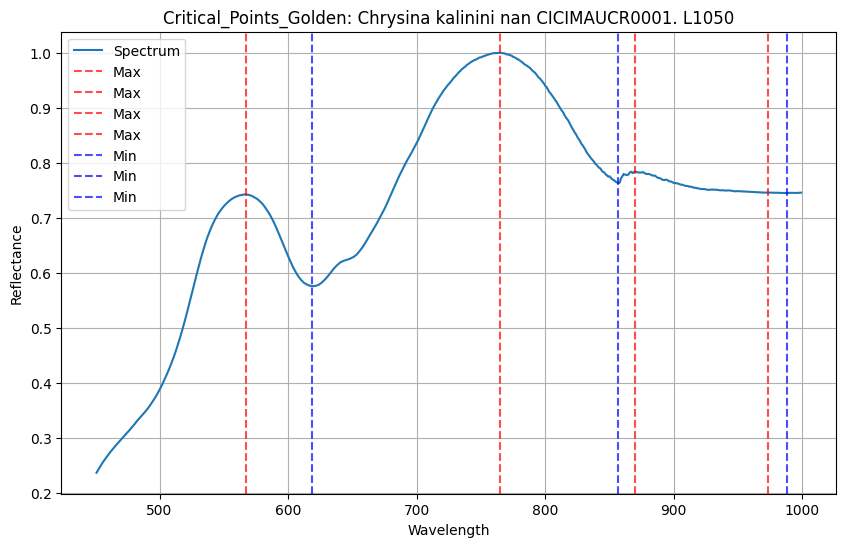

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.173166, 
                  bottom_thr=0.0, top_thr=71.173166, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


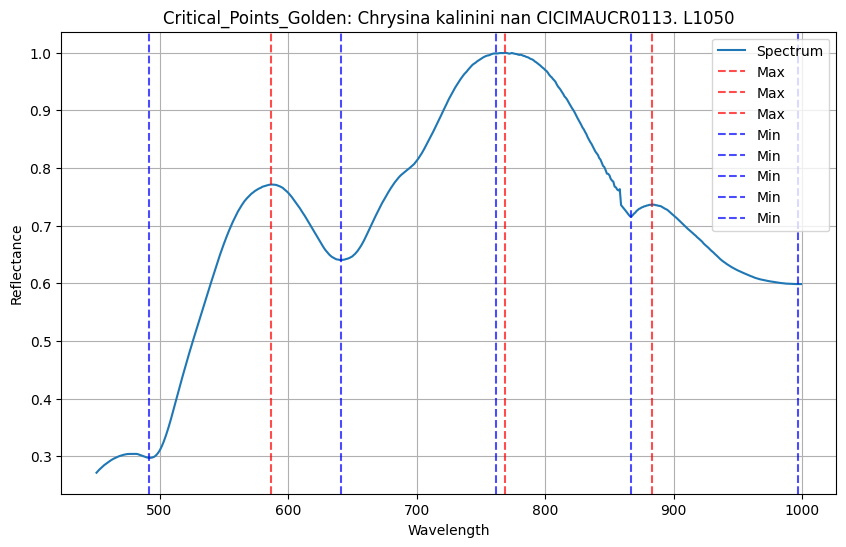

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=67.1612, 
                  bottom_thr=0.0, top_thr=67.1612, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


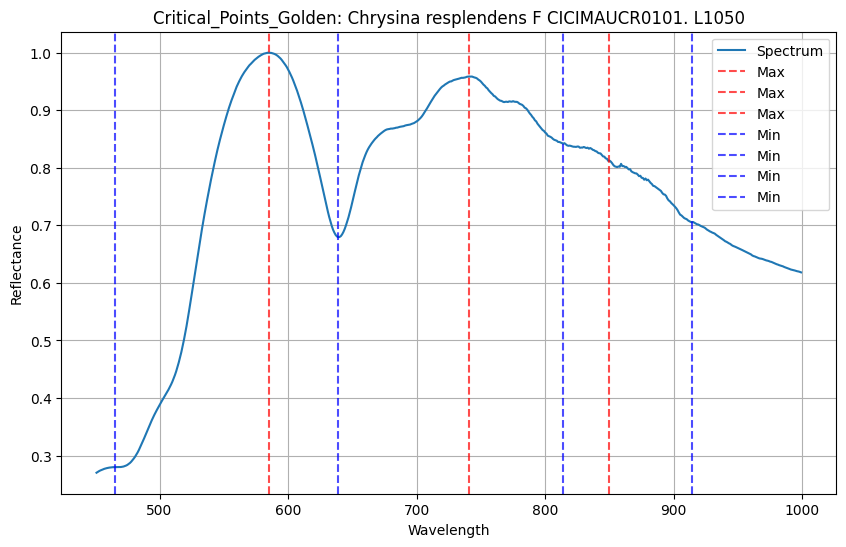

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=50.734972, 
                  bottom_thr=0.0, top_thr=50.734972, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


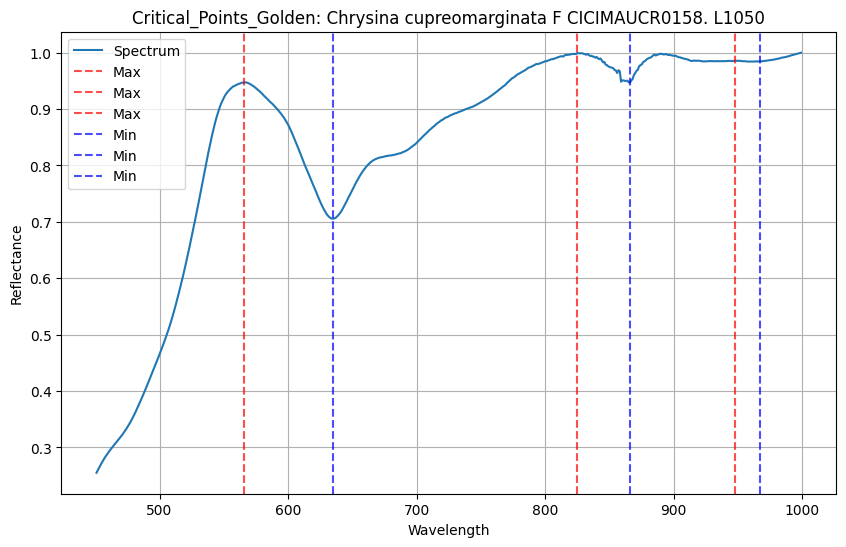

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=49.421255, 
                  bottom_thr=0.0, top_thr=49.421255, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


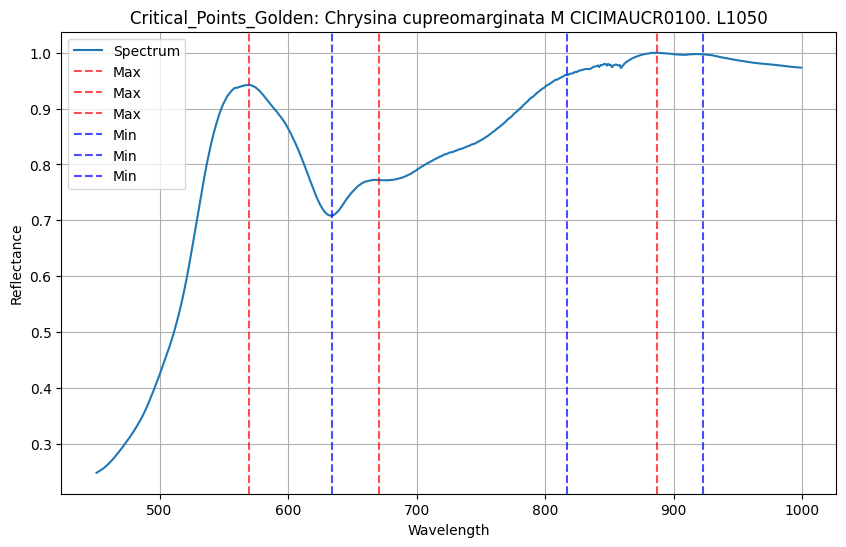

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=78.41141999999999, 
                  bottom_thr=0.0, top_thr=78.41141999999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


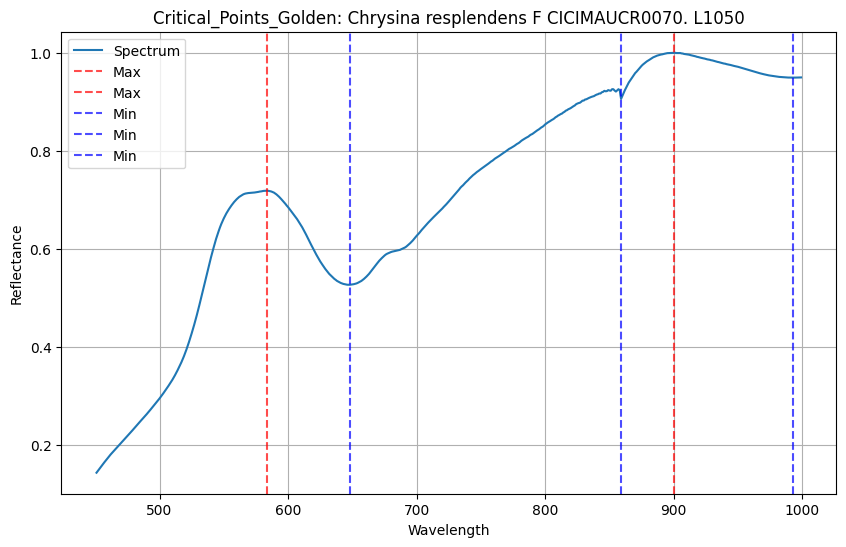

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=61.15786700000001, 
                  bottom_thr=0.0, top_thr=61.15786700000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


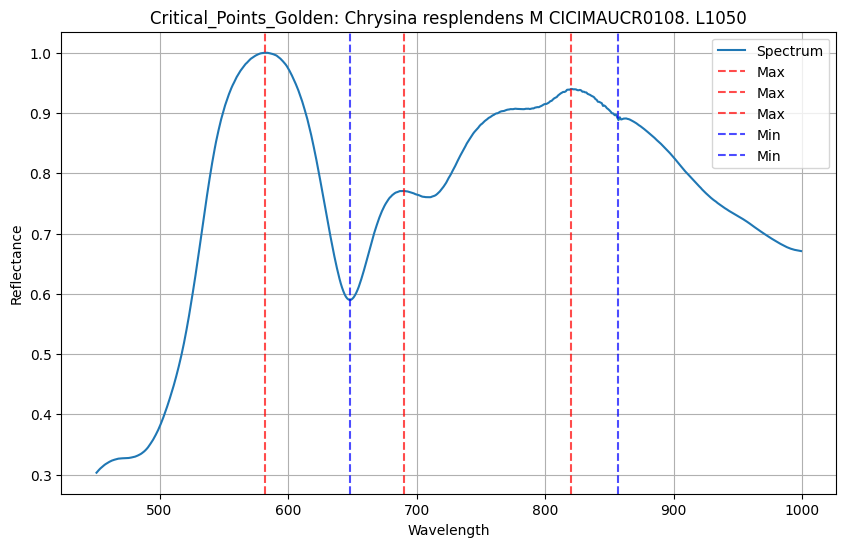

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.3047, 
                  bottom_thr=0.0, top_thr=71.3047, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


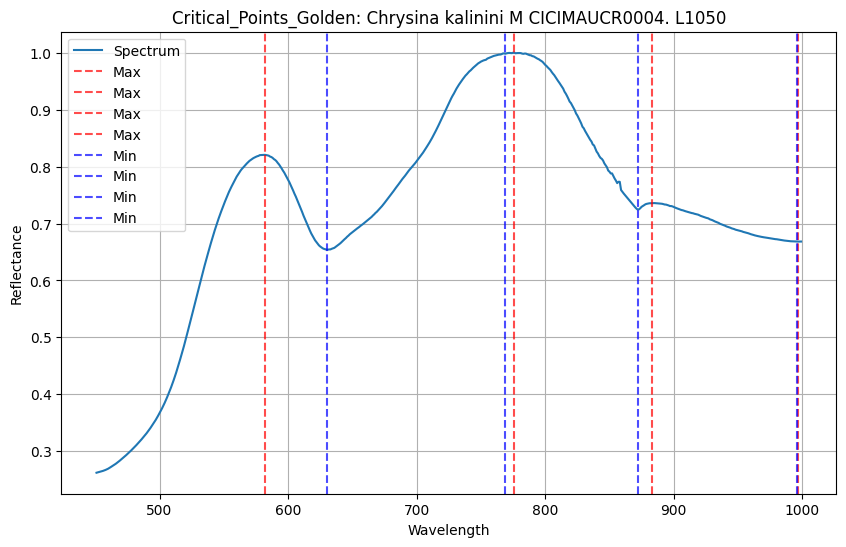

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=66.855167, 
                  bottom_thr=0.0, top_thr=66.855167, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


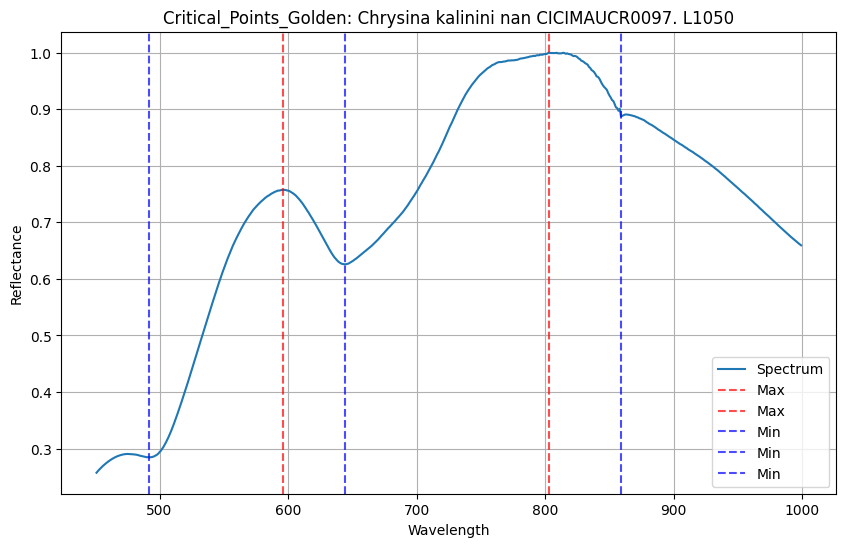

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=15.560224000000002, 
                  bottom_thr=0.0, top_thr=15.560224000000002, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


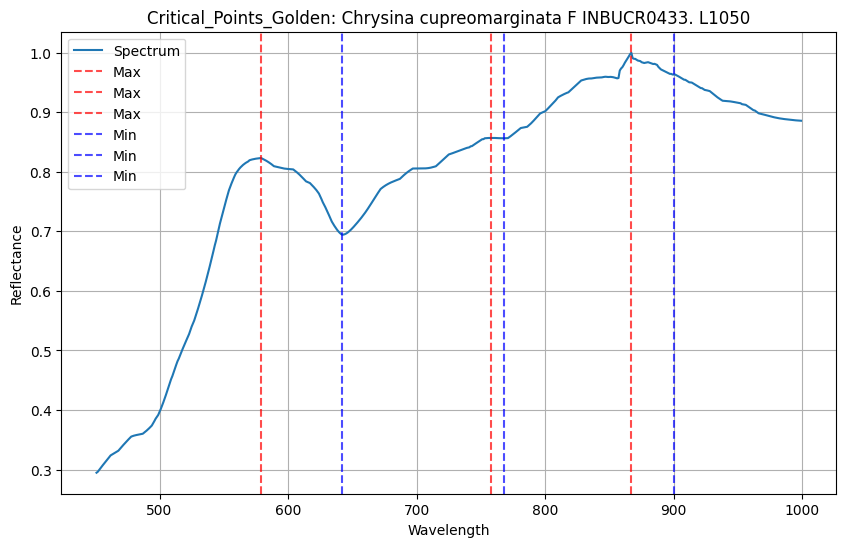

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=46.201066999999995, 
                  bottom_thr=0.0, top_thr=46.201066999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


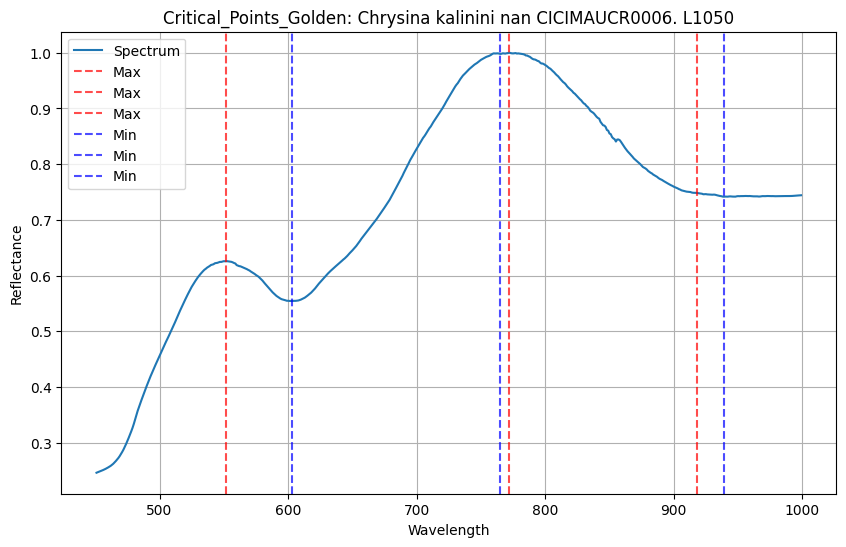

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=37.615502, 
                  bottom_thr=0.0, top_thr=37.615502, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


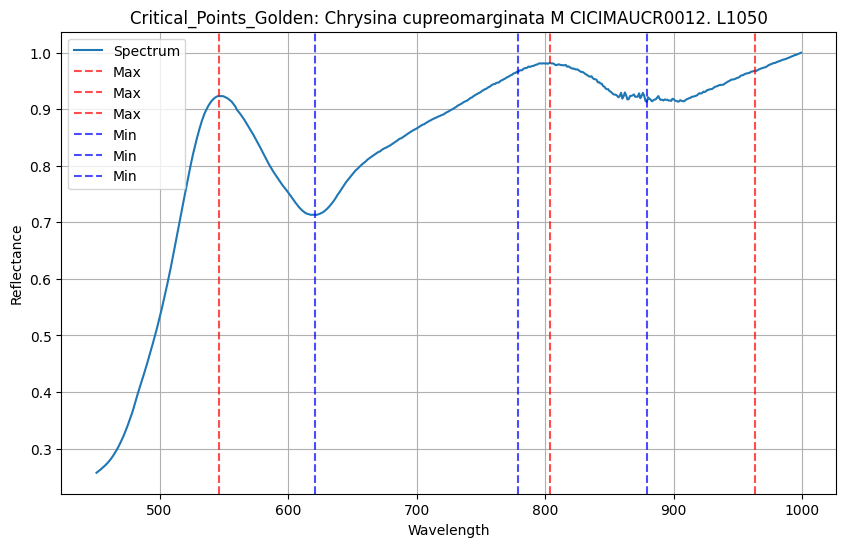

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.395157, 
                  bottom_thr=0.0, top_thr=55.395157, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


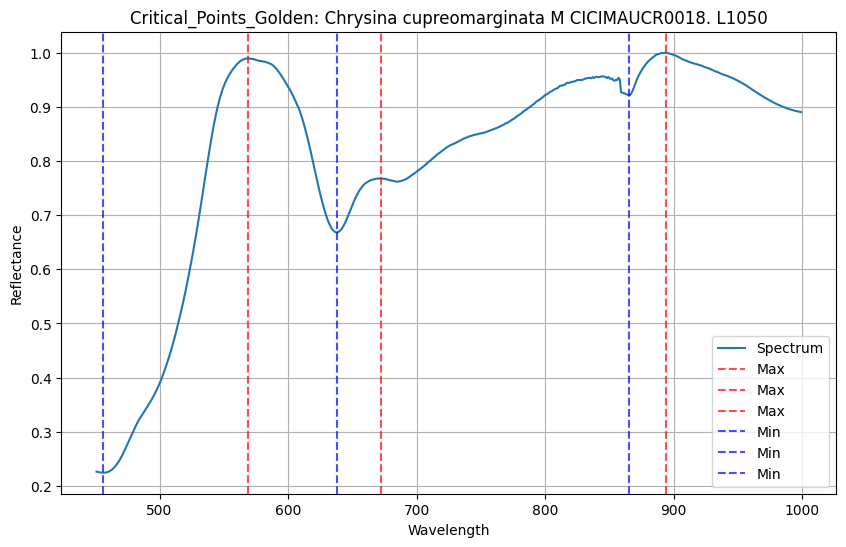

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.804767, 
                  bottom_thr=0.0, top_thr=70.804767, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


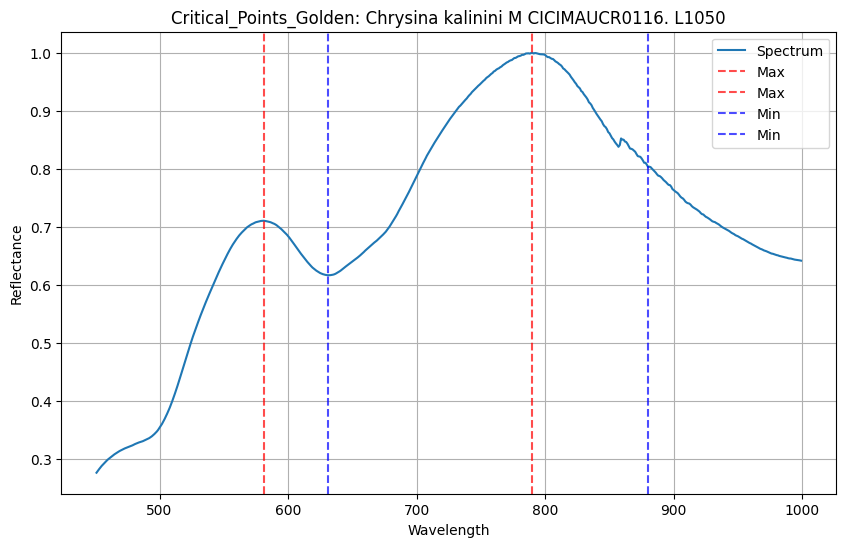

In [22]:
Critical_Points_Golden_data = feature_and_label_extractor(Metric = Critical_Points_Golden, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list,
                                                          plot = True)


#print(Critical_Points_Golden_data)
#pad_list(Critical_Points_Golden_data, filler = np.array([0,0]).T)


## Aggregate data for each metric
### Boxplots and histograms for each metric, classified by species

#### Gamma_Arbitrary_Limits_Golden

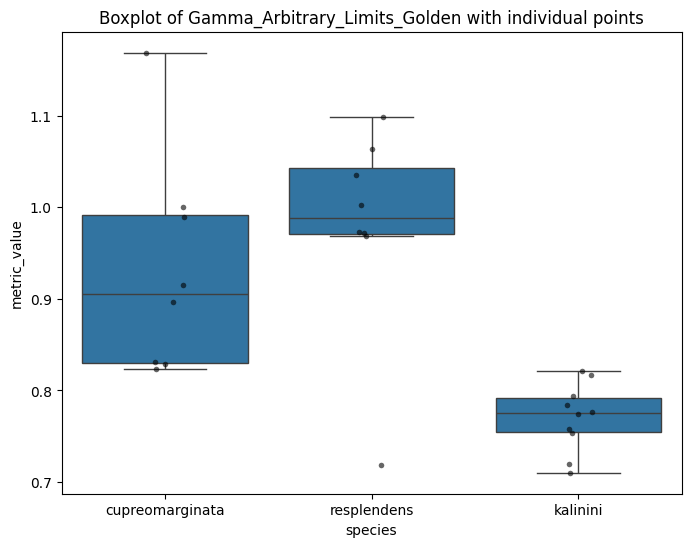

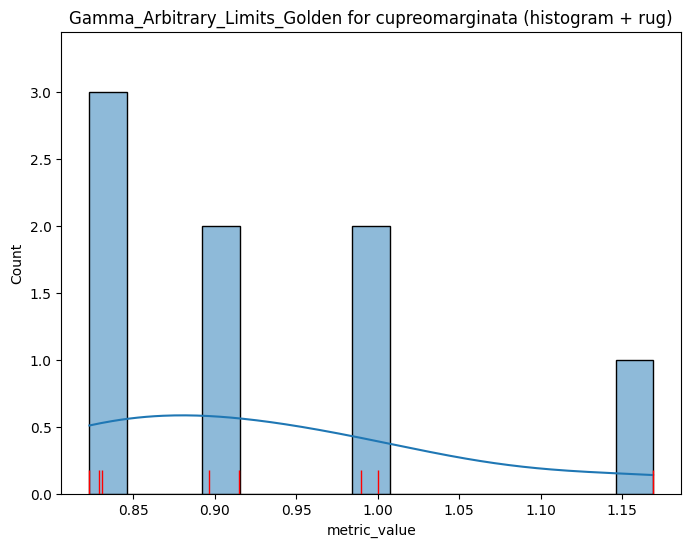

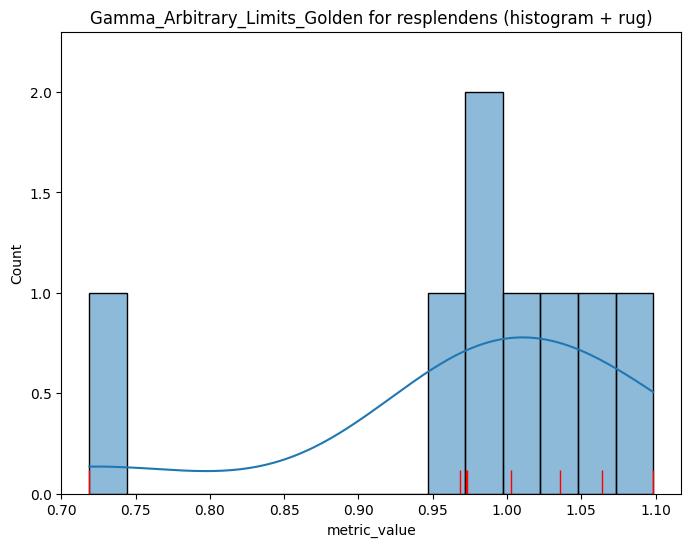

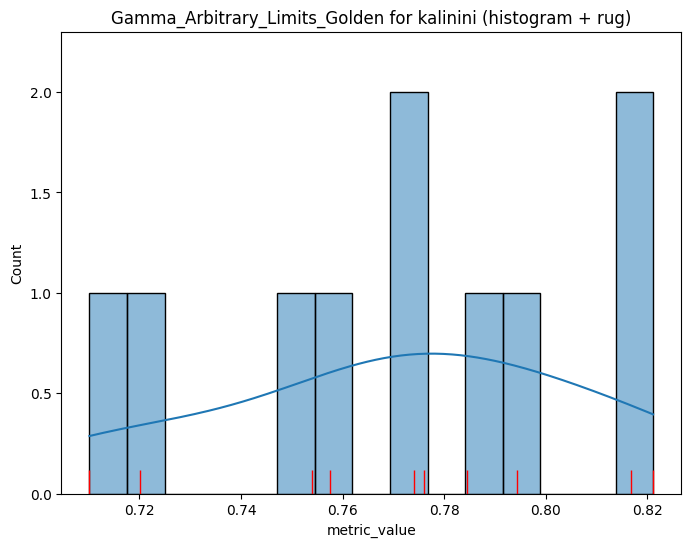

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,0.9316,0.1185,0.9054,0.8232,1.1689,8,0.1617,0.1272
kalinini,0.7709,0.0367,0.7751,0.7102,0.8212,10,0.0370,0.0476
resplendens,0.9792,0.1153,0.9879,0.7189,1.0983,8,0.0715,0.1178


In [23]:
get_aggregated_data(Gamma_Arbitrary_Limits_Golden,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Gamma_First_Two_Peaks

Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Spectrum parameters None
max_i, max_x, max_y [117 394] [568. 845.] [65.2613 65.2479]
Getting equipment. Spectrum


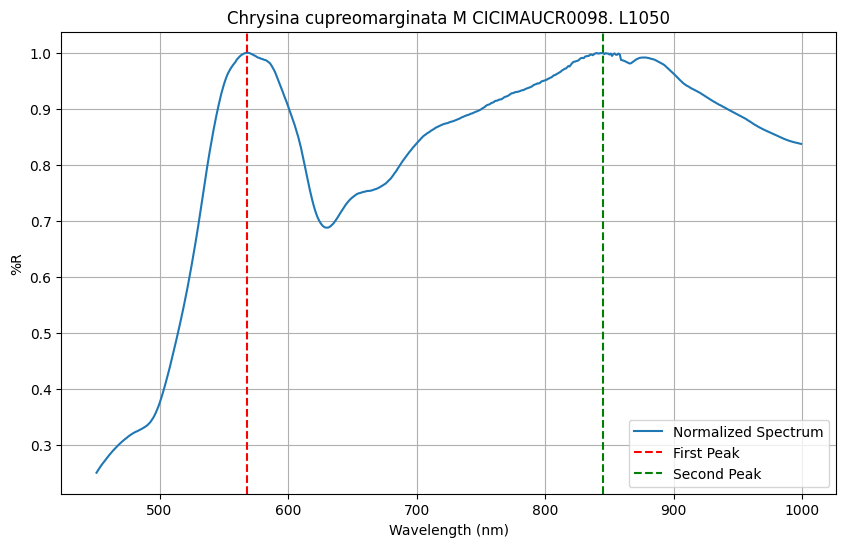

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

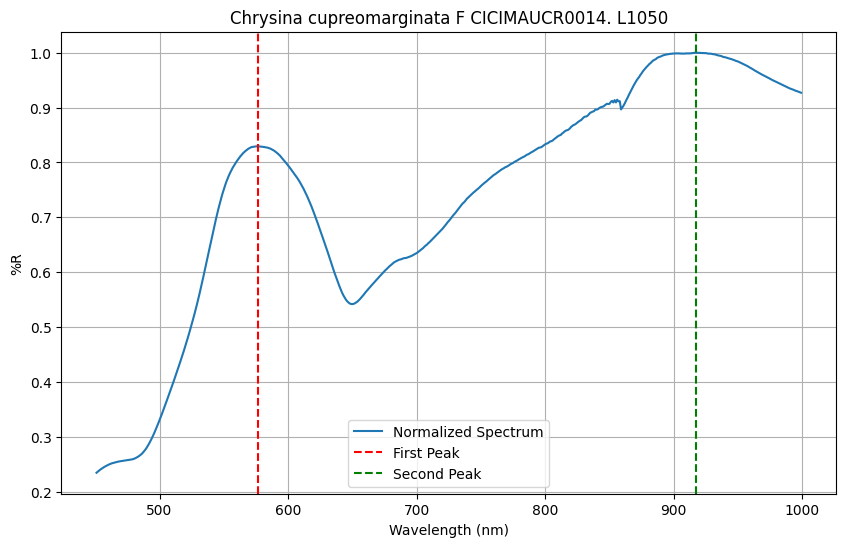

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

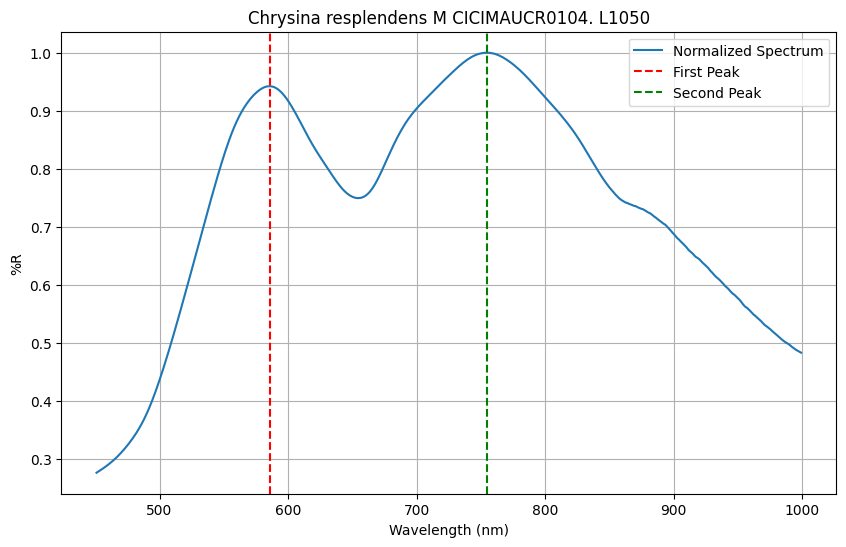

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

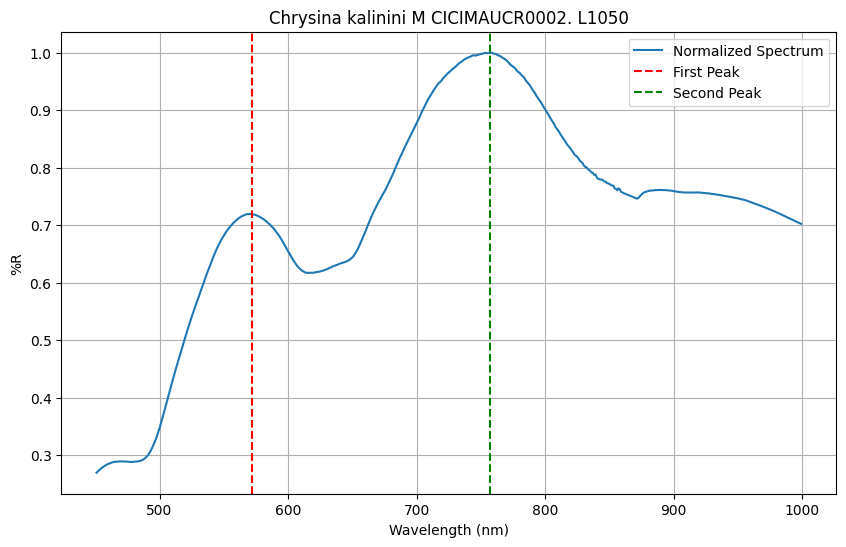

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

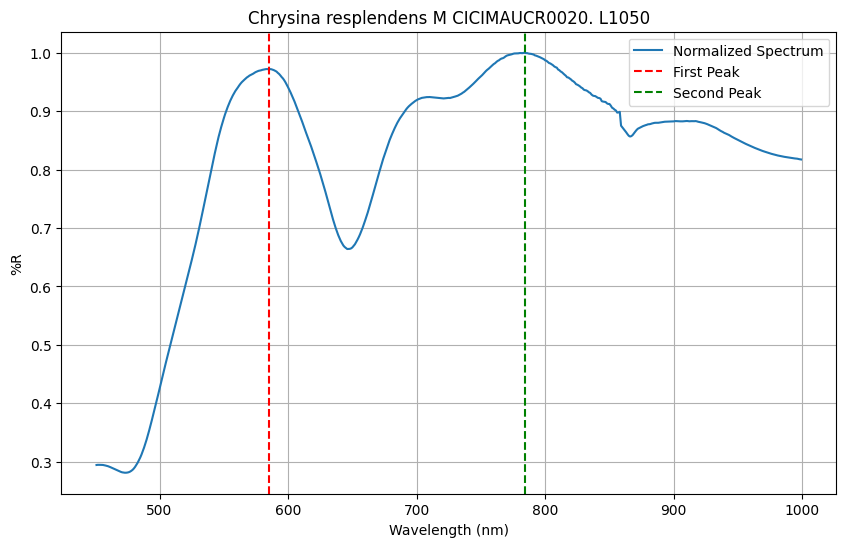

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

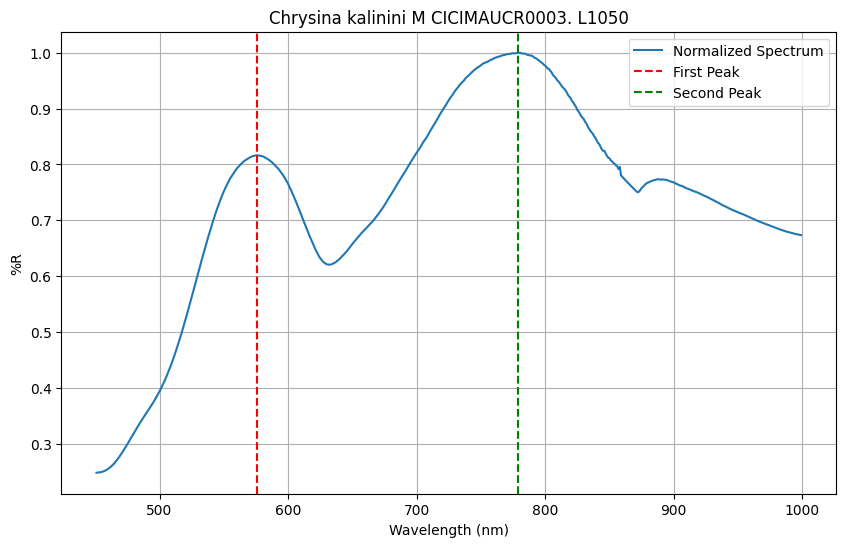

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

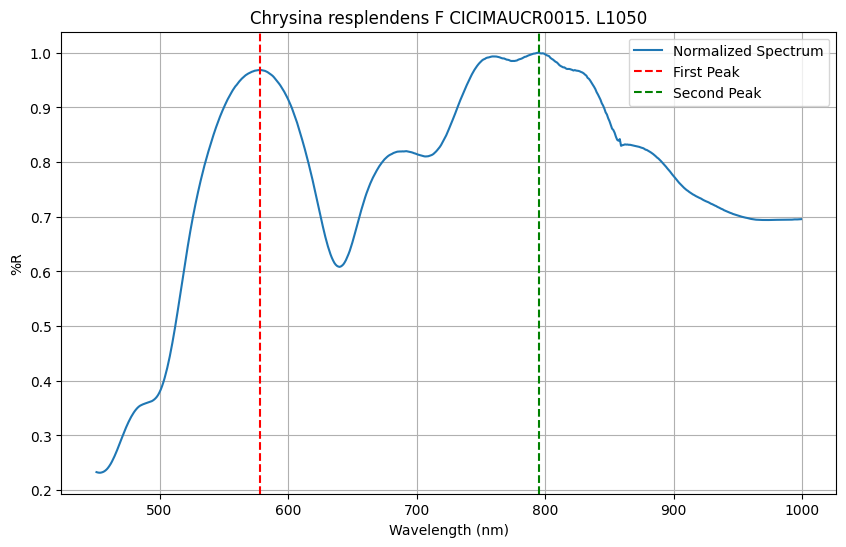

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

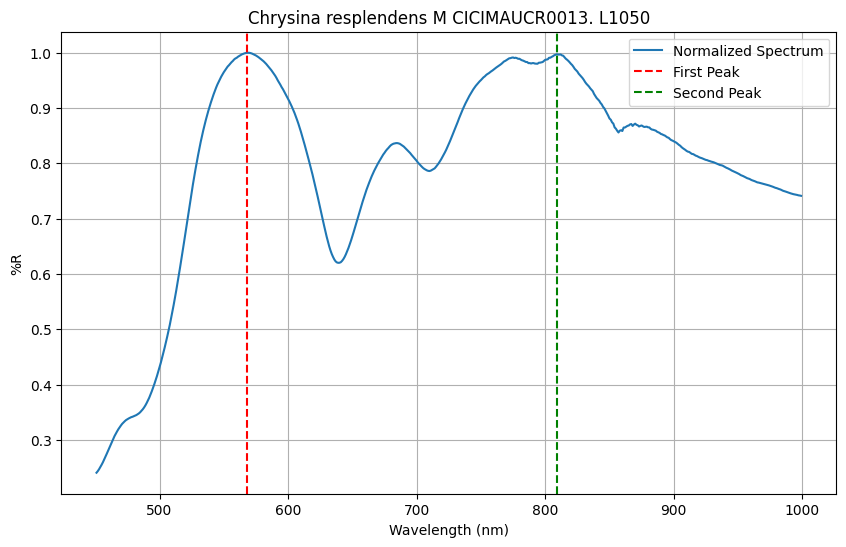

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

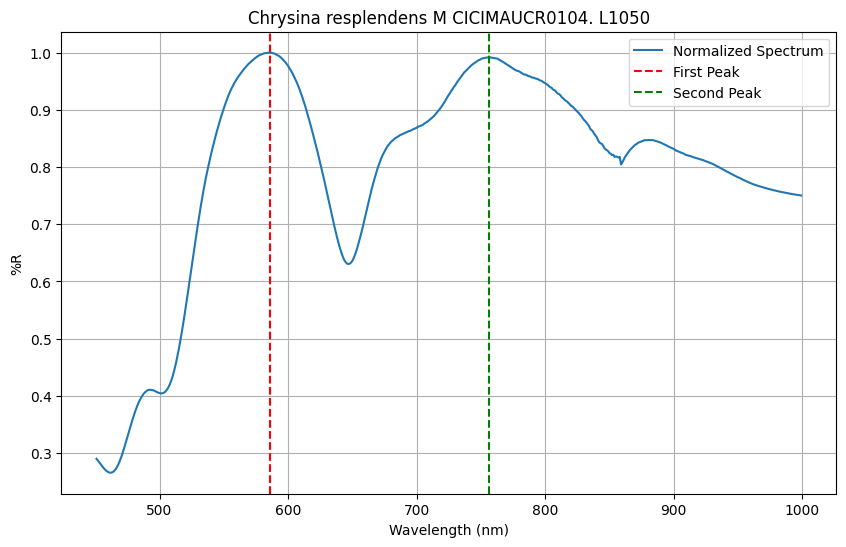

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

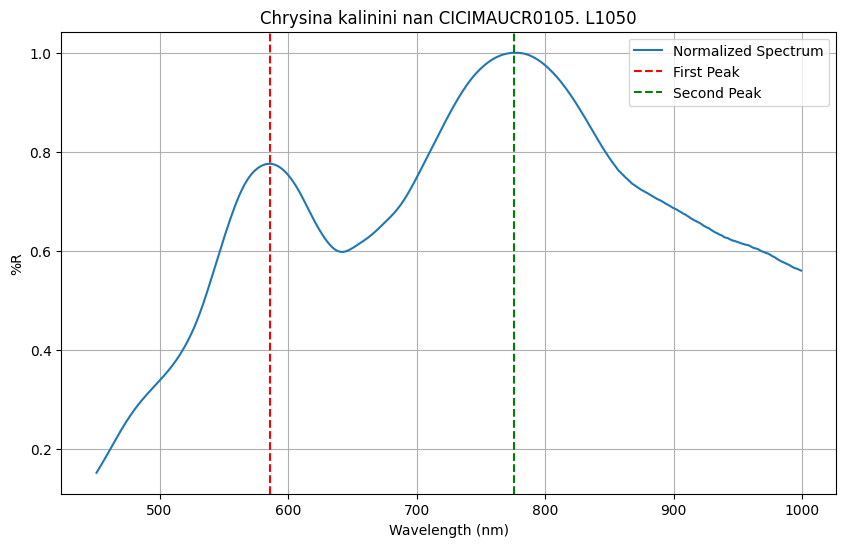

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

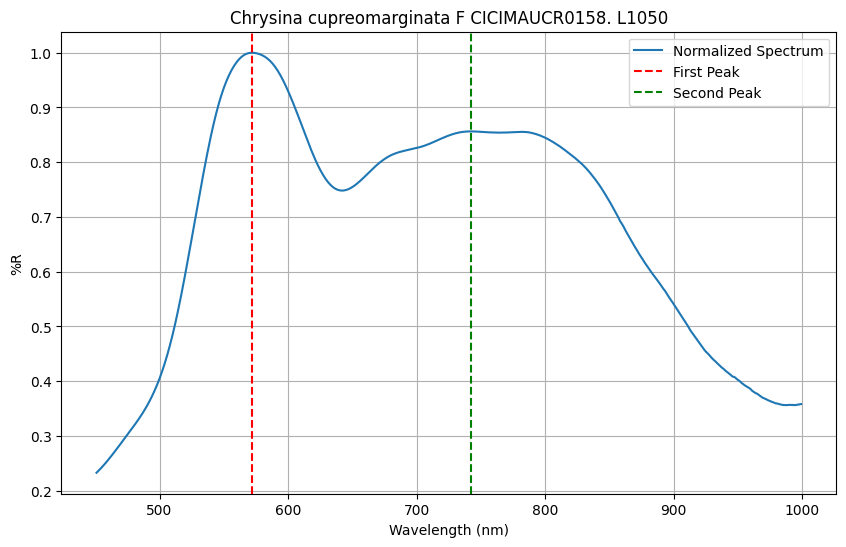

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

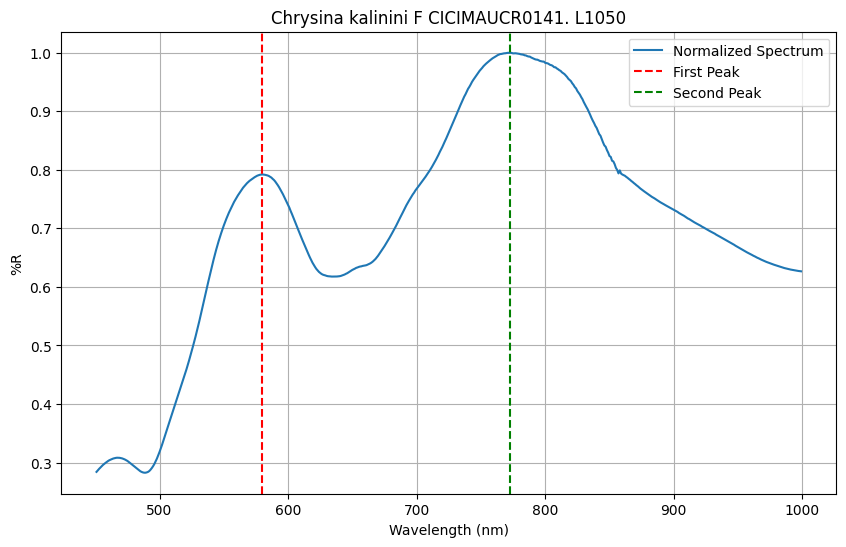

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

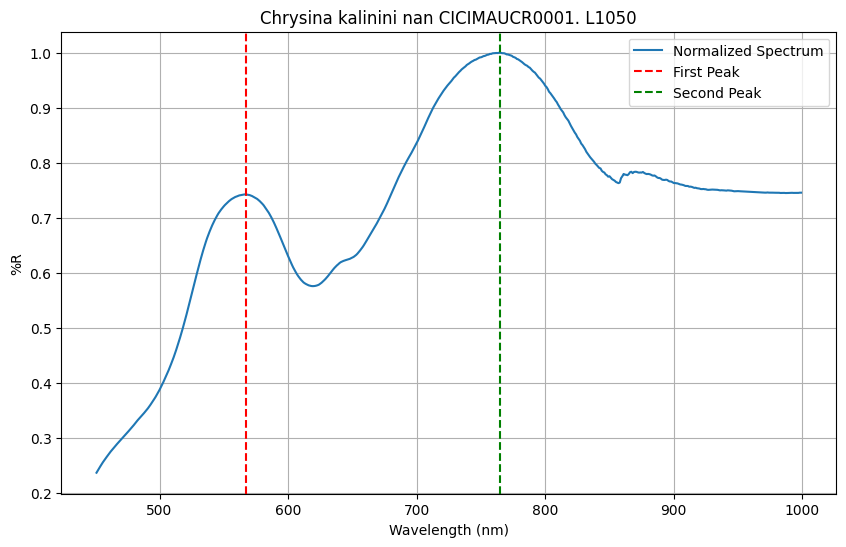

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

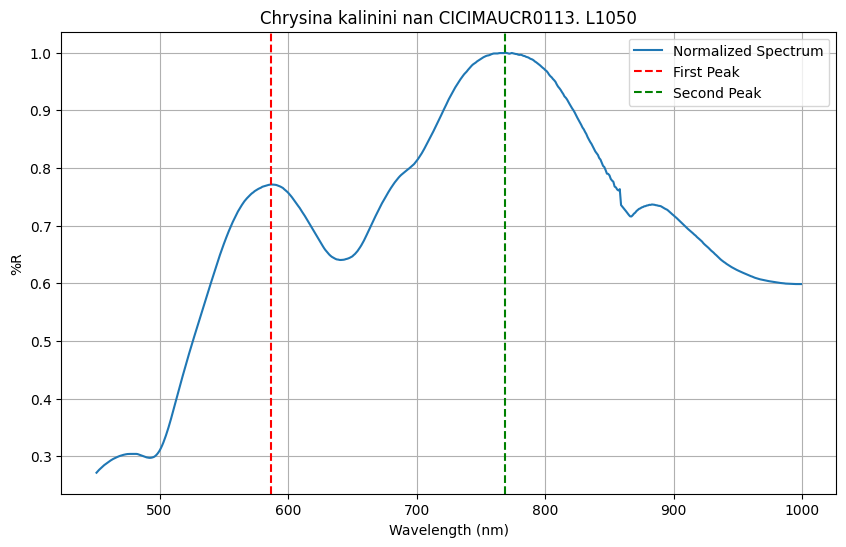

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

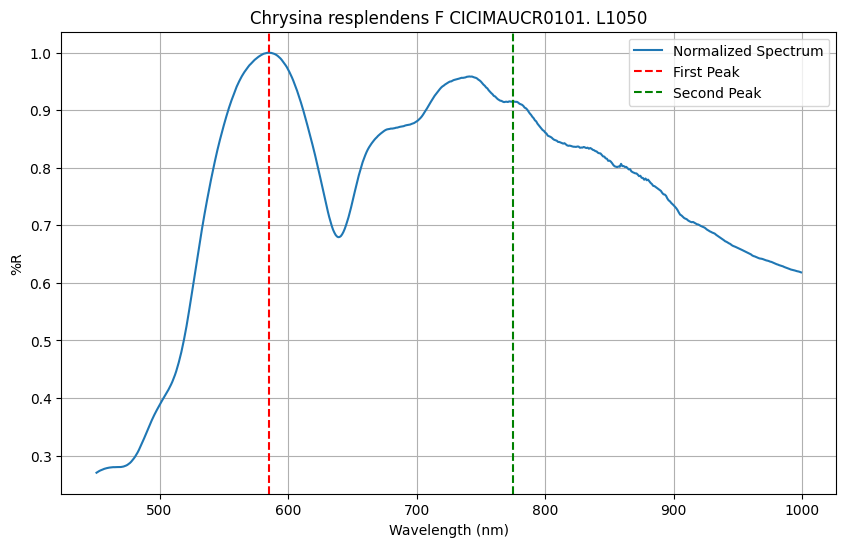

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

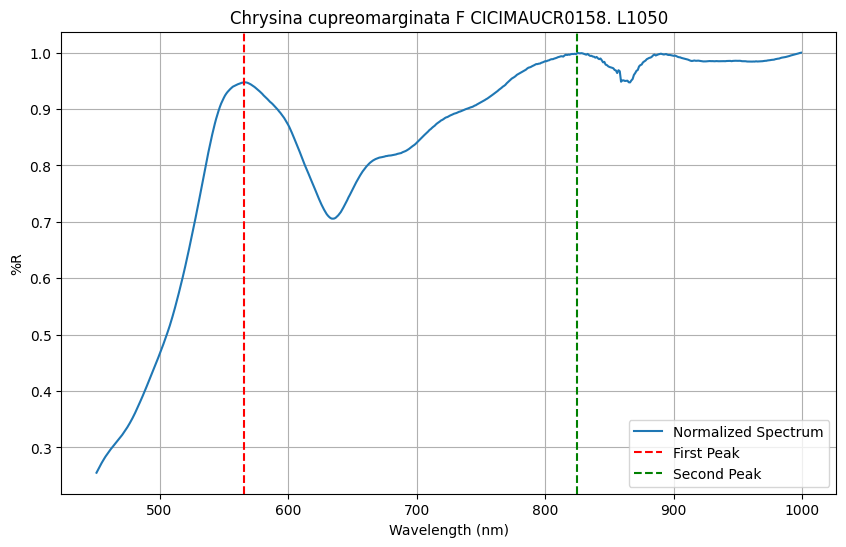

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

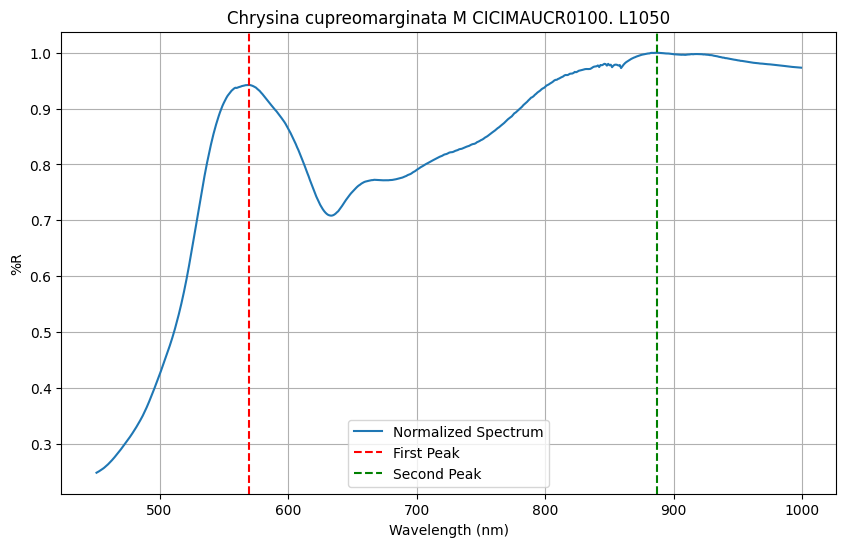

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

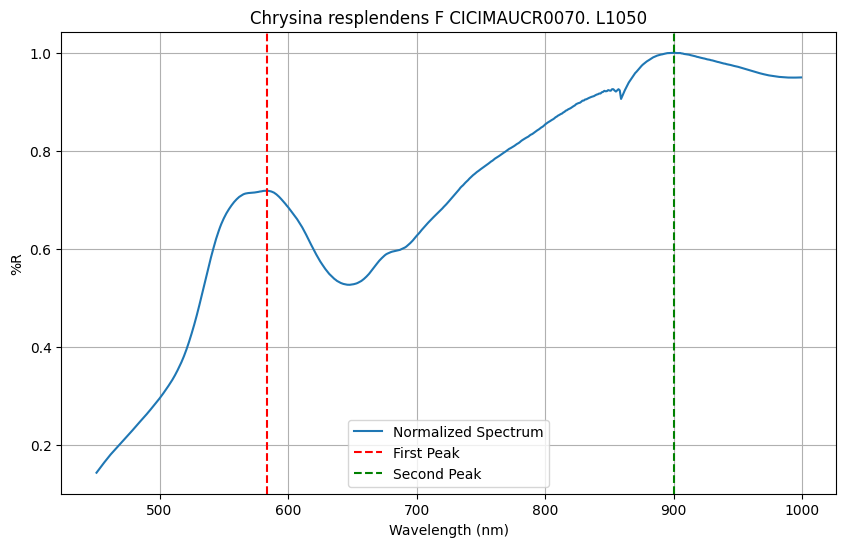

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

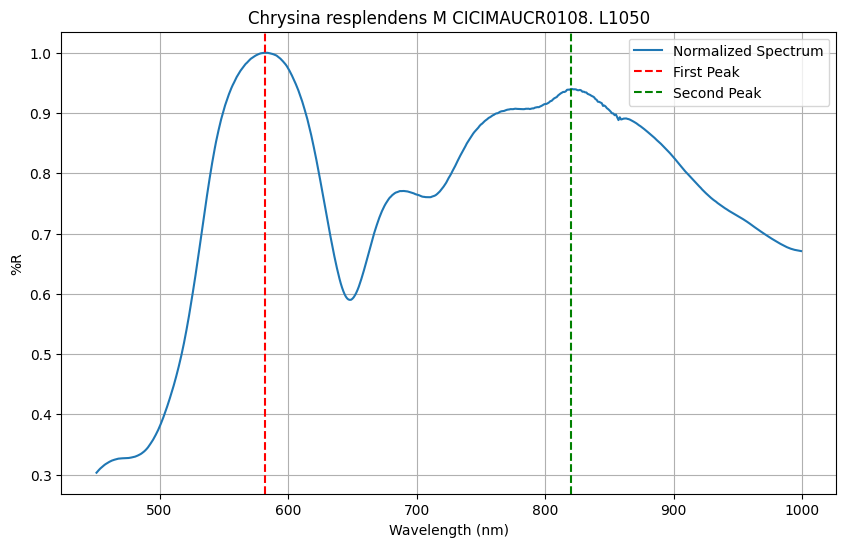

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

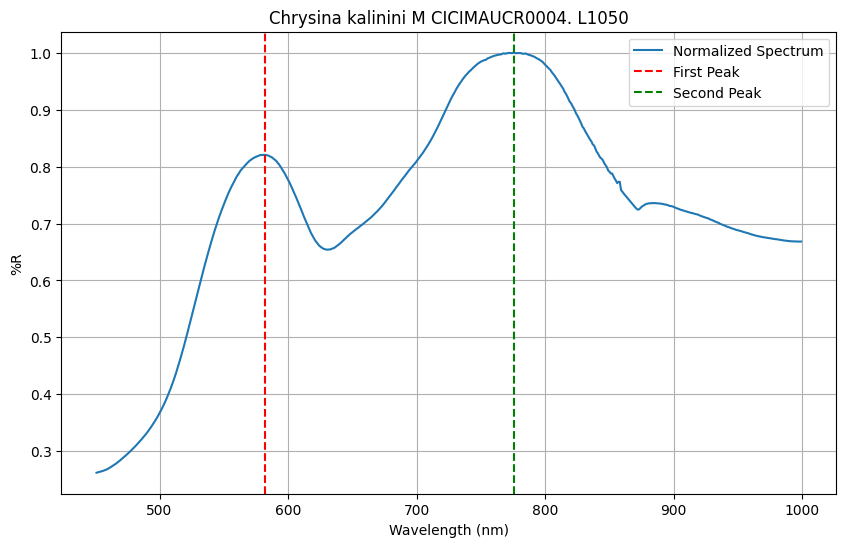

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

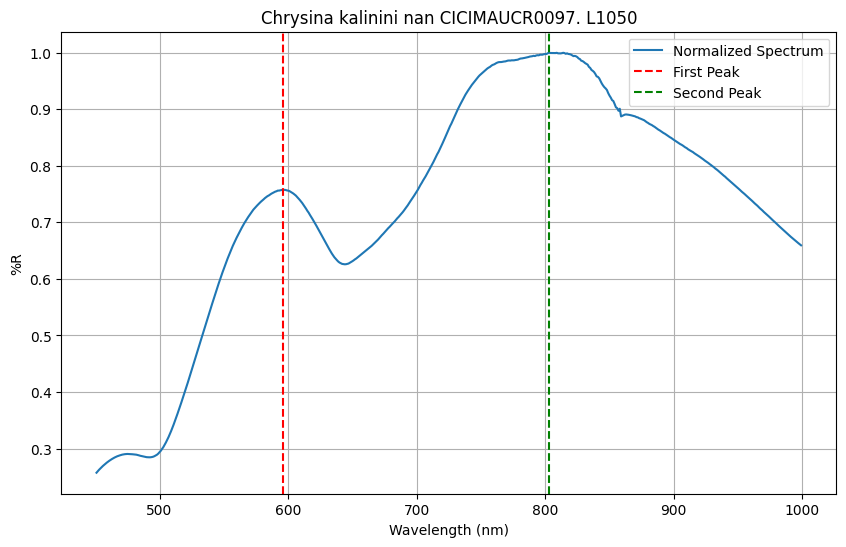

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

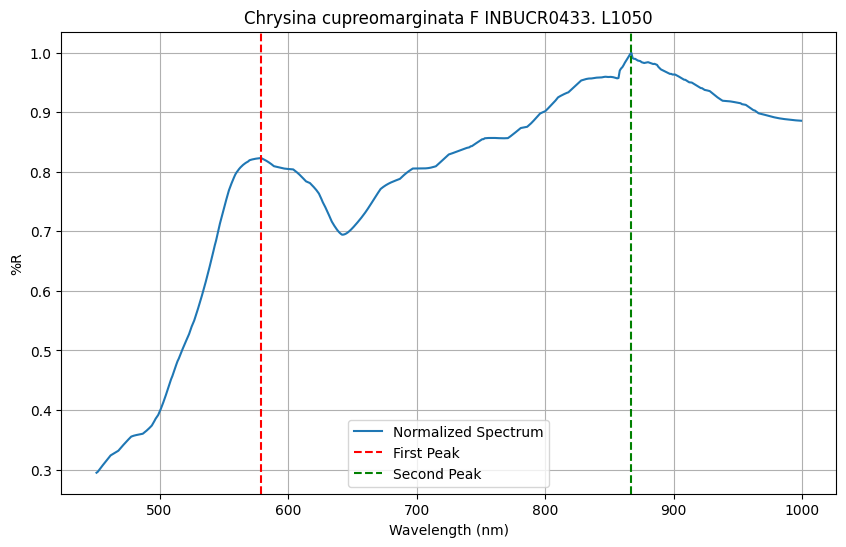

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

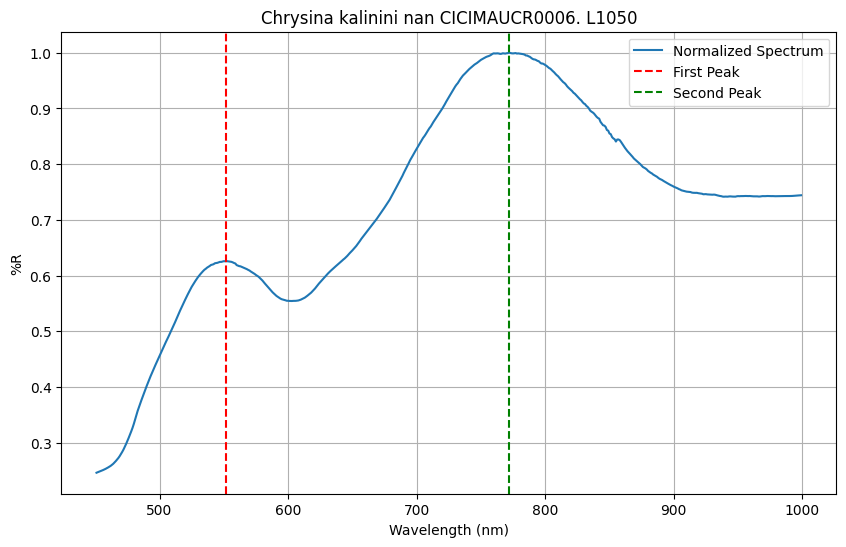

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

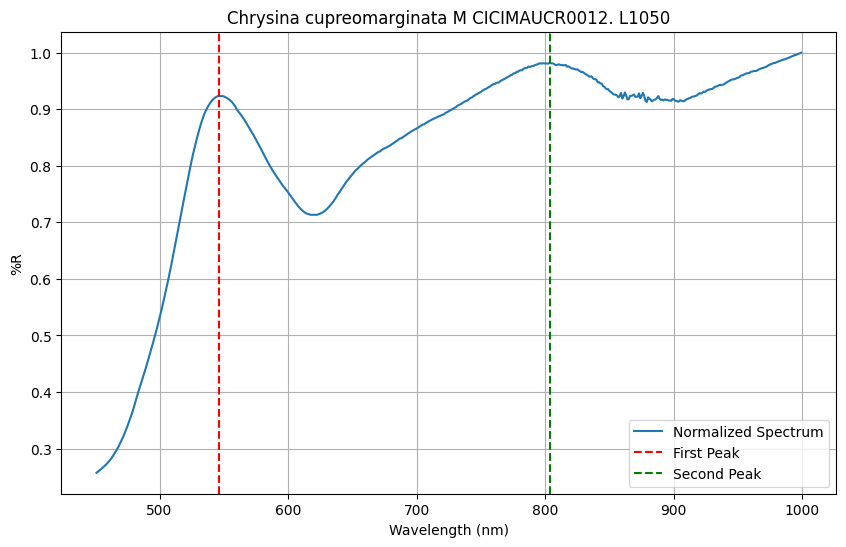

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

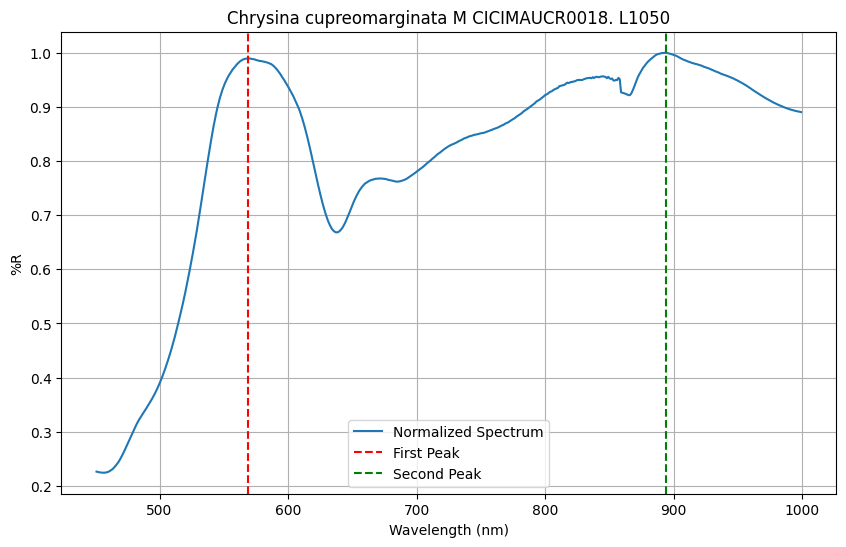

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Gamma_First_Two_Peaks: Getting metric value
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
Sp

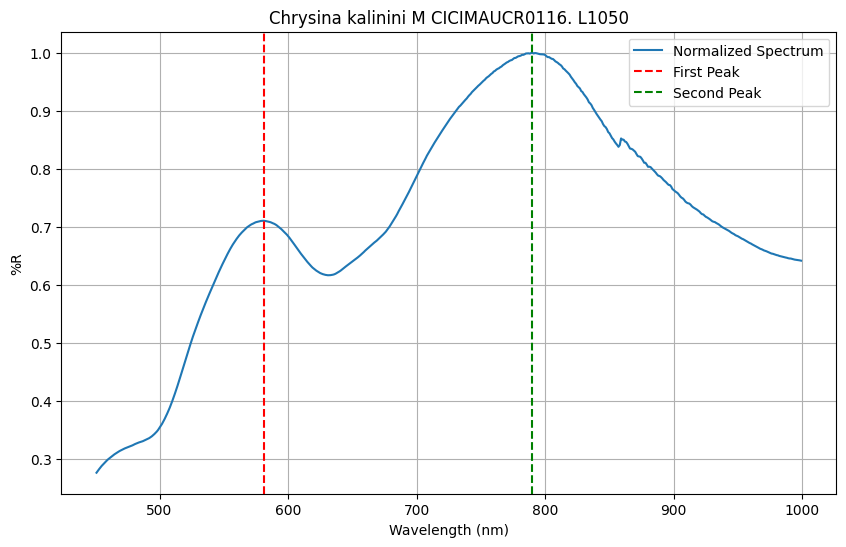

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0


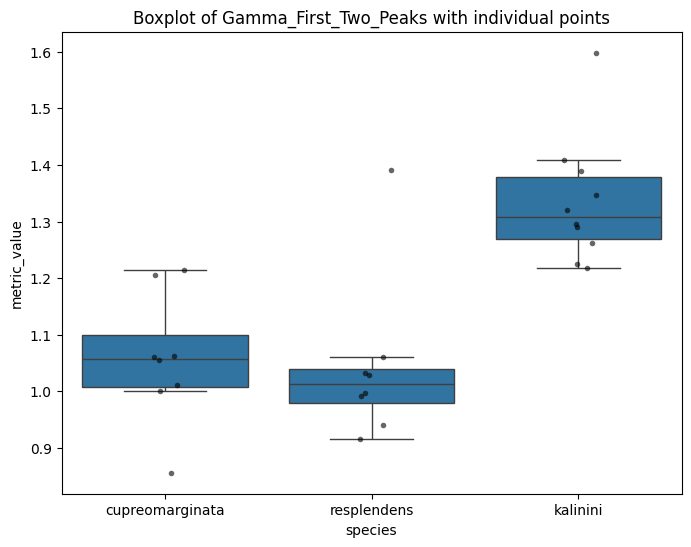

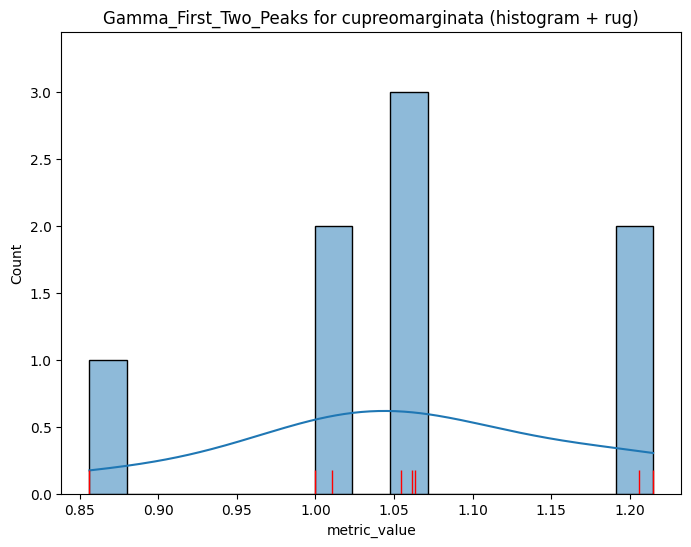

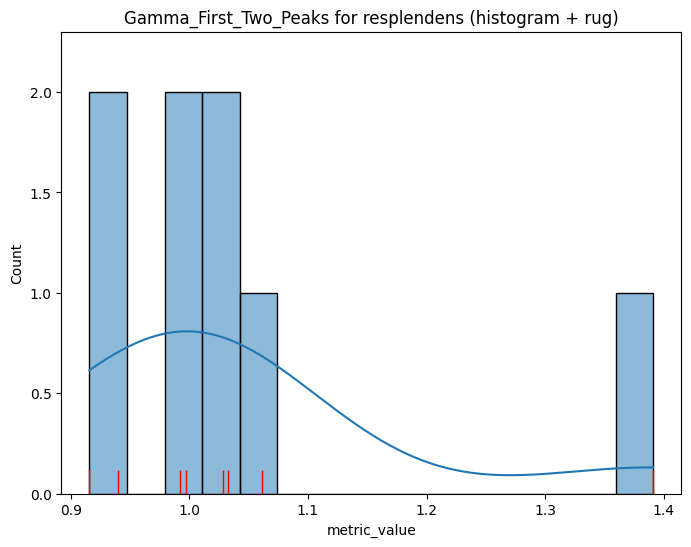

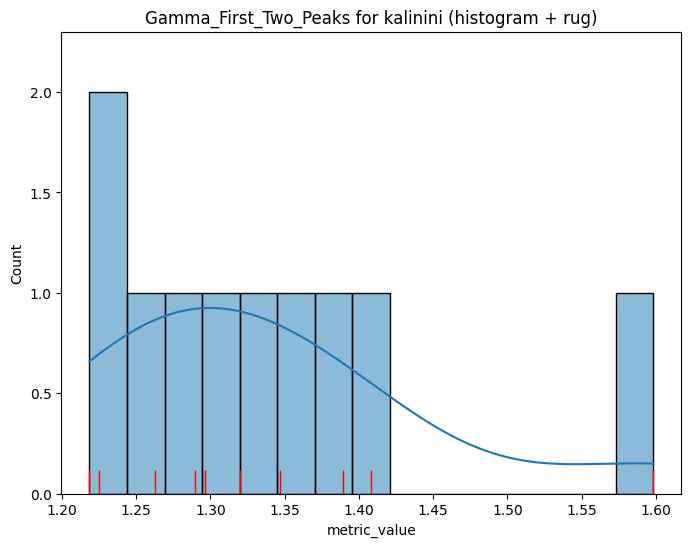

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,1.0583,0.1151,1.0580,0.8563,1.2148,8,0.0910,0.1088
kalinini,1.3355,0.1117,1.3081,1.2186,1.5981,10,0.1097,0.0837
resplendens,1.0448,0.1479,1.0129,0.9158,1.3910,8,0.0607,0.1416


In [24]:
get_aggregated_data(Gamma_First_Two_Peaks,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Gamma_First_Two_Peaks_Golden

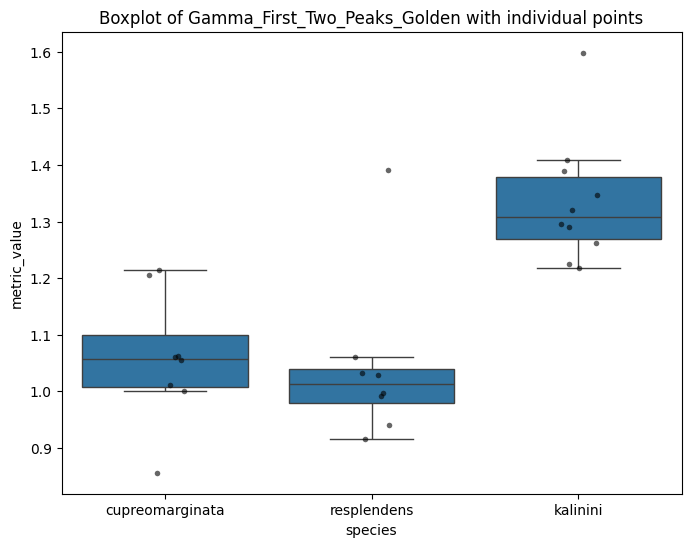

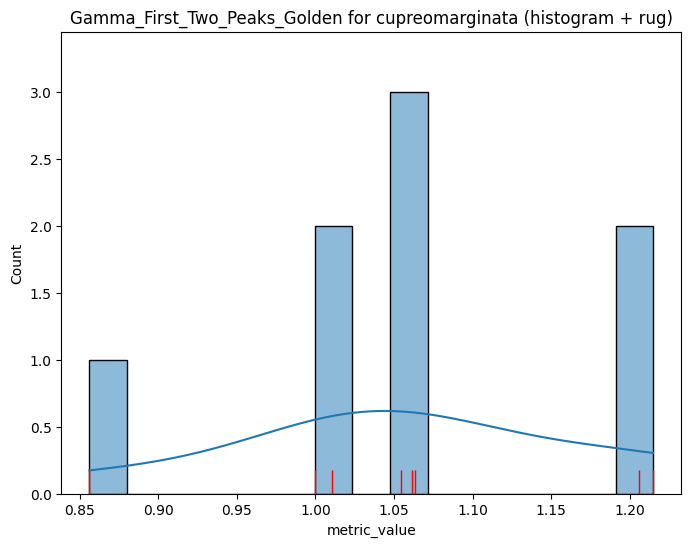

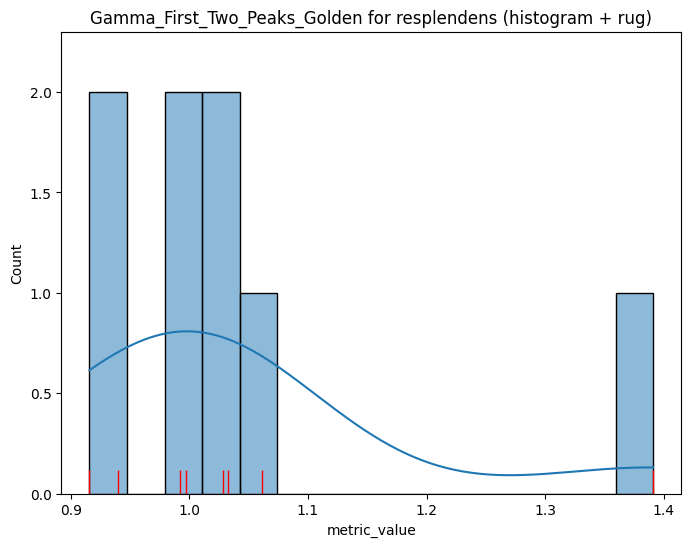

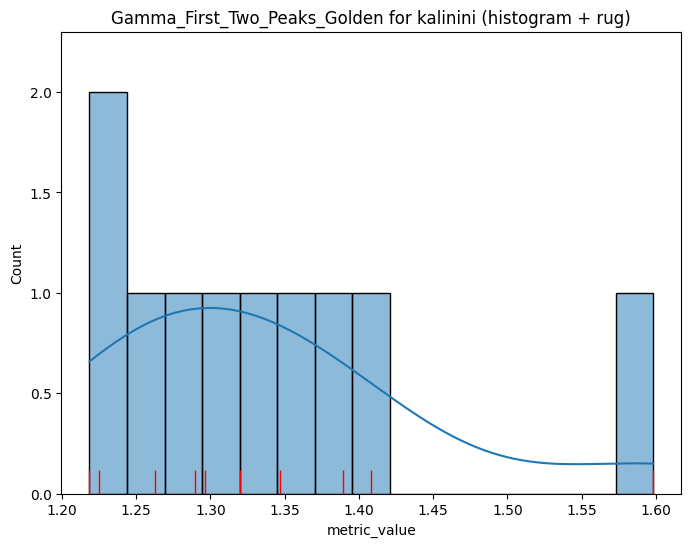

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,1.0583,0.1151,1.0580,0.8563,1.2148,8,0.0910,0.1088
kalinini,1.3355,0.1117,1.3081,1.2186,1.5981,10,0.1097,0.0837
resplendens,1.0448,0.1479,1.0129,0.9158,1.3910,8,0.0607,0.1416


In [25]:
get_aggregated_data(Gamma_First_Two_Peaks_Golden,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Gamma_First_Two_Peaks_Simple

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.prominence_threshold_for_min=None
        self.prominence_threshold_for_max=None
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=160.0
        self.smallest_distance_between_peaks_for_max=160.0
        1.0
self.visible_range_start_wavelength=None
   

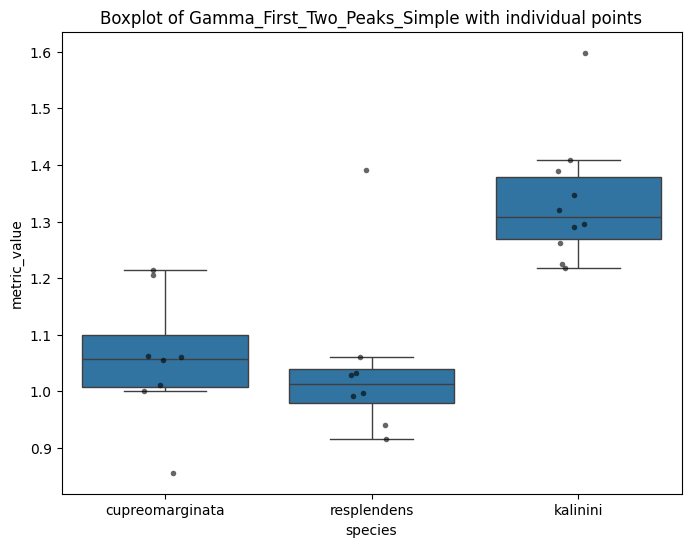

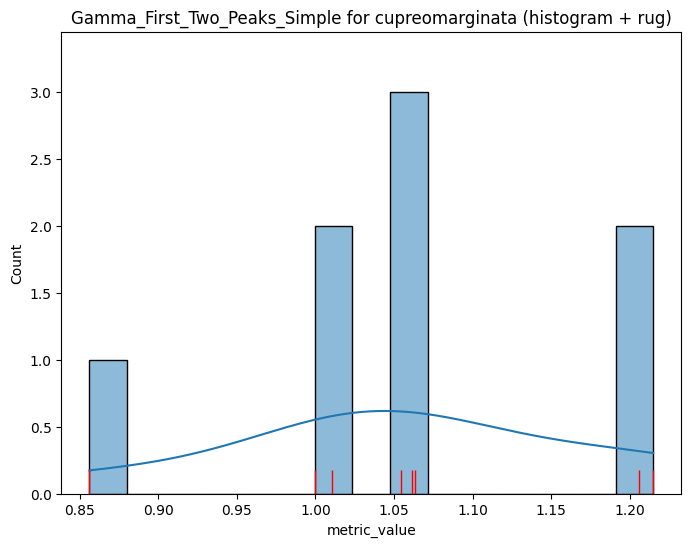

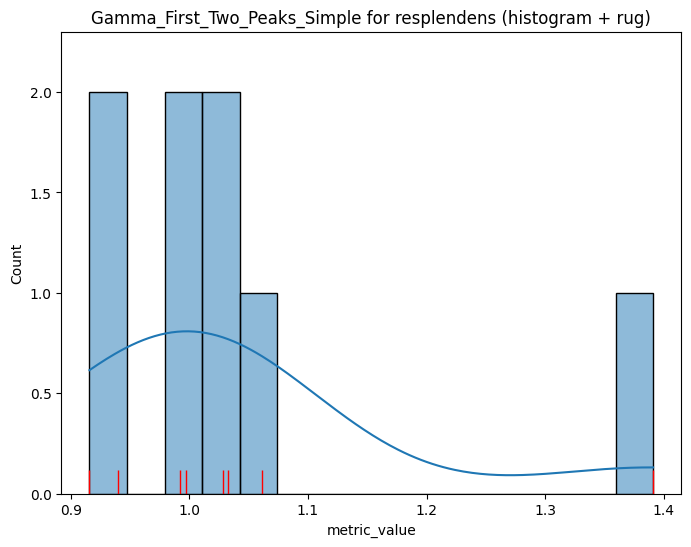

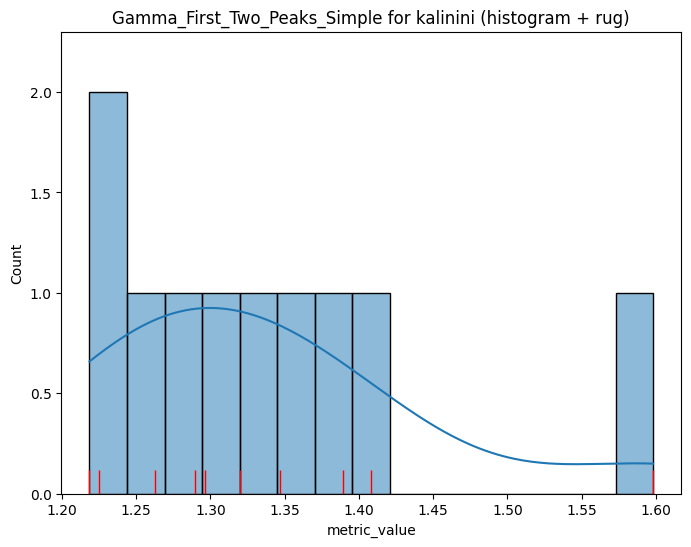

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,1.0583,0.1151,1.0580,0.8563,1.2148,8,0.0910,0.1088
kalinini,1.3355,0.1117,1.3081,1.2186,1.5981,10,0.1097,0.0837
resplendens,1.0448,0.1479,1.0129,0.9158,1.3910,8,0.0607,0.1416


In [26]:
get_aggregated_data(Gamma_First_Two_Peaks_Simple,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Critical_Points_Golden

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_st

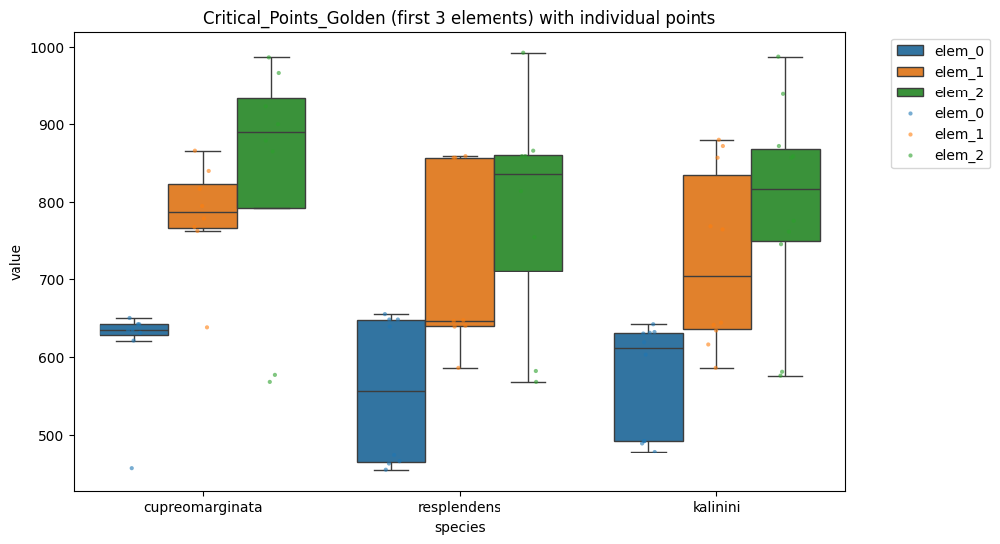

species cupreomarginata                                                    \
metric           elem_0    elem_1    elem_2    elem_3    elem_4    elem_5   
mean           613.8750  783.2500  833.2500  645.5000  570.2038  592.6136   
std             64.3727   68.7682  166.1159  146.9256  328.8403  441.6945   
median         634.5000  787.0000  889.5000  571.0000  707.0000  877.0000   
min            456.0000  638.0000  568.0000  546.0000   44.7323   46.2220   
max            650.0000  866.0000  987.0000  917.0000  825.0000  963.0000   
iqr             13.5000   56.0000  141.0000   77.2500  255.0254  836.5753   
cv               0.1049    0.0878    0.1994    0.2276    0.5767    0.7453   

species                                      ... resplendens            \
metric    elem_6   elem_7   elem_8   elem_9  ...      elem_6    elem_7   
mean     43.5751  51.6269  40.9593  39.3711  ...    240.5944  173.6455   
std      20.0597  22.0795  29.5389  29.0568  ...    360.6973  332.9481   
median   47.3155  56.0234  54.0095  49.8327  ...     75.1252   71.6845   
min      15.3167  18.8888   0.0000   0.0000  ...      0.0000    0.0000   
max      68.4773  82.5713  67.0567  70.6694  ...    850.0000  994.0000   
iqr      24.7794  23.4126  49.6648  48.9695  ...    236.9768   42.2692   
cv        0.4603   0.4277   0.7212   0.7380  ...      1.4992    1.9174   

species                                                                 \
metric    elem_8   elem_9  elem_10  elem_11  elem_12  elem_13  elem_14   
mean     53.5970  69.8502  38.6382  37.6913  21.8669  18.5229  11.1901   
std      27.5006  30.7018  41.9895  41.2028  40.4917  34.2997  31.6505   
median   66.0141  79.9972  32.4635  31.0636   0.0000   0.0000   0.0000   
min       0.0000   0.0000   0.0000   0.0000   0.0000   0.0000   0.0000   
max      75.1671  93.4164  92.6724  92.0317  88.2347  74.7809  89.5212   
iqr      16.3063  16.1483  75.0120  70.9484  21.6751  18.3506   0.0000   
cv        0.5131   0.4395   1.0867   1.0932   1.8517   1.8517   2.8284   

species           
metric   elem_15  
mean      7.7782  
std      22.0000  
median    0.0000  
min       0.0000  
max      62.2253  
iqr       0.0000  
cv        2.8284  

[7 rows x 48 columns]

In [27]:
get_aggregated_data(Critical_Points_Golden,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Gamma_Gaussian_Fit

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=None
        self.smallest_distance_between_peaks_for_max=None
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_min

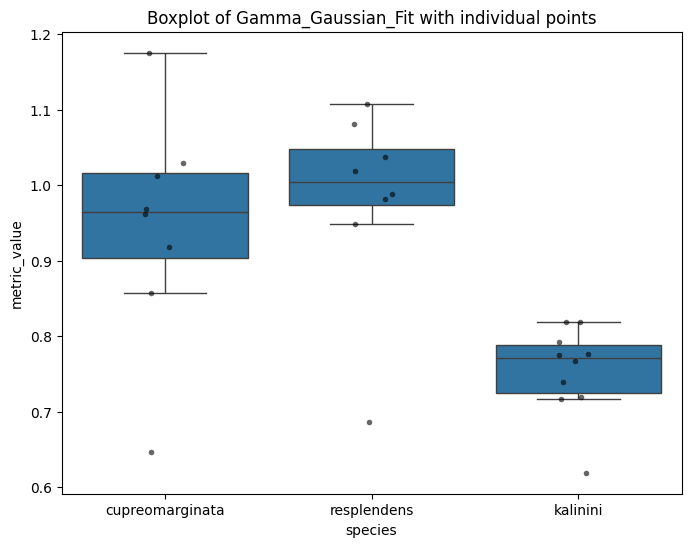

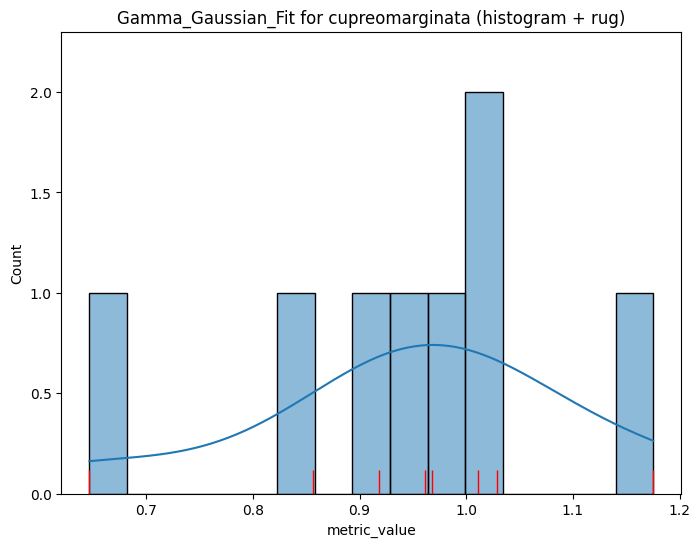

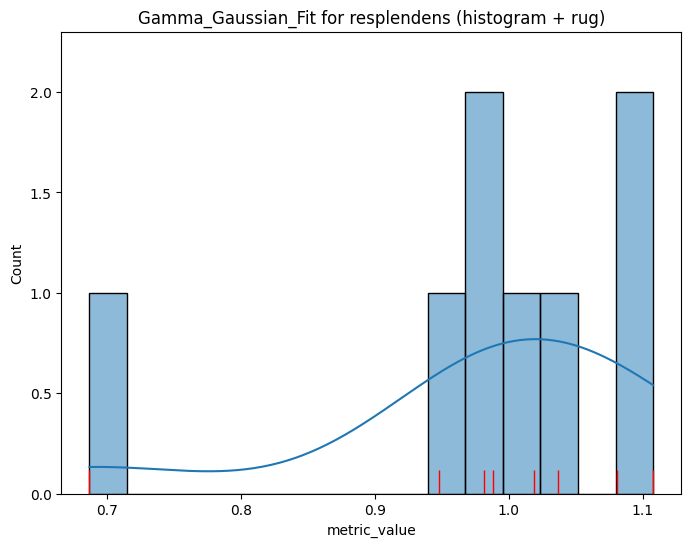

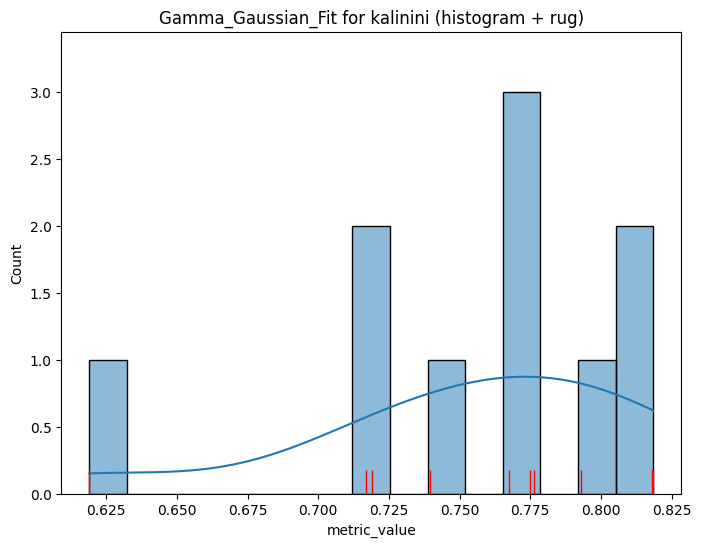

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,0.9459,0.1525,0.9647,0.6466,1.1752,8,0.1126,0.1612
kalinini,0.7543,0.0595,0.7711,0.6191,0.8185,10,0.0645,0.0789
resplendens,0.9811,0.1301,1.0035,0.6866,1.1078,8,0.0748,0.1326


In [28]:
get_aggregated_data(Gamma_Gaussian_Fit,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

#### Gamma_Area_Under_Curve_Naive_Golden

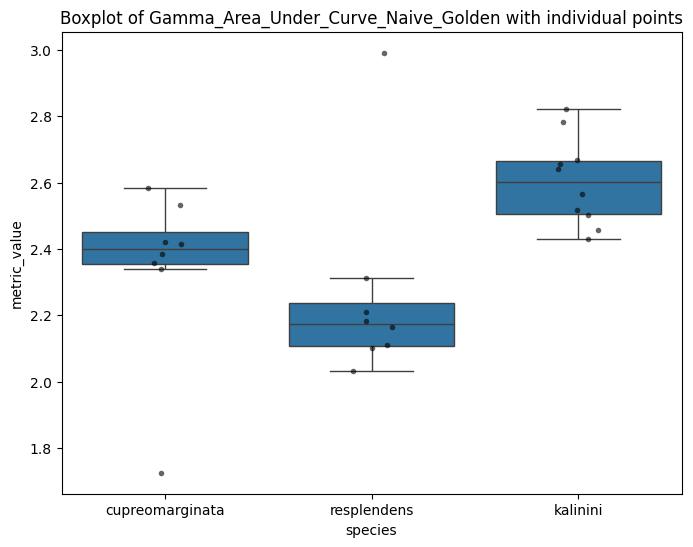

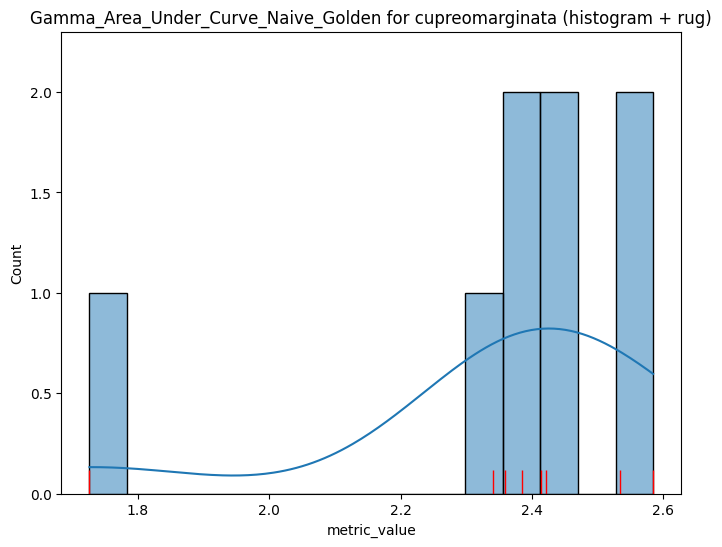

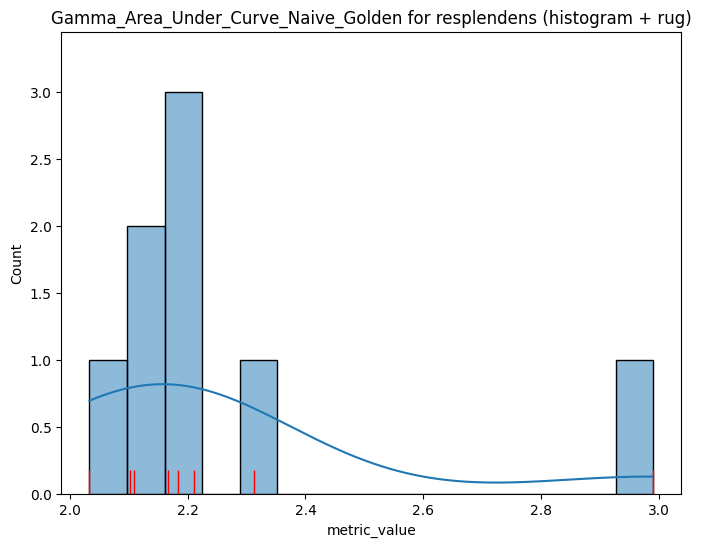

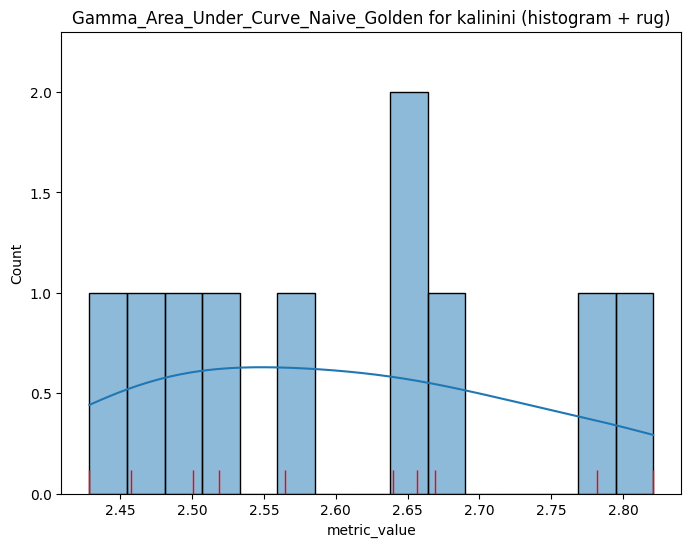

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,2.3455,0.2641,2.3992,1.7262,2.5845,8,0.0954,0.1126
kalinini,2.6038,0.1327,2.6022,2.4287,2.8208,10,0.1607,0.0510
resplendens,2.2636,0.3054,2.1748,2.0329,2.9907,8,0.1288,0.1349


In [29]:
get_aggregated_data(Gamma_Area_Under_Curve_Naive_Golden,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

#### Gamma_Area_Under_Curve_First_Min_Cut

min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.4705573124519438
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bott

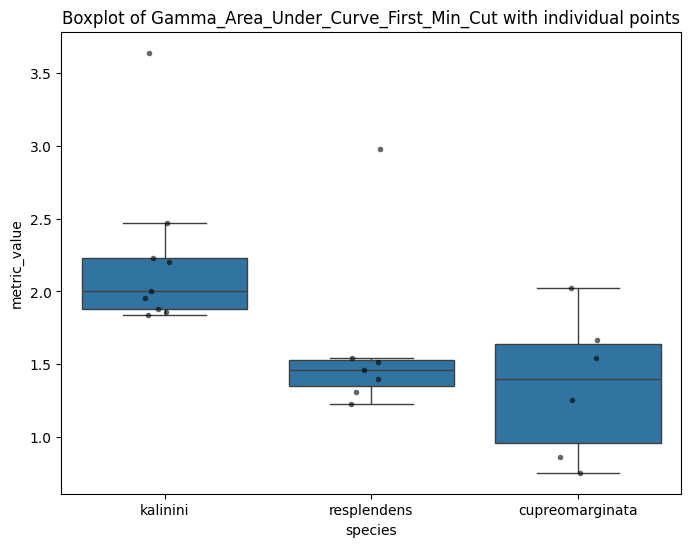

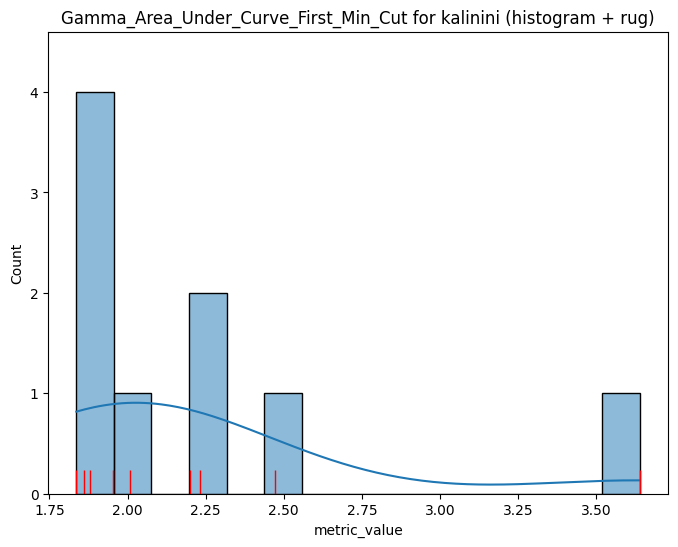

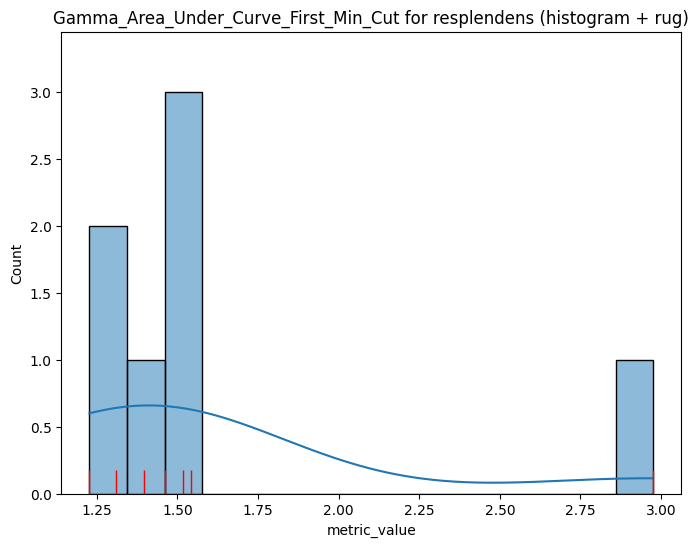

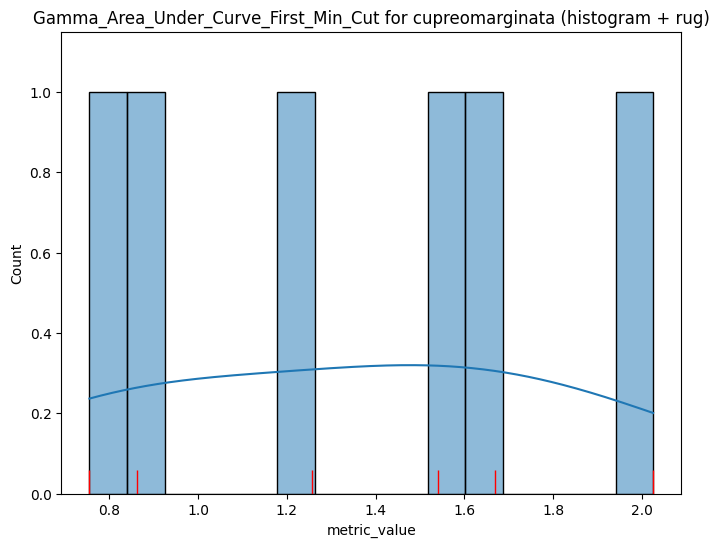

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
cupreomarginata,1.3515,0.4886,1.3992,0.7551,2.0251,6,0.6753,0.3616
kalinini,2.2309,0.5687,2.0067,1.8361,3.6399,9,0.3520,0.2549
resplendens,1.6328,0.6026,1.4619,1.2272,2.9754,7,0.1771,0.3690


In [30]:
get_aggregated_data(Gamma_Area_Under_Curve_First_Min_Cut,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = False)

#### Gamma_Vector_Relative_Reflectance

Getting equipment. Spectrum


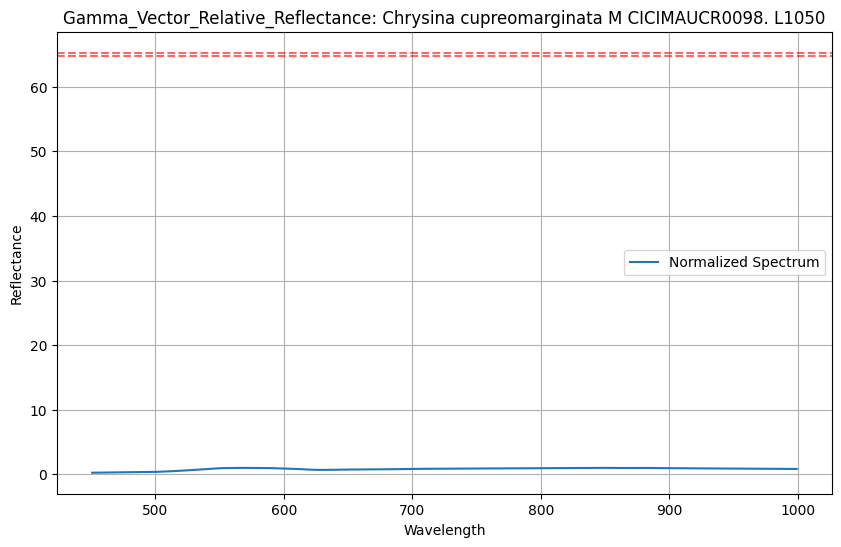

Getting equipment. Spectrum


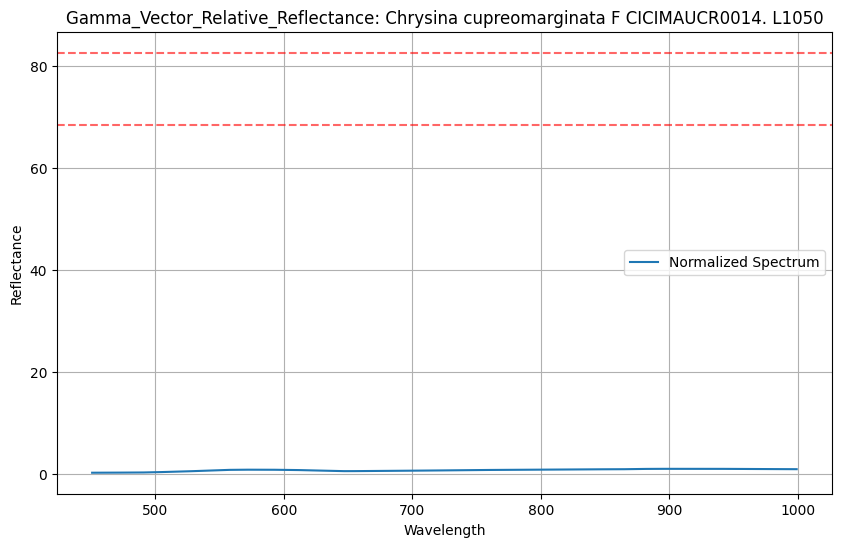

Getting equipment. Spectrum


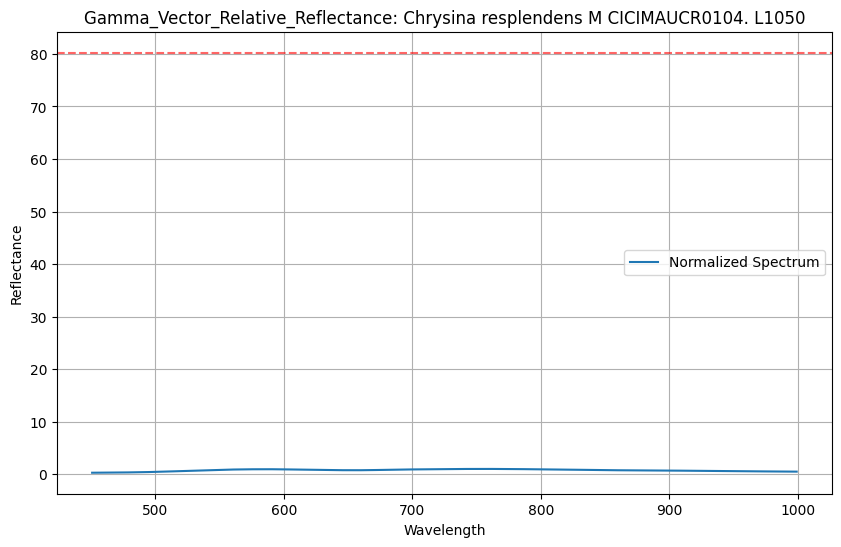

Getting equipment. Spectrum


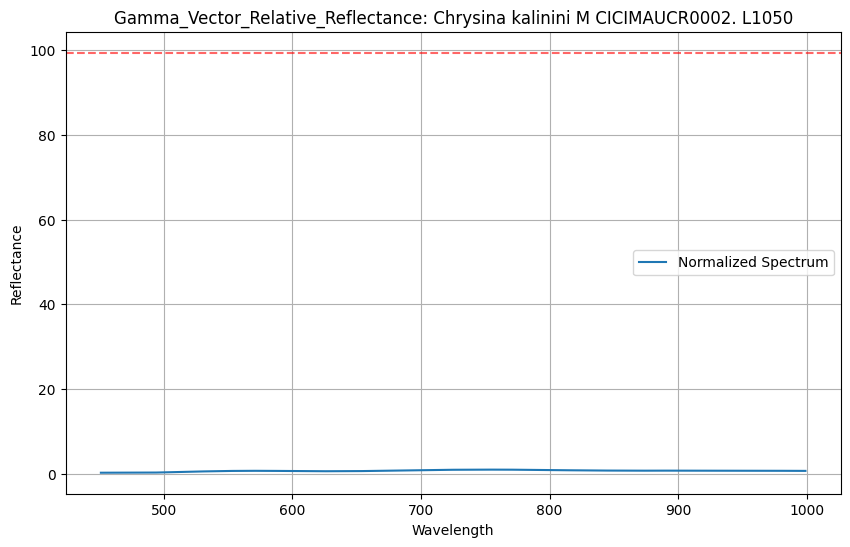

Getting equipment. Spectrum


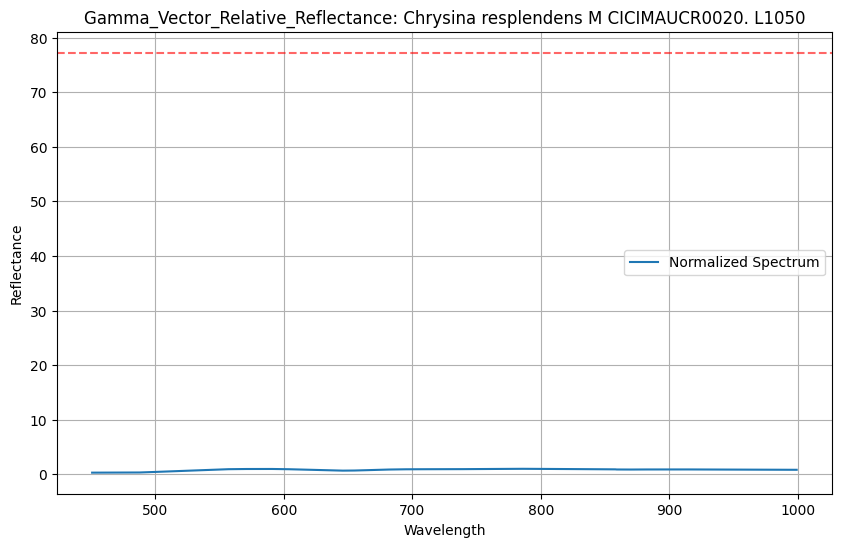

Getting equipment. Spectrum


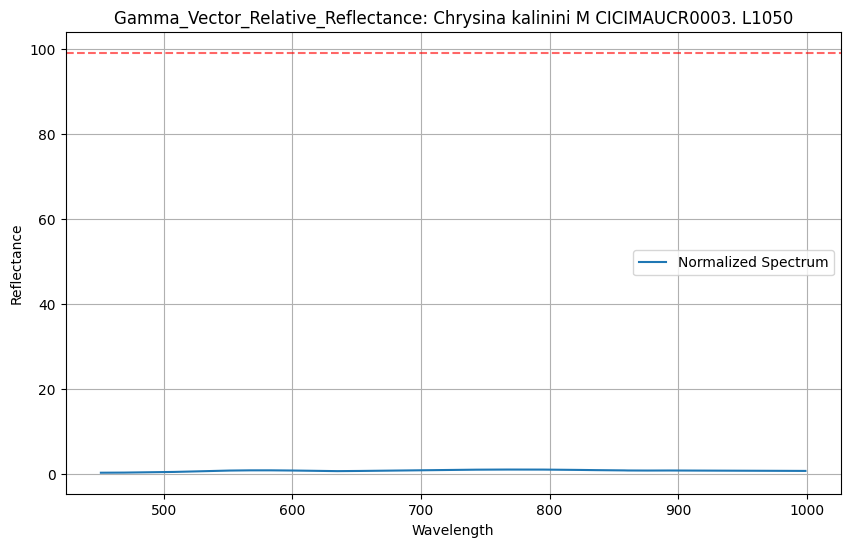

Getting equipment. Spectrum


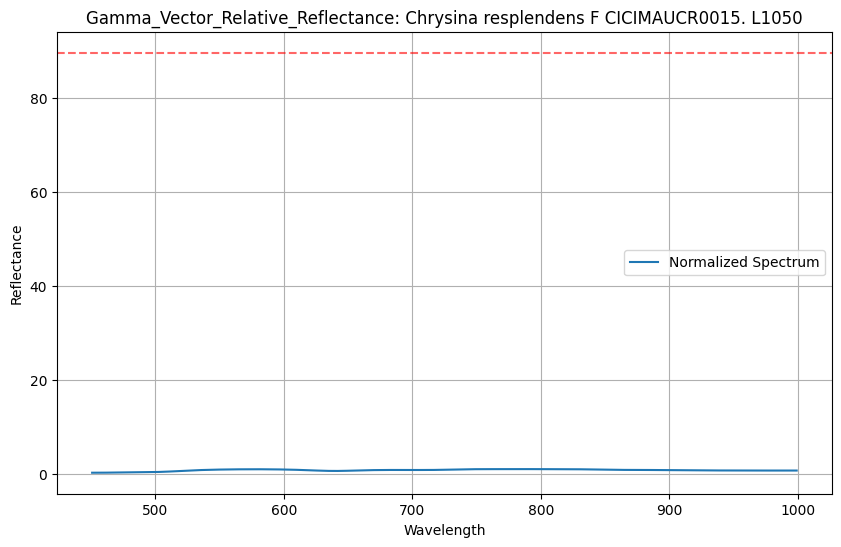

Getting equipment. Spectrum


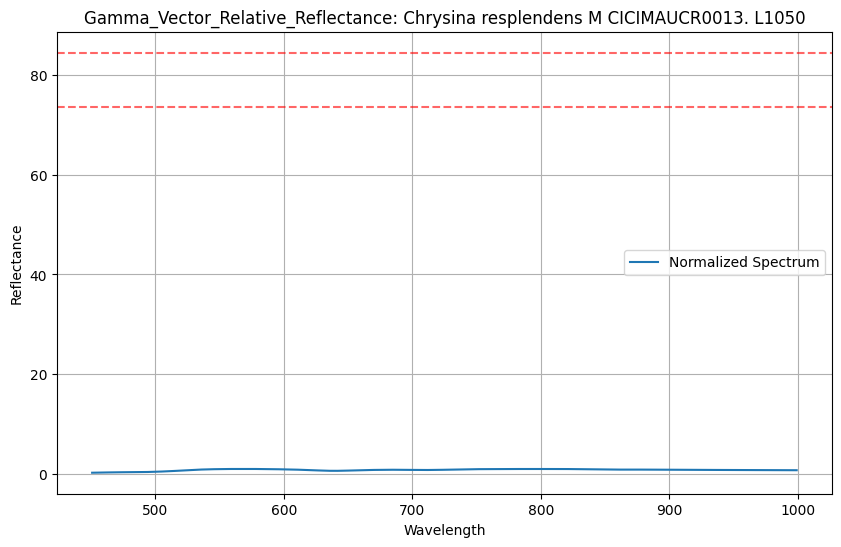

Getting equipment. Spectrum


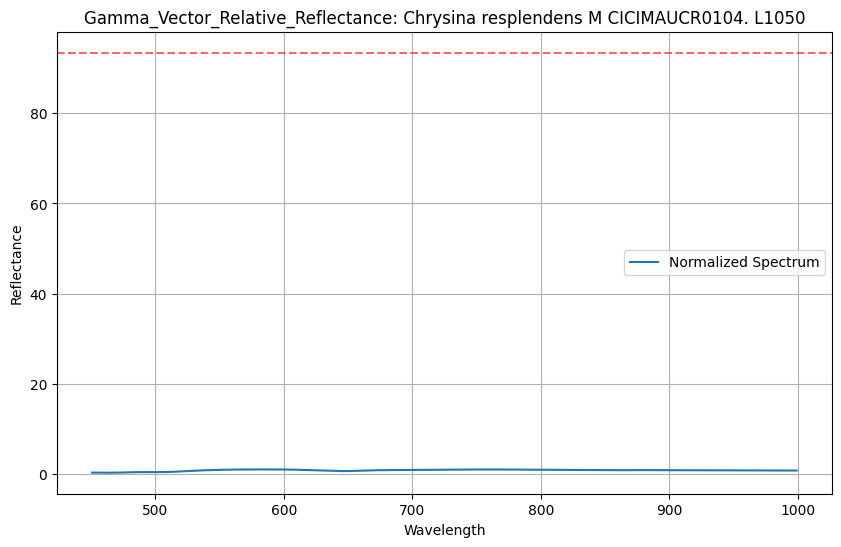

Getting equipment. Spectrum


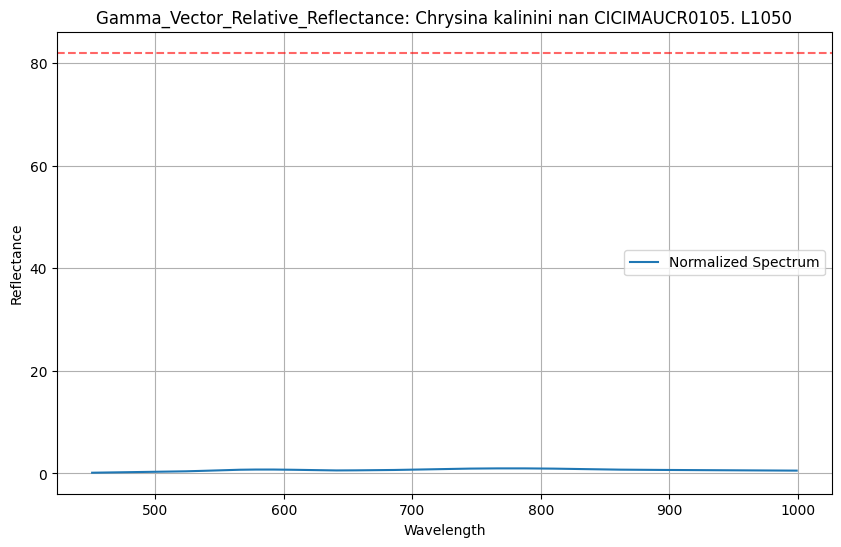

Getting equipment. Spectrum


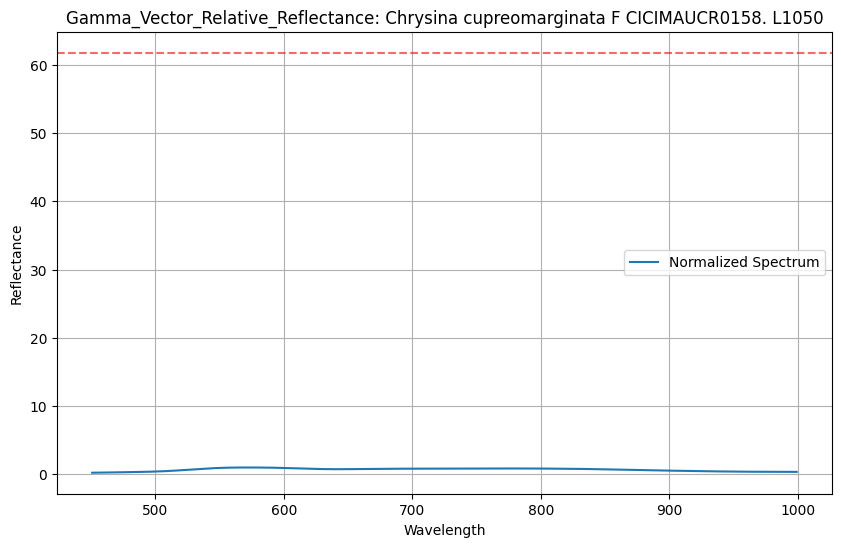

Getting equipment. Spectrum


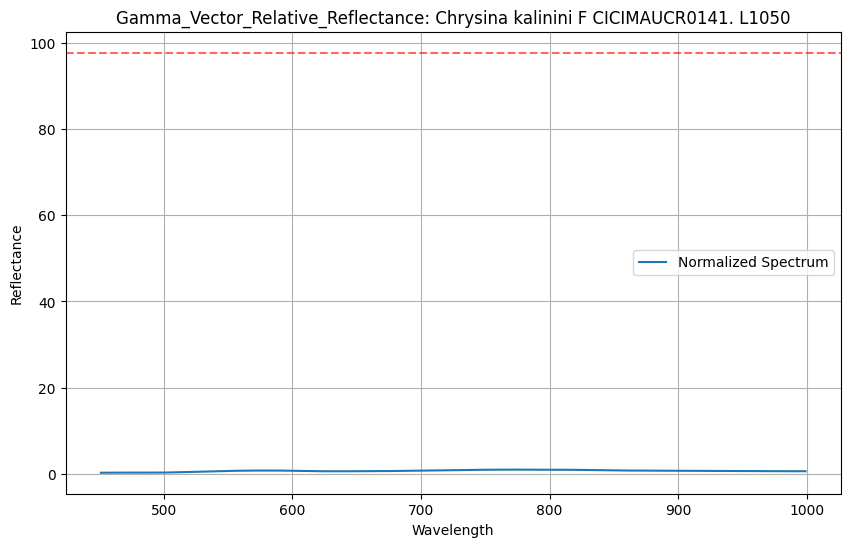

Getting equipment. Spectrum


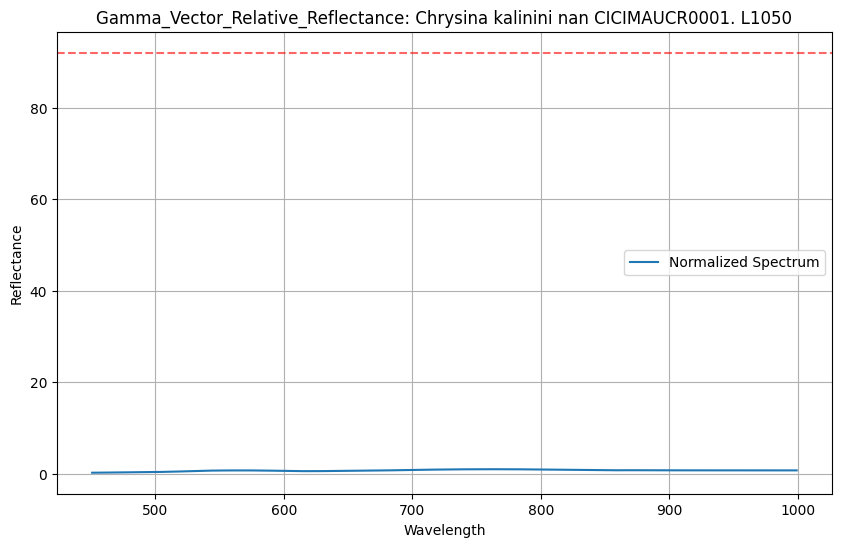

Getting equipment. Spectrum


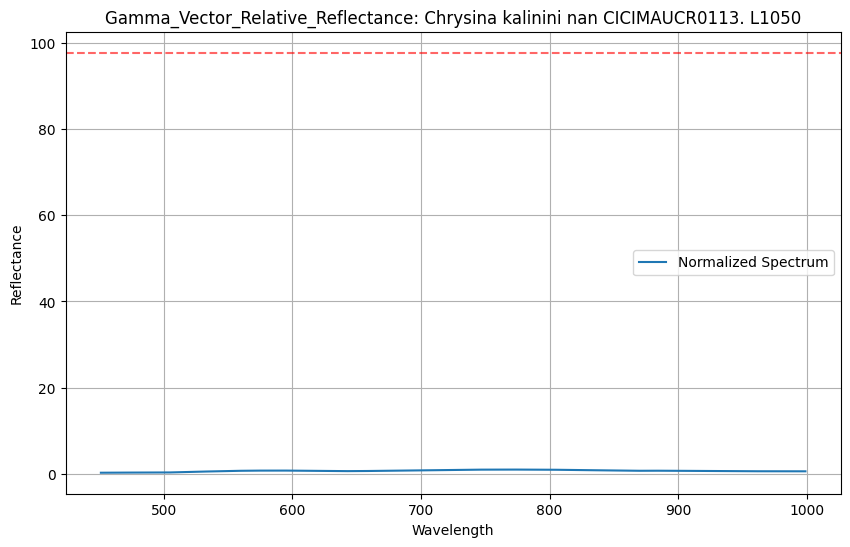

Getting equipment. Spectrum


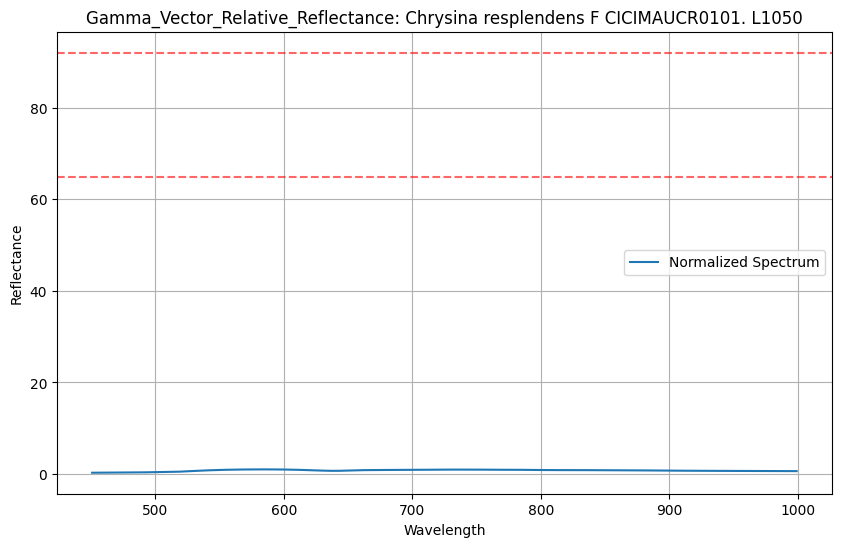

Getting equipment. Spectrum


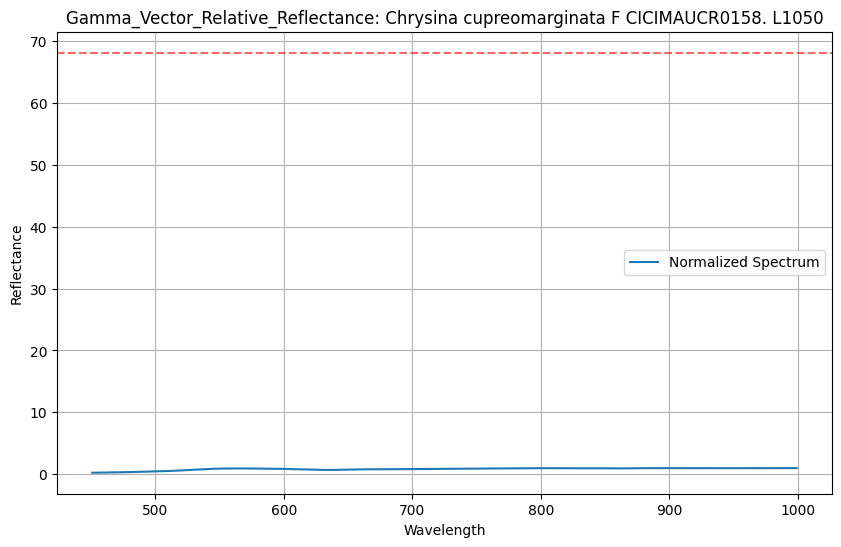

Getting equipment. Spectrum


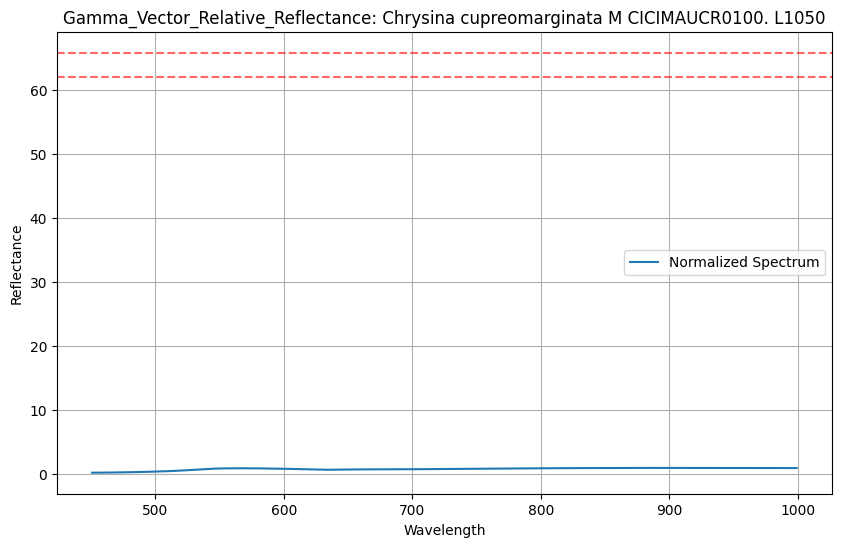

Getting equipment. Spectrum


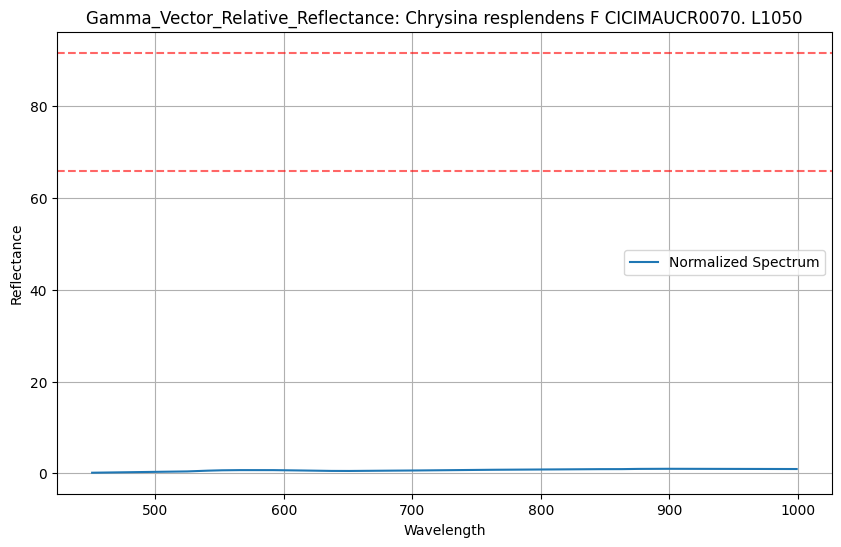

Getting equipment. Spectrum


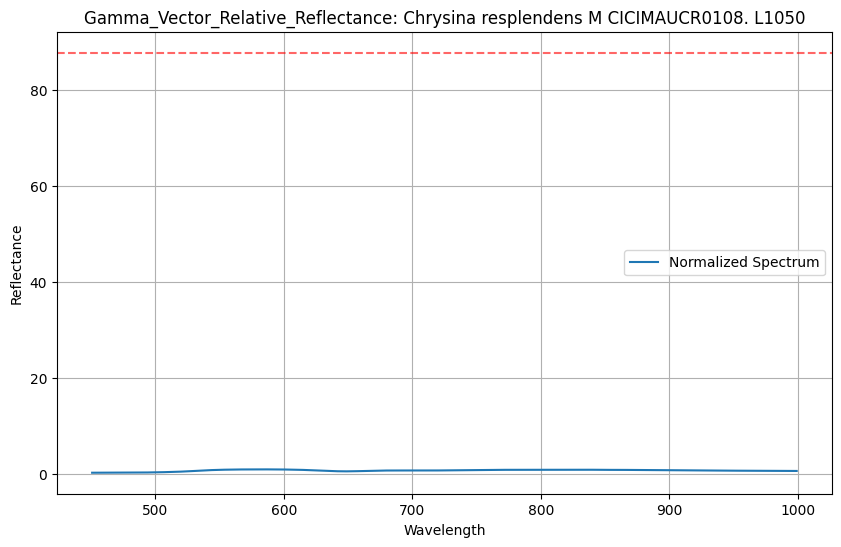

Getting equipment. Spectrum


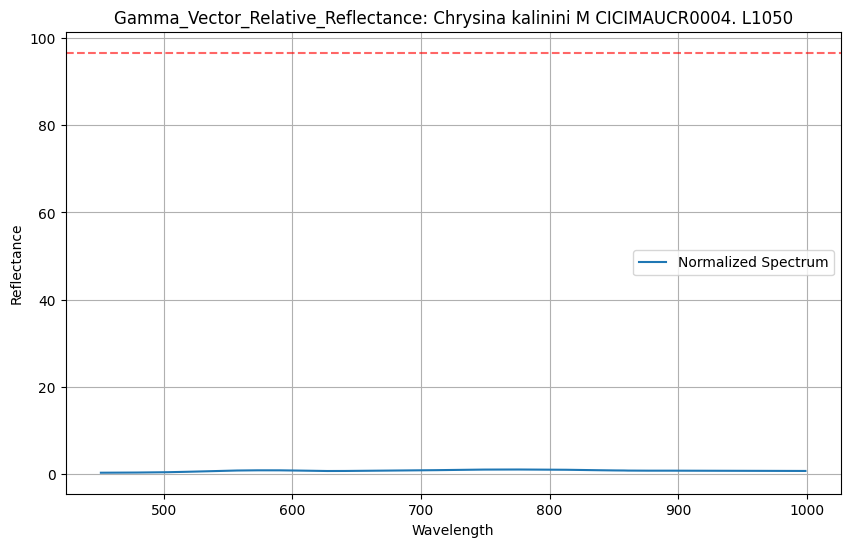

Getting equipment. Spectrum


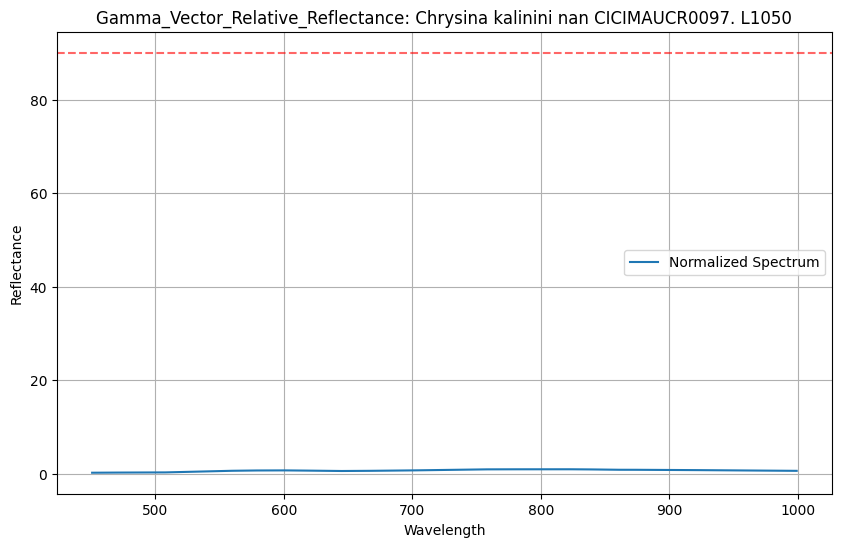

Getting equipment. Spectrum


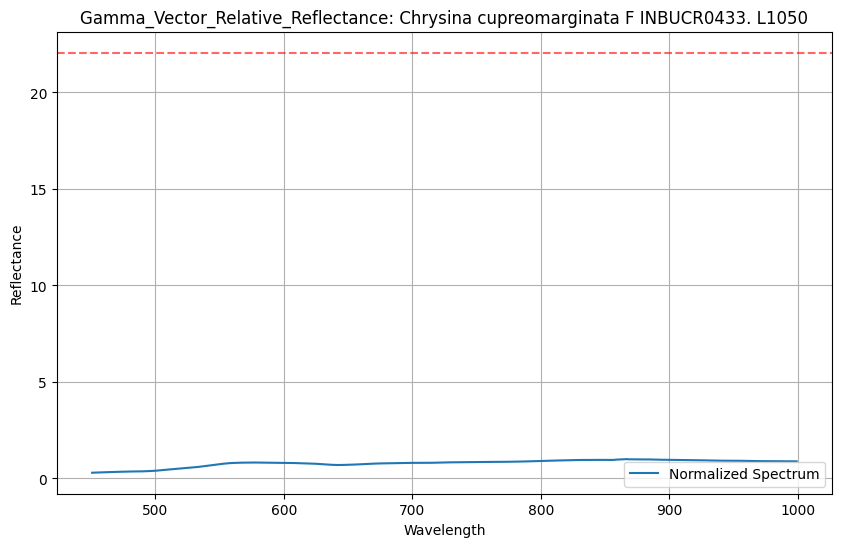

Getting equipment. Spectrum


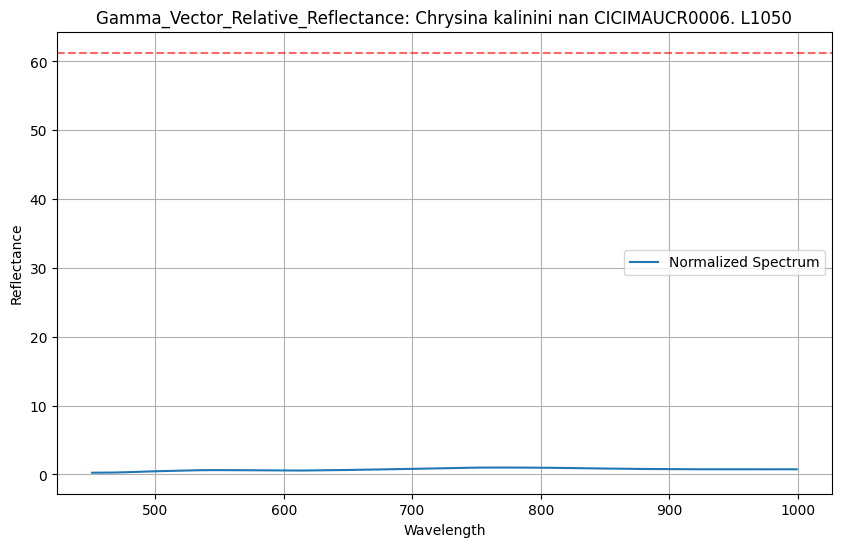

Getting equipment. Spectrum


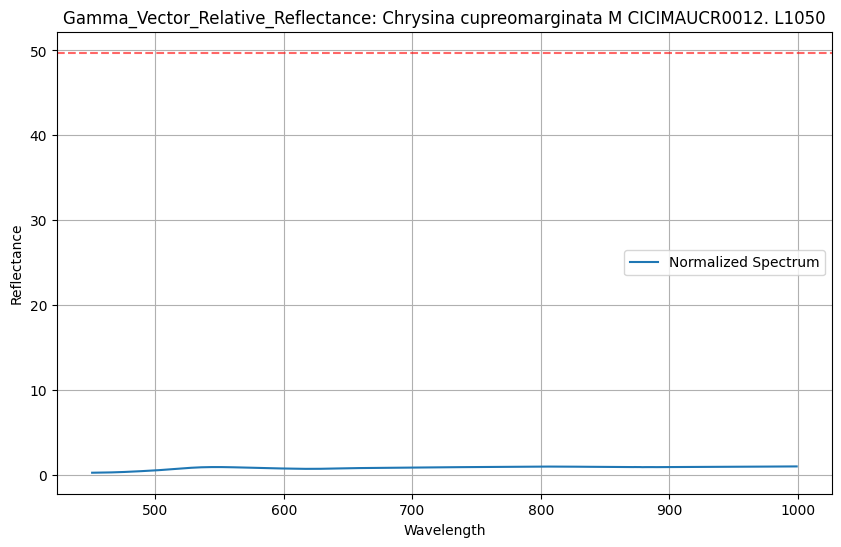

Getting equipment. Spectrum


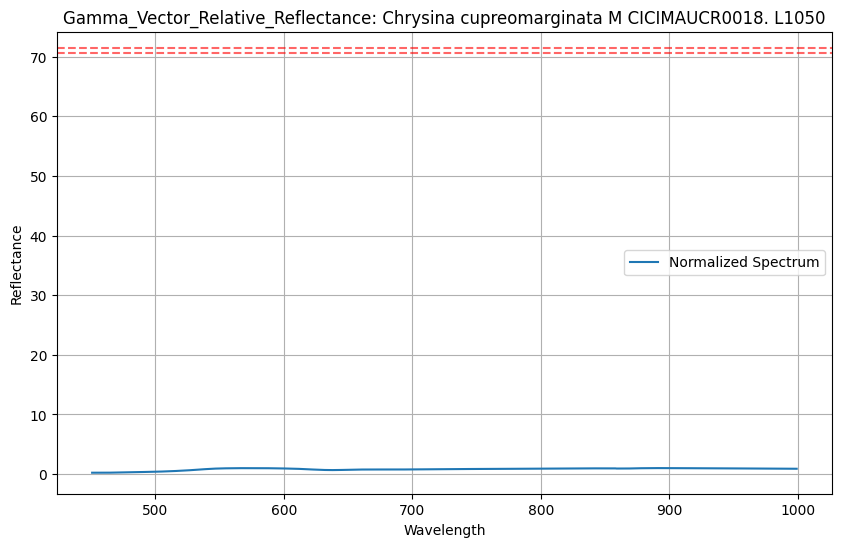

Getting equipment. Spectrum


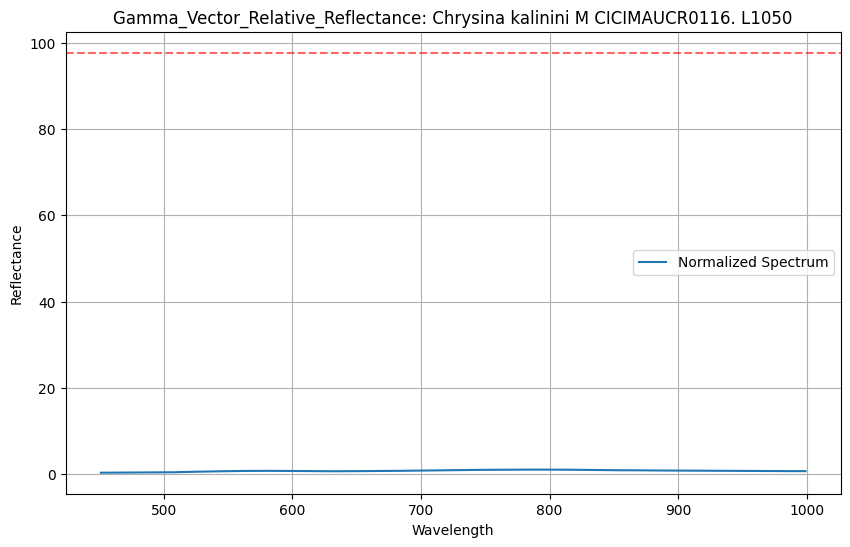

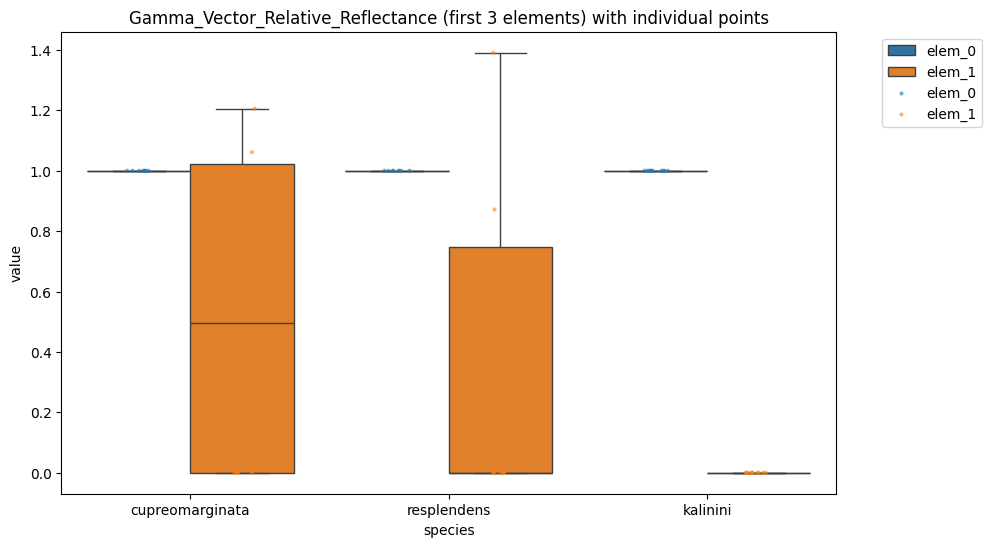

species cupreomarginata         kalinini resplendens        
metric           elem_0  elem_1   elem_0      elem_0  elem_1
mean                1.0  0.5337      1.0         1.0  0.3711
std                 0.0  0.5740      0.0         0.0  0.5466
median              1.0  0.4958      1.0         1.0  0.0000
min                 1.0  0.0000      1.0         1.0  0.0000
max                 1.0  1.2058      1.0         1.0  1.3910
iqr                 0.0  1.0233      0.0         0.0  0.7474
cv                  0.0  1.0756      0.0         0.0  1.4730

In [31]:
get_aggregated_data(Gamma_Vector_Relative_Reflectance,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

#### Critical points Golden

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


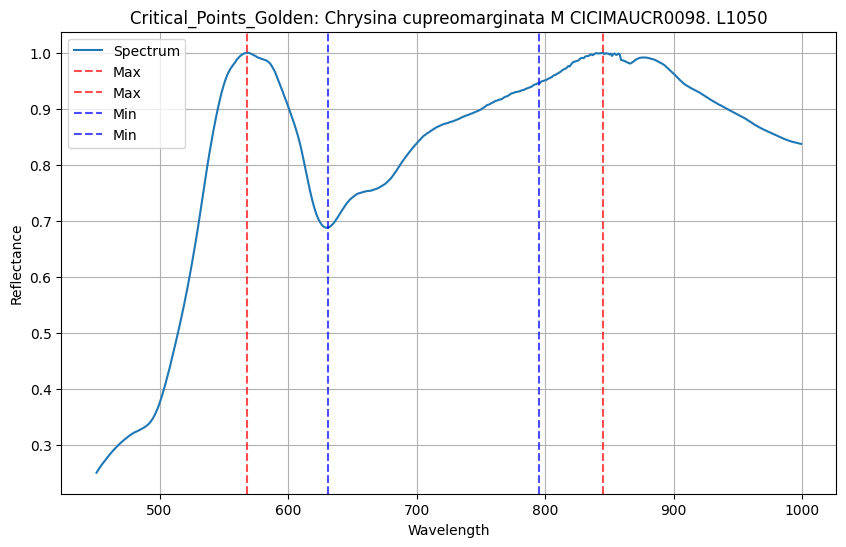

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


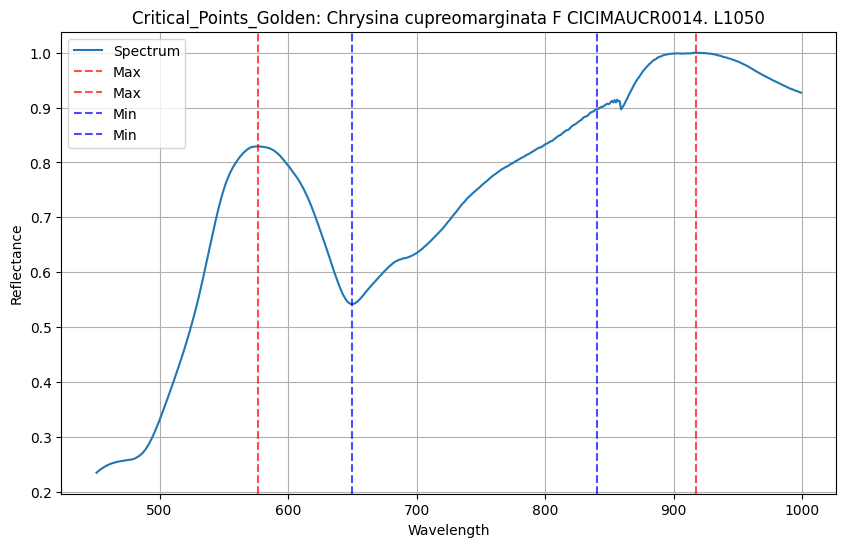

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


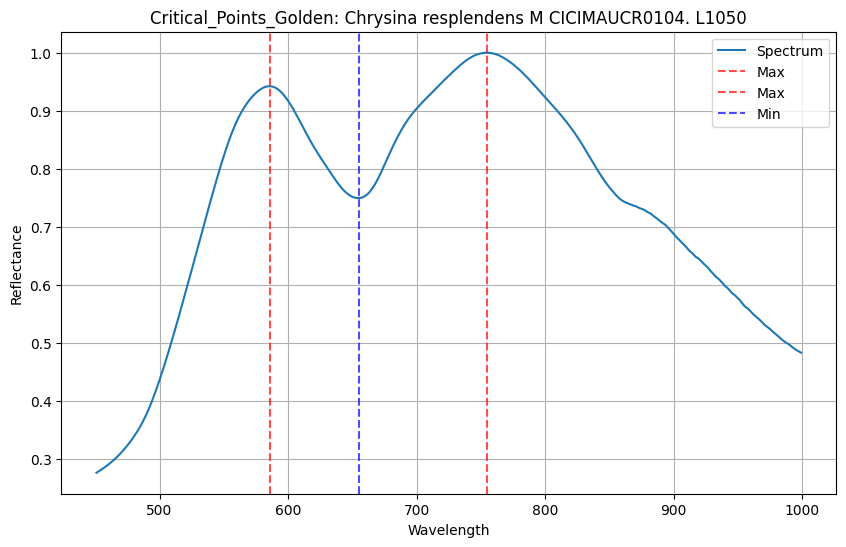

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


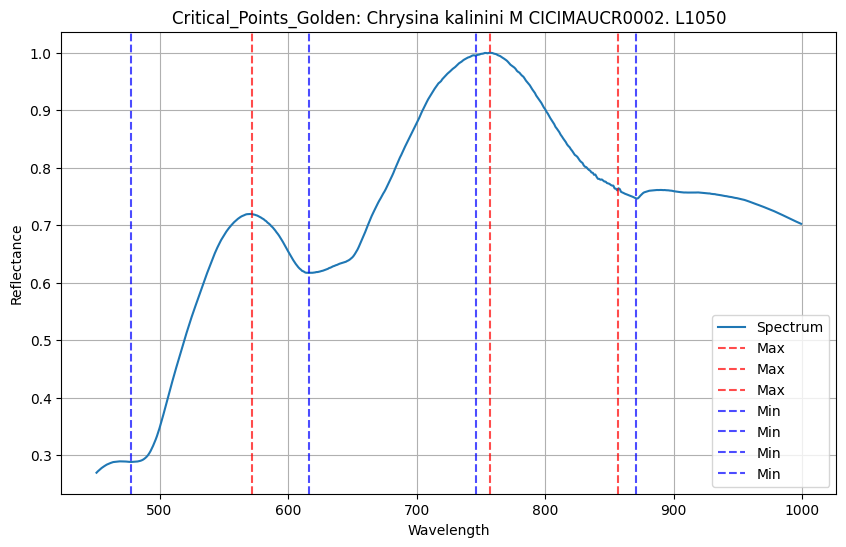

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bottom_thr=0.0, top_thr=55.50916000000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


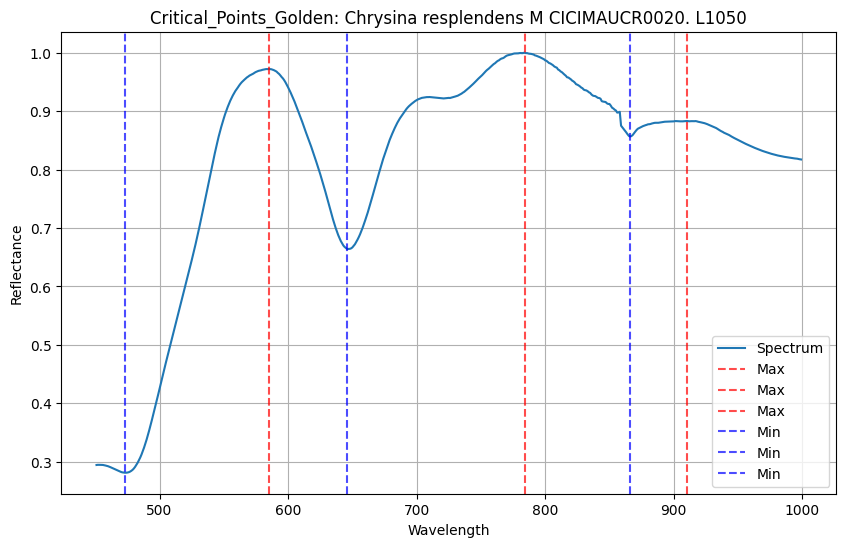

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=74.529467, 
                  bottom_thr=0.0, top_thr=74.529467, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


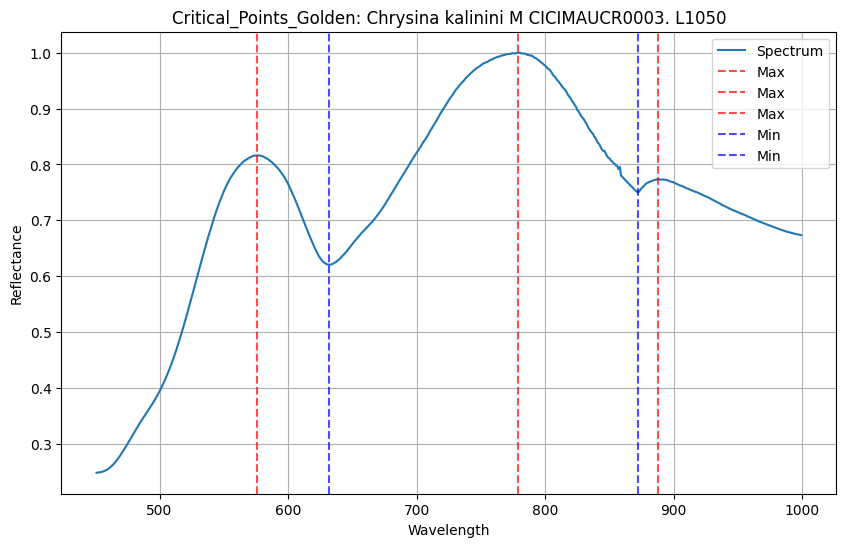

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.777667, 
                  bottom_thr=0.0, top_thr=68.777667, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


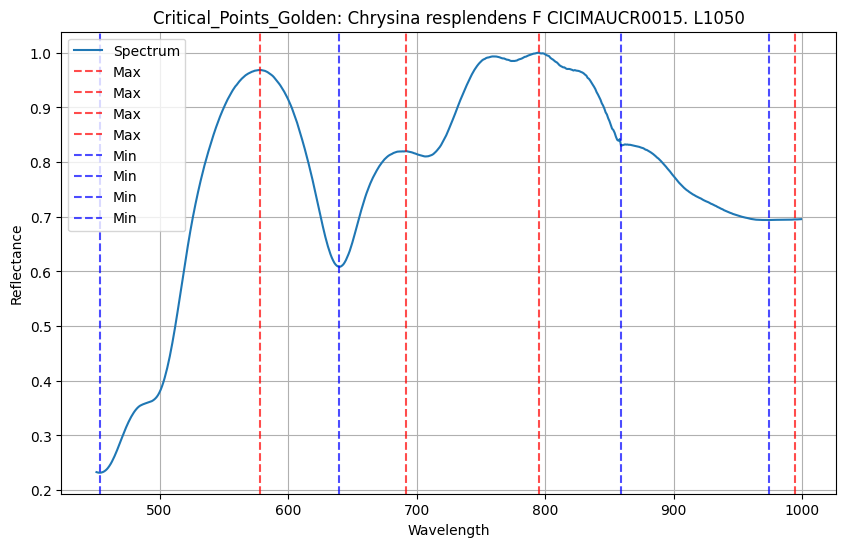

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=64.1527, 
                  bottom_thr=0.0, top_thr=64.1527, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


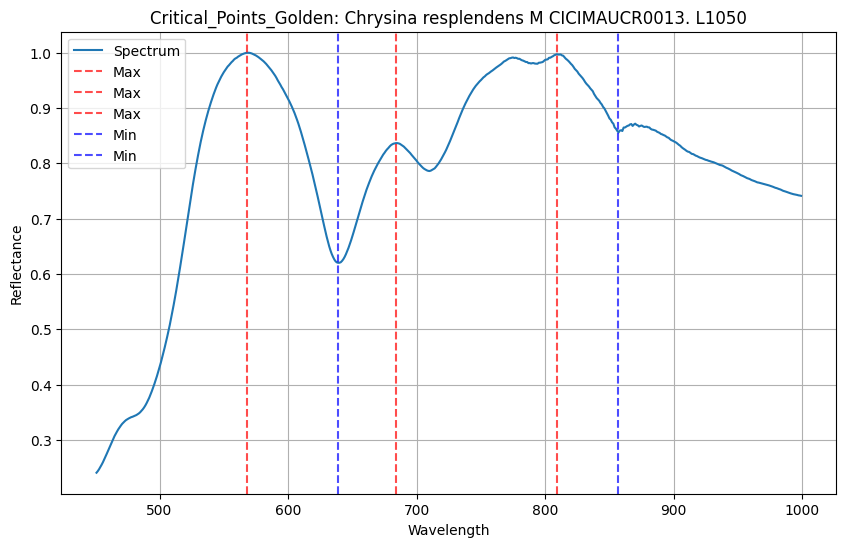

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=68.632466, 
                  bottom_thr=0.0, top_thr=68.632466, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


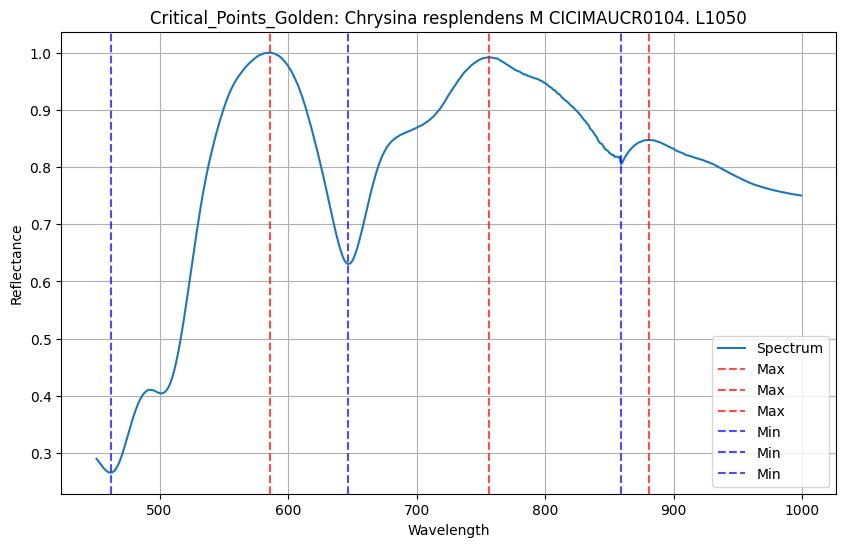

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=69.614549, 
                  bottom_thr=0.0, top_thr=69.614549, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


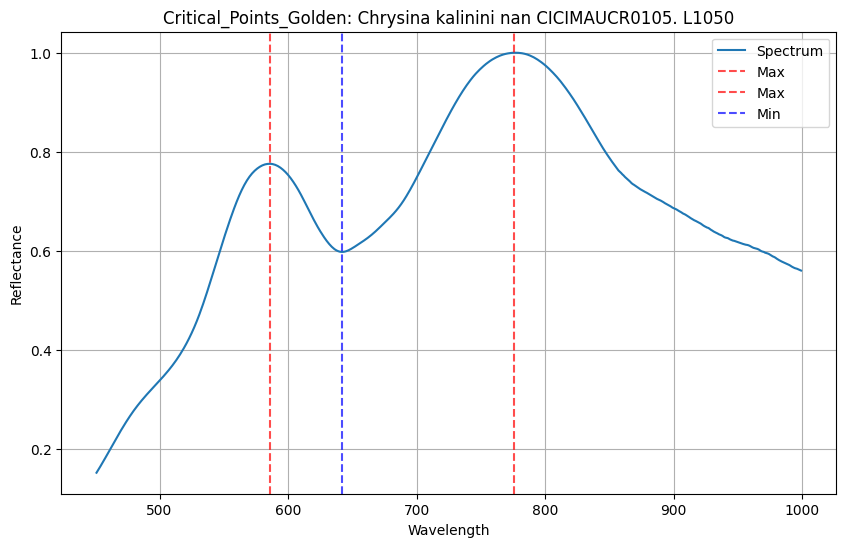

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=47.391498999999996, 
                  bottom_thr=0.0, top_thr=47.391498999999996, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


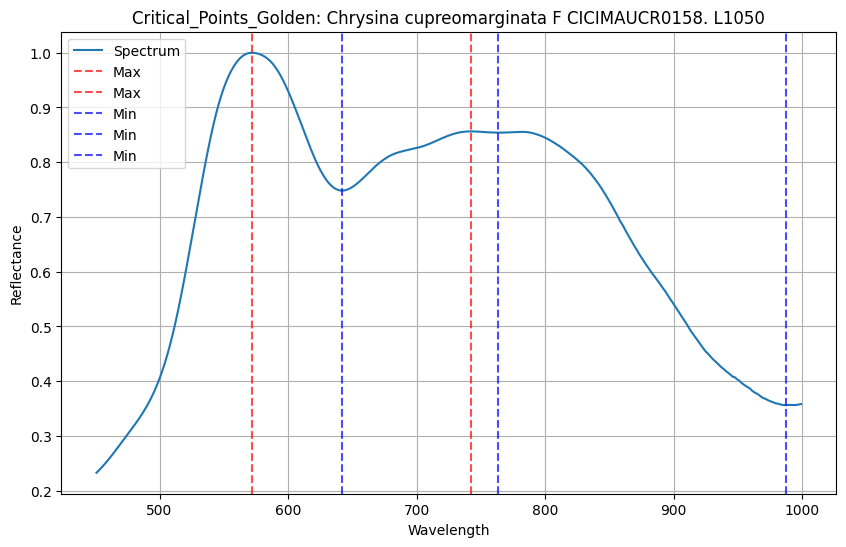

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.071434, 
                  bottom_thr=0.0, top_thr=70.071434, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


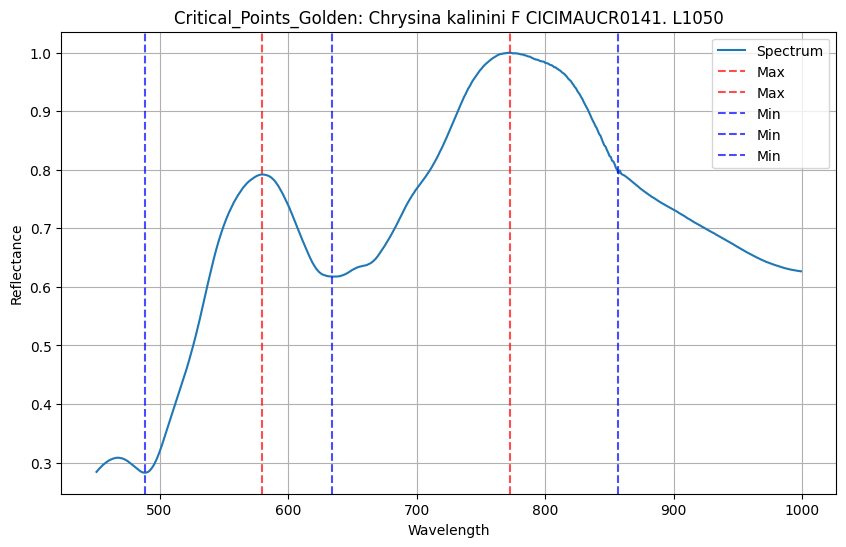

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.30927499999999, 
                  bottom_thr=0.0, top_thr=70.30927499999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


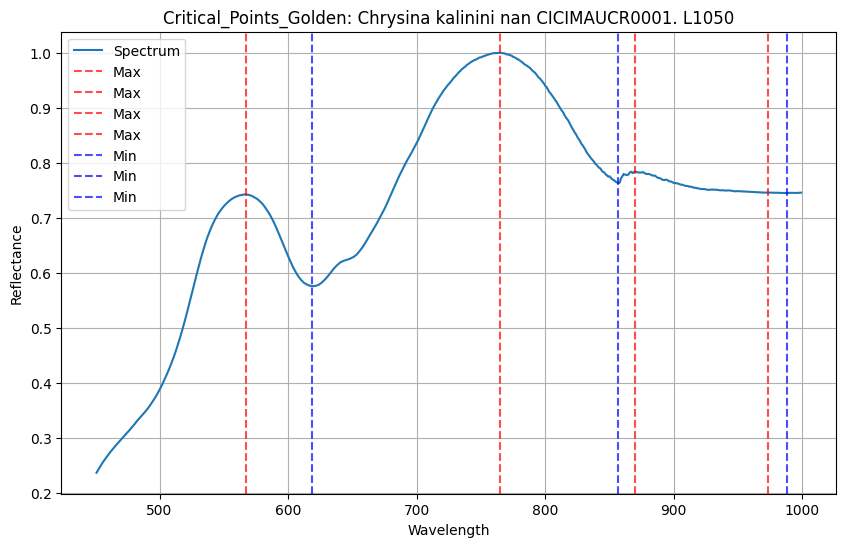

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.173166, 
                  bottom_thr=0.0, top_thr=71.173166, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


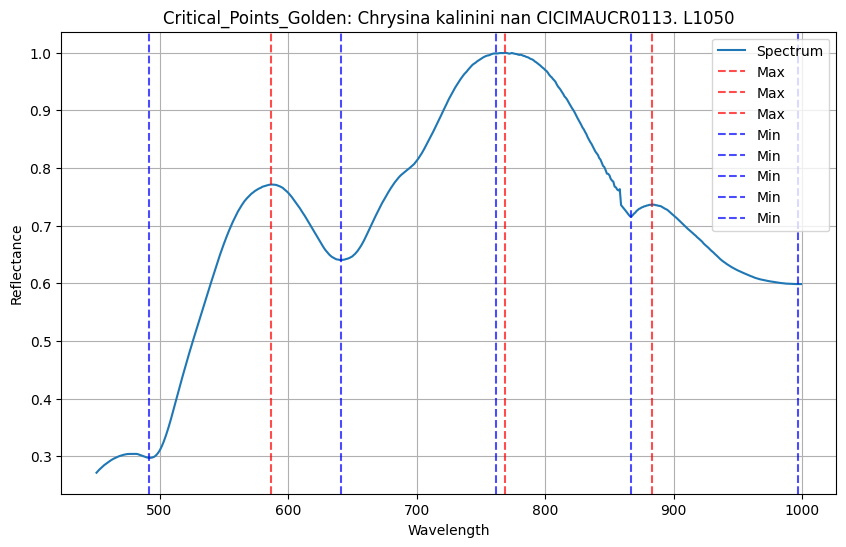

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=67.1612, 
                  bottom_thr=0.0, top_thr=67.1612, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


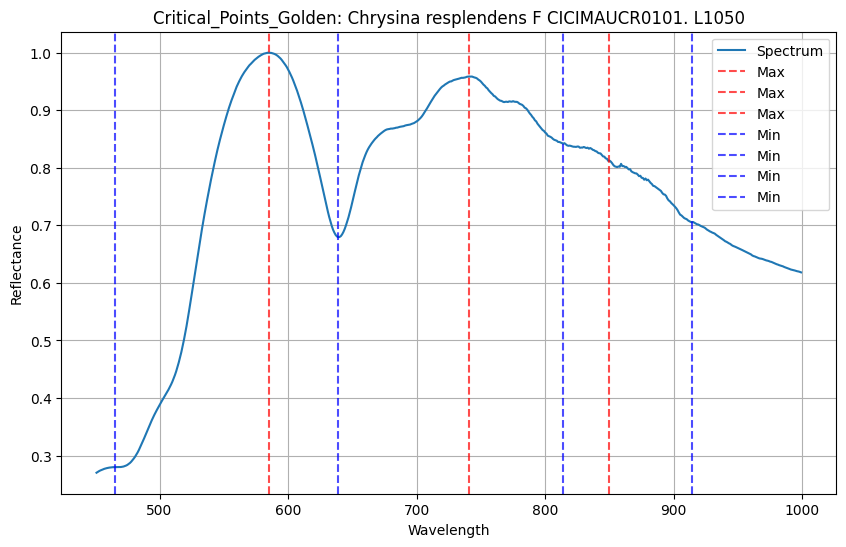

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=50.734972, 
                  bottom_thr=0.0, top_thr=50.734972, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


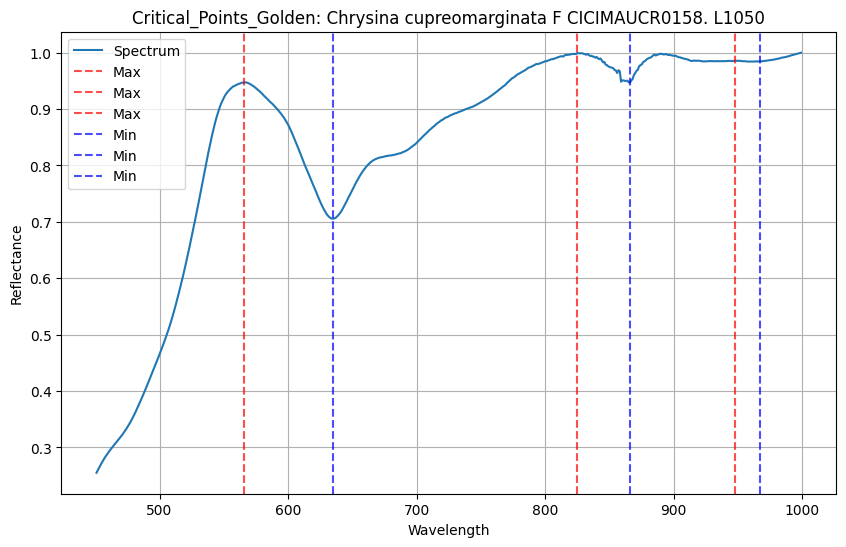

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=49.421255, 
                  bottom_thr=0.0, top_thr=49.421255, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


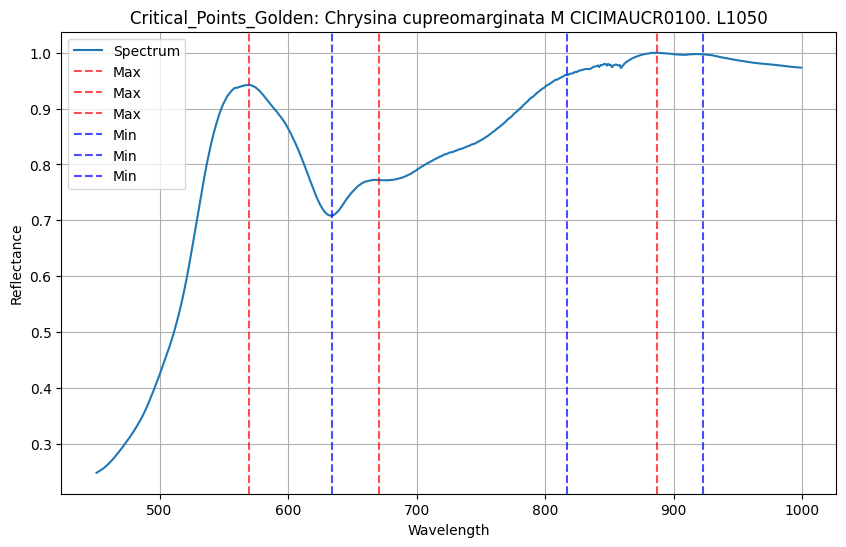

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=78.41141999999999, 
                  bottom_thr=0.0, top_thr=78.41141999999999, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


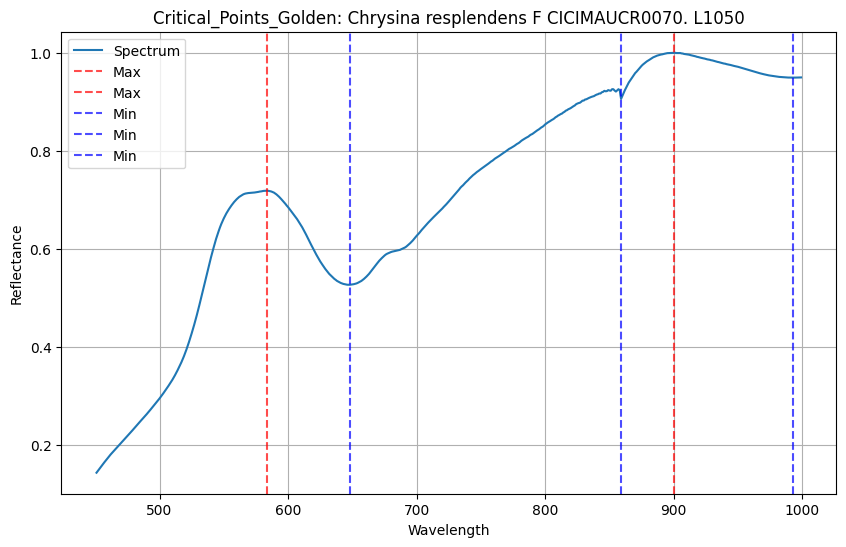

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=61.15786700000001, 
                  bottom_thr=0.0, top_thr=61.15786700000001, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


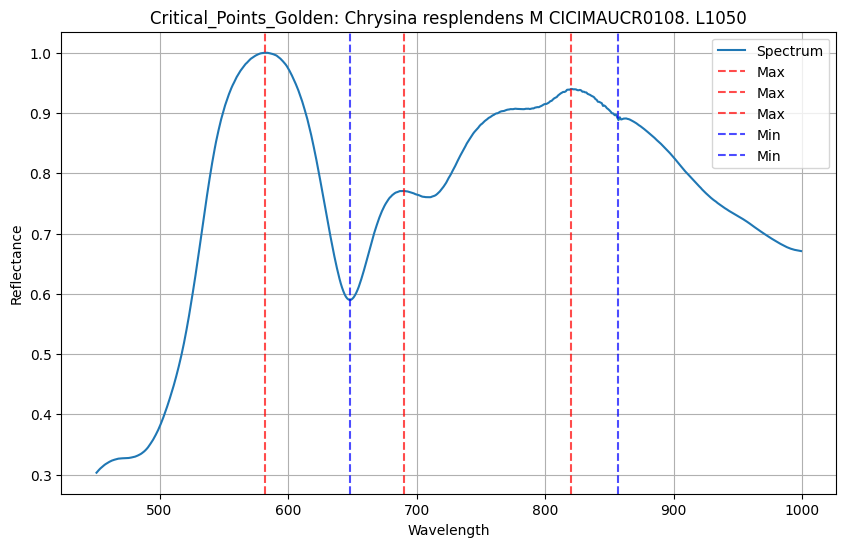

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=71.3047, 
                  bottom_thr=0.0, top_thr=71.3047, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


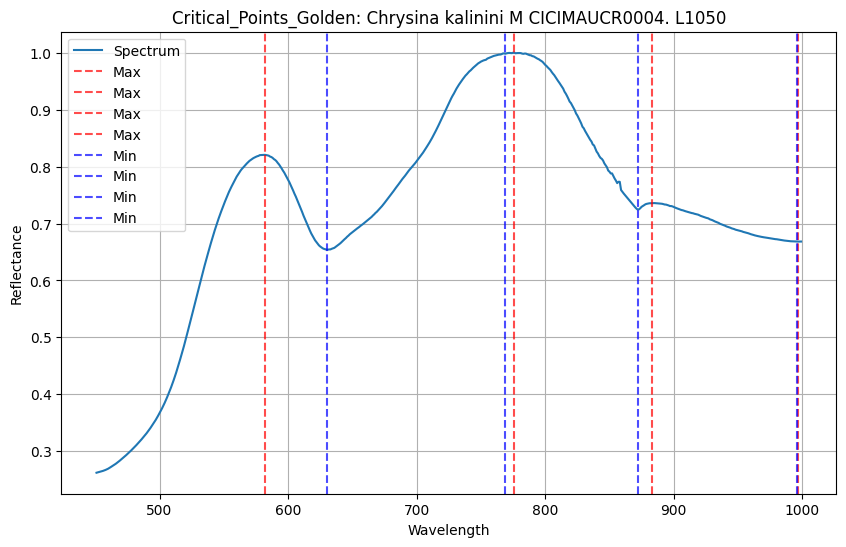

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=66.855167, 
                  bottom_thr=0.0, top_thr=66.855167, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


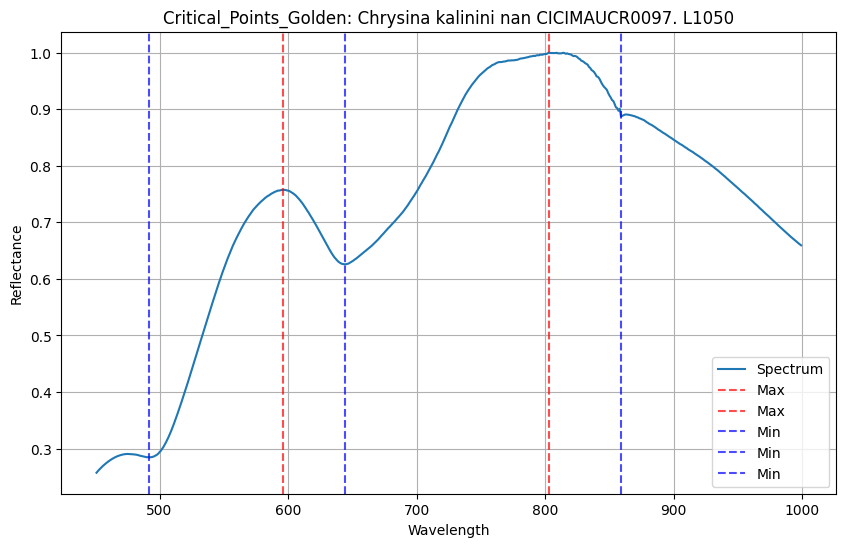

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=15.560224000000002, 
                  bottom_thr=0.0, top_thr=15.560224000000002, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


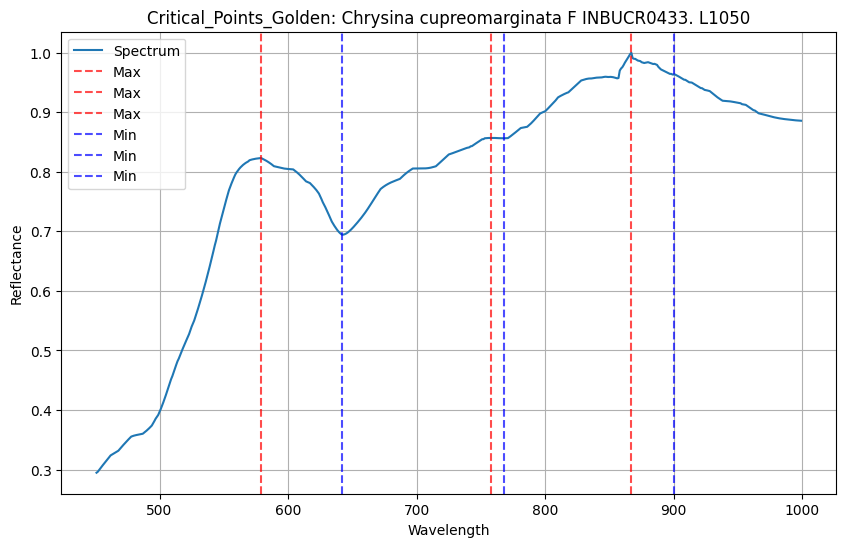

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=46.201066999999995, 
                  bottom_thr=0.0, top_thr=46.201066999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


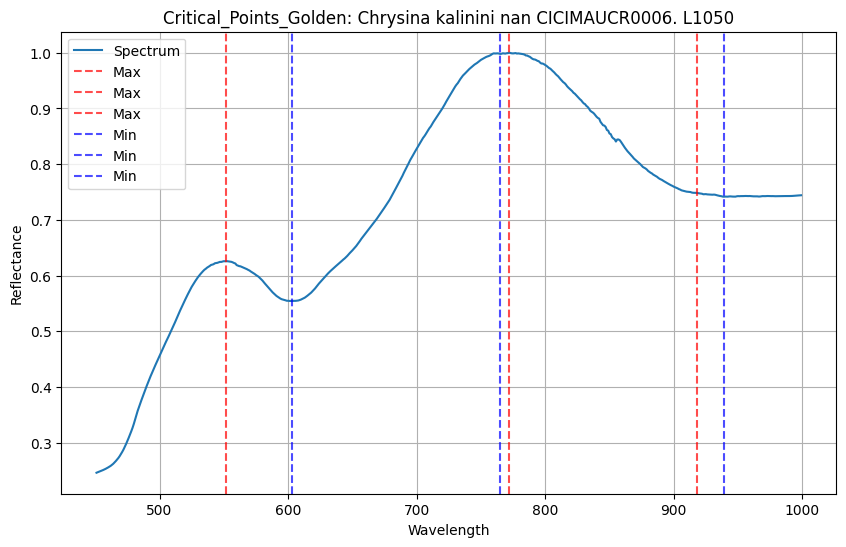

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=37.615502, 
                  bottom_thr=0.0, top_thr=37.615502, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


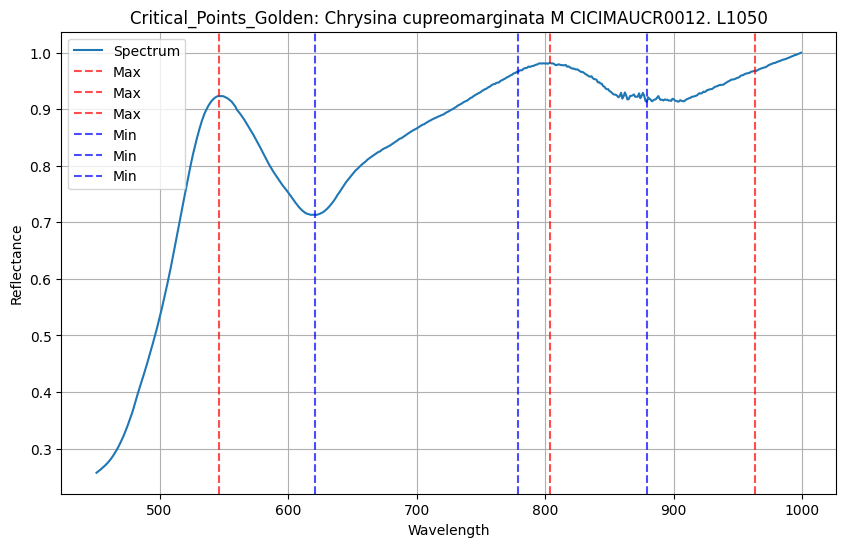

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.395157, 
                  bottom_thr=0.0, top_thr=55.395157, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


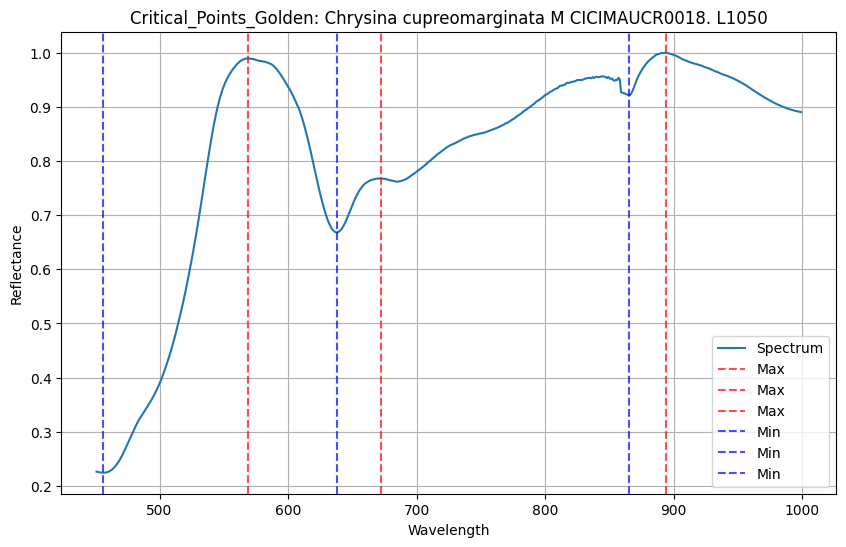

self.visible_start_wavelength=500.0
        self.visible_end_wavelength=780.0
        self.ir_start_wavelength=780.0
        self.ir_end_wavelength=1500.0
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=70.804767, 
                  bottom_thr=0.0, top_thr=70.804767, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
Getting equipment. Spectrum


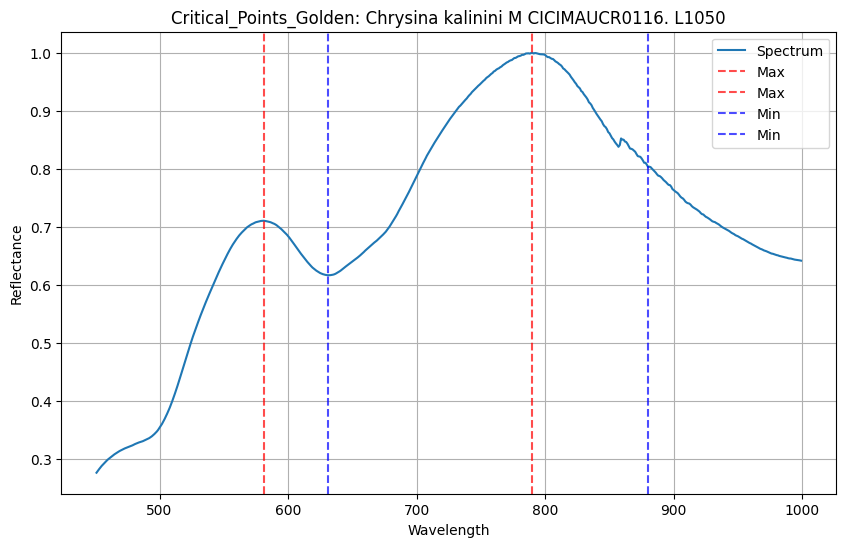

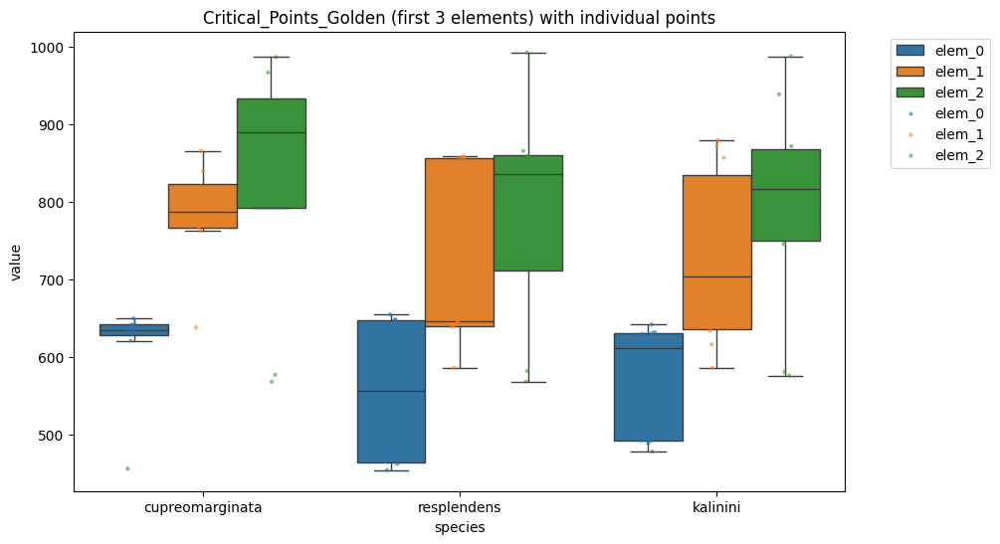

species cupreomarginata                                                    \
metric           elem_0    elem_1    elem_2    elem_3    elem_4    elem_5   
mean           613.8750  783.2500  833.2500  645.5000  570.2038  592.6136   
std             64.3727   68.7682  166.1159  146.9256  328.8403  441.6945   
median         634.5000  787.0000  889.5000  571.0000  707.0000  877.0000   
min            456.0000  638.0000  568.0000  546.0000   44.7323   46.2220   
max            650.0000  866.0000  987.0000  917.0000  825.0000  963.0000   
iqr             13.5000   56.0000  141.0000   77.2500  255.0254  836.5753   
cv               0.1049    0.0878    0.1994    0.2276    0.5767    0.7453   

species                                      ... resplendens            \
metric    elem_6   elem_7   elem_8   elem_9  ...      elem_6    elem_7   
mean     43.5751  51.6269  40.9593  39.3711  ...    240.5944  173.6455   
std      20.0597  22.0795  29.5389  29.0568  ...    360.6973  332.9481   
median   47.3155  56.0234  54.0095  49.8327  ...     75.1252   71.6845   
min      15.3167  18.8888   0.0000   0.0000  ...      0.0000    0.0000   
max      68.4773  82.5713  67.0567  70.6694  ...    850.0000  994.0000   
iqr      24.7794  23.4126  49.6648  48.9695  ...    236.9768   42.2692   
cv        0.4603   0.4277   0.7212   0.7380  ...      1.4992    1.9174   

species                                                                 \
metric    elem_8   elem_9  elem_10  elem_11  elem_12  elem_13  elem_14   
mean     53.5970  69.8502  38.6382  37.6913  21.8669  18.5229  11.1901   
std      27.5006  30.7018  41.9895  41.2028  40.4917  34.2997  31.6505   
median   66.0141  79.9972  32.4635  31.0636   0.0000   0.0000   0.0000   
min       0.0000   0.0000   0.0000   0.0000   0.0000   0.0000   0.0000   
max      75.1671  93.4164  92.6724  92.0317  88.2347  74.7809  89.5212   
iqr      16.3063  16.1483  75.0120  70.9484  21.6751  18.3506   0.0000   
cv        0.5131   0.4395   1.0867   1.0932   1.8517   1.8517   2.8284   

species           
metric   elem_15  
mean      7.7782  
std      22.0000  
median    0.0000  
min       0.0000  
max      62.2253  
iqr       0.0000  
cv        2.8284  

[7 rows x 48 columns]

In [32]:
get_aggregated_data(Critical_Points_Golden,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

#### Wavelength_Vector

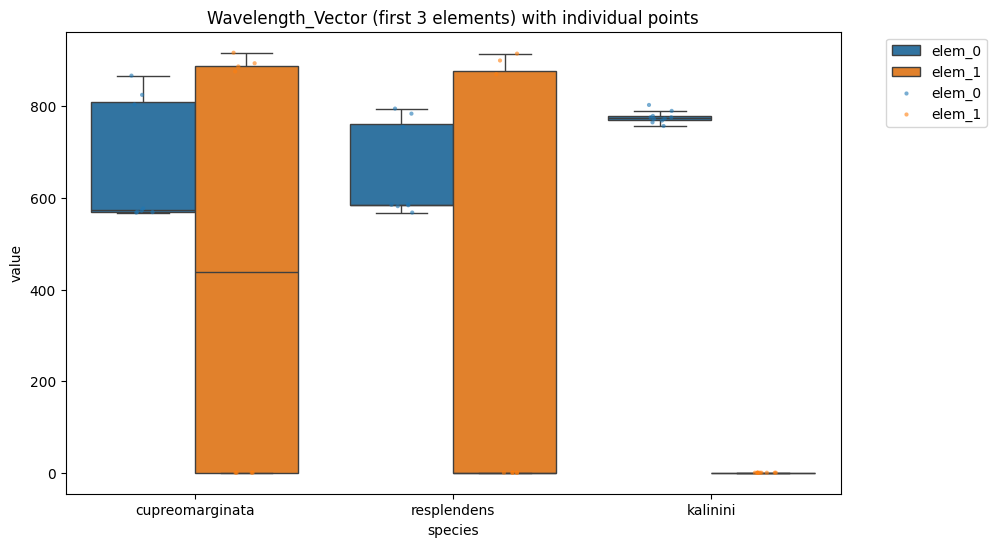

species cupreomarginata            kalinini resplendens          
metric           elem_0    elem_1    elem_0      elem_0    elem_1
mean           669.0000  446.7500  776.0000    654.8750  335.6250
std            136.0882  477.7306   12.8668    102.7068  463.3684
median         574.5000  438.0000  774.5000    585.5000    0.0000
min            568.0000    0.0000  757.0000    568.0000    0.0000
max            867.0000  917.0000  803.0000    795.0000  915.0000
iqr            239.5000  888.7500    8.5000    178.7500  877.5000
cv               0.2034    1.0693    0.0166      0.1568    1.3806

In [33]:
get_aggregated_data(Wavelength_Vector,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

## Boxplots

#### Gamma_Arbitrary_Limits_Golden

C:\Users\esteb\escarabajos\libraries\metrics.py:1894: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


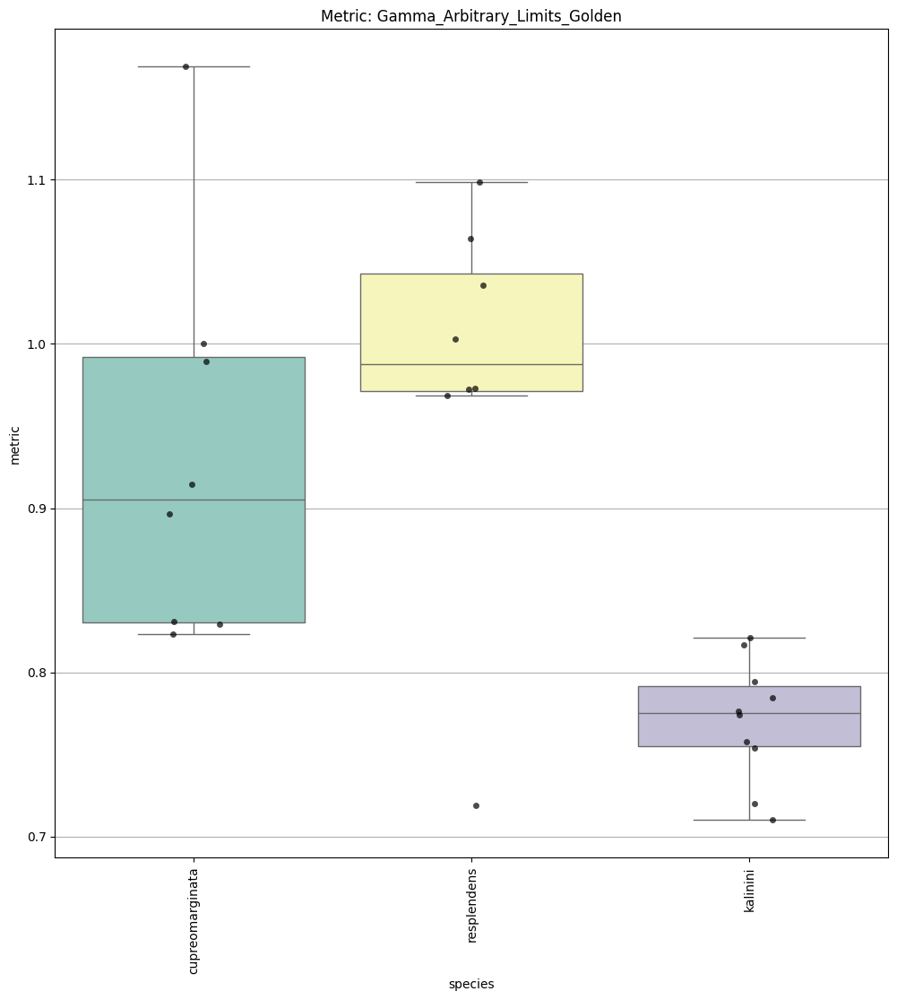

In [34]:
Metric_Testbench(Gamma_Arbitrary_Limits_Golden, 
                 spectra = train_spectra, 
                 config_file = metric_configuration_file, 
                 collection_list = training_collection_list)

#### Gamma_First_Two_Peaks_Golden

C:\Users\esteb\escarabajos\libraries\metrics.py:1894: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


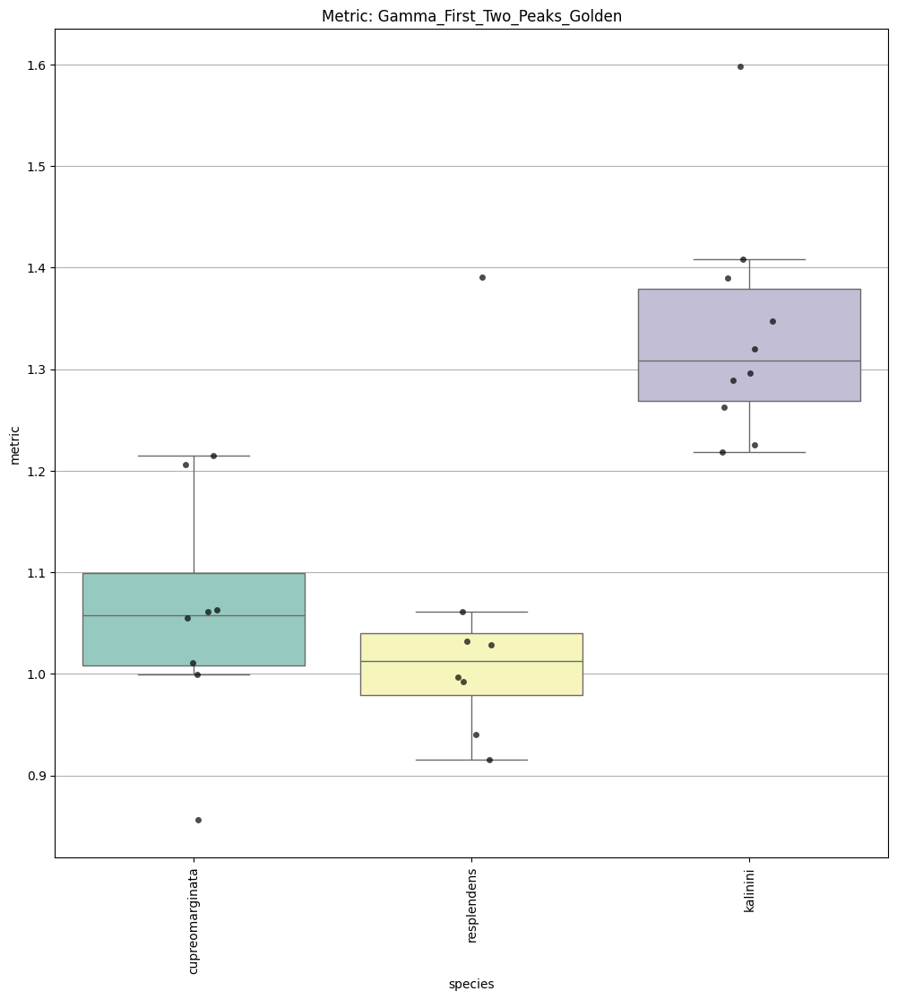

In [35]:
Metric_Testbench(Gamma_First_Two_Peaks_Golden, spectra = train_spectra, config_file = metric_configuration_file, collection_list = training_collection_list)

#### Gamma_Area_Under_Curve_Naive_Golden

C:\Users\esteb\escarabajos\libraries\metrics.py:1894: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


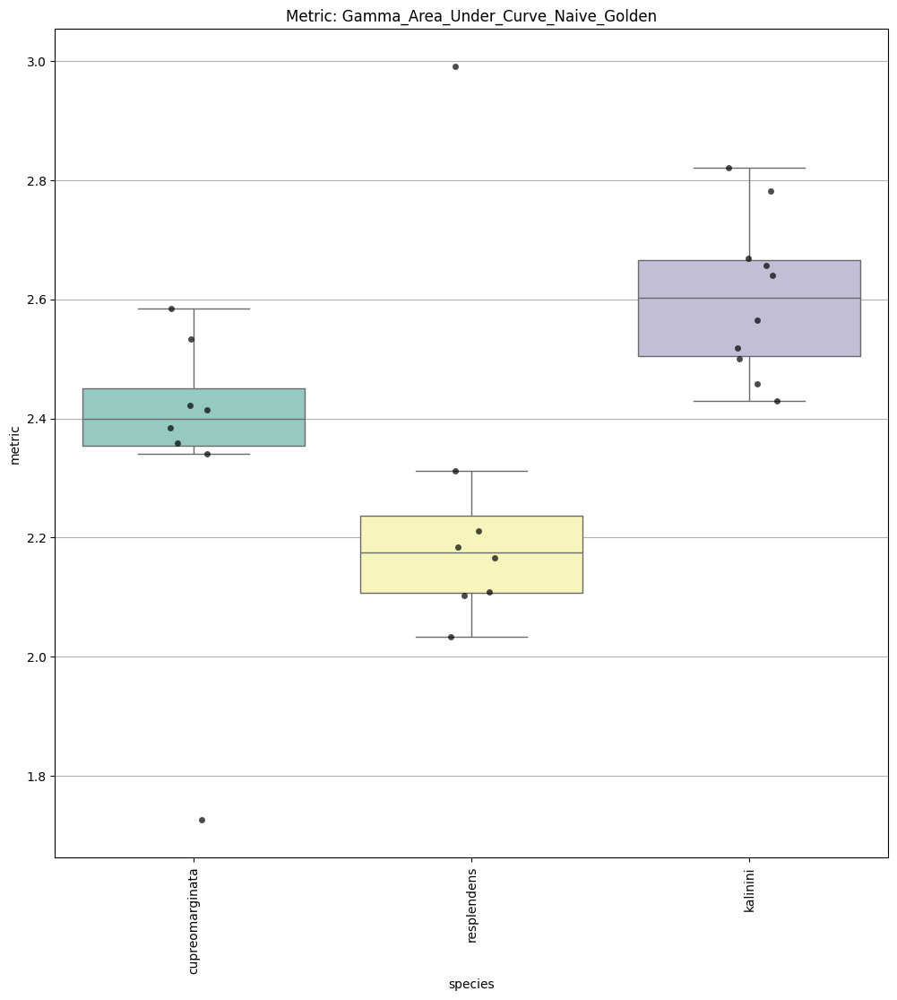

In [36]:
Metric_Testbench(Gamma_Area_Under_Curve_Naive_Golden, 
                 spectra = train_spectra, 
                 config_file = metric_configuration_file, 
                 collection_list = training_collection_list,
                 )

In [37]:
#### Gamma_Area_Under_Curve_First_Min_Cut

min wav 450.0 max_wav 1000.0
get_minima: max_val=48.893533000000005, 
                  bottom_thr=0.0, top_thr=48.893533000000005, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=63.223845000000004, 
                  bottom_thr=0.0, top_thr=63.223845000000004, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=58.027733999999995, 
                  bottom_thr=0.0, top_thr=58.027733999999995, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
min wav 450.0 max_wav 1000.0
get_minima: max_val=72.57525, 
                  bottom_thr=0.0, top_thr=72.57525, 
                  prominence_threshold_for_min=Nonemin_wavelength=450.0max_wavelength=1000.0
GAMMA 2.4705573124519438
min wav 450.0 max_wav 1000.0
get_minima: max_val=55.50916000000001, 
                  bott

C:\Users\esteb\escarabajos\libraries\metrics.py:1861: UserWarning: Skipping C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-03-REFLECTANCE\without iris nor lens\average\CICIMAUCR0098.txt — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:1861: UserWarning: Skipping C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-03-REFLECTANCE\without iris nor lens\average\CICIMAUCR0014.txt — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:1861: UserWarning: Skipping C:\Users\esteb\escarabajos\L1050_data\TRA_data_CICIMA_INBUCR\CICIMAUCR\reflectance\CICIMAUCR0104.txt — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:1861: UserWarning: Skipping C:\Users\esteb\escarabajos\L1050_data\TRA_data_CICIMA_INBUCR\CICIM

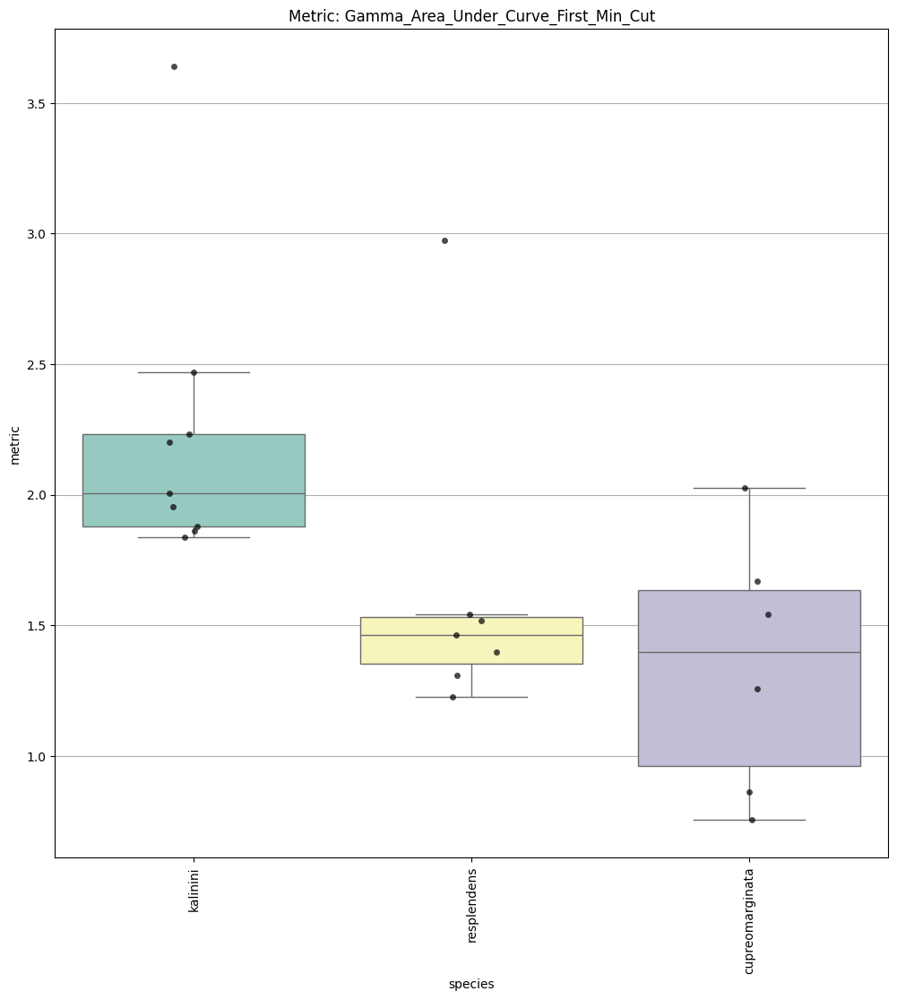

In [38]:
Metric_Testbench(Gamma_Area_Under_Curve_First_Min_Cut, 
                 spectra = train_spectra, 
                 config_file = metric_configuration_file, 
                 collection_list = training_collection_list)

In [39]:
#### Gamma_Gaussian_Fit

self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_minimum=0.6
        self.height_bottom_threshold_for_maximum=0.6
        self.smallest_distance_between_peaks_for_min=None
        self.smallest_distance_between_peaks_for_max=None
        1.0
self.visible_range_start_wavelength=None
        self.start_wavelength=450.0
        self.end_wavelength=1000.0
        self.uv_vis_min_wavelength=475.0
        self.uv_vis_max_wavelength=625.0
        self.ir_min_wavelength=700.0
        self.ir_max_wavelength=900.0
        self.prominence_threshold_for_min=0.15
        self.prominence_threshold_for_max=0.4
        self.height_bottom_threshold_for_min

C:\Users\esteb\escarabajos\libraries\metrics.py:1894: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


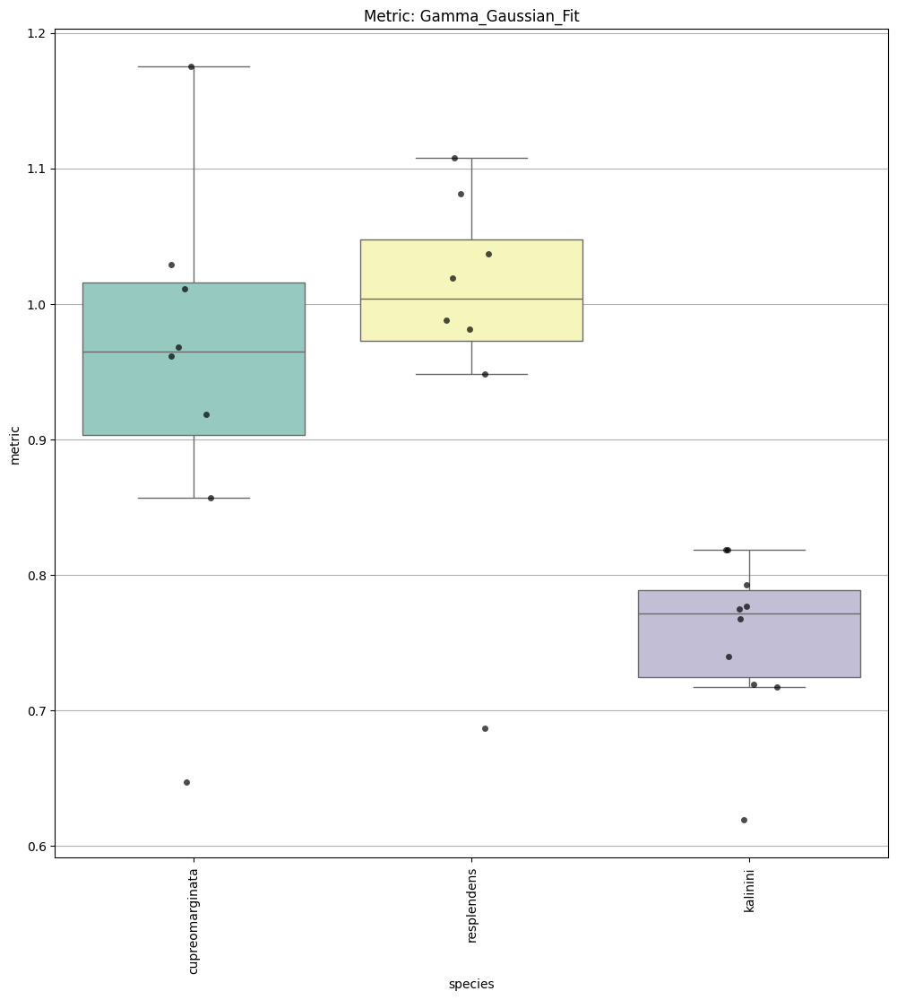

In [40]:
Metric_Testbench(Gamma_Gaussian_Fit, spectra = train_spectra, 
                 config_file = metric_configuration_file, 
                 collection_list = training_collection_list,
                 )

## Metric consolidation
### For each metric, saves the result on a single dataset 
These metrics will be used one by one to train the neural network. This method will mark them as fit or unfit to be used in neural network training


In [41]:
from metric_database import MetricDatabase
import os
import pprint

# Initialize database
db_path = os.path.abspath("metrics.sqlite")
db = MetricDatabase(db_path=db_path)
print(f"📂 Using DB at {db_path}")

# List of metrics to test
metrics_to_run = (
                    Gamma_First_Two_Peaks_Golden,
                    Gamma_Arbitrary_Limits_Golden, 
                    Gamma_Area_Under_Curve_Naive_Golden, 
                    Gamma_Area_Under_Curve_First_Min_Cut, 
                    Gamma_Vector_Relative_Reflectance,
                    Wavelength_Vector, 
                    Critical_Points_Golden,
                    Gamma_Gaussian_Fit, 
                    Gamma_First_Two_Peaks_Simple
)

# ----------------------
# Run metrics
# ----------------------
report, nn_training_bundle = db.add_multiple_metrics(
    metrics_to_run,
    config_file=metric_configuration_file,
    train_spectra=train_spectra,
    test_spectra=test_spectra,
    collection_list=training_collection_list
)

# Extract normalized results
for metric_name, bundle in nn_training_bundle.items():
    train_norm = bundle.get("train_normalized", [])
    test_norm = bundle.get("test_normalized", [])

    print(f"\n📊 Metric: {metric_name}")
    print(f"  ▸ Train normalized ({len(train_norm)} samples)")
    print(f"  ▸ Test normalized ({len(test_norm)} samples, "
          f"dict per species: {isinstance(test_norm[0][1], dict) if test_norm else 'N/A'})")

# Pretty print summary
pprint.pprint(report)

print("\n✅ All metrics processed and results saved in the database.")


📂 Using DB at C:\Users\esteb\escarabajos\gamma factor calculation and neural network training\metrics.sqlite
results {'metric': 'Gamma_First_Two_Peaks_Golden', 'train': [('CICIMAUCR0098', np.float64(0.9997946715741182), 'cupreomarginata'), ('CICIMAUCR0014', np.float64(1.2058207872110318), 'cupreomarginata'), ('CICIMAUCR0104', np.float64(1.061263556672878), 'resplendens'), ('CICIMAUCR0002', np.float64(1.3894857926038329), 'kalinini'), ('CICIMAUCR0020', np.float64(1.0285942589874786), 'resplendens'), ('CICIMAUCR0003', np.float64(1.2251516694200988), 'kalinini'), ('CICIMAUCR0015', np.float64(1.0325354216782034), 'resplendens'), ('CICIMAUCR0013', np.float64(0.9971201326836476), 'resplendens'), ('CICIMAUCR0104', np.float64(0.9920349559910941), 'resplendens'), ('CICIMAUCR0105', np.float64(1.2894620099264786), 'kalinini'), ('CICIMAUCR0158', np.float64(0.856289595722265), 'cupreomarginata'), ('CICIMAUCR0141', np.float64(1.2624276598192257), 'kalinini'), ('CICIMAUCR0001', np.float64(1.347069068

C:\Users\esteb\escarabajos\libraries\metrics.py:815: UserWarning: Gaussian fit failed in range 700.0-900.0 for CICIMAUCR0019 (Chrysina cupreomarginata): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:134: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for INBUCR0426 (Chrysina resplendens) — returning NaN.
  warnings.warn(


In [42]:
#print(nn_training_bundle)

In [43]:
import os
import datetime
import pprint
import numpy as np
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle
from reportlab.lib.pagesizes import letter
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib import colors


# Helper function to convert complex objects to strings
def to_string(obj):
    if isinstance(obj, (np.ndarray, list)):
        return str(obj)
    elif isinstance(obj, (np.int64, np.float64)):
        return str(obj)
    elif isinstance(obj, dict):
        return "\n".join([f"{k}: {to_string(v)}" for k, v in obj.items()])
    elif isinstance(obj, (tuple, list)):
        return str([to_string(item) for item in obj])
    return str(obj)

# Pretty print to console
pprint.pprint(nn_training_bundle)

# Ensure report directory
report_dir = report_location
os.makedirs(report_dir, exist_ok=True)

# File name with today's date
today_str = datetime.date.today().strftime("%Y-%m-%d")
report_filename = f"silvery_beetle_classification_neural_network_{today_str}.pdf"
report_path = os.path.join(report_dir, report_filename)

styles = getSampleStyleSheet()
doc = SimpleDocTemplate(report_path, pagesize=letter)
story = [Paragraph("Golden Beetle Classification Neural Network Report", styles['Title']),
         Spacer(1, 12)]

# Loop over all metrics
for metric, details in nn_training_bundle.items():
    story.append(Paragraph(f"<b>{metric}</b>", styles['Heading2']))
    story.append(Paragraph(to_string(details), styles['Code']))
    story.append(Spacer(1, 12))

    # Aggregated Data
    if "aggregated" in details and details["aggregated"]:
        story.append(Paragraph("Aggregated Data:", styles['Heading3']))
        
        # Header row: "Metric" + all species dynamically
        table_data = [["Metric"] + target_species]
        
        # Add rows
        for key, values in details["aggregated"].items():
            row = [key]
            for sp in target_species:
                row.append(to_string(values.get(sp, "N/A")))
            table_data.append(row)
        
        table = Table(table_data)
        table.setStyle(TableStyle([
            ("BACKGROUND", (0, 0), (-1, 0), colors.grey),
            ("TEXTCOLOR", (0, 0), (-1, 0), colors.whitesmoke),
            ("ALIGN", (0, 0), (-1, -1), "CENTER"),
            ("GRID", (0, 0), (-1, -1), 0.5, colors.black)
        ]))
        story.append(table)
        story.append(Spacer(1, 12))

    # Train/Test datapoints summary
    train_count = len(details.get("train", []))
    test_count = len(details.get("test", []))
    if train_count > 0 or test_count > 0:
        story.append(Paragraph("Datapoints Summary:", styles['Heading3']))
        summary = {"train": train_count, "test": test_count}
        story.append(Paragraph(to_string(summary), styles['Code']))
        story.append(Spacer(1, 12))

    # Recommendation
    if "recommendation" in details and details["recommendation"]:
        story.append(Paragraph("Recommendation:", styles['Heading3']))
        story.append(Paragraph(to_string(details["recommendation"]), styles['Code']))
        story.append(Spacer(1, 12))

# Build PDF
doc.build(story)
print(f"\n✅ Report saved at: {os.path.abspath(report_path)}")


{'Critical_Points_Golden': {'aggregated': {},
                            'metric': 'Critical_Points_Golden',
                            'metric_name': 'Critical_Points_Golden',
                            'recommendation': {'class_distribution': {},
                                               'fit_for_training': False,
                                               'n_classes': 0,
                                               'n_invalid_metrics': np.int64(26),
                                               'n_samples': np.int64(0),
                                               'reason': ['Found 26 invalid '
                                                          '(NaN or infinite) '
                                                          'metric values',
                                                          'Too few valid '
                                                          'samples (0 < 20)',
                                                          'Too few clas

## Neural network training

### One variable approach. Species agnostic

#### In this section, for every metric which is fit for training, we separate train data into a train and validation subgroups 
Then, we feed them into a neural network, and train it. Finally, we test the neural network with the test data and finally we return a dataframe
with the stats for each NN, true positives/negatives, false positives/negatives. 

In [82]:
import traceback
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import random

# Ensure Matplotlib backend for JupyterLab to prevent black cells
%matplotlib inline


import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder

def fit_label_encoder(df, label_col="species"):
    """Fit LabelEncoder on the whole dataset."""
    encoder = LabelEncoder()
    encoder.fit(df[label_col])
    print("Global classes:", encoder.classes_)
    return encoder

def get_x_y(df, encoder):
    """Extract features and labels from DataFrame using a pre-fitted encoder."""
    feature_cols = [c for c in df.columns if c not in ["code", "species"]]
    if not feature_cols:
        raise ValueError("No feature columns found")

    x = df[feature_cols].values.astype(np.float32)
    y = encoder.transform(df["species"].values)
    return x, y



def permute_lists(list1, list2):
    """Permute two lists with the same random order."""
    random.seed(42)  # For reproducibility
    permutation_index = list(range(len(list1)))
    random.shuffle(permutation_index)
    permuted_list1 = [list1[i] for i in permutation_index]
    permuted_list2 = [list2[i] for i in permutation_index]
    return permuted_list1, permuted_list2

def partition_lists(list1, list2, train_frac=0.7, val_frac=0.2):
    """Partition two lists into train, validation, and test sets."""
    if train_frac + val_frac >= 1:
        raise ValueError("Sum of train_frac and val_frac must be less than 1")
    if train_frac < 0 or val_frac < 0:
        raise ValueError("Fractions must be positive")
    
    n_total = len(list1)
    n_train = int(n_total * train_frac)
    n_val = int(n_total * val_frac)
    
    train_list1 = list1[:n_train]
    train_list2 = list2[:n_train]
    val_list1 = list1[n_train:n_train + n_val]
    val_list2 = list2[n_train:n_train + n_val]
    test_list1 = list1[n_train + n_val:]
    test_list2 = list2[n_train + n_val:]
    
    return (train_list1, train_list2, val_list1, val_list2, test_list1, test_list2)


from sklearn.metrics import confusion_matrix, classification_report

def compute_confusion_metrics(y_true, y_pred, encoder, labels=None):
    """
    Build confusion matrix safely (even if some labels are missing),
    and derive per-class TP/FP/FN/TN (one-vs-rest) + micro totals.
    """
    # Full label universe
    all_labels = list(range(len(encoder.classes_))) if labels is None else labels

    # Restrict to labels actually present in y_true ∪ y_pred (robust to missing labels)
    present_labels = np.unique(np.concatenate([y_true, y_pred])) if len(y_true) else np.unique(y_pred)
    safe_labels = [l for l in all_labels if l in present_labels] or all_labels[:1]

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=safe_labels)

    # One-vs-rest counts
    tp = np.diag(cm).astype(int)
    fp = (cm.sum(axis=0) - tp).astype(int)
    fn = (cm.sum(axis=1) - tp).astype(int)
    tn = (cm.sum() - (tp + fp + fn)).astype(int)

    # Binary scalars (NaN for multi-class to avoid misleading zeros)
    if cm.shape == (2, 2):
        tn_s, fp_s, fn_s, tp_s = cm.ravel()
    else:
        tp_s = fp_s = fn_s = tn_s = np.nan

    # Micro totals
    tp_micro = int(tp.sum())
    fp_micro = int(fp.sum())
    fn_micro = int(fn.sum())

    # Per-class table
    per_class_conf = pd.DataFrame({
        "label_id": safe_labels,
        "label": [encoder.classes_[i] for i in safe_labels],
        "tp": tp, "fp": fp, "fn": fn, "tn": tn,
        "support": cm.sum(axis=1).astype(int)
    })

    return {
        "cm": cm,
        "safe_labels": safe_labels,
        "per_class_confusion": per_class_conf,
        "tp_s": tp_s, "tn_s": tn_s, "fp_s": fp_s, "fn_s": fn_s,
        "tp_micro": tp_micro, "fp_micro": fp_micro, "fn_micro": fn_micro,
    }



import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix



def plot_curve(epochs, hist, list_of_metrics_to_plot):
    """Plot metrics vs epochs with safety checks."""
    if hist.empty or not epochs:
        print("⚠️ No valid history to plot")
        return
    plt.figure(figsize=(12, 6))
    for m in list_of_metrics_to_plot:
        if m in hist:
            plt.plot(epochs, hist[m], label=m)
        else:
            print(f"⚠️ Warning: metric '{m}' not in history")
    plt.xlabel("Epochs")
    plt.ylabel("Metric Value")
    plt.legend()
    plt.grid(True)
    plt.show()

from sklearn.metrics import precision_recall_fscore_support

def evaluate_with_per_class(y_true, y_pred, label_names=None):
    """
    Compute per-class precision, recall, f1 along with micro/macro averages.

    Args:
        y_true: array-like of shape (n_samples,)
        y_pred: array-like of shape (n_samples,)
        label_names: list of class names (optional)

    Returns:
        dict with micro/macro metrics and per-class dataframe
    """
    # Per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, labels=np.unique(y_true), zero_division=0
    )

    per_class_df = pd.DataFrame({
        "label_id": np.unique(y_true),
        "label": label_names if label_names is not None else np.unique(y_true),
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "support": support
    })

    # Averages
    micro_p, micro_r, micro_f, _ = precision_recall_fscore_support(
        y_true, y_pred, average="micro", zero_division=0
    )
    macro_p, macro_r, macro_f, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )

    return {
        "micro_precision": micro_p,
        "micro_recall": micro_r,
        "micro_f1": micro_f,
        "macro_precision": macro_p,
        "macro_recall": macro_r,
        "macro_f1": macro_f,
        "per_class_metrics": per_class_df
    }



#### Create, Train and Evaluate model

In [56]:

def create_model(my_learning_rate, x_train, y_train, hidden_units=[8, 8], dropout_rate=0.2):
    """Create and compile a deep neural net."""
    if np.any(np.isnan(x_train)) or np.any(np.isinf(x_train)):
        raise ValueError("x_train contains NaN or infinite values")

    num_features = x_train.shape[1] if len(x_train.shape) > 1 else 1
    num_classes = len(np.unique(y_train))
    if num_classes < 2:
        raise ValueError("y_train must contain at least 2 classes.")

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Input(shape=(num_features,)))

    for units in hidden_units:
        model.add(tf.keras.layers.Dense(units=units, activation="relu"))
    model.add(tf.keras.layers.Dropout(rate=dropout_rate))
    model.add(tf.keras.layers.Dense(units=num_classes, activation="softmax"))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=my_learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model


def train_model(model, train_features, train_label, val_features, val_label, epochs, batch_size, encoder=None, debug = False):
    """Train the model with validation data."""
    if isinstance(train_features, pd.DataFrame):
        train_features = train_features.values
    if isinstance(train_label, (pd.Series, pd.DataFrame)):
        train_label = train_label.values.ravel()
    if isinstance(val_features, pd.DataFrame):
        val_features = val_features.values
    if isinstance(val_label, (pd.Series, pd.DataFrame)):
        val_label = val_label.values.ravel()
    
    if encoder is not None and train_label.dtype.kind in {"U", "S", "O"}:
        train_label = encoder.transform(train_label)
        val_label = encoder.transform(val_label)
    
    train_features = np.array(train_features, dtype=np.float32)
    train_label = np.array(train_label, dtype=np.int32)
    val_features = np.array(val_features, dtype=np.float32)
    val_label = np.array(val_label, dtype=np.int32)
    
    print(f"Training features shape: {train_features.shape}")
    print(f"Training labels shape: {train_label.shape}")
    print(f"Validation features shape: {val_features.shape}")
    print(f"Validation labels shape: {val_label.shape}")
    
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=30,
        restore_best_weights=True
    )
    if debug:
        verbose_value = 1
    else:
        verbose_value = 0
    history = model.fit(
        x=train_features,
        y=train_label,
        validation_data=(val_features, val_label),
        batch_size=batch_size,
        epochs=epochs,
        shuffle=True,
        verbose=verbose_value,
        callbacks=[early_stopping]
    )
    
    return history.epoch, pd.DataFrame(history.history)


def evaluate_model(model, x_test, y_test, encoder, batch_size, labels=None):
    """Evaluate model and return metrics dictionary with modular confusion logic."""
    # Predict probabilities and labels
    y_proba = model.predict(x_test, batch_size=batch_size)
    if y_proba.ndim == 1:
        y_proba = np.vstack([1.0 - y_proba, y_proba]).T
    elif y_proba.shape[1] == 1:
        y_proba = np.hstack([1.0 - y_proba, y_proba])
    y_pred = np.argmax(y_proba, axis=1)

    # Confusion + per-class/micro totals
    conf = compute_confusion_metrics(y_test, y_pred, encoder, labels=labels)

    # Classification report using the same safe label set
    report = classification_report(
        y_test,
        y_pred,
        labels=conf["safe_labels"],
        target_names=[encoder.classes_[i] for i in conf["safe_labels"]],
        output_dict=True,
        zero_division=0
    )

    # Scalar metrics from Keras
    test_loss, test_accuracy = model.evaluate(x_test, y_test, batch_size=batch_size, verbose=0)

    # Build per-sample probability dataframe (softmax table)
    class_names = list(encoder.classes_)
    proba_cols = [f"p({cls})" for cls in class_names]
    proba_df = pd.DataFrame(y_proba, columns=proba_cols)
    proba_df.insert(0, "true_label_id", y_test.astype(int))
    proba_df.insert(1, "true_label", encoder.inverse_transform(y_test))
    proba_df["pred_label_id"] = y_pred.astype(int)
    proba_df["pred_label"] = [class_names[i] for i in y_pred]
    proba_df["pred_confidence"] = y_proba[np.arange(len(y_proba)), y_pred]
    proba_df["correct"] = proba_df["true_label_id"] == proba_df["pred_label_id"]

    # Optional: micro-averaged precision/recall/F1 (consistent with micro totals)
    micro_precision = conf["tp_micro"] / max(conf["tp_micro"] + conf["fp_micro"], 1)
    micro_recall    = conf["tp_micro"] / max(conf["tp_micro"] + conf["fn_micro"], 1)
    micro_f1        = (2 * micro_precision * micro_recall /
                       max(micro_precision + micro_recall, 1e-12))

    return {
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,

        # Legacy scalar fields (valid only for binary; NaN otherwise)
        "true_positives": conf["tp_s"],
        "true_negatives": conf["tn_s"],
        "false_positives": conf["fp_s"],
        "false_negatives": conf["fn_s"],

        # Sklearn weighted averages (as you had)
        "precision": report["weighted avg"]["precision"],
        "recall": report["weighted avg"]["recall"],
        "f1_score": report["weighted avg"]["f1-score"],

        # New: micro totals & scores
        "micro_tp": conf["tp_micro"],
        "micro_fp": conf["fp_micro"],
        "micro_fn": conf["fn_micro"],
        "micro_precision": micro_precision,
        "micro_recall": micro_recall,
        "micro_f1": micro_f1,

        # New: full artifacts
        "per_class_confusion": conf["per_class_confusion"],
        "cm": conf["cm"],

        # Keep probabilities table
        "proba_df": proba_df,
    }



In [57]:
from collections.abc import Iterable

def _is_vector(x):
    if isinstance(x, (np.ndarray, list, tuple)):
        return True
    # avoid treating strings as iterables
    return isinstance(x, Iterable) and not isinstance(x, (str, bytes))

def _expand_norm_records(norm_records, use_real_species=False):
    """
    Expand normalization records into a DataFrame.

    Parameters
    ----------
    norm_records : list of (code, norm_dict, true_species)
        norm_dict = {species: scalar_or_vector}
    use_real_species : bool, default=False
        If False (agnostic): expand against all species -> norm_species columns.
        If True (real): expand only against the true species -> value_norm columns.

    Returns
    -------
    DataFrame
        code, species, and normalized features.
    """
    rows = []
    all_cols = set()

    tmp_rows = []
    for code, norm_dict, true_species in norm_records:
        row = {"code": code, "species": true_species}

        if norm_dict is None:
            tmp_rows.append(row)
            continue

        if use_real_species:
            # === REAL SPECIES ONLY ===
            val = norm_dict.get(true_species, None)
            if val is None:
                row["value_norm"] = np.nan
            elif _is_vector(val):
                arr = np.array(val)
                for i, vi in enumerate(arr):
                    col = f"value_norm_{i}"
                    row[col] = float(vi) if np.isscalar(vi) else np.nan
                    all_cols.add(col)
            else:
                row["value_norm"] = float(val) if np.isscalar(val) else np.nan
                all_cols.add("value_norm")

        else:
            # === AGNOSTIC (ALL SPECIES) ===
            for sp, val in norm_dict.items():
                if val is None:
                    continue
                if _is_vector(val):
                    arr = np.array(val)
                    for i, vi in enumerate(arr):
                        col = f"norm_{sp}_{i}"
                        row[col] = float(vi) if np.isscalar(vi) else np.nan
                        all_cols.add(col)
                else:
                    col = f"norm_{sp}"
                    row[col] = float(val) if np.isscalar(val) else np.nan
                    all_cols.add(col)

        tmp_rows.append(row)

    # --- Second pass: enforce same set of feature columns ---
    base_cols = ["code", "species"]
    feature_cols = sorted(c for c in all_cols)
    ordered_cols = base_cols + feature_cols

    for row in tmp_rows:
        for c in feature_cols:
            row.setdefault(c, np.nan)
        rows.append({k: row.get(k, np.nan) for k in ordered_cols})

    df = pd.DataFrame(rows, columns=ordered_cols)

    # Safety: ensure numeric columns are float32
    for col in feature_cols:
        df[col] = pd.to_numeric(df[col], errors="coerce").astype(np.float32)

    return df



#### neural_network_training

In [66]:

debug = True


import numpy as np
import pandas as pd
import traceback
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# configurable species list
target_species = ["kalinini", "resplendens", "cupreomarginata"]

def neural_network_training(nn_training_bundle, use_real_species = True, hidden_units = None, debug = False):
    """Train a neural network for a single metric and return statistics."""
    metric = nn_training_bundle["metric_name"]
    train_norm = nn_training_bundle["train_normalized"]
    test_norm = nn_training_bundle["test_normalized"]
    recommendation = nn_training_bundle["recommendation"]

    # Early exit if dataset unsuitable
    if not recommendation["fit_for_training"]:
        print(f"❌ Dataset for {metric} unsuitable: {recommendation['reason']}")
        return pd.DataFrame([{
            "metric": metric,
            "fit_for_training": False,
            "reason": recommendation["reason"]
        }]), pd.DataFrame()

    # Convert train/test into DataFrames
    
    # Expand dict-of-dicts into columns
    # Expand dict-of-dicts into wide numeric matrices
    # Agnóstico
    train_df = _expand_norm_records(train_norm, use_real_species)

    test_df  = _expand_norm_records(test_norm, use_real_species)


    # Join train+test so encoder knows all possible labels
    full_df = pd.concat([train_df, test_df], ignore_index=True)

    try:
        if debug:
            print(f"{type(train_df)=}")
            print("train_df.info():")
            print(train_df.info())

        # Fit encoder globally (on all species present)
        encoder = LabelEncoder()
        encoder.fit(full_df["species"])
        print("Global classes:", encoder.classes_)

        # Transform train/test using same encoder
        x_train_full, y_train_full = get_x_y(train_df, encoder=encoder)
        x_test, y_test = get_x_y(test_df, encoder=encoder)

    except Exception as e:
        traceback.print_exc()
        print(f"❌ Failed to extract features/labels for {metric}: {e}")
        return pd.DataFrame([{
            "metric": metric,
            "fit_for_training": False,
            "reason": str(e)
        }]), pd.DataFrame()

    # Stratified train/validation split (from training set only)
    try:
        x_train, x_val, y_train, y_val = train_test_split(
            x_train_full, y_train_full,
            test_size=0.2,
            stratify=y_train_full if len(np.unique(y_train_full)) > 1 else None,
            random_state=42
        )

        # Convert to numpy arrays with consistent dtypes
        x_train, y_train = np.array(x_train, np.float32), np.array(y_train, np.int32)
        x_val, y_val = np.array(x_val, np.float32), np.array(y_val, np.int32)
        x_test, y_test = np.array(x_test, np.float32), np.array(y_test, np.int32)

        if debug:
            print(f"Training features shape: {x_train.shape}")
            print(f"Validation features shape: {x_val.shape}")
            print(f"Test features shape: {x_test.shape}")

    except Exception as e:
        print(f"❌ Failed to split data for {metric}: {e}")
        return pd.DataFrame([{
            "metric": metric,
            "fit_for_training": False,
            "reason": str(e)
        }]), pd.DataFrame()

    # Hyperparameters
    learning_rate = 0.008
    epochs = 200
    batch_size = 32
    list_of_metrics_to_plot = ["accuracy", "val_accuracy", "loss", "val_loss"]

    # Train model
    try:
        print(f"Training model for {metric}...")
        print("x_train_full.shape =", x_train_full.shape)
        print("x_test.shape =", x_test.shape)

        model = create_model(learning_rate, x_train, y_train, hidden_units = hidden_units)
        epochs_run, hist = train_model(
            model, x_train, y_train, x_val, y_val,
            epochs, batch_size, encoder, debug = debug
        )
        print(f"✅ Training completed for {metric}.")
    except Exception as e:
        print(f"❌ Training failed for {metric}: {e}")
        traceback.print_exc()
        return pd.DataFrame([{
            "metric": metric,
            "fit_for_training": False,
            "reason": str(e)
        }]), pd.DataFrame()

    # Plot curves (optional)
    try:
        if debug:
            plot_curve(epochs_run, hist, list_of_metrics_to_plot)
    except Exception as e:
        print(f"⚠️ Plotting failed for {metric}: {e}")
        traceback.print_exc()

    # Evaluate model
    try:
        print(f"Evaluating model for {metric}...")
        metrics = evaluate_model(model, x_test, y_test, encoder, batch_size)
        print(
            f"✅ Test metrics for {metric}: "
            f"Loss={metrics['test_loss']:.4f}, Accuracy={metrics['test_accuracy']:.4f}"
        )

        # Build probability dataframe
        proba_df = metrics["proba_df"].copy()
        proba_df.insert(0, "code", test_df["code"].values)

        # Rename probability columns dynamically
        proba_df = proba_df.rename(columns={
            f"p({cls})": f"probability_{cls}" for cls in encoder.classes_
        })

        # Build comparison columns dynamically
        comparison_cols = ["code", "true_label", "pred_label"]
        for sp in target_species:
            col = f"probability_{sp}"
            if col in proba_df.columns:
                comparison_cols.append(col)

        comparison = proba_df[comparison_cols]

        if debug:
            print("\nComparison table:")
            print(comparison.to_string(index=False))

        # Keep metrics dict without proba_df
        metrics_filtered = {k: v for k, v in metrics.items() if k != "proba_df"}
        metrics_df = pd.DataFrame([metrics_filtered])

        return metrics_df, proba_df

    except Exception as e:
        print(f"❌ Evaluation failed for {metric}: {e}")
        traceback.print_exc()
        metrics = {
            "metric": metric,
            "test_loss": np.nan,
            "test_accuracy": np.nan,
            "true_positives": 0,
            "true_negatives": 0,
            "false_positives": 0,
            "false_negatives": 0,
            "precision": np.nan,
            "recall": np.nan,
            "f1_score": np.nan
        }
        return pd.DataFrame([metrics]), pd.DataFrame()


In [67]:
import pandas as pd
debug = True
def summarize_results(results_df):
    """
    Produce a clean comparison table from all metrics.
    Shows only useful columns: metric name, accuracy, precision, recall, f1,
    and micro-averaged statistics.
    """
    if results_df.empty:
        print("⚠️ No metrics to summarize.")
        return results_df

    # Select useful columns
    useful_cols = [
        "metric",
        "test_accuracy", "precision", "recall", "f1_score",
        "micro_precision", "micro_recall", "micro_f1"
    ]

    # Keep only existing columns
    cols = [c for c in useful_cols if c in results_df.columns]
    summary = results_df[cols].copy()

    # Sort by accuracy then F1
    summary = summary.sort_values(
        by=["test_accuracy", "f1_score"],
        ascending=[False, False],
        na_position="last"
    )

    print("\n=== Final comparison ===")
    print(summary.to_string(index=False))

    return summary


def run_all_metrics(nn_training_bundle, use_real_species = True,hidden_units = None, debug=False):
    """Run training only for metrics marked fit_for_training and return a summary DataFrame."""
    results = []
    skipped = []

    for metric, bundle in nn_training_bundle.items():
        rec = bundle.get("recommendation", {})
        ok = bool(rec.get("fit_for_training", False))

        if not ok:
            skipped.append((metric, rec.get("reason", "No reason provided")))
            if debug:
                print(f"⏭️ Skipping {metric}: {rec.get('reason', 'No reason provided')}")
            continue

        print(f"\n\nMetric: {metric}")
        try:
            metrics, stats_df = neural_network_training(bundle, use_real_species = True, hidden_units = hidden_units, debug = debug)
            if not metrics.empty:
                # add metric name explicitly in case it is missing
                metrics["metric"] = metric
                results.append(metrics)
        except Exception as e:
            print(f"❌ Failed on {metric}: {e}")
            traceback.print_exc()

    if results:
        final_df = pd.concat(results, ignore_index=True)
        summary = summarize_results(final_df)
    else:
        final_df = pd.DataFrame()
        summary = final_df

    if debug and skipped:
        print("\nSkipped metrics (not fit for training):")
        for m, r in skipped:
            print(f" - {m}: {r}")

    return summary




#### Correr modelo para todas las metricas: agnóstico

In [68]:
hidden_units_test = [16,16,8]

In [72]:
all_species_run = run_all_metrics(nn_training_bundle, use_real_species = False, hidden_units = hidden_units_test, debug=False)



Metric: Gamma_First_Two_Peaks_Golden
Global classes: ['cupreomarginata' 'kalinini' 'resplendens']
Training model for Gamma_First_Two_Peaks_Golden...
x_train_full.shape = (26, 1)
x_test.shape = (7, 1)
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
✅ Training completed for Gamma_First_Two_Peaks_Golden.
Evaluating model for Gamma_First_Two_Peaks_Golden...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
✅ Test metrics for Gamma_First_Two_Peaks_Golden: Loss=1.1133, Accuracy=0.2857


Metric: Gamma_Arbitrary_Limits_Golden
Global classes: ['cupreomarginata' 'kalinini' 'resplendens']
Training model for Gamma_Arbitrary_Limits_Golden...
x_train_full.shape = (26, 1)
x_test.shape = (7, 1)
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
✅ Training completed for Gamma_Arbitrary_Limits_Golden.
Evaluating model for Gamma_Arbitrary_Limits_Golden...
1/1 ━━━

#### Correr modelo para todas las métricas: Training con real species normalization

In [71]:
real_species_run = run_all_metrics(nn_training_bundle,use_real_species = True, hidden_units = hidden_units_test, debug=False)



Metric: Gamma_First_Two_Peaks_Golden
Global classes: ['cupreomarginata' 'kalinini' 'resplendens']
Training model for Gamma_First_Two_Peaks_Golden...
x_train_full.shape = (26, 1)
x_test.shape = (7, 1)
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
✅ Training completed for Gamma_First_Two_Peaks_Golden.
Evaluating model for Gamma_First_Two_Peaks_Golden...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
✅ Test metrics for Gamma_First_Two_Peaks_Golden: Loss=1.1163, Accuracy=0.2857


Metric: Gamma_Arbitrary_Limits_Golden
Global classes: ['cupreomarginata' 'kalinini' 'resplendens']
Training model for Gamma_Arbitrary_Limits_Golden...
x_train_full.shape = (26, 1)
x_test.shape = (7, 1)
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
✅ Training completed for Gamma_Arbitrary_Limits_Golden.
Evaluating model for Gamma_Arbitrary_Limits_Golden...
1/1 ━━━━

In [64]:
import sys

print(sys.version_info)

#@title Import relevant modules

from tensorflow.keras import layers


# The following lines adjust the granularity of reporting. 
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

# The following line improves formatting when ouputting NumPy arrays.
np.set_printoptions(linewidth = 200)

sys.version_info(major=3, minor=12, micro=7, releaselevel='final', serial=0)


## One variable approach: architecture tuning


In [65]:
tuning = False

if tuning:
    architectures = [
        [8, 8],
        [8, 8, 8],
        [16, 8],
        [16, 16],
        [16, 16, 8],
        [32, 16, 8]
    ]
    
    all_results = []
    for arch in architectures:
        print(f"\n🔎 Testing architecture: {arch}")
        results_df = run_all_metrics(
            nn_training_bundle,
            use_real_species=True,
            hidden_units=arch,
            debug=False
        )
        results_df["arch"] = str(arch)
        all_results.append(results_df)
    
    final_results = pd.concat(all_results, ignore_index=True)
    final_results = final_results.sort_values(by=["test_accuracy","f1_score"], ascending=[False, False])
    print(final_results.to_string(index=False))


### Top N metrics

In [75]:
# Add a column to identify the source of the run
real_species_run["run_type"] = "real_species"
all_species_run["run_type"] = "all_species"

# Concatenate them vertically
combined_df = pd.concat([real_species_run, all_species_run], ignore_index=True)

# Optional: sort by metric and run_type for clarity
combined_df = combined_df.sort_values(by=["metric", "run_type"]).reset_index(drop=True)

n_best_metrics= 3

topn_metrics = combined_df.sort_values(
    by=["test_accuracy", "f1_score"],
    ascending=[False, False]
).head(n_best_metrics)

# Show the result
print(topn_metrics.to_string(index=False))

                       metric  test_accuracy  precision  recall  f1_score  micro_precision  micro_recall  micro_f1     run_type
Gamma_Arbitrary_Limits_Golden            0.7        0.7     0.7       0.7              0.7           0.7       0.7 real_species
           Gamma_Gaussian_Fit            0.4        0.2     0.4       0.3              0.4           0.4       0.4 real_species
 Gamma_First_Two_Peaks_Golden            0.3        0.2     0.3       0.3              0.3           0.3       0.3 real_species


#helpers

In [76]:
def get_top_metrics(combined_df, n_best_metrics=3, sort_by=("test_accuracy", "f1_score")):
    """
    Select the top-N metrics based on accuracy and F1.

    Parameters
    ----------
    combined_df : pd.DataFrame
        DataFrame with columns ["metric", "test_accuracy", "f1_score", ...].
    n_best_metrics : int
        Number of best metrics to return.
    sort_by : tuple
        Columns to sort by (default: accuracy then F1).

    Returns
    -------
    list
        Top-N metric names.
    pd.DataFrame
        DataFrame of top-N rows for inspection.
    """
    topn = combined_df.sort_values(
        by=list(sort_by),
        ascending=[False, False],
        na_position="last"
    ).head(n_best_metrics)

    return topn["metric"].tolist(), topn


In [96]:
def prepare_multimetric_data(nn_training_bundle, selected_metrics, use_real_species=True):
    """Combine normalized features from multiple metrics into one DataFrame."""
    dfs_train = []
    dfs_test = []

    for metric in selected_metrics:
        bundle = nn_training_bundle[metric]

        # Expand train/test features
        df_train = _expand_norm_records(bundle["train_normalized"], use_real_species)
        df_train = df_train.add_prefix(metric + "_")  # avoid column name collisions
        df_train = df_train.rename(columns={metric + "_code": "code", metric + "_species": "species"})

        df_test = _expand_norm_records(bundle["test_normalized"], use_real_species)
        df_test = df_test.add_prefix(metric + "_")
        df_test = df_test.rename(columns={metric + "_code": "code", metric + "_species": "species"})

        dfs_train.append(df_train)
        dfs_test.append(df_test)

    # Merge on "code" and "species"
    merged_train = dfs_train[0]
    for df in dfs_train[1:]:
        merged_train = pd.merge(merged_train, df, on=["code", "species"], how="inner")

    merged_test = dfs_test[0]
    for df in dfs_test[1:]:
        merged_test = pd.merge(merged_test, df, on=["code", "species"], how="inner")

    return merged_train, merged_test

def train_multimetric_model(nn_training_bundle, selected_metrics, hidden_units=[32, 16, 8], debug = False):
    # Prepare combined train/test sets
    train_df, test_df = prepare_multimetric_data(nn_training_bundle, selected_metrics)

    encoder = LabelEncoder()
    encoder.fit(train_df["species"])

    x_train, y_train = get_x_y(train_df, encoder)
    x_test, y_test = get_x_y(test_df, encoder)

    # Split train into train/val
    x_train, x_val, y_train, y_val = train_test_split(
        x_train, y_train, test_size=0.2,
        stratify=y_train if len(np.unique(y_train)) > 1 else None,
        random_state=42
    )

    # Train NN
    model = create_model(0.008, x_train, y_train, hidden_units=hidden_units)
    epochs_run, hist = train_model(model, x_train, y_train, x_val, y_val,
                                   epochs=200, batch_size=32, encoder=encoder)

    # Evaluate
    metrics = evaluate_model(model, x_test, y_test, encoder, batch_size=32)
    if debug:
        print("Final test metrics:", metrics)

    return model, metrics, hist



# Execute multimetric model

In [97]:
selected_metrics = get_top_metrics(combined_df, n_best_metrics=3, sort_by=("test_accuracy", "f1_score"))[0]
print(selected_metrics)
model, metrics, hist = train_multimetric_model(nn_training_bundle, selected_metrics, hidden_units=[16, 16, 8], debug = False)


['Gamma_Arbitrary_Limits_Golden', 'Gamma_Gaussian_Fit', 'Gamma_First_Two_Peaks_Golden']
Training features shape: (30, 3)
Training labels shape: (30,)
Validation features shape: (8, 3)
Validation labels shape: (8,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


In [98]:
import itertools
import pandas as pd

import itertools
import math
import pandas as pd

def evaluate_metric_combinations(nn_training_bundle, combined_df, n_best_metrics=4,
                                 min_size=1, max_size=None,
                                 sort_by=("test_accuracy", "f1_score"),
                                 warn_threshold=10):
    """
    Iterate over all combinations of top-N metrics (of varying sizes)
    and train a multimetric model for each.

    Args:
        nn_training_bundle: dict-like input with training/test data (same as before).
        combined_df: DataFrame with results of single-metric runs.
        n_best_metrics: int, how many top metrics to consider for combinations.
        min_size: int, minimum subset size (default=1).
        max_size: int or None, maximum subset size (default = n_best_metrics).
        sort_by: tuple of str, columns used to rank top metrics.
        warn_threshold: int, if n_best_metrics >= warn_threshold, prints a warning.

    Returns:
        results_df: DataFrame with evaluation metrics for each combination.
        best_result: row of results_df corresponding to the best-performing combination.
    """
    # --- Step 1. Pick top metrics from combined_df ---
    top_df = combined_df.sort_values(
        by=list(sort_by),
        ascending=[False] * len(sort_by)
    ).head(n_best_metrics)

    top_metrics = list(dict.fromkeys(top_df["metric"].tolist()))  # preserve order, remove duplicates
    if max_size is None:
        max_size = len(top_metrics)

    print(f"Top {n_best_metrics} metrics considered: {top_metrics}")

    # --- Step 2. Estimate combinations and warn if too large ---
    total_combos = sum(math.comb(len(top_metrics), r) for r in range(min_size, max_size + 1))
    if len(top_metrics) >= warn_threshold:
        print(f"⚠️ Warning: n_best_metrics={len(top_metrics)} "
              f"will generate {total_combos} combinations. This may take a long time.")

    # --- Step 3. Generate all metric combinations (sizes: min_size..max_size) ---
    all_combos = []
    for size in range(min_size, max_size + 1):
        all_combos.extend(itertools.combinations(top_metrics, size))

    print(f"Generated {len(all_combos)} combinations of sizes {min_size}..{max_size}")

    # --- Step 4. Train/evaluate each combination ---
    results = []
    for combo in all_combos:
        try:
            model, metrics, hist = train_multimetric_model(nn_training_bundle, list(combo))
            row = {"metrics": combo}
            row.update(metrics)
            results.append(row)
        except Exception as e:
            print(f"⚠️ Failed on {combo}: {e}")

    # --- Step 5. Collect into DataFrame ---
    results_df = pd.DataFrame(results)

    # --- Step 6. Identify best result ---
    if not results_df.empty:
        best_result = results_df.sort_values(
            by=list(sort_by),
            ascending=[False] * len(sort_by)
        ).iloc[0]
    else:
        best_result = None

    return results_df, best_result

def summarize_top_combinations(results_df, sort_by=("test_accuracy", "f1_score"), top_k=3):
    """
    Summarize the best-performing metric combinations and save their
    confusion matrices + probability outputs.

    Args:
        results_df: DataFrame with all combinations and their metrics.
        sort_by: tuple of columns to sort by (default = accuracy, f1_score).
        top_k: how many best combos to show.

    Returns:
        top_df: DataFrame with top_k results sorted by performance.
        saved_artifacts: dict mapping rank -> {metrics, cm, proba_df}
    """
    if results_df.empty:
        print("⚠️ No valid results to summarize.")
        return None, {}

    # Sort by chosen performance keys
    sorted_df = results_df.sort_values(
        by=list(sort_by),
        ascending=[False] * len(sort_by)
    ).reset_index(drop=True)

    # Take top_k
    top_df = sorted_df.head(top_k)

    print("\n=== Top Combinations ===")
    saved_artifacts = {}

    for i, row in top_df.iterrows():
        print(f"\n#{i+1}")
        print(f"  Metrics: {row['metrics']}")
        print(f"  Accuracy: {row['test_accuracy']:.3f}")
        print(f"  F1 Score: {row['f1_score']:.3f}")
        print(f"  Precision: {row['precision']:.3f}")
        print(f"  Recall: {row['recall']:.3f}")

        # Save artifacts for later visualization
        saved_artifacts[i+1] = {
            "metrics": row["metrics"],
            "cm": row.get("cm"),
            "proba_df": row.get("proba_df")
        }

    return top_df, saved_artifacts



In [99]:
results_df, _ = evaluate_metric_combinations(
    nn_training_bundle,
    combined_df,
    n_best_metrics=5,
    min_size=1,
    max_size=4
)

top3 = summarize_top_combinations(results_df, sort_by=("test_accuracy", "f1_score"), top_k=3)



Top 5 metrics considered: ['Gamma_Arbitrary_Limits_Golden', 'Gamma_Gaussian_Fit', 'Gamma_First_Two_Peaks_Golden', 'Gamma_Area_Under_Curve_Naive_Golden']
Generated 15 combinations of sizes 1..4
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Training features shape: (24, 2)
Training labels shape: (24,)
Validation features shape: (6, 2)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [100]:
results_df, _ = evaluate_metric_combinations(
    nn_training_bundle,
    combined_df,
    n_best_metrics=5,
    min_size=1,
    max_size=4
)

top3, artifacts = summarize_top_combinations(results_df, sort_by=("test_accuracy", "f1_score"), top_k=3)

# Access confusion matrix of best combo
best_cm = artifacts[1]["cm"]
best_proba = artifacts[1]["proba_df"]

# Example: save to CSV
if best_proba is not None:
    best_proba.to_csv("best_combo_proba.csv", index=False)


Top 5 metrics considered: ['Gamma_Arbitrary_Limits_Golden', 'Gamma_Gaussian_Fit', 'Gamma_First_Two_Peaks_Golden', 'Gamma_Area_Under_Curve_Naive_Golden']
Generated 15 combinations of sizes 1..4
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Training features shape: (20, 1)
Training labels shape: (20,)
Validation features shape: (6, 1)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Training features shape: (24, 2)
Training labels shape: (24,)
Validation features shape: (6, 2)
Validation labels shape: (6,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 

In [101]:
def print_top_combinations(results_df, sort_by=("test_accuracy", "f1_score"), top_k=3):
    """
    Print a ranked summary of the top-k metric combinations with key stats.

    Args:
        results_df: DataFrame with all evaluated metric combinations.
        sort_by: tuple/list, metrics to sort by (priority order).
        top_k: how many combos to show (default=3).
    """
    if results_df.empty:
        print("⚠️ No results to show.")
        return

    # Sort
    sorted_df = results_df.sort_values(
        by=list(sort_by),
        ascending=[False] * len(sort_by)
    ).reset_index(drop=True)

    # Take top-k
    top_df = sorted_df.head(top_k)

    print("\n=== Top Combinations ===")
    for i, row in top_df.iterrows():
        print(f"\n#{i+1}")
        print(f"  Metrics: {row['metrics']}")
        print(f"  Accuracy: {row['test_accuracy']:.3f}")
        print(f"  F1 Score: {row['f1_score']:.3f}")
        print(f"  Precision: {row['precision']:.3f}")
        print(f"  Recall: {row['recall']:.3f}")
        print("-" * 40)

    return top_df

print_top_combinations(results_df, sort_by=("test_accuracy", "f1_score"), top_k=3)



=== Top Combinations ===

#1
  Metrics: ('Gamma_Arbitrary_Limits_Golden', 'Gamma_First_Two_Peaks_Golden')
  Accuracy: 0.714
  F1 Score: 0.698
  Precision: 0.743
  Recall: 0.714
----------------------------------------

#2
  Metrics: ('Gamma_Arbitrary_Limits_Golden', 'Gamma_Gaussian_Fit', 'Gamma_First_Two_Peaks_Golden')
  Accuracy: 0.714
  F1 Score: 0.643
  Precision: 0.619
  Recall: 0.714
----------------------------------------

#3
  Metrics: ('Gamma_Arbitrary_Limits_Golden', 'Gamma_Gaussian_Fit', 'Gamma_Area_Under_Curve_Naive_Golden')
  Accuracy: 0.571
  F1 Score: 0.547
  Precision: 0.607
  Recall: 0.571
----------------------------------------


,metrics,test_loss,test_accuracy,true_positives,true_negatives,false_positives,false_negatives,precision,recall,f1_score,micro_tp,micro_fp,micro_fn,micro_precision,micro_recall,micro_f1,per_class_confusion,cm,proba_df
0,"(Gamma_Arbitrary_Limits_Golden, Gamma_First_Tw...",0.8,0.7,NaN,NaN,NaN,NaN,0.7,0.7,0.7,5,2,2,0.7,0.7,0.7,label_id label tp fp fn tn ...,"[[0, 0, 1], [1, 1, 0], [0, 0, 4]]",true_label_id true_label p(cupreomar...
1,"(Gamma_Arbitrary_Limits_Golden, Gamma_Gaussian...",1.0,0.7,NaN,NaN,NaN,NaN,0.6,0.7,0.6,5,2,2,0.7,0.7,0.7,label_id label tp fp fn tn ...,"[[1, 0, 0], [2, 0, 0], [0, 0, 4]]",true_label_id true_label p(cupreomar...
2,"(Gamma_Arbitrary_Limits_Golden, Gamma_Gaussian...",2.0,0.6,NaN,NaN,NaN,NaN,0.6,0.6,0.5,4,3,3,0.6,0.6,0.6,label_id label tp fp fn tn ...,"[[1, 0, 0], [2, 0, 0], [1, 0, 3]]",true_label_id true_label p(cupreomar...
